FFTNet
------------------------------------------

### Purpose
vocoder network for speech synthesis

### Approach
#### 1. xx


#### 2. xx


##### ＊ 2-1. xx

#### References

The implementation is mostly derived from  
・https://github.com/fatchord/FFTNet  
・https://github.com/mozilla/FFTNet  

#### TODO:
- [x] create model classes as FFTLayer and FFTNet
- [x] create dataset class as SpeechDataset
- [x] generate function to FFTNet
- [x] simple model testing
- [x] training only with wav files
- [x] enable FFTNet to use auxiliary conditions (F0, phonemes)
- [x] enable SpeechDataset to load auxiliary conditions
- [x] train by using auxiliary conditions
- [x] save & load model
- [x] enable generate function to use conditions
- [x] use multiple GPU for training
- [ ] train & generate test with a single frequency sine waves
- [ ] train & generate test with different frequency sine waves
- [ ] train & generate test with human voices
- [ ] conditional sampling (FFTNet 2.3.2)

In [122]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
from IPython.core.debugger import Pdb
import IPython.display as ipd
import numpy as np
import math
import sys
import os
import time
import subprocess
import pickle
sys.path.append('../../')
print(sys.path)
import torch
import torch.nn as nn
import torch.nn.functional as F
import librosa
from tts.FFTNet.fftnet import FFTNet, FFTLayer
from torch.utils.data import Dataset, DataLoader
from torch.nn.parameter import Parameter
from torch.autograd import Variable
import matplotlib.pyplot as plt
from models.mlmodeldic import MLModelDic
from models.phoneme import Phoneme43
from tqdm import tqdm
from mlutils.utils import time_elapse, time_since, update_lr, shape, calc_acc, plot, sine_wave, saw_wave, square_wave, check_update
from mlutils.ema import EMA
from sklearn.model_selection import train_test_split
from datasets.voice_dataset import VoiceDataset, mulaw_encode, mulaw_decode

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
['', '/home/kaz/miniconda3/envs/core/lib/python36.zip', '/home/kaz/miniconda3/envs/core/lib/python3.6', '/home/kaz/miniconda3/envs/core/lib/python3.6/lib-dynload', '/home/kaz/miniconda3/envs/core/lib/python3.6/site-packages', '/home/kaz/miniconda3/envs/core/lib/python3.6/site-packages/warpctc_pytorch-0.1-py3.6-linux-x86_64.egg', '/home/kaz/miniconda3/envs/core/lib/python3.6/site-packages/setuptools-27.2.0-py3.6.egg', '/home/kaz/miniconda3/envs/core/lib/python3.6/site-packages/torchvision-0.2.1-py3.6.egg', '/home/kaz/miniconda3/envs/core/lib/python3.6/site-packages/IPython/extensions', '/home/kaz/.ipython', '../../', '../../', '../', '../../', '../../', '../', '../', '../../']


### Define model

#### FFTNet with FFTLayers

In [2]:
# externalized to FFTNet/fftnet.py

#### Speech Dataset

In [3]:
# externalized to datasets/voice_dataset.py

##### mulaw encode test

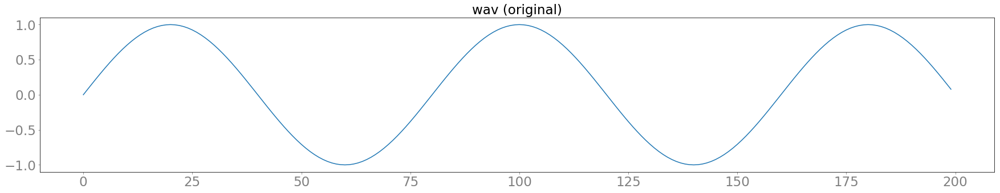

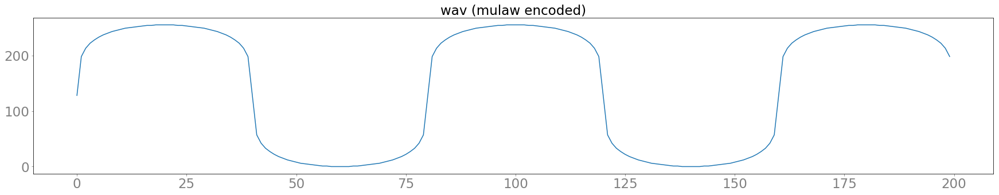

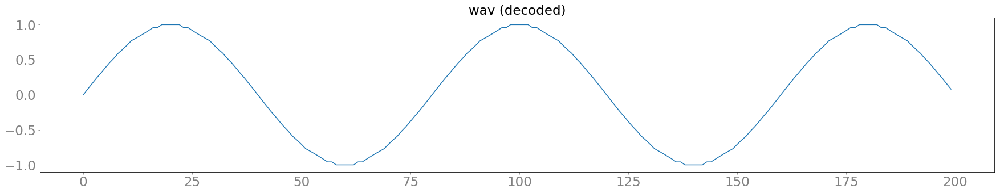

In [4]:
sample_rate = 16000

# encode/decode sine wave
wav = sine_wave(freq=200, length=sample_rate)
wav_encoded = mulaw_encode(wav, qc=256)
wav_decoded = mulaw_decode(wav_encoded)

# plot
plot(wav[:200], 'wav (original)')
plot(wav_encoded[:200], 'wav (mulaw encoded)')
plot(wav_decoded[:200], 'wav (decoded)')

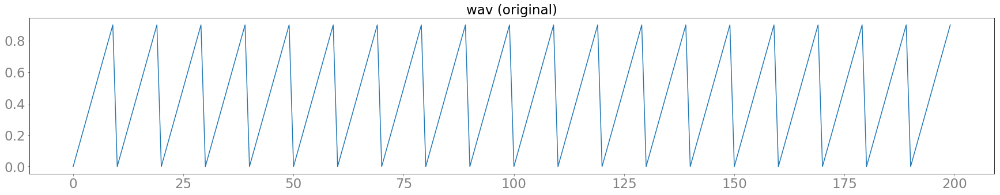

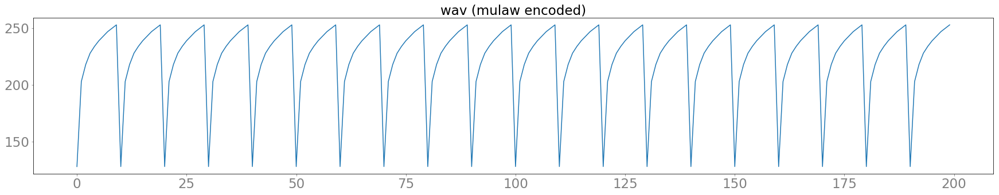

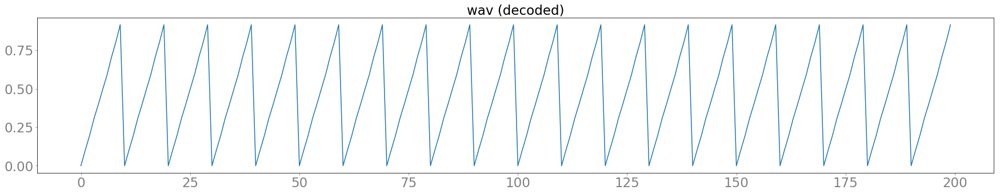

In [5]:
sample_rate = 16000

# encode/decode saw wave
wav = saw_wave(10, 200)#torch.arange(10).repeat(100*30).type(torch.LongTensor).numpy()*(1/10)
wav_encoded = mulaw_encode(wav, qc=256)
wav_decoded = mulaw_decode(wav_encoded)

# plot
plot(wav[:200], 'wav (original)')
plot(wav_encoded[:200], 'wav (mulaw encoded)')
plot(wav_decoded[:200], 'wav (decoded)')

#### test train

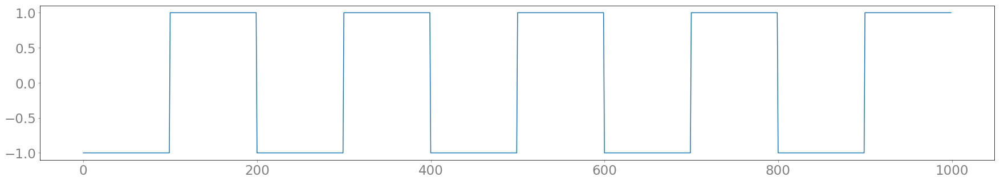

In [6]:
plot(square_wave(200, 1000))

In [217]:
def test_train(model, wave_type: ('sin', 'saw', 'square', 'voice'), wav, optimizer, batch_size, lr, n_epoch, n_steps, seq_len, disable_cuda=False, is_conditioned=True, verbose=False):
    model.train()
    for p in optimizer.param_groups:
        p['lr'] = lr
    criterion = nn.NLLLoss().cuda()
    ema = EMA(0.99)
    start = time.time()
    running_loss = 0
    losses = []
    loss_aves = []
    total_iter = 0
    sample_rate = 16000
    for epoch in range(n_epoch):
        
        # prepare input and target with a frequency
        freq = np.random.randint(100, 300) if is_conditioned else 400
        if wave_type == 'sin':
            wav = sine_wave(freq=freq, length=sample_rate*300)
        elif wave_type == 'saw':
            wav = saw_wave(freq=2, length=sample_rate*300)
        elif wave_type == 'square':
            wav = square_wave(freq=10, length=sample_rate*300)
        elif wave_type == 'voice':
            assert isinstance(wav, np.ndarray), f'wav must be np.array but {type(wav)}'
            wav = wav
        else:
            assert f'unknown wave type {wave_type}'
            
        wav = np.concatenate([wav for _ in range(batch_size)])
        wav = torch.FloatTensor(wav)
        wav = wav[:len(wav)//batch_size*batch_size].view(batch_size, -1)
        target = torch.tensor(mulaw_encode(wav[:, 1:])).long()  # shift 1 index upon right

        #for step in tqdm(range(n_steps)):
        for step in range(n_steps):
            
            optimizer.zero_grad()

            # slice input/target from rand_pos until seq_len
            rand_pos = np.random.randint(0, target.size(-1) - seq_len)
            #print(f'rand pos {rand_pos}')
            x = wav[:, rand_pos:rand_pos+seq_len].unsqueeze(1)
            y = target[:, rand_pos:rand_pos+seq_len]
            if is_conditioned:
                _f0 = f0[:, rand_pos:(rand_pos + seq_len)].unsqueeze(1)
                _phonemes = phonemes[:, rand_pos:(rand_pos + seq_len)].unsqueeze(1)
                
            # print('-'*100)
            # print(f'x {x} {x.shape}')
            # print(f'y {y} {y.shape}')
            # #if is_conditioned:
            # #    print(f'f0 {_f0} {_f0.shape}')
            # print('-'*100)
            
            # sanity check
            assert torch.all(torch.eq(torch.LongTensor(mulaw_encode(x[0][0][1:])), y[0][:-1]))
            assert x.shape[2] == y.shape[1]
            
            if not disable_cuda:
                x = x.cuda()
                y = y.cuda()
                if is_conditioned:
                    _f0 = _f0.cuda()
                
            # forward
            if is_conditioned:
                #out = torch.nn.parallel.data_parallel(model, (x, _f0, None))
                out = model(x, _f0, None, is_padding=False)
            else:
                #out = torch.nn.parallel.data_parallel(model, (x, None, None))
                out = model(x, is_padding=False)
            out = out.transpose(1, 2)
            #print(f'out (B, C, T) {out} {out.shape}')
            
            #print('===== calculate losss ====')
            #print(f'y (B, C, T) {y} {y.shape}')
            # print(f'out[:, :, 1:] {out[:, :, 1:]} {out[:, :, 1:].shape}')
            # print(f'out[:, :, 1:] exp {out[:, :, 1:].exp()} {out[:, :, 1:].shape}')
            
            loss = criterion(out[:, :, 1:], y)  # x[1](=y[1]) should be the same as out[0]
            
            running_loss += loss.item()
            
            loss.backward()
            # MEMO: gradの上限を定めなければそのまま学習する
            #grad_norm, should_skip = check_update(model, grad_clip=10, grad_top=100000)
            #if should_skip:
            #    print("invalid grad. skip this iteration")
            #    optimizer.zero_grad()
            #    continue
            optimizer.step()
            
            # check
            # MEMO: wierd?
            # print(f'distribution {out.exp().transpose(1,2)}')
            dist = torch.distributions.Categorical(out.exp().transpose(1,2))
            #
            #if step % 10 == 0:
            #    # prediction check
            #    print('-'*100)
            #    print(f'y {y} {y.shape}')
            #    print(f'out class sequence {dist.sample()} {dist.sample().shape}')
            #    print('-'*100)
            
            # ema decay
            #for name, param in model.named_parameters():
            #    if name in ema.shadow:
            #        ema.update(name, param.data)
            
            speed = (step + 1) / (time.time() - start)
            t = time_since(start)
            loss_ave = running_loss / (total_iter + 1)
            
            if step % 500 == 0:
                #print('*'*100)
                #print(f'epoch {epoch} -- step: {step}/{n_steps} -- loss: {loss_ave:.4f} -- gradnorm {grad_norm:.4f} -- t: {t} -- speed: {speed:.1f} steps/sec')
                print(f'epoch {epoch} -- step: {step}/{n_steps} -- loss ave: {loss_ave:.4f} -- loss: {running_loss:.4f} -- t: {t} -- speed: {speed:.1f} steps/sec')
                #print('*'*100)
                
            # annealing
            if step != 0 and step % 10000 == 0:
                for p in optimizer.param_groups:
                    p['lr'] = p['lr'] * 0.98
                    print(f'*update lr to {p["lr"]}')
        
            losses += [loss.item()]
            loss_aves += [loss_ave]
            
            total_iter += 1
            
    return losses, loss_aves, dist.sample().cpu().numpy(), model

In [222]:
def test(
        id: int, wave_type: ('sin', 'saw', 'square', 'voice'), wav=None,
        model=None, n_steps=5000, seq_len=5000, n_channels=256,
        batch_size=1, n_epoch=1, lr=1e-4, disable_cuda=False): 
    # init model
    if not model:
        model = FFTNet(n_channels=n_channels, disable_cuda=disable_cuda)
    if not disable_cuda:
        model.cuda()
    dataset = VoiceDataset()
    optimizer = torch.optim.Adam(model.parameters())
    # train
    losses, loss_aves, last_sample, model = test_train(
        model,
        wave_type,
        wav,
        optimizer,
        batch_size=batch_size,
        lr=lr,
        n_epoch=n_epoch,
        n_steps=n_steps,
        seq_len=seq_len,
        disable_cuda=False,
        is_conditioned=False)
    # save
    modeldic = MLModelDic(
        {
            'key_name': f'fftnet_test_{id}',
            #'losses': losses,  # 60_0000 iter induces "bson document too large"
            'loss_averages': loss_aves,
            'iter': len(losses),
            'settings': {
                **{
                    'lr': lr,
                    'epoch': n_epoch,
                    'iter': n_steps*n_epoch,
                    'n_steps': n_steps,
                    'seq_len': seq_len
                },
                **model.settings()
            }
        }).save()
    # update modeldic with save_model_path
    MODEL_DIR = '/diskB/6/out/models/fftnet/'
    modeldic.save_model_path = f'{MODEL_DIR}{model.settings_str()}_lr{lr}_loss{round(np.average(loss_aves), 3)}_index{modeldic.index}'
    print(f'save model {modeldic.key_name} {modeldic._id} as {modeldic.save_model_path}')
    modeldic.update()
    # save model
    model.save_model(modeldic.save_model_path)
    return losses, loss_aves, last_sample, model

##### test 1. square wave

In [128]:
losses, loss_aves, last_sample, test_model_1 = test(1, 'square', n_steps=5000)

Receptive Field: 2048 samples
Trainable Parameters: 2.108 million
epoch 0 -- step: 0/5000 -- loss: 5.5710 -- t: 0m 0s -- speed: 2.7 steps/sec
epoch 0 -- step: 100/5000 -- loss: 1.1359 -- t: 0m 2s -- speed: 36.9 steps/sec
epoch 0 -- step: 200/5000 -- loss: 0.9197 -- t: 0m 5s -- speed: 39.3 steps/sec
epoch 0 -- step: 300/5000 -- loss: 0.8430 -- t: 0m 7s -- speed: 40.3 steps/sec
epoch 0 -- step: 400/5000 -- loss: 0.8339 -- t: 0m 9s -- speed: 40.3 steps/sec
epoch 0 -- step: 500/5000 -- loss: 0.7295 -- t: 0m 12s -- speed: 40.5 steps/sec
epoch 0 -- step: 600/5000 -- loss: 0.6082 -- t: 0m 14s -- speed: 40.6 steps/sec
epoch 0 -- step: 700/5000 -- loss: 0.5215 -- t: 0m 17s -- speed: 40.6 steps/sec
epoch 0 -- step: 800/5000 -- loss: 0.4565 -- t: 0m 19s -- speed: 40.8 steps/sec
epoch 0 -- step: 900/5000 -- loss: 0.4058 -- t: 0m 22s -- speed: 40.7 steps/sec
epoch 0 -- step: 1000/5000 -- loss: 0.3653 -- t: 0m 24s -- speed: 40.7 steps/sec
epoch 0 -- step: 1100/5000 -- loss: 0.3322 -- t: 0m 26s -- sp

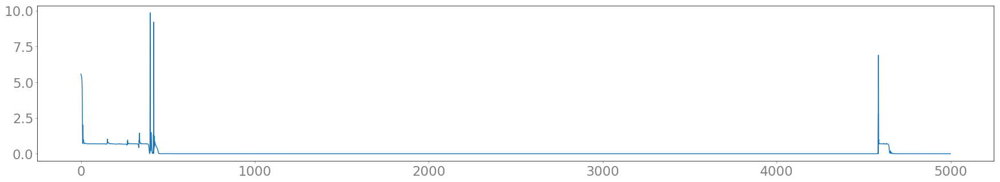

In [129]:
plot(losses)

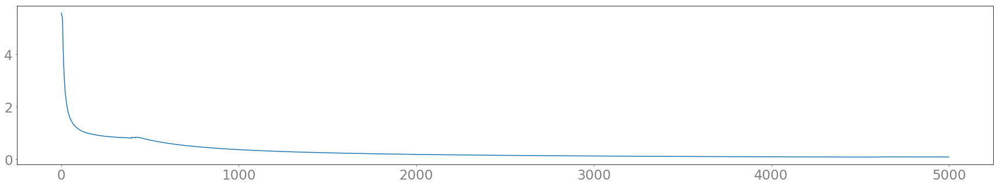

In [130]:
plot(loss_aves)

[[255 255 255 ... 255   0   0]]


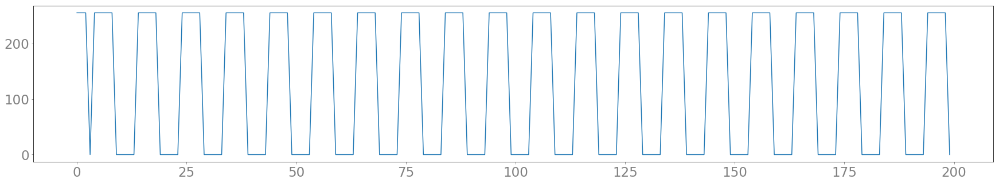

In [131]:
print(last_sample)
# MEMO: この結果がyに近い場合,学習は問題無い.
plot(last_sample[0][:200])

In [132]:
test_model_1.cpu()
test_model_1.eval()
generate_1 = test_model_1.generate(duration_ms=20, phonemes=None, pitches=None, sample_rate=16000)

generate 0:-1.0 1/320, Speed: 207.20 samples/sec
generate 0:-1.0 2/320, Speed: 203.20 samples/sec
generate 255:1.0 3/320, Speed: 174.48 samples/sec
generate 255:1.0 4/320, Speed: 164.32 samples/sec
generate 255:1.0 5/320, Speed: 165.80 samples/sec
generate 255:1.0 6/320, Speed: 166.53 samples/sec
generate 255:1.0 7/320, Speed: 167.08 samples/sec
generate 0:-1.0 8/320, Speed: 169.08 samples/sec
generate 0:-1.0 9/320, Speed: 170.91 samples/sec
generate 0:-1.0 10/320, Speed: 172.90 samples/sec
generate 0:-1.0 11/320, Speed: 173.86 samples/sec
generate 0:-1.0 12/320, Speed: 175.73 samples/sec
generate 255:1.0 13/320, Speed: 177.44 samples/sec
generate 255:1.0 14/320, Speed: 179.30 samples/sec
generate 255:1.0 15/320, Speed: 180.72 samples/sec
generate 255:1.0 16/320, Speed: 182.01 samples/sec
generate 255:1.0 17/320, Speed: 183.12 samples/sec
generate 0:-1.0 18/320, Speed: 184.09 samples/sec
generate 0:-1.0 19/320, Speed: 186.48 samples/sec
generate 0:-1.0 20/320, Speed: 189.49 samples/sec

generate 255:1.0 84/320, Speed: 202.98 samples/sec
generate 255:1.0 85/320, Speed: 202.60 samples/sec
generate 255:1.0 86/320, Speed: 201.97 samples/sec
generate 255:1.0 87/320, Speed: 201.65 samples/sec
generate 0:-1.0 88/320, Speed: 198.57 samples/sec
generate 0:-1.0 89/320, Speed: 198.02 samples/sec
generate 0:-1.0 90/320, Speed: 197.75 samples/sec
generate 0:-1.0 91/320, Speed: 197.53 samples/sec
generate 255:1.0 92/320, Speed: 197.13 samples/sec
generate 255:1.0 93/320, Speed: 196.90 samples/sec
generate 255:1.0 94/320, Speed: 196.70 samples/sec
generate 255:1.0 95/320, Speed: 196.45 samples/sec
generate 255:1.0 96/320, Speed: 196.23 samples/sec
generate 255:1.0 97/320, Speed: 195.92 samples/sec
generate 0:-1.0 98/320, Speed: 195.97 samples/sec
generate 0:-1.0 99/320, Speed: 196.02 samples/sec
generate 0:-1.0 100/320, Speed: 196.07 samples/sec
generate 0:-1.0 101/320, Speed: 196.19 samples/sec
generate 0:-1.0 102/320, Speed: 196.30 samples/sec
generate 255:1.0 103/320, Speed: 196.

generate 0:-1.0 170/320, Speed: 206.72 samples/sec
generate 0:-1.0 171/320, Speed: 206.52 samples/sec
generate 0:-1.0 172/320, Speed: 206.16 samples/sec
generate 255:1.0 173/320, Speed: 205.71 samples/sec
generate 255:1.0 174/320, Speed: 205.45 samples/sec
generate 255:1.0 175/320, Speed: 205.35 samples/sec
generate 255:1.0 176/320, Speed: 205.21 samples/sec
generate 255:1.0 177/320, Speed: 205.27 samples/sec
generate 0:-1.0 178/320, Speed: 205.51 samples/sec
generate 0:-1.0 179/320, Speed: 205.75 samples/sec
generate 0:-1.0 180/320, Speed: 206.00 samples/sec
generate 0:-1.0 181/320, Speed: 206.34 samples/sec
generate 0:-1.0 182/320, Speed: 206.69 samples/sec
generate 255:1.0 183/320, Speed: 206.35 samples/sec
generate 255:1.0 184/320, Speed: 206.21 samples/sec
generate 255:1.0 185/320, Speed: 206.04 samples/sec
generate 255:1.0 186/320, Speed: 205.91 samples/sec
generate 255:1.0 187/320, Speed: 205.59 samples/sec
generate 0:-1.0 188/320, Speed: 205.28 samples/sec
generate 0:-1.0 189/3

generate 0:-1.0 258/320, Speed: 209.77 samples/sec
generate 0:-1.0 259/320, Speed: 209.97 samples/sec
generate 0:-1.0 260/320, Speed: 210.20 samples/sec
generate 0:-1.0 261/320, Speed: 210.43 samples/sec
generate 0:-1.0 262/320, Speed: 210.66 samples/sec
generate 255:1.0 263/320, Speed: 210.71 samples/sec
generate 255:1.0 264/320, Speed: 210.95 samples/sec
generate 255:1.0 265/320, Speed: 211.17 samples/sec
generate 255:1.0 266/320, Speed: 211.37 samples/sec
generate 255:1.0 267/320, Speed: 211.60 samples/sec
generate 0:-1.0 268/320, Speed: 211.73 samples/sec
generate 0:-1.0 269/320, Speed: 211.83 samples/sec
generate 0:-1.0 270/320, Speed: 212.04 samples/sec
generate 0:-1.0 271/320, Speed: 212.25 samples/sec
generate 0:-1.0 272/320, Speed: 212.46 samples/sec
generate 255:1.0 273/320, Speed: 212.69 samples/sec
generate 255:1.0 274/320, Speed: 212.77 samples/sec
generate 255:1.0 275/320, Speed: 212.99 samples/sec
generate 255:1.0 276/320, Speed: 213.20 samples/sec
generate 255:1.0 277/3

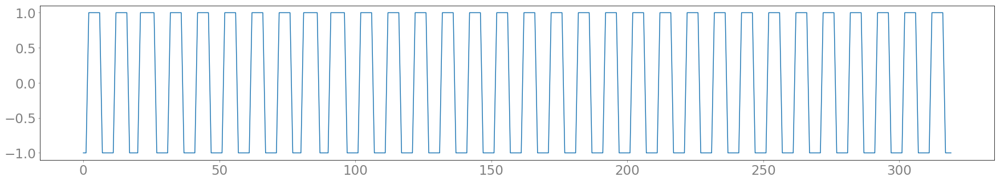

In [133]:
plot(generate_1)

##### test 2. saw wave

In [135]:
losses, loss_aves, last_sample, test_model_2 = test(2, 'saw', n_steps=2000, batch_size=4, lr=1e-4)

Receptive Field: 2048 samples
Trainable Parameters: 2.108 million
epoch 0 -- step: 0/2000 -- loss: 5.5122 -- t: 0m 0s -- speed: 1.2 steps/sec
epoch 0 -- step: 100/2000 -- loss: 2.7863 -- t: 0m 8s -- speed: 12.1 steps/sec
epoch 0 -- step: 200/2000 -- loss: 1.4015 -- t: 0m 16s -- speed: 12.5 steps/sec
epoch 0 -- step: 300/2000 -- loss: 0.9362 -- t: 0m 23s -- speed: 12.6 steps/sec
epoch 0 -- step: 400/2000 -- loss: 0.7028 -- t: 0m 31s -- speed: 12.6 steps/sec
epoch 0 -- step: 500/2000 -- loss: 0.5625 -- t: 0m 39s -- speed: 12.7 steps/sec
epoch 0 -- step: 600/2000 -- loss: 0.4689 -- t: 0m 47s -- speed: 12.7 steps/sec
epoch 0 -- step: 700/2000 -- loss: 0.4020 -- t: 0m 55s -- speed: 12.7 steps/sec
epoch 0 -- step: 800/2000 -- loss: 0.3518 -- t: 1m 2s -- speed: 12.7 steps/sec
epoch 0 -- step: 900/2000 -- loss: 0.3128 -- t: 1m 10s -- speed: 12.7 steps/sec
epoch 0 -- step: 1000/2000 -- loss: 0.2815 -- t: 1m 18s -- speed: 12.7 steps/sec
epoch 0 -- step: 1100/2000 -- loss: 0.2560 -- t: 1m 26s -- 

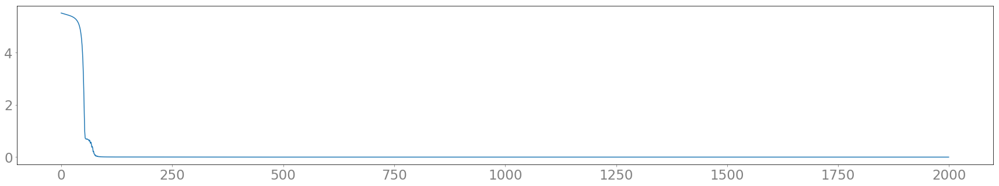

In [136]:
plot(losses)

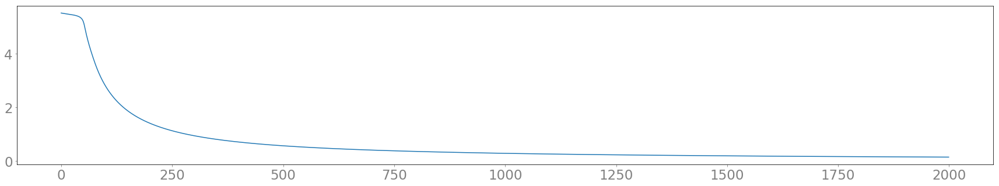

In [137]:
plot(loss_aves)

[[239 239 128 ... 128 239 128]
 [239 239 128 ... 128 239 128]
 [239 239 128 ... 128 239 128]
 [239 239 128 ... 128 239 128]]


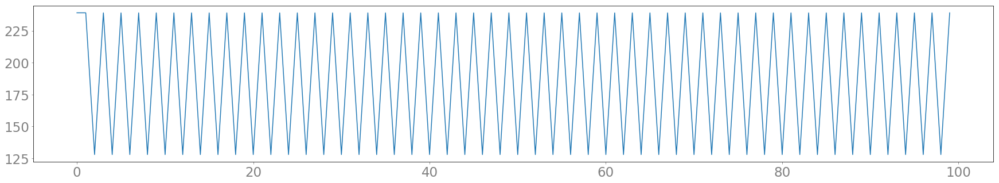

In [138]:
print(last_sample)
plot(last_sample[0][:100])

In [139]:
%%time
test_model_2.cpu()
test_model_2.eval()
generate_2 = test_model_2.generate(duration_ms=100, phonemes=None, pitches=None, sample_rate=16000)

generate 128:8.621159565072034e-05 1/1600, Speed: 235.16 samples/sec
generate 239:0.49667662646658983 2/1600, Speed: 172.75 samples/sec
generate 128:8.621159565072034e-05 3/1600, Speed: 169.11 samples/sec
generate 239:0.49667662646658983 4/1600, Speed: 168.22 samples/sec
generate 128:8.621159565072034e-05 5/1600, Speed: 168.62 samples/sec
generate 239:0.49667662646658983 6/1600, Speed: 172.16 samples/sec
generate 128:8.621159565072034e-05 7/1600, Speed: 175.65 samples/sec
generate 239:0.49667662646658983 8/1600, Speed: 178.32 samples/sec
generate 128:8.621159565072034e-05 9/1600, Speed: 179.77 samples/sec
generate 239:0.49667662646658983 10/1600, Speed: 182.34 samples/sec
generate 128:8.621159565072034e-05 11/1600, Speed: 184.82 samples/sec
generate 239:0.49667662646658983 12/1600, Speed: 187.48 samples/sec
generate 128:8.621159565072034e-05 13/1600, Speed: 189.19 samples/sec
generate 239:0.49667662646658983 14/1600, Speed: 191.18 samples/sec
generate 128:8.621159565072034e-05 15/1600,

generate 239:0.49667662646658983 82/1600, Speed: 198.00 samples/sec
generate 128:8.621159565072034e-05 83/1600, Speed: 197.90 samples/sec
generate 239:0.49667662646658983 84/1600, Speed: 197.85 samples/sec
generate 128:8.621159565072034e-05 85/1600, Speed: 197.59 samples/sec
generate 239:0.49667662646658983 86/1600, Speed: 197.57 samples/sec
generate 128:8.621159565072034e-05 87/1600, Speed: 197.55 samples/sec
generate 239:0.49667662646658983 88/1600, Speed: 197.58 samples/sec
generate 128:8.621159565072034e-05 89/1600, Speed: 197.47 samples/sec
generate 239:0.49667662646658983 90/1600, Speed: 197.44 samples/sec
generate 128:8.621159565072034e-05 91/1600, Speed: 197.36 samples/sec
generate 239:0.49667662646658983 92/1600, Speed: 197.30 samples/sec
generate 128:8.621159565072034e-05 93/1600, Speed: 197.23 samples/sec
generate 239:0.49667662646658983 94/1600, Speed: 197.25 samples/sec
generate 128:8.621159565072034e-05 95/1600, Speed: 197.24 samples/sec
generate 239:0.49667662646658983 9

generate 128:8.621159565072034e-05 161/1600, Speed: 196.18 samples/sec
generate 239:0.49667662646658983 162/1600, Speed: 196.01 samples/sec
generate 128:8.621159565072034e-05 163/1600, Speed: 196.05 samples/sec
generate 239:0.49667662646658983 164/1600, Speed: 195.93 samples/sec
generate 128:8.621159565072034e-05 165/1600, Speed: 196.01 samples/sec
generate 239:0.49667662646658983 166/1600, Speed: 196.08 samples/sec
generate 128:8.621159565072034e-05 167/1600, Speed: 195.98 samples/sec
generate 239:0.49667662646658983 168/1600, Speed: 195.25 samples/sec
generate 128:8.621159565072034e-05 169/1600, Speed: 195.26 samples/sec
generate 239:0.49667662646658983 170/1600, Speed: 195.28 samples/sec
generate 128:8.621159565072034e-05 171/1600, Speed: 195.33 samples/sec
generate 239:0.49667662646658983 172/1600, Speed: 195.38 samples/sec
generate 128:8.621159565072034e-05 173/1600, Speed: 195.47 samples/sec
generate 239:0.49667662646658983 174/1600, Speed: 195.56 samples/sec
generate 128:8.62115

generate 239:0.49667662646658983 258/1600, Speed: 209.64 samples/sec
generate 128:8.621159565072034e-05 259/1600, Speed: 209.82 samples/sec
generate 239:0.49667662646658983 260/1600, Speed: 210.02 samples/sec
generate 128:8.621159565072034e-05 261/1600, Speed: 210.23 samples/sec
generate 239:0.49667662646658983 262/1600, Speed: 210.39 samples/sec
generate 128:8.621159565072034e-05 263/1600, Speed: 210.57 samples/sec
generate 239:0.49667662646658983 264/1600, Speed: 210.76 samples/sec
generate 128:8.621159565072034e-05 265/1600, Speed: 210.96 samples/sec
generate 239:0.49667662646658983 266/1600, Speed: 211.14 samples/sec
generate 128:8.621159565072034e-05 267/1600, Speed: 211.33 samples/sec
generate 239:0.49667662646658983 268/1600, Speed: 211.53 samples/sec
generate 128:8.621159565072034e-05 269/1600, Speed: 211.67 samples/sec
generate 239:0.49667662646658983 270/1600, Speed: 211.84 samples/sec
generate 128:8.621159565072034e-05 271/1600, Speed: 212.02 samples/sec
generate 239:0.49667

generate 239:0.49667662646658983 346/1600, Speed: 211.51 samples/sec
generate 128:8.621159565072034e-05 347/1600, Speed: 211.64 samples/sec
generate 239:0.49667662646658983 348/1600, Speed: 211.80 samples/sec
generate 128:8.621159565072034e-05 349/1600, Speed: 211.95 samples/sec
generate 239:0.49667662646658983 350/1600, Speed: 212.05 samples/sec
generate 128:8.621159565072034e-05 351/1600, Speed: 212.10 samples/sec
generate 239:0.49667662646658983 352/1600, Speed: 212.22 samples/sec
generate 128:8.621159565072034e-05 353/1600, Speed: 212.35 samples/sec
generate 239:0.49667662646658983 354/1600, Speed: 212.46 samples/sec
generate 128:8.621159565072034e-05 355/1600, Speed: 212.60 samples/sec
generate 239:0.49667662646658983 356/1600, Speed: 212.70 samples/sec
generate 128:8.621159565072034e-05 357/1600, Speed: 212.81 samples/sec
generate 239:0.49667662646658983 358/1600, Speed: 212.94 samples/sec
generate 128:8.621159565072034e-05 359/1600, Speed: 213.06 samples/sec
generate 239:0.49667

generate 128:8.621159565072034e-05 439/1600, Speed: 214.60 samples/sec
generate 239:0.49667662646658983 440/1600, Speed: 214.70 samples/sec
generate 128:8.621159565072034e-05 441/1600, Speed: 214.81 samples/sec
generate 239:0.49667662646658983 442/1600, Speed: 214.93 samples/sec
generate 128:8.621159565072034e-05 443/1600, Speed: 215.04 samples/sec
generate 239:0.49667662646658983 444/1600, Speed: 215.15 samples/sec
generate 128:8.621159565072034e-05 445/1600, Speed: 215.27 samples/sec
generate 239:0.49667662646658983 446/1600, Speed: 215.38 samples/sec
generate 128:8.621159565072034e-05 447/1600, Speed: 215.45 samples/sec
generate 239:0.49667662646658983 448/1600, Speed: 215.57 samples/sec
generate 128:8.621159565072034e-05 449/1600, Speed: 215.68 samples/sec
generate 239:0.49667662646658983 450/1600, Speed: 215.79 samples/sec
generate 128:8.621159565072034e-05 451/1600, Speed: 215.90 samples/sec
generate 239:0.49667662646658983 452/1600, Speed: 216.02 samples/sec
generate 128:8.62115

generate 128:8.621159565072034e-05 493/1600, Speed: 219.38 samples/sec
generate 239:0.49667662646658983 494/1600, Speed: 219.46 samples/sec
generate 128:8.621159565072034e-05 495/1600, Speed: 219.49 samples/sec
generate 239:0.49667662646658983 496/1600, Speed: 219.59 samples/sec
generate 128:8.621159565072034e-05 497/1600, Speed: 219.70 samples/sec
generate 239:0.49667662646658983 498/1600, Speed: 219.80 samples/sec
generate 128:8.621159565072034e-05 499/1600, Speed: 219.90 samples/sec
generate 239:0.49667662646658983 500/1600, Speed: 220.00 samples/sec
generate 128:8.621159565072034e-05 501/1600, Speed: 220.04 samples/sec
generate 239:0.49667662646658983 502/1600, Speed: 220.14 samples/sec
generate 128:8.621159565072034e-05 503/1600, Speed: 220.23 samples/sec
generate 239:0.49667662646658983 504/1600, Speed: 220.33 samples/sec
generate 128:8.621159565072034e-05 505/1600, Speed: 220.40 samples/sec
generate 239:0.49667662646658983 506/1600, Speed: 220.38 samples/sec
generate 128:8.62115

generate 239:0.49667662646658983 546/1600, Speed: 222.58 samples/sec
generate 128:8.621159565072034e-05 547/1600, Speed: 222.41 samples/sec
generate 239:0.49667662646658983 548/1600, Speed: 222.27 samples/sec
generate 128:8.621159565072034e-05 549/1600, Speed: 222.25 samples/sec
generate 239:0.49667662646658983 550/1600, Speed: 222.34 samples/sec
generate 128:8.621159565072034e-05 551/1600, Speed: 222.34 samples/sec
generate 239:0.49667662646658983 552/1600, Speed: 222.33 samples/sec
generate 128:8.621159565072034e-05 553/1600, Speed: 222.41 samples/sec
generate 239:0.49667662646658983 554/1600, Speed: 222.50 samples/sec
generate 128:8.621159565072034e-05 555/1600, Speed: 222.58 samples/sec
generate 239:0.49667662646658983 556/1600, Speed: 222.60 samples/sec
generate 128:8.621159565072034e-05 557/1600, Speed: 222.69 samples/sec
generate 239:0.49667662646658983 558/1600, Speed: 222.72 samples/sec
generate 128:8.621159565072034e-05 559/1600, Speed: 222.81 samples/sec
generate 239:0.49667

generate 128:8.621159565072034e-05 627/1600, Speed: 219.00 samples/sec
generate 239:0.49667662646658983 628/1600, Speed: 218.91 samples/sec
generate 128:8.621159565072034e-05 629/1600, Speed: 218.82 samples/sec
generate 239:0.49667662646658983 630/1600, Speed: 218.69 samples/sec
generate 128:8.621159565072034e-05 631/1600, Speed: 218.60 samples/sec
generate 239:0.49667662646658983 632/1600, Speed: 218.52 samples/sec
generate 128:8.621159565072034e-05 633/1600, Speed: 218.40 samples/sec
generate 239:0.49667662646658983 634/1600, Speed: 218.31 samples/sec
generate 128:8.621159565072034e-05 635/1600, Speed: 218.21 samples/sec
generate 239:0.49667662646658983 636/1600, Speed: 218.08 samples/sec
generate 128:8.621159565072034e-05 637/1600, Speed: 217.97 samples/sec
generate 239:0.49667662646658983 638/1600, Speed: 217.88 samples/sec
generate 128:8.621159565072034e-05 639/1600, Speed: 217.79 samples/sec
generate 239:0.49667662646658983 640/1600, Speed: 217.65 samples/sec
generate 128:8.62115

generate 128:8.621159565072034e-05 711/1600, Speed: 217.19 samples/sec
generate 239:0.49667662646658983 712/1600, Speed: 217.12 samples/sec
generate 128:8.621159565072034e-05 713/1600, Speed: 217.05 samples/sec
generate 239:0.49667662646658983 714/1600, Speed: 217.03 samples/sec
generate 128:8.621159565072034e-05 715/1600, Speed: 217.01 samples/sec
generate 239:0.49667662646658983 716/1600, Speed: 216.97 samples/sec
generate 128:8.621159565072034e-05 717/1600, Speed: 216.92 samples/sec
generate 239:0.49667662646658983 718/1600, Speed: 216.89 samples/sec
generate 128:8.621159565072034e-05 719/1600, Speed: 216.87 samples/sec
generate 239:0.49667662646658983 720/1600, Speed: 216.83 samples/sec
generate 128:8.621159565072034e-05 721/1600, Speed: 216.81 samples/sec
generate 239:0.49667662646658983 722/1600, Speed: 216.77 samples/sec
generate 128:8.621159565072034e-05 723/1600, Speed: 216.75 samples/sec
generate 239:0.49667662646658983 724/1600, Speed: 216.73 samples/sec
generate 128:8.62115

generate 128:8.621159565072034e-05 791/1600, Speed: 214.72 samples/sec
generate 239:0.49667662646658983 792/1600, Speed: 214.68 samples/sec
generate 128:8.621159565072034e-05 793/1600, Speed: 214.67 samples/sec
generate 239:0.49667662646658983 794/1600, Speed: 214.64 samples/sec
generate 128:8.621159565072034e-05 795/1600, Speed: 214.48 samples/sec
generate 239:0.49667662646658983 796/1600, Speed: 214.43 samples/sec
generate 128:8.621159565072034e-05 797/1600, Speed: 214.33 samples/sec
generate 239:0.49667662646658983 798/1600, Speed: 214.19 samples/sec
generate 128:8.621159565072034e-05 799/1600, Speed: 214.12 samples/sec
generate 239:0.49667662646658983 800/1600, Speed: 214.06 samples/sec
generate 128:8.621159565072034e-05 801/1600, Speed: 213.98 samples/sec
generate 239:0.49667662646658983 802/1600, Speed: 213.92 samples/sec
generate 128:8.621159565072034e-05 803/1600, Speed: 213.84 samples/sec
generate 239:0.49667662646658983 804/1600, Speed: 213.63 samples/sec
generate 128:8.62115

generate 128:8.621159565072034e-05 883/1600, Speed: 215.88 samples/sec
generate 239:0.49667662646658983 884/1600, Speed: 215.93 samples/sec
generate 128:8.621159565072034e-05 885/1600, Speed: 215.98 samples/sec
generate 239:0.49667662646658983 886/1600, Speed: 216.01 samples/sec
generate 128:8.621159565072034e-05 887/1600, Speed: 216.07 samples/sec
generate 239:0.49667662646658983 888/1600, Speed: 216.12 samples/sec
generate 128:8.621159565072034e-05 889/1600, Speed: 216.18 samples/sec
generate 239:0.49667662646658983 890/1600, Speed: 216.23 samples/sec
generate 128:8.621159565072034e-05 891/1600, Speed: 216.29 samples/sec
generate 239:0.49667662646658983 892/1600, Speed: 216.31 samples/sec
generate 128:8.621159565072034e-05 893/1600, Speed: 216.37 samples/sec
generate 239:0.49667662646658983 894/1600, Speed: 216.42 samples/sec
generate 128:8.621159565072034e-05 895/1600, Speed: 216.48 samples/sec
generate 239:0.49667662646658983 896/1600, Speed: 216.53 samples/sec
generate 128:8.62115

generate 239:0.49667662646658983 934/1600, Speed: 217.50 samples/sec
generate 128:8.621159565072034e-05 935/1600, Speed: 217.52 samples/sec
generate 239:0.49667662646658983 936/1600, Speed: 217.56 samples/sec
generate 128:8.621159565072034e-05 937/1600, Speed: 217.60 samples/sec
generate 239:0.49667662646658983 938/1600, Speed: 217.64 samples/sec
generate 128:8.621159565072034e-05 939/1600, Speed: 217.68 samples/sec
generate 239:0.49667662646658983 940/1600, Speed: 217.73 samples/sec
generate 128:8.621159565072034e-05 941/1600, Speed: 217.77 samples/sec
generate 239:0.49667662646658983 942/1600, Speed: 217.81 samples/sec
generate 128:8.621159565072034e-05 943/1600, Speed: 217.85 samples/sec
generate 239:0.49667662646658983 944/1600, Speed: 217.72 samples/sec
generate 128:8.621159565072034e-05 945/1600, Speed: 217.76 samples/sec
generate 239:0.49667662646658983 946/1600, Speed: 217.80 samples/sec
generate 128:8.621159565072034e-05 947/1600, Speed: 217.84 samples/sec
generate 239:0.49667

generate 239:0.49667662646658983 984/1600, Speed: 218.72 samples/sec
generate 128:8.621159565072034e-05 985/1600, Speed: 218.67 samples/sec
generate 239:0.49667662646658983 986/1600, Speed: 218.64 samples/sec
generate 128:8.621159565072034e-05 987/1600, Speed: 217.99 samples/sec
generate 239:0.49667662646658983 988/1600, Speed: 217.85 samples/sec
generate 128:8.621159565072034e-05 989/1600, Speed: 217.83 samples/sec
generate 239:0.49667662646658983 990/1600, Speed: 217.81 samples/sec
generate 128:8.621159565072034e-05 991/1600, Speed: 217.80 samples/sec
generate 239:0.49667662646658983 992/1600, Speed: 217.78 samples/sec
generate 128:8.621159565072034e-05 993/1600, Speed: 217.79 samples/sec
generate 239:0.49667662646658983 994/1600, Speed: 217.82 samples/sec
generate 128:8.621159565072034e-05 995/1600, Speed: 217.80 samples/sec
generate 239:0.49667662646658983 996/1600, Speed: 217.79 samples/sec
generate 128:8.621159565072034e-05 997/1600, Speed: 217.77 samples/sec
generate 239:0.49667

generate 128:8.621159565072034e-05 1063/1600, Speed: 216.60 samples/sec
generate 239:0.49667662646658983 1064/1600, Speed: 216.58 samples/sec
generate 128:8.621159565072034e-05 1065/1600, Speed: 216.57 samples/sec
generate 239:0.49667662646658983 1066/1600, Speed: 216.42 samples/sec
generate 128:8.621159565072034e-05 1067/1600, Speed: 216.39 samples/sec
generate 239:0.49667662646658983 1068/1600, Speed: 216.37 samples/sec
generate 128:8.621159565072034e-05 1069/1600, Speed: 216.36 samples/sec
generate 239:0.49667662646658983 1070/1600, Speed: 216.34 samples/sec
generate 128:8.621159565072034e-05 1071/1600, Speed: 216.33 samples/sec
generate 239:0.49667662646658983 1072/1600, Speed: 216.32 samples/sec
generate 128:8.621159565072034e-05 1073/1600, Speed: 216.30 samples/sec
generate 239:0.49667662646658983 1074/1600, Speed: 216.27 samples/sec
generate 128:8.621159565072034e-05 1075/1600, Speed: 216.22 samples/sec
generate 239:0.49667662646658983 1076/1600, Speed: 216.21 samples/sec
genera

generate 239:0.49667662646658983 1150/1600, Speed: 216.44 samples/sec
generate 128:8.621159565072034e-05 1151/1600, Speed: 216.42 samples/sec
generate 239:0.49667662646658983 1152/1600, Speed: 216.41 samples/sec
generate 128:8.621159565072034e-05 1153/1600, Speed: 216.39 samples/sec
generate 239:0.49667662646658983 1154/1600, Speed: 216.30 samples/sec
generate 128:8.621159565072034e-05 1155/1600, Speed: 216.31 samples/sec
generate 239:0.49667662646658983 1156/1600, Speed: 216.33 samples/sec
generate 128:8.621159565072034e-05 1157/1600, Speed: 216.35 samples/sec
generate 239:0.49667662646658983 1158/1600, Speed: 216.30 samples/sec
generate 128:8.621159565072034e-05 1159/1600, Speed: 216.26 samples/sec
generate 239:0.49667662646658983 1160/1600, Speed: 216.19 samples/sec
generate 128:8.621159565072034e-05 1161/1600, Speed: 216.13 samples/sec
generate 239:0.49667662646658983 1162/1600, Speed: 216.09 samples/sec
generate 128:8.621159565072034e-05 1163/1600, Speed: 216.05 samples/sec
genera

generate 128:8.621159565072034e-05 1239/1600, Speed: 216.64 samples/sec
generate 239:0.49667662646658983 1240/1600, Speed: 216.65 samples/sec
generate 128:8.621159565072034e-05 1241/1600, Speed: 216.69 samples/sec
generate 239:0.49667662646658983 1242/1600, Speed: 216.67 samples/sec
generate 128:8.621159565072034e-05 1243/1600, Speed: 216.71 samples/sec
generate 239:0.49667662646658983 1244/1600, Speed: 216.75 samples/sec
generate 128:8.621159565072034e-05 1245/1600, Speed: 216.79 samples/sec
generate 239:0.49667662646658983 1246/1600, Speed: 216.81 samples/sec
generate 128:8.621159565072034e-05 1247/1600, Speed: 216.84 samples/sec
generate 239:0.49667662646658983 1248/1600, Speed: 216.88 samples/sec
generate 128:8.621159565072034e-05 1249/1600, Speed: 216.92 samples/sec
generate 239:0.49667662646658983 1250/1600, Speed: 216.96 samples/sec
generate 128:8.621159565072034e-05 1251/1600, Speed: 217.00 samples/sec
generate 239:0.49667662646658983 1252/1600, Speed: 217.03 samples/sec
genera

generate 128:8.621159565072034e-05 1287/1600, Speed: 217.23 samples/sec
generate 239:0.49667662646658983 1288/1600, Speed: 217.16 samples/sec
generate 128:8.621159565072034e-05 1289/1600, Speed: 217.11 samples/sec
generate 239:0.49667662646658983 1290/1600, Speed: 217.04 samples/sec
generate 128:8.621159565072034e-05 1291/1600, Speed: 217.00 samples/sec
generate 239:0.49667662646658983 1292/1600, Speed: 216.95 samples/sec
generate 128:8.621159565072034e-05 1293/1600, Speed: 216.91 samples/sec
generate 239:0.49667662646658983 1294/1600, Speed: 216.88 samples/sec
generate 128:8.621159565072034e-05 1295/1600, Speed: 216.87 samples/sec
generate 239:0.49667662646658983 1296/1600, Speed: 216.84 samples/sec
generate 128:8.621159565072034e-05 1297/1600, Speed: 216.80 samples/sec
generate 239:0.49667662646658983 1298/1600, Speed: 216.61 samples/sec
generate 128:8.621159565072034e-05 1299/1600, Speed: 216.21 samples/sec
generate 239:0.49667662646658983 1300/1600, Speed: 216.16 samples/sec
genera

generate 128:8.621159565072034e-05 1345/1600, Speed: 212.29 samples/sec
generate 239:0.49667662646658983 1346/1600, Speed: 212.27 samples/sec
generate 128:8.621159565072034e-05 1347/1600, Speed: 212.26 samples/sec
generate 239:0.49667662646658983 1348/1600, Speed: 212.23 samples/sec
generate 128:8.621159565072034e-05 1349/1600, Speed: 212.23 samples/sec
generate 239:0.49667662646658983 1350/1600, Speed: 212.22 samples/sec
generate 128:8.621159565072034e-05 1351/1600, Speed: 212.22 samples/sec
generate 239:0.49667662646658983 1352/1600, Speed: 212.19 samples/sec
generate 128:8.621159565072034e-05 1353/1600, Speed: 212.18 samples/sec
generate 239:0.49667662646658983 1354/1600, Speed: 212.18 samples/sec
generate 128:8.621159565072034e-05 1355/1600, Speed: 212.17 samples/sec
generate 239:0.49667662646658983 1356/1600, Speed: 212.14 samples/sec
generate 128:8.621159565072034e-05 1357/1600, Speed: 212.14 samples/sec
generate 239:0.49667662646658983 1358/1600, Speed: 212.13 samples/sec
genera

generate 239:0.49667662646658983 1422/1600, Speed: 210.87 samples/sec
generate 128:8.621159565072034e-05 1423/1600, Speed: 210.84 samples/sec
generate 239:0.49667662646658983 1424/1600, Speed: 210.83 samples/sec
generate 128:8.621159565072034e-05 1425/1600, Speed: 210.82 samples/sec
generate 239:0.49667662646658983 1426/1600, Speed: 210.80 samples/sec
generate 128:8.621159565072034e-05 1427/1600, Speed: 210.78 samples/sec
generate 239:0.49667662646658983 1428/1600, Speed: 210.77 samples/sec
generate 128:8.621159565072034e-05 1429/1600, Speed: 210.77 samples/sec
generate 239:0.49667662646658983 1430/1600, Speed: 210.77 samples/sec
generate 128:8.621159565072034e-05 1431/1600, Speed: 210.75 samples/sec
generate 239:0.49667662646658983 1432/1600, Speed: 210.75 samples/sec
generate 128:8.621159565072034e-05 1433/1600, Speed: 210.74 samples/sec
generate 239:0.49667662646658983 1434/1600, Speed: 210.74 samples/sec
generate 128:8.621159565072034e-05 1435/1600, Speed: 210.73 samples/sec
genera

generate 128:8.621159565072034e-05 1501/1600, Speed: 209.62 samples/sec
generate 239:0.49667662646658983 1502/1600, Speed: 209.61 samples/sec
generate 128:8.621159565072034e-05 1503/1600, Speed: 209.57 samples/sec
generate 239:0.49667662646658983 1504/1600, Speed: 209.53 samples/sec
generate 128:8.621159565072034e-05 1505/1600, Speed: 209.54 samples/sec
generate 239:0.49667662646658983 1506/1600, Speed: 209.55 samples/sec
generate 128:8.621159565072034e-05 1507/1600, Speed: 209.57 samples/sec
generate 239:0.49667662646658983 1508/1600, Speed: 209.60 samples/sec
generate 128:8.621159565072034e-05 1509/1600, Speed: 209.64 samples/sec
generate 239:0.49667662646658983 1510/1600, Speed: 209.67 samples/sec
generate 128:8.621159565072034e-05 1511/1600, Speed: 209.70 samples/sec
generate 239:0.49667662646658983 1512/1600, Speed: 209.71 samples/sec
generate 128:8.621159565072034e-05 1513/1600, Speed: 209.70 samples/sec
generate 239:0.49667662646658983 1514/1600, Speed: 209.72 samples/sec
genera

generate 128:8.621159565072034e-05 1551/1600, Speed: 210.62 samples/sec
generate 239:0.49667662646658983 1552/1600, Speed: 210.65 samples/sec
generate 128:8.621159565072034e-05 1553/1600, Speed: 210.69 samples/sec
generate 239:0.49667662646658983 1554/1600, Speed: 210.72 samples/sec
generate 128:8.621159565072034e-05 1555/1600, Speed: 210.75 samples/sec
generate 239:0.49667662646658983 1556/1600, Speed: 210.79 samples/sec
generate 128:8.621159565072034e-05 1557/1600, Speed: 210.82 samples/sec
generate 239:0.49667662646658983 1558/1600, Speed: 210.86 samples/sec
generate 128:8.621159565072034e-05 1559/1600, Speed: 210.89 samples/sec
generate 239:0.49667662646658983 1560/1600, Speed: 210.91 samples/sec
generate 128:8.621159565072034e-05 1561/1600, Speed: 210.94 samples/sec
generate 239:0.49667662646658983 1562/1600, Speed: 210.90 samples/sec
generate 128:8.621159565072034e-05 1563/1600, Speed: 210.87 samples/sec
generate 239:0.49667662646658983 1564/1600, Speed: 210.83 samples/sec
genera

generate 128:8.621159565072034e-05 1599/1600, Speed: 211.31 samples/sec
generate 239:0.49667662646658983 1600/1600, Speed: 211.25 samples/sec
CPU times: user 2min 24s, sys: 7.42 s, total: 2min 31s
Wall time: 7.61 s


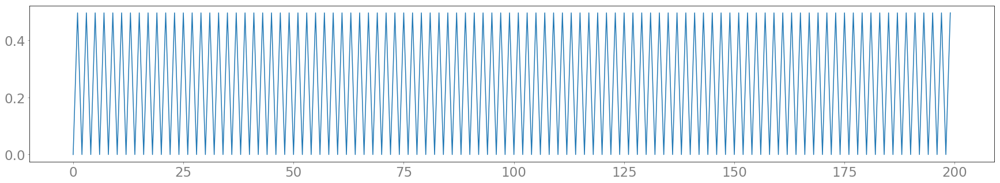

In [141]:
plot(generate_2[:200])

##### test 3. single frequency sin wave

In [142]:
losses, loss_aves, last_sample, test_model_3 = test(3, 'sin', n_steps=2000, batch_size=6, lr=1e-4)

Receptive Field: 2048 samples
Trainable Parameters: 2.108 million
epoch 0 -- step: 0/2000 -- loss: 5.5444 -- t: 0m 0s -- speed: 1.0 steps/sec
epoch 0 -- step: 100/2000 -- loss: 4.2467 -- t: 0m 11s -- speed: 8.5 steps/sec
epoch 0 -- step: 200/2000 -- loss: 3.5944 -- t: 0m 23s -- speed: 8.7 steps/sec
epoch 0 -- step: 300/2000 -- loss: 3.3753 -- t: 0m 34s -- speed: 8.6 steps/sec
epoch 0 -- step: 400/2000 -- loss: 3.2650 -- t: 0m 46s -- speed: 8.6 steps/sec
epoch 0 -- step: 500/2000 -- loss: 3.1187 -- t: 0m 58s -- speed: 8.6 steps/sec
epoch 0 -- step: 600/2000 -- loss: 2.7964 -- t: 1m 9s -- speed: 8.6 steps/sec
epoch 0 -- step: 700/2000 -- loss: 2.4788 -- t: 1m 21s -- speed: 8.6 steps/sec
epoch 0 -- step: 800/2000 -- loss: 2.1787 -- t: 1m 33s -- speed: 8.6 steps/sec
epoch 0 -- step: 900/2000 -- loss: 1.9422 -- t: 1m 44s -- speed: 8.6 steps/sec
epoch 0 -- step: 1000/2000 -- loss: 1.7517 -- t: 1m 56s -- speed: 8.6 steps/sec
epoch 0 -- step: 1100/2000 -- loss: 1.5944 -- t: 2m 7s -- speed: 8.6

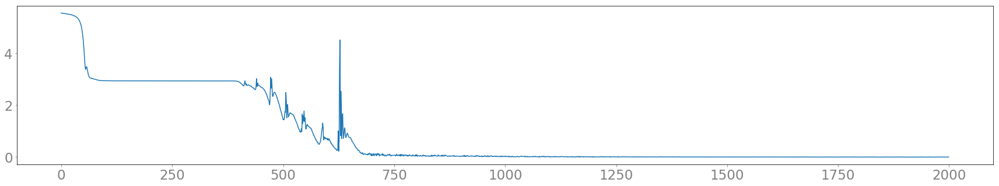

In [143]:
plot(losses)

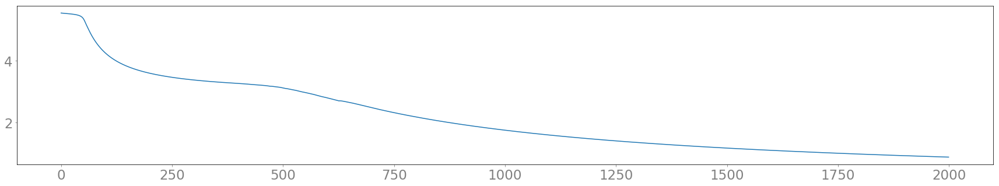

In [144]:
plot(loss_aves)

[[ 18   1   5 ...   1   3   5]
 [213   5  18 ...   1   3   5]
 [228   5   8 ...   1   3   5]
 [ 42   3   8 ...   1   3   5]
 [ 42   1   3 ...   1   3   5]
 [ 42   1   3 ...   1   3   5]]


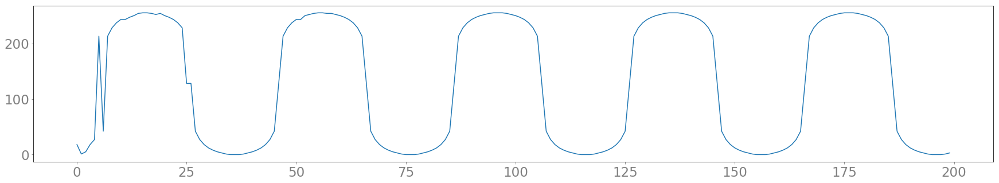

In [145]:
print(last_sample)
plot(last_sample[0][:200])

In [146]:
%%time
test_model_3.cpu()
test_model_3.eval()
generate_3 = test_model_3.generate(duration_ms=20, phonemes=None, pitches=None, sample_rate=16000)

generate 213:0.1576620046985716 1/320, Speed: 232.98 samples/sec
generate 128:8.621159565072034e-05 2/320, Speed: 225.86 samples/sec
generate 42:-0.1576620046985716 3/320, Speed: 232.20 samples/sec
generate 12:-0.5917980540957639 4/320, Speed: 237.36 samples/sec
generate 8:-0.7049940295017482 5/320, Speed: 193.39 samples/sec
generate 1:-0.9572737086635957 6/320, Speed: 173.89 samples/sec
generate 1:-0.9572737086635957 7/320, Speed: 164.04 samples/sec
generate 0:-1.0 8/320, Speed: 158.04 samples/sec
generate 0:-1.0 9/320, Speed: 153.84 samples/sec
generate 0:-1.0 10/320, Speed: 150.91 samples/sec
generate 1:-0.9572737086635957 11/320, Speed: 152.56 samples/sec
generate 3:-0.8771989506956512 12/320, Speed: 155.31 samples/sec
generate 5:-0.8037950191613283 13/320, Speed: 153.48 samples/sec
generate 8:-0.7049940295017482 14/320, Speed: 152.75 samples/sec
generate 12:-0.5917980540957639 15/320, Speed: 152.37 samples/sec
generate 18:-0.4549730514923994 16/320, Speed: 151.98 samples/sec
gener

generate 252:0.8771989506956518 73/320, Speed: 176.02 samples/sec
generate 250:0.8037950191613278 74/320, Speed: 176.42 samples/sec
generate 247:0.7049940295017482 75/320, Speed: 176.45 samples/sec
generate 243:0.5917980540957635 76/320, Speed: 176.50 samples/sec
generate 237:0.4549730514923994 77/320, Speed: 177.07 samples/sec
generate 228:0.3063339798161621 78/320, Speed: 177.14 samples/sec
generate 213:0.1576620046985716 79/320, Speed: 177.05 samples/sec
generate 128:8.621159565072034e-05 80/320, Speed: 177.09 samples/sec
generate 42:-0.1576620046985716 81/320, Speed: 176.89 samples/sec
generate 27:-0.30633397981616195 82/320, Speed: 176.91 samples/sec
generate 18:-0.4549730514923994 83/320, Speed: 177.00 samples/sec
generate 12:-0.5917980540957639 84/320, Speed: 177.34 samples/sec
generate 8:-0.7049940295017482 85/320, Speed: 178.05 samples/sec
generate 5:-0.8037950191613283 86/320, Speed: 178.52 samples/sec
generate 3:-0.8771989506956512 87/320, Speed: 178.65 samples/sec
generate 

generate 255:1.0 151/320, Speed: 184.23 samples/sec
generate 255:1.0 152/320, Speed: 184.37 samples/sec
generate 254:0.9572737086635957 153/320, Speed: 184.37 samples/sec
generate 250:0.8037950191613278 154/320, Speed: 184.55 samples/sec
generate 247:0.7049940295017482 155/320, Speed: 184.72 samples/sec
generate 247:0.7049940295017482 156/320, Speed: 184.91 samples/sec
generate 237:0.4549730514923994 157/320, Speed: 184.93 samples/sec
generate 228:0.3063339798161621 158/320, Speed: 185.10 samples/sec
generate 213:0.1576620046985716 159/320, Speed: 185.28 samples/sec
generate 213:0.1576620046985716 160/320, Speed: 185.46 samples/sec
generate 42:-0.1576620046985716 161/320, Speed: 185.61 samples/sec
generate 27:-0.30633397981616195 162/320, Speed: 185.63 samples/sec
generate 18:-0.4549730514923994 163/320, Speed: 185.79 samples/sec
generate 12:-0.5917980540957639 164/320, Speed: 185.93 samples/sec
generate 8:-0.7049940295017482 165/320, Speed: 186.06 samples/sec
generate 5:-0.80379501916

generate 254:0.9572737086635957 233/320, Speed: 190.74 samples/sec
generate 252:0.8771989506956518 234/320, Speed: 190.60 samples/sec
generate 250:0.8037950191613278 235/320, Speed: 190.68 samples/sec
generate 247:0.7049940295017482 236/320, Speed: 190.12 samples/sec
generate 243:0.5917980540957635 237/320, Speed: 189.72 samples/sec
generate 237:0.4549730514923994 238/320, Speed: 189.81 samples/sec
generate 228:0.3063339798161621 239/320, Speed: 189.91 samples/sec
generate 213:0.1576620046985716 240/320, Speed: 190.00 samples/sec
generate 128:8.621159565072034e-05 241/320, Speed: 190.11 samples/sec
generate 42:-0.1576620046985716 242/320, Speed: 190.20 samples/sec
generate 27:-0.30633397981616195 243/320, Speed: 190.30 samples/sec
generate 18:-0.4549730514923994 244/320, Speed: 190.39 samples/sec
generate 12:-0.5917980540957639 245/320, Speed: 190.47 samples/sec
generate 8:-0.7049940295017482 246/320, Speed: 190.56 samples/sec
generate 5:-0.8037950191613283 247/320, Speed: 190.65 sampl

generate 243:0.5917980540957635 317/320, Speed: 194.41 samples/sec
generate 237:0.4549730514923994 318/320, Speed: 194.42 samples/sec
generate 228:0.3063339798161621 319/320, Speed: 194.46 samples/sec
generate 213:0.1576620046985716 320/320, Speed: 194.52 samples/sec
CPU times: user 31.4 s, sys: 2.01 s, total: 33.5 s
Wall time: 1.69 s


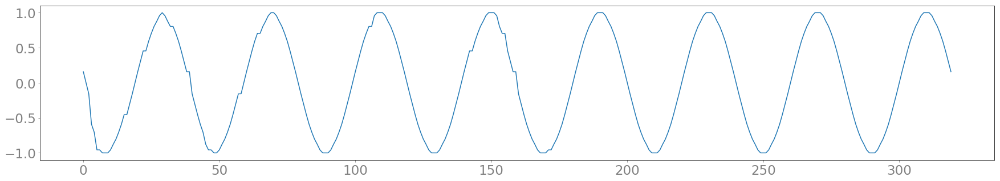

In [147]:
plot(generate_3)

##### *generate debug

In [101]:
def load_model(key_name):
    settings, model_path, created = MLModelDic.latest_settings(key_name)
    print(f'{key_name} model loading..')
    print(f'{settings}')
    print(f'{model_path}')
    print(f'created {created}')
    model = FFTNet(n_channels=settings['n_channels'], n_depth=settings['n_depth'], n_classes=settings['n_classes'], disable_cuda=True)
    model.load_model(model_path)
    model.eval()  # without droput
    model.cpu()
    return model

In [102]:
model = load_model('fftnet_test_3')
#for p in model.named_parameters():
#    print(f'{p[0]} | {list(p[1].shape)}')

fftnet_test_3 model loading..
{'lr': 0.001, 'epoch': 1, 'iter': 10000, 'n_steps': 10000, 'seq_len': 5000, 'n_channels': 256, 'n_depth': 11, 'n_classes': 256, 'receptive_field_size': 2048}
/diskB/6/out/models/fftnet/channels256_depth11_class256_rfsize2048_lr0.001_loss0.711_index12
created 2019-01-26 10:19:42.575000
Receptive Field: 2048 samples
Trainable Parameters: 2.108 million


In [107]:
%%time
gen = model.generate(duration_ms=30, phonemes=None, pitches=None, sample_rate=16000)

generate 247:0.7049940295017482 1/480, Speed: 121.31 samples/sec
generate 255:1.0 2/480, Speed: 128.42 samples/sec
generate 247:0.7049940295017482 3/480, Speed: 142.28 samples/sec
generate 255:1.0 4/480, Speed: 152.45 samples/sec
generate 12:-0.5917980540957639 5/480, Speed: 159.38 samples/sec
generate 18:-0.4549730514923994 6/480, Speed: 164.15 samples/sec
generate 8:-0.7049940295017482 7/480, Speed: 167.82 samples/sec
generate 8:-0.7049940295017482 8/480, Speed: 170.94 samples/sec
generate 5:-0.8037950191613283 9/480, Speed: 172.42 samples/sec
generate 1:-0.9572737086635957 10/480, Speed: 173.13 samples/sec
generate 1:-0.9572737086635957 11/480, Speed: 175.21 samples/sec
generate 1:-0.9572737086635957 12/480, Speed: 177.33 samples/sec
generate 0:-1.0 13/480, Speed: 179.85 samples/sec
generate 1:-0.9572737086635957 14/480, Speed: 182.10 samples/sec
generate 5:-0.8037950191613283 15/480, Speed: 184.14 samples/sec
generate 5:-0.8037950191613283 16/480, Speed: 186.00 samples/sec
generate

generate 12:-0.5917980540957639 86/480, Speed: 204.31 samples/sec
generate 8:-0.7049940295017482 87/480, Speed: 203.78 samples/sec
generate 5:-0.8037950191613283 88/480, Speed: 203.01 samples/sec
generate 3:-0.8771989506956512 89/480, Speed: 202.61 samples/sec
generate 1:-0.9572737086635957 90/480, Speed: 202.51 samples/sec
generate 0:-1.0 91/480, Speed: 203.07 samples/sec
generate 0:-1.0 92/480, Speed: 203.58 samples/sec
generate 1:-0.9572737086635957 93/480, Speed: 204.31 samples/sec
generate 1:-0.9572737086635957 94/480, Speed: 205.01 samples/sec
generate 3:-0.8771989506956512 95/480, Speed: 205.67 samples/sec
generate 5:-0.8037950191613283 96/480, Speed: 206.36 samples/sec
generate 8:-0.7049940295017482 97/480, Speed: 207.04 samples/sec
generate 12:-0.5917980540957639 98/480, Speed: 207.48 samples/sec
generate 18:-0.4549730514923994 99/480, Speed: 208.13 samples/sec
generate 27:-0.30633397981616195 100/480, Speed: 208.56 samples/sec
generate 42:-0.1576620046985716 101/480, Speed: 2

generate 8:-0.7049940295017482 167/480, Speed: 200.75 samples/sec
generate 5:-0.8037950191613283 168/480, Speed: 200.82 samples/sec
generate 3:-0.8771989506956512 169/480, Speed: 201.16 samples/sec
generate 1:-0.9572737086635957 170/480, Speed: 201.48 samples/sec
generate 0:-1.0 171/480, Speed: 201.83 samples/sec
generate 0:-1.0 172/480, Speed: 202.18 samples/sec
generate 0:-1.0 173/480, Speed: 202.51 samples/sec
generate 1:-0.9572737086635957 174/480, Speed: 202.87 samples/sec
generate 3:-0.8771989506956512 175/480, Speed: 203.19 samples/sec
generate 5:-0.8037950191613283 176/480, Speed: 202.65 samples/sec
generate 8:-0.7049940295017482 177/480, Speed: 201.38 samples/sec
generate 12:-0.5917980540957639 178/480, Speed: 200.90 samples/sec
generate 18:-0.4549730514923994 179/480, Speed: 200.97 samples/sec
generate 27:-0.30633397981616195 180/480, Speed: 201.06 samples/sec
generate 42:-0.1576620046985716 181/480, Speed: 201.08 samples/sec
generate 128:8.621159565072034e-05 182/480, Speed:

generate 18:-0.4549730514923994 245/480, Speed: 196.67 samples/sec
generate 12:-0.5917980540957639 246/480, Speed: 196.73 samples/sec
generate 8:-0.7049940295017482 247/480, Speed: 196.64 samples/sec
generate 5:-0.8037950191613283 248/480, Speed: 196.69 samples/sec
generate 3:-0.8771989506956512 249/480, Speed: 196.77 samples/sec
generate 0:-1.0 250/480, Speed: 196.90 samples/sec
generate 0:-1.0 251/480, Speed: 196.92 samples/sec
generate 0:-1.0 252/480, Speed: 196.99 samples/sec
generate 0:-1.0 253/480, Speed: 197.05 samples/sec
generate 1:-0.9572737086635957 254/480, Speed: 197.11 samples/sec
generate 3:-0.8771989506956512 255/480, Speed: 197.10 samples/sec
generate 5:-0.8037950191613283 256/480, Speed: 197.16 samples/sec
generate 8:-0.7049940295017482 257/480, Speed: 197.20 samples/sec
generate 12:-0.5917980540957639 258/480, Speed: 197.22 samples/sec
generate 18:-0.4549730514923994 259/480, Speed: 195.75 samples/sec
generate 27:-0.30633397981616195 260/480, Speed: 195.52 samples/se

generate 42:-0.1576620046985716 323/480, Speed: 195.03 samples/sec
generate 27:-0.30633397981616195 324/480, Speed: 195.01 samples/sec
generate 18:-0.4549730514923994 325/480, Speed: 195.04 samples/sec
generate 12:-0.5917980540957639 326/480, Speed: 195.08 samples/sec
generate 8:-0.7049940295017482 327/480, Speed: 195.05 samples/sec
generate 5:-0.8037950191613283 328/480, Speed: 195.08 samples/sec
generate 3:-0.8771989506956512 329/480, Speed: 195.13 samples/sec
generate 1:-0.9572737086635957 330/480, Speed: 195.19 samples/sec
generate 0:-1.0 331/480, Speed: 195.14 samples/sec
generate 0:-1.0 332/480, Speed: 195.17 samples/sec
generate 0:-1.0 333/480, Speed: 195.23 samples/sec
generate 1:-0.9572737086635957 334/480, Speed: 195.29 samples/sec
generate 3:-0.8771989506956512 335/480, Speed: 195.25 samples/sec
generate 5:-0.8037950191613283 336/480, Speed: 195.31 samples/sec
generate 8:-0.7049940295017482 337/480, Speed: 195.37 samples/sec
generate 12:-0.5917980540957639 338/480, Speed: 19

generate 0:-1.0 413/480, Speed: 199.73 samples/sec
generate 1:-0.9572737086635957 414/480, Speed: 199.77 samples/sec
generate 3:-0.8771989506956512 415/480, Speed: 199.76 samples/sec
generate 5:-0.8037950191613283 416/480, Speed: 199.76 samples/sec
generate 8:-0.7049940295017482 417/480, Speed: 199.81 samples/sec
generate 12:-0.5917980540957639 418/480, Speed: 199.85 samples/sec
generate 18:-0.4549730514923994 419/480, Speed: 199.85 samples/sec
generate 27:-0.30633397981616195 420/480, Speed: 199.90 samples/sec
generate 42:-0.1576620046985716 421/480, Speed: 199.93 samples/sec
generate 128:8.621159565072034e-05 422/480, Speed: 199.98 samples/sec
generate 213:0.1576620046985716 423/480, Speed: 199.98 samples/sec
generate 228:0.3063339798161621 424/480, Speed: 200.03 samples/sec
generate 237:0.4549730514923994 425/480, Speed: 200.06 samples/sec
generate 243:0.5917980540957635 426/480, Speed: 200.10 samples/sec
generate 247:0.7049940295017482 427/480, Speed: 200.08 samples/sec
generate 25

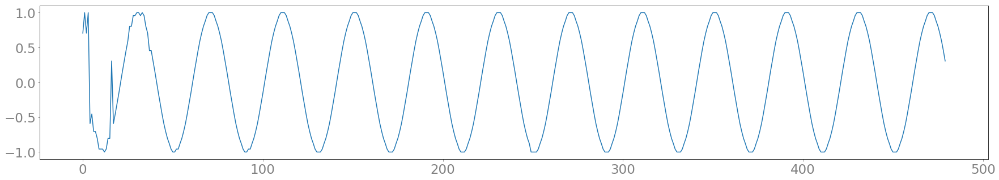

In [108]:
plot(gen)

##### summary test 1~3

- 3種類の波形を正常に学習した.
- 一定の確率でgrad normが発散する.一度発散しskipさせると復帰しない.(発散する前に学習できていれば正しい結果を返す)
- grad normの上限アラート設定を100000のような大きな値にしておいてもあまり影響無い.いったん上限は設けなくていい.
- 発散したらlrを下げる方法は有効かもしれない.
- grad clip 10, grad_top 10000 で生成を確認. grad_top 100程度だと学習完了しない.grad_top 100000なら問題なく学習.
- generateをデバッグし,不具合の無い状態にした.iter=5000で各々の特徴を得た波形を生成したがまだ再現性が低い.
- 10000iterで再学習.squareはほぼ予測できており,sawは常に0を出力し,sinはそれらしい形状を生成.
- iter20000で再学習.逆にサイン波の形状が見えなくなった.
- grad_clipをなくす.変化なし.
- ema dicayをなくす.変化なし.
- 学習時のinputがシグナルでなくエンコードされたカテゴリの値だったことに気づく.genareteでは出力シグナルのサンプルが次の入力なので当然整合しない.修正.
- square->ほぼ完璧に予測. saw-> all 0 失敗, sin-> 時々乱れるが予測できている
- lrを1e-3から1e-4に変更.lossカーブが綺麗になった.sawで完璧に予測.sinも予測できている.全ての波形を予測.

##### test 4. a single voice

In [219]:
dataset = VoiceDataset()
train_loader = DataLoader(dataset, batch_size=1,
                        shuffle=False, collate_fn=dataset.collate_fn,
                        drop_last=False, num_workers=1)
for i, data in enumerate(train_loader):

    B = data[0].shape[0]
    wav = data[0]
    target = data[1]
    f0 = data[2]
    phonemes = data[3]
    wav_len = data[4][0]
    
    print(f'''
        {len(data)} items loaded.
        ==============================
        batch size: {B}
        wav:{wav}
        target:{target}
        f0:{f0}
        phonemes:{phonemes}
        wav_len: {wav_len}
        ==============================
        ''')
    
    if i == 6:
        break

wav_batch [[0.         0.         0.         ... 0.00678666 0.00627029 0.00575391]]
wav tensor([[ 0.0000,  0.0000,  0.0000,  ...,  0.0076,  0.0068,  0.0063]])
wav_batch [[0.         0.         0.         ... 0.00900742 0.00847757 0.00824208]]
wav tensor([[ 0.0000,  0.0000,  0.0000,  ...,  0.0092,  0.0090,  0.0085]])
wav_batch [[0.         0.         0.         ... 0.03392331 0.03486189 0.03740949]]
wav tensor([[ 0.0000,  0.0000,  0.0000,  ...,  0.0363,  0.0339,  0.0349]])
wav_batch [[ 0.          0.          0.         ... -0.00320182 -0.00258211
  -0.00144598]]
wav tensor([[ 0.0000,  0.0000,  0.0000,  ..., -0.0037, -0.0032, -0.0026]])

        6 items loaded.
        batch size: 1
        wav:tensor([[ 0.0000,  0.0000,  0.0000,  ...,  0.0076,  0.0068,  0.0063]])
        target:tensor([[128, 128, 128,  ..., 151, 149, 148]])
        f0:tensor([[  0.0000,   0.0000,   0.0000,  ..., 174.8956, 174.8956, 174.8956]])
        phonemes:tensor([[ 0.,  0.,  0.,  ...,  2.,  2.,  2.]])
        wav_

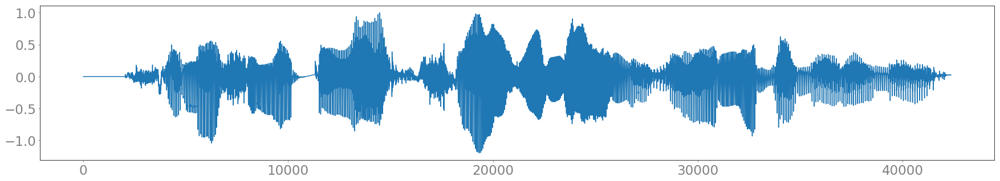

In [220]:
signal = wav.squeeze().numpy()
plot(signal)
ipd.Audio(signal, rate=16000)

In [224]:
losses, loss_aves, last_sample, test_model_4 = test(4, 'voice', signal, n_steps=100_0000, n_channels=128, batch_size=6, lr=1e-4)

Receptive Field: 2048 samples
Trainable Parameters: 0.546 million
epoch 0 -- step: 0/1000000 -- loss ave: 5.5418 -- loss: 5.5418 -- t: 0m 0s -- speed: 22.1 steps/sec
epoch 0 -- step: 500/1000000 -- loss ave: 5.3054 -- loss: 2657.9887 -- t: 0m 27s -- speed: 18.1 steps/sec
epoch 0 -- step: 1000/1000000 -- loss ave: 5.2724 -- loss: 5277.6865 -- t: 0m 55s -- speed: 17.9 steps/sec
epoch 0 -- step: 1500/1000000 -- loss ave: 5.1088 -- loss: 7668.2798 -- t: 1m 24s -- speed: 17.9 steps/sec
epoch 0 -- step: 2000/1000000 -- loss ave: 4.8782 -- loss: 9761.3069 -- t: 1m 52s -- speed: 17.8 steps/sec
epoch 0 -- step: 2500/1000000 -- loss ave: 4.7135 -- loss: 11788.4381 -- t: 2m 20s -- speed: 17.8 steps/sec
epoch 0 -- step: 3000/1000000 -- loss ave: 4.5841 -- loss: 13756.8959 -- t: 2m 49s -- speed: 17.7 steps/sec
epoch 0 -- step: 3500/1000000 -- loss ave: 4.4831 -- loss: 15695.1930 -- t: 3m 17s -- speed: 17.7 steps/sec
epoch 0 -- step: 4000/1000000 -- loss ave: 4.3991 -- loss: 17600.7573 -- t: 3m 46s 

epoch 0 -- step: 37000/1000000 -- loss ave: 3.0725 -- loss: 113684.9352 -- t: 35m 24s -- speed: 17.4 steps/sec
epoch 0 -- step: 37500/1000000 -- loss ave: 3.0646 -- loss: 114924.9693 -- t: 35m 53s -- speed: 17.4 steps/sec
epoch 0 -- step: 38000/1000000 -- loss ave: 3.0584 -- loss: 116223.1632 -- t: 36m 22s -- speed: 17.4 steps/sec
epoch 0 -- step: 38500/1000000 -- loss ave: 3.0500 -- loss: 117428.3461 -- t: 36m 50s -- speed: 17.4 steps/sec
epoch 0 -- step: 39000/1000000 -- loss ave: 3.0426 -- loss: 118665.7768 -- t: 37m 19s -- speed: 17.4 steps/sec
epoch 0 -- step: 39500/1000000 -- loss ave: 3.0349 -- loss: 119881.3345 -- t: 37m 48s -- speed: 17.4 steps/sec
epoch 0 -- step: 40000/1000000 -- loss ave: 3.0268 -- loss: 121076.5681 -- t: 38m 16s -- speed: 17.4 steps/sec
*update lr to 9.2236816e-05
epoch 0 -- step: 40500/1000000 -- loss ave: 3.0187 -- loss: 122258.9397 -- t: 38m 45s -- speed: 17.4 steps/sec
epoch 0 -- step: 41000/1000000 -- loss ave: 3.0109 -- loss: 123448.0833 -- t: 39m 14

epoch 0 -- step: 73500/1000000 -- loss ave: 2.6240 -- loss: 192868.7057 -- t: 1h 10m 24s -- speed: 17.4 steps/sec
epoch 0 -- step: 74000/1000000 -- loss ave: 2.6193 -- loss: 193830.3322 -- t: 1h 10m 53s -- speed: 17.4 steps/sec
epoch 0 -- step: 74500/1000000 -- loss ave: 2.6144 -- loss: 194776.1168 -- t: 1h 11m 21s -- speed: 17.4 steps/sec
epoch 0 -- step: 75000/1000000 -- loss ave: 2.6097 -- loss: 195730.4296 -- t: 1h 11m 50s -- speed: 17.4 steps/sec
epoch 0 -- step: 75500/1000000 -- loss ave: 2.6048 -- loss: 196666.3202 -- t: 1h 12m 19s -- speed: 17.4 steps/sec
epoch 0 -- step: 76000/1000000 -- loss ave: 2.6000 -- loss: 197605.3055 -- t: 1h 12m 48s -- speed: 17.4 steps/sec
epoch 0 -- step: 76500/1000000 -- loss ave: 2.5951 -- loss: 198525.0077 -- t: 1h 13m 16s -- speed: 17.4 steps/sec
epoch 0 -- step: 77000/1000000 -- loss ave: 2.5903 -- loss: 199456.9683 -- t: 1h 13m 45s -- speed: 17.4 steps/sec
epoch 0 -- step: 77500/1000000 -- loss ave: 2.5857 -- loss: 200391.4604 -- t: 1h 14m 14s

epoch 0 -- step: 109000/1000000 -- loss ave: 2.3287 -- loss: 253827.5580 -- t: 1h 44m 28s -- speed: 17.4 steps/sec
epoch 0 -- step: 109500/1000000 -- loss ave: 2.3251 -- loss: 254596.7553 -- t: 1h 44m 57s -- speed: 17.4 steps/sec
epoch 0 -- step: 110000/1000000 -- loss ave: 2.3216 -- loss: 255380.8339 -- t: 1h 45m 25s -- speed: 17.4 steps/sec
*update lr to 8.007313507497958e-05
epoch 0 -- step: 110500/1000000 -- loss ave: 2.3178 -- loss: 256122.2707 -- t: 1h 45m 54s -- speed: 17.4 steps/sec
epoch 0 -- step: 111000/1000000 -- loss ave: 2.3144 -- loss: 256900.1048 -- t: 1h 46m 23s -- speed: 17.4 steps/sec
epoch 0 -- step: 111500/1000000 -- loss ave: 2.3108 -- loss: 257652.6558 -- t: 1h 46m 52s -- speed: 17.4 steps/sec
epoch 0 -- step: 112000/1000000 -- loss ave: 2.3071 -- loss: 258397.3434 -- t: 1h 47m 21s -- speed: 17.4 steps/sec
epoch 0 -- step: 112500/1000000 -- loss ave: 2.3036 -- loss: 259158.4088 -- t: 1h 47m 49s -- speed: 17.4 steps/sec
epoch 0 -- step: 113000/1000000 -- loss ave:

epoch 0 -- step: 144500/1000000 -- loss ave: 2.1040 -- loss: 304027.1662 -- t: 2h 18m 32s -- speed: 17.4 steps/sec
epoch 0 -- step: 145000/1000000 -- loss ave: 2.1011 -- loss: 304654.5640 -- t: 2h 19m 1s -- speed: 17.4 steps/sec
epoch 0 -- step: 145500/1000000 -- loss ave: 2.0991 -- loss: 305425.2528 -- t: 2h 19m 29s -- speed: 17.4 steps/sec
epoch 0 -- step: 146000/1000000 -- loss ave: 2.0964 -- loss: 306083.0193 -- t: 2h 19m 58s -- speed: 17.4 steps/sec
epoch 0 -- step: 146500/1000000 -- loss ave: 2.0934 -- loss: 306687.3297 -- t: 2h 20m 27s -- speed: 17.4 steps/sec
epoch 0 -- step: 147000/1000000 -- loss ave: 2.0907 -- loss: 307339.6072 -- t: 2h 20m 56s -- speed: 17.4 steps/sec
epoch 0 -- step: 147500/1000000 -- loss ave: 2.0878 -- loss: 307955.2152 -- t: 2h 21m 24s -- speed: 17.4 steps/sec
epoch 0 -- step: 148000/1000000 -- loss ave: 2.0851 -- loss: 308602.0647 -- t: 2h 21m 53s -- speed: 17.4 steps/sec
epoch 0 -- step: 148500/1000000 -- loss ave: 2.0824 -- loss: 309235.2567 -- t: 2h

epoch 0 -- step: 180500/1000000 -- loss ave: 1.9233 -- loss: 347153.6235 -- t: 2h 53m 4s -- speed: 17.4 steps/sec
epoch 0 -- step: 181000/1000000 -- loss ave: 1.9213 -- loss: 347751.2219 -- t: 2h 53m 33s -- speed: 17.4 steps/sec
epoch 0 -- step: 181500/1000000 -- loss ave: 1.9188 -- loss: 348259.0723 -- t: 2h 54m 2s -- speed: 17.4 steps/sec
epoch 0 -- step: 182000/1000000 -- loss ave: 1.9164 -- loss: 348795.7211 -- t: 2h 54m 31s -- speed: 17.4 steps/sec
epoch 0 -- step: 182500/1000000 -- loss ave: 1.9141 -- loss: 349320.3013 -- t: 2h 54m 59s -- speed: 17.4 steps/sec
epoch 0 -- step: 183000/1000000 -- loss ave: 1.9120 -- loss: 349889.2528 -- t: 2h 55m 28s -- speed: 17.4 steps/sec
epoch 0 -- step: 183500/1000000 -- loss ave: 1.9097 -- loss: 350429.7024 -- t: 2h 55m 57s -- speed: 17.4 steps/sec
epoch 0 -- step: 184000/1000000 -- loss ave: 1.9076 -- loss: 350996.8082 -- t: 2h 56m 26s -- speed: 17.4 steps/sec
epoch 0 -- step: 184500/1000000 -- loss ave: 1.9053 -- loss: 351522.6046 -- t: 2h 

epoch 0 -- step: 216000/1000000 -- loss ave: 1.7746 -- loss: 383319.8654 -- t: 3h 27m 8s -- speed: 17.4 steps/sec
epoch 0 -- step: 216500/1000000 -- loss ave: 1.7726 -- loss: 383770.6520 -- t: 3h 27m 36s -- speed: 17.4 steps/sec
epoch 0 -- step: 217000/1000000 -- loss ave: 1.7710 -- loss: 384316.2858 -- t: 3h 28m 5s -- speed: 17.4 steps/sec
epoch 0 -- step: 217500/1000000 -- loss ave: 1.7690 -- loss: 384755.0000 -- t: 3h 28m 34s -- speed: 17.4 steps/sec
epoch 0 -- step: 218000/1000000 -- loss ave: 1.7675 -- loss: 385326.4183 -- t: 3h 29m 3s -- speed: 17.4 steps/sec
epoch 0 -- step: 218500/1000000 -- loss ave: 1.7656 -- loss: 385775.2996 -- t: 3h 29m 32s -- speed: 17.4 steps/sec
epoch 0 -- step: 219000/1000000 -- loss ave: 1.7636 -- loss: 386235.8421 -- t: 3h 30m 0s -- speed: 17.4 steps/sec
epoch 0 -- step: 219500/1000000 -- loss ave: 1.7618 -- loss: 386708.5510 -- t: 3h 30m 29s -- speed: 17.4 steps/sec
epoch 0 -- step: 220000/1000000 -- loss ave: 1.7597 -- loss: 387144.3285 -- t: 3h 30

epoch 0 -- step: 251500/1000000 -- loss ave: 1.6501 -- loss: 415003.5691 -- t: 4h 1m 11s -- speed: 17.4 steps/sec
epoch 0 -- step: 252000/1000000 -- loss ave: 1.6484 -- loss: 415410.7526 -- t: 4h 1m 40s -- speed: 17.4 steps/sec
epoch 0 -- step: 252500/1000000 -- loss ave: 1.6469 -- loss: 415836.5504 -- t: 4h 2m 9s -- speed: 17.4 steps/sec
epoch 0 -- step: 253000/1000000 -- loss ave: 1.6452 -- loss: 416236.3977 -- t: 4h 2m 37s -- speed: 17.4 steps/sec
epoch 0 -- step: 253500/1000000 -- loss ave: 1.6435 -- loss: 416627.5334 -- t: 4h 3m 6s -- speed: 17.4 steps/sec
epoch 0 -- step: 254000/1000000 -- loss ave: 1.6419 -- loss: 417048.8662 -- t: 4h 3m 35s -- speed: 17.4 steps/sec
epoch 0 -- step: 254500/1000000 -- loss ave: 1.6403 -- loss: 417456.3352 -- t: 4h 4m 4s -- speed: 17.4 steps/sec
epoch 0 -- step: 255000/1000000 -- loss ave: 1.6388 -- loss: 417890.2917 -- t: 4h 4m 33s -- speed: 17.4 steps/sec
epoch 0 -- step: 255500/1000000 -- loss ave: 1.6371 -- loss: 418274.4511 -- t: 4h 5m 1s -- 

epoch 0 -- step: 287000/1000000 -- loss ave: 1.5418 -- loss: 442506.3270 -- t: 4h 35m 14s -- speed: 17.4 steps/sec
epoch 0 -- step: 287500/1000000 -- loss ave: 1.5404 -- loss: 442852.5360 -- t: 4h 35m 42s -- speed: 17.4 steps/sec
epoch 0 -- step: 288000/1000000 -- loss ave: 1.5389 -- loss: 443193.2819 -- t: 4h 36m 11s -- speed: 17.4 steps/sec
epoch 0 -- step: 288500/1000000 -- loss ave: 1.5375 -- loss: 443580.6030 -- t: 4h 36m 40s -- speed: 17.4 steps/sec
epoch 0 -- step: 289000/1000000 -- loss ave: 1.5361 -- loss: 443932.7766 -- t: 4h 37m 9s -- speed: 17.4 steps/sec
epoch 0 -- step: 289500/1000000 -- loss ave: 1.5347 -- loss: 444286.8585 -- t: 4h 37m 37s -- speed: 17.4 steps/sec
epoch 0 -- step: 290000/1000000 -- loss ave: 1.5332 -- loss: 444626.5538 -- t: 4h 38m 6s -- speed: 17.4 steps/sec
*update lr to 5.56616652431058e-05
epoch 0 -- step: 290500/1000000 -- loss ave: 1.5317 -- loss: 444972.8803 -- t: 4h 38m 35s -- speed: 17.4 steps/sec
epoch 0 -- step: 291000/1000000 -- loss ave: 1.

epoch 0 -- step: 322500/1000000 -- loss ave: 1.4473 -- loss: 466740.4340 -- t: 5h 9m 18s -- speed: 17.4 steps/sec
epoch 0 -- step: 323000/1000000 -- loss ave: 1.4460 -- loss: 467054.6498 -- t: 5h 9m 47s -- speed: 17.4 steps/sec
epoch 0 -- step: 323500/1000000 -- loss ave: 1.4447 -- loss: 467363.5042 -- t: 5h 10m 15s -- speed: 17.4 steps/sec
epoch 0 -- step: 324000/1000000 -- loss ave: 1.4436 -- loss: 467716.6490 -- t: 5h 10m 44s -- speed: 17.4 steps/sec
epoch 0 -- step: 324500/1000000 -- loss ave: 1.4423 -- loss: 468013.3456 -- t: 5h 11m 13s -- speed: 17.4 steps/sec
epoch 0 -- step: 325000/1000000 -- loss ave: 1.4410 -- loss: 468322.6032 -- t: 5h 11m 42s -- speed: 17.4 steps/sec
epoch 0 -- step: 325500/1000000 -- loss ave: 1.4399 -- loss: 468683.6346 -- t: 5h 12m 11s -- speed: 17.4 steps/sec
epoch 0 -- step: 326000/1000000 -- loss ave: 1.4386 -- loss: 468977.8492 -- t: 5h 12m 39s -- speed: 17.4 steps/sec
epoch 0 -- step: 326500/1000000 -- loss ave: 1.4373 -- loss: 469294.1781 -- t: 5h 

epoch 0 -- step: 358000/1000000 -- loss ave: 1.3643 -- loss: 488428.9393 -- t: 5h 43m 21s -- speed: 17.4 steps/sec
epoch 0 -- step: 358500/1000000 -- loss ave: 1.3632 -- loss: 488723.0508 -- t: 5h 43m 50s -- speed: 17.4 steps/sec
epoch 0 -- step: 359000/1000000 -- loss ave: 1.3622 -- loss: 489048.3519 -- t: 5h 44m 19s -- speed: 17.4 steps/sec
epoch 0 -- step: 359500/1000000 -- loss ave: 1.3611 -- loss: 489312.1234 -- t: 5h 44m 48s -- speed: 17.4 steps/sec
epoch 0 -- step: 360000/1000000 -- loss ave: 1.3600 -- loss: 489595.5906 -- t: 5h 45m 16s -- speed: 17.4 steps/sec
*update lr to 4.832131282057164e-05
epoch 0 -- step: 360500/1000000 -- loss ave: 1.3588 -- loss: 489864.2973 -- t: 5h 45m 45s -- speed: 17.4 steps/sec
epoch 0 -- step: 361000/1000000 -- loss ave: 1.3577 -- loss: 490141.3220 -- t: 5h 46m 14s -- speed: 17.4 steps/sec
epoch 0 -- step: 361500/1000000 -- loss ave: 1.3567 -- loss: 490434.6577 -- t: 5h 46m 43s -- speed: 17.4 steps/sec
epoch 0 -- step: 362000/1000000 -- loss ave:

epoch 0 -- step: 393500/1000000 -- loss ave: 1.2904 -- loss: 507756.1950 -- t: 6h 17m 25s -- speed: 17.4 steps/sec
epoch 0 -- step: 394000/1000000 -- loss ave: 1.2894 -- loss: 508013.9754 -- t: 6h 17m 53s -- speed: 17.4 steps/sec
epoch 0 -- step: 394500/1000000 -- loss ave: 1.2885 -- loss: 508300.0018 -- t: 6h 18m 22s -- speed: 17.4 steps/sec
epoch 0 -- step: 395000/1000000 -- loss ave: 1.2875 -- loss: 508561.7652 -- t: 6h 18m 51s -- speed: 17.4 steps/sec
epoch 0 -- step: 395500/1000000 -- loss ave: 1.2864 -- loss: 508791.1757 -- t: 6h 19m 20s -- speed: 17.4 steps/sec
epoch 0 -- step: 396000/1000000 -- loss ave: 1.2855 -- loss: 509066.2343 -- t: 6h 19m 49s -- speed: 17.4 steps/sec
epoch 0 -- step: 396500/1000000 -- loss ave: 1.2846 -- loss: 509326.3472 -- t: 6h 20m 17s -- speed: 17.4 steps/sec
epoch 0 -- step: 397000/1000000 -- loss ave: 1.2836 -- loss: 509594.1221 -- t: 6h 20m 46s -- speed: 17.4 steps/sec
epoch 0 -- step: 397500/1000000 -- loss ave: 1.2826 -- loss: 509824.0198 -- t: 6

epoch 0 -- step: 429000/1000000 -- loss ave: 1.2246 -- loss: 525373.0508 -- t: 6h 51m 28s -- speed: 17.4 steps/sec
epoch 0 -- step: 429500/1000000 -- loss ave: 1.2237 -- loss: 525595.9350 -- t: 6h 51m 57s -- speed: 17.4 steps/sec
epoch 0 -- step: 430000/1000000 -- loss ave: 1.2230 -- loss: 525878.6086 -- t: 6h 52m 26s -- speed: 17.4 steps/sec
*update lr to 4.194896545954032e-05
epoch 0 -- step: 430500/1000000 -- loss ave: 1.2220 -- loss: 526093.4832 -- t: 6h 52m 54s -- speed: 17.4 steps/sec
epoch 0 -- step: 431000/1000000 -- loss ave: 1.2211 -- loss: 526305.3694 -- t: 6h 53m 23s -- speed: 17.4 steps/sec
epoch 0 -- step: 431500/1000000 -- loss ave: 1.2202 -- loss: 526531.3972 -- t: 6h 53m 52s -- speed: 17.4 steps/sec
epoch 0 -- step: 432000/1000000 -- loss ave: 1.2194 -- loss: 526792.7114 -- t: 6h 54m 21s -- speed: 17.4 steps/sec
epoch 0 -- step: 432500/1000000 -- loss ave: 1.2185 -- loss: 527012.5612 -- t: 6h 54m 49s -- speed: 17.4 steps/sec
epoch 0 -- step: 433000/1000000 -- loss ave:

epoch 0 -- step: 464500/1000000 -- loss ave: 1.1655 -- loss: 541395.4036 -- t: 7h 25m 33s -- speed: 17.4 steps/sec
epoch 0 -- step: 465000/1000000 -- loss ave: 1.1647 -- loss: 541597.1582 -- t: 7h 26m 1s -- speed: 17.4 steps/sec
epoch 0 -- step: 465500/1000000 -- loss ave: 1.1639 -- loss: 541794.3137 -- t: 7h 26m 30s -- speed: 17.4 steps/sec
epoch 0 -- step: 466000/1000000 -- loss ave: 1.1632 -- loss: 542047.2777 -- t: 7h 26m 59s -- speed: 17.4 steps/sec
epoch 0 -- step: 466500/1000000 -- loss ave: 1.1624 -- loss: 542240.3059 -- t: 7h 27m 28s -- speed: 17.4 steps/sec
epoch 0 -- step: 467000/1000000 -- loss ave: 1.1616 -- loss: 542455.6771 -- t: 7h 27m 57s -- speed: 17.4 steps/sec
epoch 0 -- step: 467500/1000000 -- loss ave: 1.1608 -- loss: 542676.0182 -- t: 7h 28m 25s -- speed: 17.4 steps/sec
epoch 0 -- step: 468000/1000000 -- loss ave: 1.1600 -- loss: 542883.9602 -- t: 7h 28m 54s -- speed: 17.4 steps/sec
epoch 0 -- step: 468500/1000000 -- loss ave: 1.1593 -- loss: 543114.2178 -- t: 7h

epoch 0 -- step: 500000/1000000 -- loss ave: 1.1120 -- loss: 555978.1324 -- t: 7h 59m 38s -- speed: 17.4 steps/sec
*update lr to 3.641696800871167e-05
epoch 0 -- step: 500500/1000000 -- loss ave: 1.1113 -- loss: 556200.4724 -- t: 8h 0m 6s -- speed: 17.4 steps/sec
epoch 0 -- step: 501000/1000000 -- loss ave: 1.1105 -- loss: 556383.6686 -- t: 8h 0m 35s -- speed: 17.4 steps/sec
epoch 0 -- step: 501500/1000000 -- loss ave: 1.1098 -- loss: 556570.2938 -- t: 8h 1m 4s -- speed: 17.4 steps/sec
epoch 0 -- step: 502000/1000000 -- loss ave: 1.1091 -- loss: 556755.2991 -- t: 8h 1m 33s -- speed: 17.4 steps/sec
epoch 0 -- step: 502500/1000000 -- loss ave: 1.1084 -- loss: 556949.0388 -- t: 8h 2m 2s -- speed: 17.4 steps/sec
epoch 0 -- step: 503000/1000000 -- loss ave: 1.1077 -- loss: 557150.8837 -- t: 8h 2m 30s -- speed: 17.4 steps/sec
epoch 0 -- step: 503500/1000000 -- loss ave: 1.1070 -- loss: 557353.5755 -- t: 8h 2m 59s -- speed: 17.4 steps/sec
epoch 0 -- step: 504000/1000000 -- loss ave: 1.1063 --

epoch 0 -- step: 535500/1000000 -- loss ave: 1.0633 -- loss: 569396.7423 -- t: 8h 33m 42s -- speed: 17.4 steps/sec
epoch 0 -- step: 536000/1000000 -- loss ave: 1.0626 -- loss: 569569.9527 -- t: 8h 34m 10s -- speed: 17.4 steps/sec
epoch 0 -- step: 536500/1000000 -- loss ave: 1.0620 -- loss: 569749.0608 -- t: 8h 34m 39s -- speed: 17.4 steps/sec
epoch 0 -- step: 537000/1000000 -- loss ave: 1.0613 -- loss: 569921.2938 -- t: 8h 35m 8s -- speed: 17.4 steps/sec
epoch 0 -- step: 537500/1000000 -- loss ave: 1.0606 -- loss: 570097.0066 -- t: 8h 35m 37s -- speed: 17.4 steps/sec
epoch 0 -- step: 538000/1000000 -- loss ave: 1.0600 -- loss: 570260.7905 -- t: 8h 36m 5s -- speed: 17.4 steps/sec
epoch 0 -- step: 538500/1000000 -- loss ave: 1.0593 -- loss: 570459.5965 -- t: 8h 36m 34s -- speed: 17.4 steps/sec
epoch 0 -- step: 539000/1000000 -- loss ave: 1.0587 -- loss: 570640.7539 -- t: 8h 37m 3s -- speed: 17.4 steps/sec
epoch 0 -- step: 539500/1000000 -- loss ave: 1.0581 -- loss: 570833.9080 -- t: 8h 3

epoch 0 -- step: 571000/1000000 -- loss ave: 1.0189 -- loss: 581800.1269 -- t: 9h 7m 45s -- speed: 17.4 steps/sec
epoch 0 -- step: 571500/1000000 -- loss ave: 1.0183 -- loss: 581951.8235 -- t: 9h 8m 14s -- speed: 17.4 steps/sec
epoch 0 -- step: 572000/1000000 -- loss ave: 1.0177 -- loss: 582120.5314 -- t: 9h 8m 43s -- speed: 17.4 steps/sec
epoch 0 -- step: 572500/1000000 -- loss ave: 1.0171 -- loss: 582266.1500 -- t: 9h 9m 12s -- speed: 17.4 steps/sec
epoch 0 -- step: 573000/1000000 -- loss ave: 1.0165 -- loss: 582448.4546 -- t: 9h 9m 40s -- speed: 17.4 steps/sec
epoch 0 -- step: 573500/1000000 -- loss ave: 1.0159 -- loss: 582621.1212 -- t: 9h 10m 9s -- speed: 17.4 steps/sec
epoch 0 -- step: 574000/1000000 -- loss ave: 1.0153 -- loss: 582772.7058 -- t: 9h 10m 38s -- speed: 17.4 steps/sec
epoch 0 -- step: 574500/1000000 -- loss ave: 1.0147 -- loss: 582930.5933 -- t: 9h 11m 7s -- speed: 17.4 steps/sec
epoch 0 -- step: 575000/1000000 -- loss ave: 1.0141 -- loss: 583087.5911 -- t: 9h 11m 3

epoch 0 -- step: 609000/1000000 -- loss ave: 0.9753 -- loss: 593984.8870 -- t: 9h 44m 13s -- speed: 17.4 steps/sec
epoch 0 -- step: 609500/1000000 -- loss ave: 0.9748 -- loss: 594155.4589 -- t: 9h 44m 42s -- speed: 17.4 steps/sec
epoch 0 -- step: 610000/1000000 -- loss ave: 0.9743 -- loss: 594298.9065 -- t: 9h 45m 10s -- speed: 17.4 steps/sec
*update lr to 2.9160207983827797e-05
epoch 0 -- step: 610500/1000000 -- loss ave: 0.9737 -- loss: 594444.0678 -- t: 9h 45m 39s -- speed: 17.4 steps/sec
epoch 0 -- step: 611000/1000000 -- loss ave: 0.9731 -- loss: 594593.0394 -- t: 9h 46m 8s -- speed: 17.4 steps/sec
epoch 0 -- step: 611500/1000000 -- loss ave: 0.9726 -- loss: 594771.1168 -- t: 9h 46m 37s -- speed: 17.4 steps/sec
epoch 0 -- step: 612000/1000000 -- loss ave: 0.9721 -- loss: 594912.7712 -- t: 9h 47m 6s -- speed: 17.4 steps/sec
epoch 0 -- step: 612500/1000000 -- loss ave: 0.9715 -- loss: 595052.6279 -- t: 9h 47m 34s -- speed: 17.4 steps/sec
epoch 0 -- step: 613000/1000000 -- loss ave: 

epoch 0 -- step: 644000/1000000 -- loss ave: 0.9386 -- loss: 604432.1805 -- t: 10h 17m 48s -- speed: 17.4 steps/sec
epoch 0 -- step: 644500/1000000 -- loss ave: 0.9381 -- loss: 604576.4562 -- t: 10h 18m 17s -- speed: 17.4 steps/sec
epoch 0 -- step: 645000/1000000 -- loss ave: 0.9375 -- loss: 604709.0277 -- t: 10h 18m 45s -- speed: 17.4 steps/sec
epoch 0 -- step: 645500/1000000 -- loss ave: 0.9370 -- loss: 604858.6032 -- t: 10h 19m 14s -- speed: 17.4 steps/sec
epoch 0 -- step: 646000/1000000 -- loss ave: 0.9366 -- loss: 605017.6583 -- t: 10h 19m 43s -- speed: 17.4 steps/sec
epoch 0 -- step: 646500/1000000 -- loss ave: 0.9360 -- loss: 605150.3552 -- t: 10h 20m 12s -- speed: 17.4 steps/sec
epoch 0 -- step: 647000/1000000 -- loss ave: 0.9355 -- loss: 605297.7053 -- t: 10h 20m 41s -- speed: 17.4 steps/sec
epoch 0 -- step: 647500/1000000 -- loss ave: 0.9350 -- loss: 605432.1408 -- t: 10h 21m 9s -- speed: 17.4 steps/sec
epoch 0 -- step: 648000/1000000 -- loss ave: 0.9346 -- loss: 605612.8603 

epoch 0 -- step: 679000/1000000 -- loss ave: 0.9046 -- loss: 614242.4537 -- t: 10h 51m 23s -- speed: 17.4 steps/sec
epoch 0 -- step: 679500/1000000 -- loss ave: 0.9042 -- loss: 614372.4450 -- t: 10h 51m 52s -- speed: 17.4 steps/sec
epoch 0 -- step: 680000/1000000 -- loss ave: 0.9037 -- loss: 614507.0898 -- t: 10h 52m 21s -- speed: 17.4 steps/sec
*update lr to 2.5314721105545764e-05
epoch 0 -- step: 680500/1000000 -- loss ave: 0.9033 -- loss: 614669.4619 -- t: 10h 52m 50s -- speed: 17.4 steps/sec
epoch 0 -- step: 681000/1000000 -- loss ave: 0.9028 -- loss: 614795.3330 -- t: 10h 53m 19s -- speed: 17.4 steps/sec
epoch 0 -- step: 681500/1000000 -- loss ave: 0.9023 -- loss: 614915.3792 -- t: 10h 53m 47s -- speed: 17.4 steps/sec
epoch 0 -- step: 682000/1000000 -- loss ave: 0.9018 -- loss: 615054.0433 -- t: 10h 54m 16s -- speed: 17.4 steps/sec
epoch 0 -- step: 682500/1000000 -- loss ave: 0.9014 -- loss: 615204.7945 -- t: 10h 54m 45s -- speed: 17.4 steps/sec
epoch 0 -- step: 683000/1000000 -- 

epoch 0 -- step: 714000/1000000 -- loss ave: 0.8732 -- loss: 623474.1136 -- t: 11h 24m 57s -- speed: 17.4 steps/sec
epoch 0 -- step: 714500/1000000 -- loss ave: 0.8728 -- loss: 623592.9330 -- t: 11h 25m 26s -- speed: 17.4 steps/sec
epoch 0 -- step: 715000/1000000 -- loss ave: 0.8723 -- loss: 623729.5653 -- t: 11h 25m 55s -- speed: 17.4 steps/sec
epoch 0 -- step: 715500/1000000 -- loss ave: 0.8719 -- loss: 623848.9984 -- t: 11h 26m 23s -- speed: 17.4 steps/sec
epoch 0 -- step: 716000/1000000 -- loss ave: 0.8715 -- loss: 623979.1727 -- t: 11h 26m 52s -- speed: 17.4 steps/sec
epoch 0 -- step: 716500/1000000 -- loss ave: 0.8710 -- loss: 624098.5116 -- t: 11h 27m 21s -- speed: 17.4 steps/sec
epoch 0 -- step: 717000/1000000 -- loss ave: 0.8706 -- loss: 624237.4618 -- t: 11h 27m 50s -- speed: 17.4 steps/sec
epoch 0 -- step: 717500/1000000 -- loss ave: 0.8702 -- loss: 624350.9743 -- t: 11h 28m 18s -- speed: 17.4 steps/sec
epoch 0 -- step: 718000/1000000 -- loss ave: 0.8697 -- loss: 624476.1958

epoch 0 -- step: 749000/1000000 -- loss ave: 0.8439 -- loss: 632114.1146 -- t: 11h 58m 32s -- speed: 17.4 steps/sec
epoch 0 -- step: 749500/1000000 -- loss ave: 0.8435 -- loss: 632226.1546 -- t: 11h 59m 1s -- speed: 17.4 steps/sec
epoch 0 -- step: 750000/1000000 -- loss ave: 0.8431 -- loss: 632351.1214 -- t: 11h 59m 30s -- speed: 17.4 steps/sec
*update lr to 2.197635575874391e-05
epoch 0 -- step: 750500/1000000 -- loss ave: 0.8427 -- loss: 632460.3439 -- t: 11h 59m 59s -- speed: 17.4 steps/sec
epoch 0 -- step: 751000/1000000 -- loss ave: 0.8423 -- loss: 632579.5107 -- t: 12h 0m 27s -- speed: 17.4 steps/sec
epoch 0 -- step: 751500/1000000 -- loss ave: 0.8419 -- loss: 632699.8616 -- t: 12h 0m 56s -- speed: 17.4 steps/sec
epoch 0 -- step: 752000/1000000 -- loss ave: 0.8415 -- loss: 632825.8072 -- t: 12h 1m 25s -- speed: 17.4 steps/sec
epoch 0 -- step: 752500/1000000 -- loss ave: 0.8411 -- loss: 632937.5007 -- t: 12h 1m 54s -- speed: 17.4 steps/sec
epoch 0 -- step: 753000/1000000 -- loss a

epoch 0 -- step: 784000/1000000 -- loss ave: 0.8168 -- loss: 640359.1850 -- t: 12h 32m 9s -- speed: 17.4 steps/sec
epoch 0 -- step: 784500/1000000 -- loss ave: 0.8164 -- loss: 640471.2389 -- t: 12h 32m 38s -- speed: 17.4 steps/sec
epoch 0 -- step: 785000/1000000 -- loss ave: 0.8160 -- loss: 640587.6737 -- t: 12h 33m 6s -- speed: 17.4 steps/sec
epoch 0 -- step: 785500/1000000 -- loss ave: 0.8157 -- loss: 640712.2694 -- t: 12h 33m 35s -- speed: 17.4 steps/sec
epoch 0 -- step: 786000/1000000 -- loss ave: 0.8153 -- loss: 640822.7752 -- t: 12h 34m 4s -- speed: 17.4 steps/sec
epoch 0 -- step: 786500/1000000 -- loss ave: 0.8149 -- loss: 640937.2837 -- t: 12h 34m 33s -- speed: 17.4 steps/sec
epoch 0 -- step: 787000/1000000 -- loss ave: 0.8145 -- loss: 641044.9251 -- t: 12h 35m 2s -- speed: 17.4 steps/sec
epoch 0 -- step: 787500/1000000 -- loss ave: 0.8142 -- loss: 641155.7407 -- t: 12h 35m 30s -- speed: 17.4 steps/sec
epoch 0 -- step: 788000/1000000 -- loss ave: 0.8138 -- loss: 641266.6090 -- 

epoch 0 -- step: 819000/1000000 -- loss ave: 0.7914 -- loss: 648197.0226 -- t: 13h 5m 46s -- speed: 17.4 steps/sec
epoch 0 -- step: 819500/1000000 -- loss ave: 0.7911 -- loss: 648318.5266 -- t: 13h 6m 14s -- speed: 17.4 steps/sec
epoch 0 -- step: 820000/1000000 -- loss ave: 0.7908 -- loss: 648422.0307 -- t: 13h 6m 43s -- speed: 17.4 steps/sec
*update lr to 1.907823556187918e-05
epoch 0 -- step: 820500/1000000 -- loss ave: 0.7904 -- loss: 648525.5452 -- t: 13h 7m 12s -- speed: 17.4 steps/sec
epoch 0 -- step: 821000/1000000 -- loss ave: 0.7901 -- loss: 648641.1149 -- t: 13h 7m 41s -- speed: 17.4 steps/sec
epoch 0 -- step: 821500/1000000 -- loss ave: 0.7897 -- loss: 648744.9794 -- t: 13h 8m 10s -- speed: 17.4 steps/sec
epoch 0 -- step: 822000/1000000 -- loss ave: 0.7894 -- loss: 648847.6651 -- t: 13h 8m 39s -- speed: 17.4 steps/sec
epoch 0 -- step: 822500/1000000 -- loss ave: 0.7890 -- loss: 648969.0922 -- t: 13h 9m 8s -- speed: 17.4 steps/sec
epoch 0 -- step: 823000/1000000 -- loss ave: 

epoch 0 -- step: 854000/1000000 -- loss ave: 0.7678 -- loss: 655683.6587 -- t: 13h 39m 22s -- speed: 17.4 steps/sec
epoch 0 -- step: 854500/1000000 -- loss ave: 0.7674 -- loss: 655781.4855 -- t: 13h 39m 51s -- speed: 17.4 steps/sec
epoch 0 -- step: 855000/1000000 -- loss ave: 0.7671 -- loss: 655882.7598 -- t: 13h 40m 20s -- speed: 17.4 steps/sec
epoch 0 -- step: 855500/1000000 -- loss ave: 0.7668 -- loss: 655983.7797 -- t: 13h 40m 48s -- speed: 17.4 steps/sec
epoch 0 -- step: 856000/1000000 -- loss ave: 0.7665 -- loss: 656092.2026 -- t: 13h 41m 17s -- speed: 17.4 steps/sec
epoch 0 -- step: 856500/1000000 -- loss ave: 0.7662 -- loss: 656208.4386 -- t: 13h 41m 46s -- speed: 17.4 steps/sec
epoch 0 -- step: 857000/1000000 -- loss ave: 0.7658 -- loss: 656310.2963 -- t: 13h 42m 15s -- speed: 17.4 steps/sec
epoch 0 -- step: 857500/1000000 -- loss ave: 0.7655 -- loss: 656408.9638 -- t: 13h 42m 44s -- speed: 17.4 steps/sec
epoch 0 -- step: 858000/1000000 -- loss ave: 0.7652 -- loss: 656507.3953

epoch 0 -- step: 889000/1000000 -- loss ave: 0.7456 -- loss: 662846.0491 -- t: 14h 12m 56s -- speed: 17.4 steps/sec
epoch 0 -- step: 889500/1000000 -- loss ave: 0.7453 -- loss: 662940.9262 -- t: 14h 13m 25s -- speed: 17.4 steps/sec
epoch 0 -- step: 890000/1000000 -- loss ave: 0.7450 -- loss: 663038.1206 -- t: 14h 13m 54s -- speed: 17.4 steps/sec
*update lr to 1.6562303420562894e-05
epoch 0 -- step: 890500/1000000 -- loss ave: 0.7447 -- loss: 663140.2149 -- t: 14h 14m 23s -- speed: 17.4 steps/sec
epoch 0 -- step: 891000/1000000 -- loss ave: 0.7444 -- loss: 663239.0144 -- t: 14h 14m 52s -- speed: 17.4 steps/sec
epoch 0 -- step: 891500/1000000 -- loss ave: 0.7441 -- loss: 663335.6109 -- t: 14h 15m 20s -- speed: 17.4 steps/sec
epoch 0 -- step: 892000/1000000 -- loss ave: 0.7438 -- loss: 663435.5975 -- t: 14h 15m 49s -- speed: 17.4 steps/sec
epoch 0 -- step: 892500/1000000 -- loss ave: 0.7435 -- loss: 663544.4139 -- t: 14h 16m 18s -- speed: 17.4 steps/sec
epoch 0 -- step: 893000/1000000 -- 

epoch 0 -- step: 924000/1000000 -- loss ave: 0.7248 -- loss: 669733.9134 -- t: 14h 46m 30s -- speed: 17.4 steps/sec
epoch 0 -- step: 924500/1000000 -- loss ave: 0.7245 -- loss: 669828.6831 -- t: 14h 46m 59s -- speed: 17.4 steps/sec
epoch 0 -- step: 925000/1000000 -- loss ave: 0.7242 -- loss: 669925.6538 -- t: 14h 47m 27s -- speed: 17.4 steps/sec
epoch 0 -- step: 925500/1000000 -- loss ave: 0.7239 -- loss: 670013.4174 -- t: 14h 47m 56s -- speed: 17.4 steps/sec
epoch 0 -- step: 926000/1000000 -- loss ave: 0.7237 -- loss: 670111.6534 -- t: 14h 48m 25s -- speed: 17.4 steps/sec
epoch 0 -- step: 926500/1000000 -- loss ave: 0.7234 -- loss: 670209.3266 -- t: 14h 48m 54s -- speed: 17.4 steps/sec
epoch 0 -- step: 927000/1000000 -- loss ave: 0.7231 -- loss: 670304.8183 -- t: 14h 49m 22s -- speed: 17.4 steps/sec
epoch 0 -- step: 927500/1000000 -- loss ave: 0.7228 -- loss: 670396.1226 -- t: 14h 49m 51s -- speed: 17.4 steps/sec
epoch 0 -- step: 928000/1000000 -- loss ave: 0.7225 -- loss: 670506.8673

epoch 0 -- step: 959000/1000000 -- loss ave: 0.7052 -- loss: 676330.1564 -- t: 15h 20m 4s -- speed: 17.4 steps/sec
epoch 0 -- step: 959500/1000000 -- loss ave: 0.7050 -- loss: 676424.7986 -- t: 15h 20m 32s -- speed: 17.4 steps/sec
epoch 0 -- step: 960000/1000000 -- loss ave: 0.7047 -- loss: 676515.8603 -- t: 15h 21m 1s -- speed: 17.4 steps/sec
*update lr to 1.4378158488770138e-05
epoch 0 -- step: 960500/1000000 -- loss ave: 0.7044 -- loss: 676604.8038 -- t: 15h 21m 30s -- speed: 17.4 steps/sec
epoch 0 -- step: 961000/1000000 -- loss ave: 0.7042 -- loss: 676696.7705 -- t: 15h 21m 59s -- speed: 17.4 steps/sec
epoch 0 -- step: 961500/1000000 -- loss ave: 0.7039 -- loss: 676787.9925 -- t: 15h 22m 27s -- speed: 17.4 steps/sec
epoch 0 -- step: 962000/1000000 -- loss ave: 0.7036 -- loss: 676888.5528 -- t: 15h 22m 56s -- speed: 17.4 steps/sec
epoch 0 -- step: 962500/1000000 -- loss ave: 0.7034 -- loss: 676976.5132 -- t: 15h 23m 25s -- speed: 17.4 steps/sec
epoch 0 -- step: 963000/1000000 -- lo

epoch 0 -- step: 994000/1000000 -- loss ave: 0.6868 -- loss: 682719.8561 -- t: 15h 53m 39s -- speed: 17.4 steps/sec
epoch 0 -- step: 994500/1000000 -- loss ave: 0.6866 -- loss: 682811.0387 -- t: 15h 54m 7s -- speed: 17.4 steps/sec
epoch 0 -- step: 995000/1000000 -- loss ave: 0.6863 -- loss: 682906.8789 -- t: 15h 54m 36s -- speed: 17.4 steps/sec
epoch 0 -- step: 995500/1000000 -- loss ave: 0.6861 -- loss: 682997.7287 -- t: 15h 55m 5s -- speed: 17.4 steps/sec
epoch 0 -- step: 996000/1000000 -- loss ave: 0.6858 -- loss: 683083.2822 -- t: 15h 55m 34s -- speed: 17.4 steps/sec
epoch 0 -- step: 996500/1000000 -- loss ave: 0.6856 -- loss: 683172.2917 -- t: 15h 56m 3s -- speed: 17.4 steps/sec
epoch 0 -- step: 997000/1000000 -- loss ave: 0.6853 -- loss: 683265.7416 -- t: 15h 56m 31s -- speed: 17.4 steps/sec
epoch 0 -- step: 997500/1000000 -- loss ave: 0.6851 -- loss: 683350.8634 -- t: 15h 57m 0s -- speed: 17.4 steps/sec
epoch 0 -- step: 998000/1000000 -- loss ave: 0.6848 -- loss: 683436.2357 -- 

[autoreload of datasets.voice_dataset failed: Traceback (most recent call last):
  File "/home/kaz/miniconda3/envs/core/lib/python3.6/site-packages/IPython/extensions/autoreload.py", line 244, in check
    superreload(m, reload, self.old_objects)
  File "/home/kaz/miniconda3/envs/core/lib/python3.6/site-packages/IPython/extensions/autoreload.py", line 374, in superreload
    module = reload(module)
  File "/home/kaz/miniconda3/envs/core/lib/python3.6/imp.py", line 315, in reload
    return importlib.reload(module)
  File "/home/kaz/miniconda3/envs/core/lib/python3.6/importlib/__init__.py", line 166, in reload
    _bootstrap._exec(spec, module)
  File "<frozen importlib._bootstrap>", line 618, in _exec
  File "<frozen importlib._bootstrap_external>", line 674, in exec_module
  File "<frozen importlib._bootstrap_external>", line 781, in get_code
  File "<frozen importlib._bootstrap_external>", line 741, in source_to_code
  File "<frozen importlib._bootstrap>", line 219, in _call_with_fra

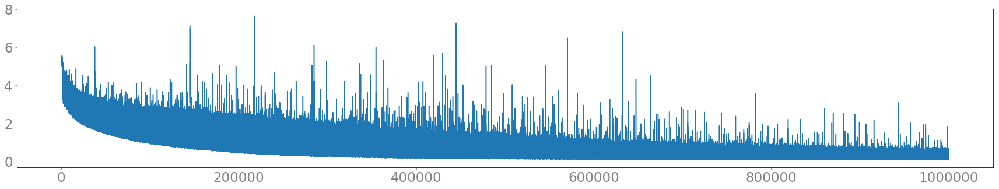

In [225]:
plot(losses)

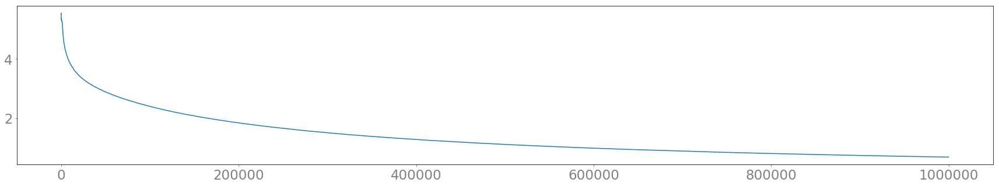

In [226]:
plot(loss_aves)

[[128 198 197 ... 233 233 235]
 [128  52  44 ... 233 233 235]
 [128 202 169 ... 233 233 235]
 [128 163 195 ... 233 233 235]
 [128  54  50 ... 233 233 235]
 [128  41 203 ... 233 233 235]]


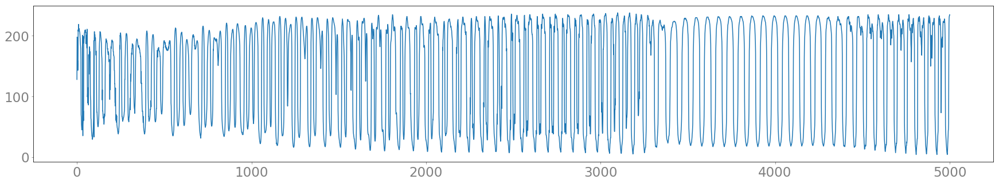

In [227]:
print(last_sample)
plot(last_sample[0])

In [231]:
%%time
test_model_4.cpu()
test_model_4.eval()
generate_4 = test_model_4.generate(duration_ms=3000, phonemes=None, pitches=None, sample_rate=16000)

generate 242:0.5664445892926477 1/48000, Speed: 179.56 samples/sec
generate 8:-0.7049940295017482 2/48000, Speed: 157.28 samples/sec
generate 11:-0.6182785110399752 3/48000, Speed: 150.32 samples/sec
generate 38:-0.1883653918198679 4/48000, Speed: 148.65 samples/sec
generate 228:0.3063339798161621 5/48000, Speed: 135.86 samples/sec
generate 21:-0.398840438515588 6/48000, Speed: 133.00 samples/sec
generate 252:0.8771989506956518 7/48000, Speed: 131.15 samples/sec
generate 245:0.6459360562875215 8/48000, Speed: 132.58 samples/sec
generate 32:-0.24569808370657203 9/48000, Speed: 134.14 samples/sec
generate 40:-0.17234644938227578 10/48000, Speed: 134.10 samples/sec
generate 171:0.022085693278976963 11/48000, Speed: 139.66 samples/sec
generate 218:0.19691277952179073 12/48000, Speed: 145.39 samples/sec
generate 19:-0.4354427755777621 13/48000, Speed: 150.61 samples/sec
generate 14:-0.5421701525305832 14/48000, Speed: 154.31 samples/sec
generate 11:-0.6182785110399752 15/48000, Speed: 140.8

generate 247:0.7049940295017482 102/48000, Speed: 244.98 samples/sec
generate 250:0.8037950191613278 103/48000, Speed: 245.46 samples/sec
generate 248:0.7365061843096186 104/48000, Speed: 245.91 samples/sec
generate 249:0.7694190924698708 105/48000, Speed: 246.35 samples/sec
generate 246:0.674823012835575 106/48000, Speed: 244.72 samples/sec
generate 242:0.5664445892926477 107/48000, Speed: 244.88 samples/sec
generate 235:0.4167436963269739 108/48000, Speed: 245.01 samples/sec
generate 225:0.2683830998948736 109/48000, Speed: 245.23 samples/sec
generate 215:0.17234644938227578 110/48000, Speed: 245.45 samples/sec
generate 202:0.09622301969318046 111/48000, Speed: 245.23 samples/sec
generate 190:0.05550348830573362 112/48000, Speed: 245.45 samples/sec
generate 80:-0.027027476740262797 113/48000, Speed: 245.70 samples/sec
generate 181:0.03625531038081219 114/48000, Speed: 245.91 samples/sec
generate 214:0.1648445897488875 115/48000, Speed: 246.10 samples/sec
generate 222:0.23507442313167

generate 223:0.24569808370657203 157/48000, Speed: 248.33 samples/sec
generate 217:0.1883653918198679 158/48000, Speed: 248.47 samples/sec
generate 99:-0.00962322157000821 159/48000, Speed: 248.64 samples/sec
generate 214:0.1648445897488875 160/48000, Speed: 248.77 samples/sec
generate 221:0.22490289908912117 161/48000, Speed: 248.80 samples/sec
generate 219:0.20584010893352592 162/48000, Speed: 248.63 samples/sec
generate 216:0.18018177573968328 163/48000, Speed: 248.80 samples/sec
generate 231:0.34957404296965766 164/48000, Speed: 248.93 samples/sec
generate 236:0.4354427755777624 165/48000, Speed: 249.06 samples/sec
generate 238:0.4753714717667974 166/48000, Speed: 249.12 samples/sec
generate 239:0.49667662646658983 167/48000, Speed: 248.81 samples/sec
generate 238:0.4753714717667974 168/48000, Speed: 248.90 samples/sec
generate 238:0.4753714717667974 169/48000, Speed: 249.15 samples/sec
generate 233:0.3816991324671922 170/48000, Speed: 249.15 samples/sec
generate 233:0.381699132467

generate 35:-0.21516426892309853 252/48000, Speed: 242.03 samples/sec
generate 46:-0.13186117560059185 253/48000, Speed: 240.74 samples/sec
generate 223:0.24569808370657203 254/48000, Speed: 240.37 samples/sec
generate 58:-0.07665090604748023 255/48000, Speed: 240.43 samples/sec
generate 79:-0.02840319919771317 256/48000, Speed: 240.53 samples/sec
generate 219:0.20584010893352592 257/48000, Speed: 240.20 samples/sec
generate 36:-0.20584010893352606 258/48000, Speed: 239.88 samples/sec
generate 39:-0.18018177573968328 259/48000, Speed: 239.77 samples/sec
generate 52:-0.10067456763296087 260/48000, Speed: 239.68 samples/sec
generate 83:-0.023241747491194818 261/48000, Speed: 239.56 samples/sec
generate 60:-0.06993861608840268 262/48000, Speed: 239.47 samples/sec
generate 57:-0.08023244988980788 263/48000, Speed: 239.22 samples/sec
generate 158:0.010854149431751057 264/48000, Speed: 239.16 samples/sec
generate 62:-0.06378551010222042 265/48000, Speed: 239.34 samples/sec
generate 172:0.023

generate 47:-0.12608234459462436 337/48000, Speed: 231.70 samples/sec
generate 196:0.07322179053264694 338/48000, Speed: 231.94 samples/sec
generate 104:-0.006976047344247045 339/48000, Speed: 232.20 samples/sec
generate 188:0.050552936463066585 340/48000, Speed: 232.46 samples/sec
generate 142:0.0034462358134553306 341/48000, Speed: 232.70 samples/sec
generate 177:0.02984007418046591 342/48000, Speed: 232.96 samples/sec
generate 191:0.05814500388034755 343/48000, Speed: 233.21 samples/sec
generate 214:0.1648445897488875 344/48000, Speed: 233.28 samples/sec
generate 201:0.0919609269261115 345/48000, Speed: 233.08 samples/sec
generate 191:0.05814500388034755 346/48000, Speed: 232.95 samples/sec
generate 110:-0.004473080718971322 347/48000, Speed: 232.89 samples/sec
generate 128:8.621159565072034e-05 348/48000, Speed: 232.78 samples/sec
generate 179:0.03290827576828159 349/48000, Speed: 232.64 samples/sec
generate 170:0.02097884003087371 350/48000, Speed: 232.45 samples/sec
generate 180:

generate 211:0.1442008841215516 385/48000, Speed: 232.21 samples/sec
generate 210:0.13789688262642566 386/48000, Speed: 232.28 samples/sec
generate 215:0.17234644938227578 387/48000, Speed: 232.36 samples/sec
generate 215:0.17234644938227578 388/48000, Speed: 232.43 samples/sec
generate 216:0.18018177573968328 389/48000, Speed: 232.42 samples/sec
generate 208:0.12608234459462436 390/48000, Speed: 232.50 samples/sec
generate 218:0.19691277952179073 391/48000, Speed: 232.58 samples/sec
generate 194:0.06679517155155029 392/48000, Speed: 232.66 samples/sec
generate 146:0.0048462330243520205 393/48000, Speed: 232.62 samples/sec
generate 79:-0.02840319919771317 394/48000, Speed: 231.10 samples/sec
generate 38:-0.1883653918198679 395/48000, Speed: 231.01 samples/sec
generate 217:0.1883653918198679 396/48000, Speed: 230.62 samples/sec
generate 120:-0.0015124483881595887 397/48000, Speed: 230.42 samples/sec
generate 196:0.07322179053264694 398/48000, Speed: 230.47 samples/sec
generate 51:-0.105

generate 193:0.06378551010222042 433/48000, Speed: 232.49 samples/sec
generate 190:0.05550348830573362 434/48000, Speed: 232.52 samples/sec
generate 173:0.024449189709823925 435/48000, Speed: 232.60 samples/sec
generate 181:0.03625531038081219 436/48000, Speed: 232.64 samples/sec
generate 182:0.03804122119212253 437/48000, Speed: 232.65 samples/sec
generate 175:0.027027476740262797 438/48000, Speed: 232.71 samples/sec
generate 191:0.05814500388034755 439/48000, Speed: 232.78 samples/sec
generate 204:0.10532399225676857 440/48000, Speed: 232.79 samples/sec
generate 207:0.12054945712135974 441/48000, Speed: 232.87 samples/sec
generate 207:0.12054945712135974 442/48000, Speed: 232.96 samples/sec
generate 211:0.1442008841215516 443/48000, Speed: 233.15 samples/sec
generate 213:0.1576620046985716 444/48000, Speed: 233.33 samples/sec
generate 211:0.1442008841215516 445/48000, Speed: 233.49 samples/sec
generate 207:0.12054945712135974 446/48000, Speed: 233.68 samples/sec
generate 207:0.120549

generate 202:0.09622301969318046 497/48000, Speed: 240.51 samples/sec
generate 56:-0.08397319768294215 498/48000, Speed: 240.59 samples/sec
generate 119:-0.0017539970095701097 499/48000, Speed: 240.68 samples/sec
generate 35:-0.21516426892309853 500/48000, Speed: 240.72 samples/sec
generate 67:-0.05055293646306655 501/48000, Speed: 240.88 samples/sec
generate 208:0.12608234459462436 502/48000, Speed: 240.96 samples/sec
generate 135:0.0015124483881595887 503/48000, Speed: 241.05 samples/sec
generate 187:0.0482345346599396 504/48000, Speed: 241.18 samples/sec
generate 178:0.03134081999215167 505/48000, Speed: 241.30 samples/sec
generate 105:-0.006512251436848018 506/48000, Speed: 241.29 samples/sec
generate 160:0.012196941957229993 507/48000, Speed: 241.37 samples/sec
generate 61:-0.06679517155155029 508/48000, Speed: 241.41 samples/sec
generate 77:-0.03134081999215169 509/48000, Speed: 241.52 samples/sec
generate 49:-0.11525204597363858 510/48000, Speed: 241.58 samples/sec
generate 186:

generate 171:0.022085693278976963 547/48000, Speed: 241.15 samples/sec
generate 141:0.0031326665378373112 548/48000, Speed: 241.05 samples/sec
generate 175:0.027027476740262797 549/48000, Speed: 240.99 samples/sec
generate 176:0.02840319919771317 550/48000, Speed: 241.00 samples/sec
generate 176:0.02840319919771317 551/48000, Speed: 241.01 samples/sec
generate 184:0.04185472929319752 552/48000, Speed: 241.04 samples/sec
generate 195:0.06993861608840264 553/48000, Speed: 241.04 samples/sec
generate 194:0.06679517155155029 554/48000, Speed: 241.07 samples/sec
generate 198:0.08023244988980788 555/48000, Speed: 241.08 samples/sec
generate 196:0.07322179053264694 556/48000, Speed: 241.03 samples/sec
generate 201:0.0919609269261115 557/48000, Speed: 240.96 samples/sec
generate 206:0.11525204597363858 558/48000, Speed: 240.92 samples/sec
generate 208:0.12608234459462436 559/48000, Speed: 240.87 samples/sec
generate 208:0.12608234459462436 560/48000, Speed: 240.83 samples/sec
generate 212:0.15

generate 214:0.1648445897488875 595/48000, Speed: 240.56 samples/sec
generate 210:0.13789688262642566 596/48000, Speed: 240.53 samples/sec
generate 205:0.11018008942227171 597/48000, Speed: 240.28 samples/sec
generate 191:0.05814500388034755 598/48000, Speed: 239.50 samples/sec
generate 179:0.03290827576828159 599/48000, Speed: 239.42 samples/sec
generate 199:0.08397319768294215 600/48000, Speed: 239.34 samples/sec
generate 193:0.06378551010222042 601/48000, Speed: 239.36 samples/sec
generate 190:0.05550348830573362 602/48000, Speed: 239.39 samples/sec
generate 187:0.0482345346599396 603/48000, Speed: 239.15 samples/sec
generate 146:0.0048462330243520205 604/48000, Speed: 239.19 samples/sec
generate 99:-0.00962322157000821 605/48000, Speed: 239.31 samples/sec
generate 192:0.06090393801358016 606/48000, Speed: 239.43 samples/sec
generate 183:0.03990651789663028 607/48000, Speed: 239.52 samples/sec
generate 160:0.012196941957229993 608/48000, Speed: 239.51 samples/sec
generate 56:-0.0839

generate 195:0.06993861608840264 656/48000, Speed: 244.94 samples/sec
generate 194:0.06679517155155029 657/48000, Speed: 245.03 samples/sec
generate 197:0.07665090604748023 658/48000, Speed: 245.13 samples/sec
generate 204:0.10532399225676857 659/48000, Speed: 245.23 samples/sec
generate 209:0.13186117560059185 660/48000, Speed: 245.33 samples/sec
generate 211:0.1442008841215516 661/48000, Speed: 245.37 samples/sec
generate 213:0.1576620046985716 662/48000, Speed: 245.47 samples/sec
generate 206:0.11525204597363858 663/48000, Speed: 245.60 samples/sec
generate 207:0.12054945712135974 664/48000, Speed: 245.73 samples/sec
generate 216:0.18018177573968328 665/48000, Speed: 245.86 samples/sec
generate 199:0.08397319768294215 666/48000, Speed: 245.98 samples/sec
generate 177:0.02984007418046591 667/48000, Speed: 246.11 samples/sec
generate 66:-0.05297439402730209 668/48000, Speed: 246.23 samples/sec
generate 67:-0.05055293646306655 669/48000, Speed: 246.36 samples/sec
generate 165:0.0161123

generate 200:0.08788022623483743 720/48000, Speed: 249.78 samples/sec
generate 186:0.04601480262741107 721/48000, Speed: 249.80 samples/sec
generate 192:0.06090393801358016 722/48000, Speed: 249.82 samples/sec
generate 194:0.06679517155155029 723/48000, Speed: 249.85 samples/sec
generate 199:0.08397319768294215 724/48000, Speed: 249.88 samples/sec
generate 202:0.09622301969318046 725/48000, Speed: 249.90 samples/sec
generate 201:0.0919609269261115 726/48000, Speed: 249.94 samples/sec
generate 201:0.0919609269261115 727/48000, Speed: 250.06 samples/sec
generate 200:0.08788022623483743 728/48000, Speed: 250.12 samples/sec
generate 207:0.12054945712135974 729/48000, Speed: 250.18 samples/sec
generate 212:0.15078510609926793 730/48000, Speed: 250.18 samples/sec
generate 206:0.11525204597363858 731/48000, Speed: 250.24 samples/sec
generate 198:0.08023244988980788 732/48000, Speed: 250.30 samples/sec
generate 191:0.05814500388034755 733/48000, Speed: 250.36 samples/sec
generate 190:0.0555034

generate 198:0.08023244988980788 778/48000, Speed: 252.29 samples/sec
generate 195:0.06993861608840264 779/48000, Speed: 252.24 samples/sec
generate 197:0.07665090604748023 780/48000, Speed: 252.26 samples/sec
generate 194:0.06679517155155029 781/48000, Speed: 252.29 samples/sec
generate 194:0.06679517155155029 782/48000, Speed: 252.23 samples/sec
generate 197:0.07665090604748023 783/48000, Speed: 252.26 samples/sec
generate 195:0.06993861608840264 784/48000, Speed: 252.29 samples/sec
generate 193:0.06378551010222042 785/48000, Speed: 252.31 samples/sec
generate 194:0.06679517155155029 786/48000, Speed: 252.33 samples/sec
generate 189:0.05297439402730213 787/48000, Speed: 252.30 samples/sec
generate 187:0.0482345346599396 788/48000, Speed: 252.32 samples/sec
generate 183:0.03990651789663028 789/48000, Speed: 252.34 samples/sec
generate 178:0.03134081999215167 790/48000, Speed: 252.35 samples/sec
generate 196:0.07322179053264694 791/48000, Speed: 252.36 samples/sec
generate 195:0.069938

generate 189:0.05297439402730213 830/48000, Speed: 252.56 samples/sec
generate 184:0.04185472929319752 831/48000, Speed: 252.57 samples/sec
generate 196:0.07322179053264694 832/48000, Speed: 252.58 samples/sec
generate 199:0.08397319768294215 833/48000, Speed: 252.54 samples/sec
generate 200:0.08788022623483743 834/48000, Speed: 252.56 samples/sec
generate 197:0.07665090604748023 835/48000, Speed: 252.55 samples/sec
generate 174:0.025710304193833283 836/48000, Speed: 252.53 samples/sec
generate 177:0.02984007418046591 837/48000, Speed: 252.55 samples/sec
generate 149:0.006068194401169077 838/48000, Speed: 252.51 samples/sec
generate 103:-0.00746045954006148 839/48000, Speed: 252.52 samples/sec
generate 111:-0.0041158095487417905 840/48000, Speed: 252.53 samples/sec
generate 187:0.0482345346599396 841/48000, Speed: 252.55 samples/sec
generate 198:0.08023244988980788 842/48000, Speed: 252.53 samples/sec
generate 204:0.10532399225676857 843/48000, Speed: 252.51 samples/sec
generate 185:0.

generate 202:0.09622301969318046 880/48000, Speed: 252.11 samples/sec
generate 209:0.13186117560059185 881/48000, Speed: 252.11 samples/sec
generate 214:0.1648445897488875 882/48000, Speed: 252.07 samples/sec
generate 218:0.19691277952179073 883/48000, Speed: 252.03 samples/sec
generate 218:0.19691277952179073 884/48000, Speed: 252.01 samples/sec
generate 215:0.17234644938227578 885/48000, Speed: 252.01 samples/sec
generate 210:0.13789688262642566 886/48000, Speed: 252.03 samples/sec
generate 208:0.12608234459462436 887/48000, Speed: 251.97 samples/sec
generate 199:0.08397319768294215 888/48000, Speed: 251.97 samples/sec
generate 202:0.09622301969318046 889/48000, Speed: 251.99 samples/sec
generate 207:0.12054945712135974 890/48000, Speed: 252.00 samples/sec
generate 114:-0.003132666537837307 891/48000, Speed: 252.02 samples/sec
generate 173:0.024449189709823925 892/48000, Speed: 252.00 samples/sec
generate 204:0.10532399225676857 893/48000, Speed: 251.98 samples/sec
generate 195:0.069

generate 203:0.10067456763296082 930/48000, Speed: 251.60 samples/sec
generate 202:0.09622301969318046 931/48000, Speed: 251.47 samples/sec
generate 201:0.0919609269261115 932/48000, Speed: 251.47 samples/sec
generate 204:0.10532399225676857 933/48000, Speed: 251.44 samples/sec
generate 199:0.08397319768294215 934/48000, Speed: 251.46 samples/sec
generate 204:0.10532399225676857 935/48000, Speed: 251.45 samples/sec
generate 201:0.0919609269261115 936/48000, Speed: 251.46 samples/sec
generate 202:0.09622301969318046 937/48000, Speed: 251.48 samples/sec
generate 199:0.08397319768294215 938/48000, Speed: 251.50 samples/sec
generate 203:0.10067456763296082 939/48000, Speed: 251.52 samples/sec
generate 200:0.08788022623483743 940/48000, Speed: 251.54 samples/sec
generate 196:0.07322179053264694 941/48000, Speed: 251.53 samples/sec
generate 199:0.08397319768294215 942/48000, Speed: 251.55 samples/sec
generate 206:0.11525204597363858 943/48000, Speed: 251.55 samples/sec
generate 212:0.1507851

generate 80:-0.027027476740262797 1033/48000, Speed: 251.87 samples/sec
generate 81:-0.025710304193833283 1034/48000, Speed: 251.85 samples/sec
generate 89:-0.017002871589038154 1035/48000, Speed: 251.82 samples/sec
generate 153:0.007966404443218805 1036/48000, Speed: 251.82 samples/sec
generate 170:0.02097884003087371 1037/48000, Speed: 251.83 samples/sec
generate 78:-0.02984007418046591 1038/48000, Speed: 251.81 samples/sec
generate 59:-0.0732217905326469 1039/48000, Speed: 251.81 samples/sec
generate 67:-0.05055293646306655 1040/48000, Speed: 251.82 samples/sec
generate 66:-0.05297439402730209 1041/48000, Speed: 251.84 samples/sec
generate 66:-0.05297439402730209 1042/48000, Speed: 251.86 samples/sec
generate 64:-0.05814500388034755 1043/48000, Speed: 251.83 samples/sec
generate 61:-0.06679517155155029 1044/48000, Speed: 251.85 samples/sec
generate 61:-0.06679517155155029 1045/48000, Speed: 251.87 samples/sec
generate 83:-0.023241747491194818 1046/48000, Speed: 251.88 samples/sec
ge

generate 193:0.06378551010222042 1086/48000, Speed: 252.22 samples/sec
generate 194:0.06679517155155029 1087/48000, Speed: 252.23 samples/sec
generate 197:0.07665090604748023 1088/48000, Speed: 252.24 samples/sec
generate 201:0.0919609269261115 1089/48000, Speed: 252.26 samples/sec
generate 203:0.10067456763296082 1090/48000, Speed: 252.24 samples/sec
generate 206:0.11525204597363858 1091/48000, Speed: 252.25 samples/sec
generate 207:0.12054945712135974 1092/48000, Speed: 252.27 samples/sec
generate 209:0.13186117560059185 1093/48000, Speed: 252.28 samples/sec
generate 208:0.12608234459462436 1094/48000, Speed: 252.30 samples/sec
generate 207:0.12054945712135974 1095/48000, Speed: 252.28 samples/sec
generate 204:0.10532399225676857 1096/48000, Speed: 252.29 samples/sec
generate 198:0.08023244988980788 1097/48000, Speed: 252.31 samples/sec
generate 193:0.06378551010222042 1098/48000, Speed: 252.33 samples/sec
generate 186:0.04601480262741107 1099/48000, Speed: 252.35 samples/sec
generat

generate 50:-0.11018008942227171 1173/48000, Speed: 248.80 samples/sec
generate 54:-0.0919609269261115 1174/48000, Speed: 248.62 samples/sec
generate 59:-0.0732217905326469 1175/48000, Speed: 248.63 samples/sec
generate 60:-0.06993861608840268 1176/48000, Speed: 248.64 samples/sec
generate 59:-0.0732217905326469 1177/48000, Speed: 248.65 samples/sec
generate 71:-0.04185472929319752 1178/48000, Speed: 248.66 samples/sec
generate 68:-0.048234534659939626 1179/48000, Speed: 248.63 samples/sec
generate 55:-0.08788022623483743 1180/48000, Speed: 248.64 samples/sec
generate 51:-0.1053239922567685 1181/48000, Speed: 248.65 samples/sec
generate 66:-0.05297439402730209 1182/48000, Speed: 248.67 samples/sec
generate 52:-0.10067456763296087 1183/48000, Speed: 248.65 samples/sec
generate 202:0.09622301969318046 1184/48000, Speed: 248.58 samples/sec
generate 47:-0.12608234459462436 1185/48000, Speed: 248.56 samples/sec
generate 43:-0.15078510609926785 1186/48000, Speed: 248.54 samples/sec
generate 

generate 193:0.06378551010222042 1261/48000, Speed: 246.29 samples/sec
generate 193:0.06378551010222042 1262/48000, Speed: 246.29 samples/sec
generate 190:0.05550348830573362 1263/48000, Speed: 246.32 samples/sec
generate 188:0.050552936463066585 1264/48000, Speed: 246.34 samples/sec
generate 182:0.03804122119212253 1265/48000, Speed: 246.37 samples/sec
generate 179:0.03290827576828159 1266/48000, Speed: 246.40 samples/sec
generate 174:0.025710304193833283 1267/48000, Speed: 246.40 samples/sec
generate 178:0.03134081999215167 1268/48000, Speed: 246.42 samples/sec
generate 178:0.03134081999215167 1269/48000, Speed: 246.45 samples/sec
generate 180:0.03454540684737039 1270/48000, Speed: 246.49 samples/sec
generate 181:0.03625531038081219 1271/48000, Speed: 246.54 samples/sec
generate 180:0.03454540684737039 1272/48000, Speed: 246.56 samples/sec
generate 176:0.02840319919771317 1273/48000, Speed: 246.60 samples/sec
generate 176:0.02840319919771317 1274/48000, Speed: 246.62 samples/sec
gene

generate 35:-0.21516426892309853 1355/48000, Speed: 245.21 samples/sec
generate 187:0.0482345346599396 1356/48000, Speed: 245.26 samples/sec
generate 180:0.03454540684737039 1357/48000, Speed: 245.33 samples/sec
generate 62:-0.06378551010222042 1358/48000, Speed: 245.28 samples/sec
generate 66:-0.05297439402730209 1359/48000, Speed: 245.30 samples/sec
generate 77:-0.03134081999215169 1360/48000, Speed: 245.34 samples/sec
generate 147:0.005235972400528033 1361/48000, Speed: 245.11 samples/sec
generate 181:0.03625531038081219 1362/48000, Speed: 244.98 samples/sec
generate 216:0.18018177573968328 1363/48000, Speed: 244.69 samples/sec
generate 79:-0.02840319919771317 1364/48000, Speed: 244.70 samples/sec
generate 159:0.011510947950654804 1365/48000, Speed: 244.72 samples/sec
generate 221:0.22490289908912117 1366/48000, Speed: 244.73 samples/sec
generate 53:-0.09622301969318046 1367/48000, Speed: 244.72 samples/sec
generate 20:-0.4167436963269741 1368/48000, Speed: 244.74 samples/sec
genera

generate 203:0.10067456763296082 1439/48000, Speed: 242.64 samples/sec
generate 208:0.12608234459462436 1440/48000, Speed: 242.47 samples/sec
generate 209:0.13186117560059185 1441/48000, Speed: 242.41 samples/sec
generate 208:0.12608234459462436 1442/48000, Speed: 242.42 samples/sec
generate 202:0.09622301969318046 1443/48000, Speed: 242.45 samples/sec
generate 199:0.08397319768294215 1444/48000, Speed: 242.47 samples/sec
generate 202:0.09622301969318046 1445/48000, Speed: 242.47 samples/sec
generate 200:0.08788022623483743 1446/48000, Speed: 242.50 samples/sec
generate 201:0.0919609269261115 1447/48000, Speed: 242.52 samples/sec
generate 199:0.08397319768294215 1448/48000, Speed: 242.52 samples/sec
generate 201:0.0919609269261115 1449/48000, Speed: 242.54 samples/sec
generate 199:0.08397319768294215 1450/48000, Speed: 242.57 samples/sec
generate 199:0.08397319768294215 1451/48000, Speed: 242.56 samples/sec
generate 200:0.08788022623483743 1452/48000, Speed: 242.58 samples/sec
generate

generate 60:-0.06993861608840268 1491/48000, Speed: 242.97 samples/sec
generate 49:-0.11525204597363858 1492/48000, Speed: 242.97 samples/sec
generate 39:-0.18018177573968328 1493/48000, Speed: 242.98 samples/sec
generate 49:-0.11525204597363858 1494/48000, Speed: 242.99 samples/sec
generate 91:-0.01525970916873139 1495/48000, Speed: 243.00 samples/sec
generate 160:0.012196941957229993 1496/48000, Speed: 243.01 samples/sec
generate 64:-0.05814500388034755 1497/48000, Speed: 243.02 samples/sec
generate 64:-0.05814500388034755 1498/48000, Speed: 243.02 samples/sec
generate 151:0.006976047344247045 1499/48000, Speed: 242.59 samples/sec
generate 63:-0.06090393801358016 1500/48000, Speed: 242.40 samples/sec
generate 45:-0.13789688262642566 1501/48000, Speed: 242.24 samples/sec
generate 44:-0.14420088412155171 1502/48000, Speed: 242.06 samples/sec
generate 207:0.12054945712135974 1503/48000, Speed: 242.08 samples/sec
generate 201:0.0919609269261115 1504/48000, Speed: 242.10 samples/sec
gener

generate 46:-0.13186117560059185 1590/48000, Speed: 243.14 samples/sec
generate 45:-0.13789688262642566 1591/48000, Speed: 243.10 samples/sec
generate 45:-0.13789688262642566 1592/48000, Speed: 243.15 samples/sec
generate 45:-0.13789688262642566 1593/48000, Speed: 243.19 samples/sec
generate 128:8.621159565072034e-05 1594/48000, Speed: 243.23 samples/sec
generate 157:0.010225303858321294 1595/48000, Speed: 243.27 samples/sec
generate 37:-0.19691277952179073 1596/48000, Speed: 243.31 samples/sec
generate 192:0.06090393801358016 1597/48000, Speed: 243.35 samples/sec
generate 68:-0.048234534659939626 1598/48000, Speed: 243.39 samples/sec
generate 224:0.25679397882891775 1599/48000, Speed: 243.43 samples/sec
generate 180:0.03454540684737039 1600/48000, Speed: 243.45 samples/sec
generate 96:-0.011510947950654804 1601/48000, Speed: 243.49 samples/sec
generate 198:0.08023244988980788 1602/48000, Speed: 243.54 samples/sec
generate 44:-0.14420088412155171 1603/48000, Speed: 243.58 samples/sec
g

generate 192:0.06090393801358016 1642/48000, Speed: 243.48 samples/sec
generate 177:0.02984007418046591 1643/48000, Speed: 243.49 samples/sec
generate 112:-0.0037737436222109256 1644/48000, Speed: 243.51 samples/sec
generate 97:-0.010854149431751057 1645/48000, Speed: 243.51 samples/sec
generate 83:-0.023241747491194818 1646/48000, Speed: 243.52 samples/sec
generate 69:-0.046014802627411096 1647/48000, Speed: 243.56 samples/sec
generate 88:-0.017932988236365566 1648/48000, Speed: 243.59 samples/sec
generate 80:-0.027027476740262797 1649/48000, Speed: 243.60 samples/sec
generate 70:-0.04388954104005907 1650/48000, Speed: 243.29 samples/sec
generate 61:-0.06679517155155029 1651/48000, Speed: 243.27 samples/sec
generate 69:-0.046014802627411096 1652/48000, Speed: 243.28 samples/sec
generate 65:-0.05550348830573362 1653/48000, Speed: 243.20 samples/sec
generate 66:-0.05297439402730209 1654/48000, Speed: 243.21 samples/sec
generate 61:-0.06679517155155029 1655/48000, Speed: 243.20 samples/s

generate 73:-0.03804122119212253 1692/48000, Speed: 243.41 samples/sec
generate 148:0.005643036162835765 1693/48000, Speed: 243.42 samples/sec
generate 67:-0.05055293646306655 1694/48000, Speed: 243.43 samples/sec
generate 185:0.04388954104005907 1695/48000, Speed: 243.44 samples/sec
generate 81:-0.025710304193833283 1696/48000, Speed: 243.45 samples/sec
generate 191:0.05814500388034755 1697/48000, Speed: 243.46 samples/sec
generate 67:-0.05055293646306655 1698/48000, Speed: 243.47 samples/sec
generate 80:-0.027027476740262797 1699/48000, Speed: 243.49 samples/sec
generate 70:-0.04388954104005907 1700/48000, Speed: 243.49 samples/sec
generate 59:-0.0732217905326469 1701/48000, Speed: 243.51 samples/sec
generate 56:-0.08397319768294215 1702/48000, Speed: 243.52 samples/sec
generate 50:-0.11018008942227171 1703/48000, Speed: 243.54 samples/sec
generate 71:-0.04185472929319752 1704/48000, Speed: 243.55 samples/sec
generate 82:-0.024449189709823908 1705/48000, Speed: 243.57 samples/sec
gen

generate 177:0.02984007418046591 1747/48000, Speed: 244.18 samples/sec
generate 146:0.0048462330243520205 1748/48000, Speed: 244.22 samples/sec
generate 69:-0.046014802627411096 1749/48000, Speed: 244.27 samples/sec
generate 47:-0.12608234459462436 1750/48000, Speed: 244.31 samples/sec
generate 99:-0.00962322157000821 1751/48000, Speed: 244.34 samples/sec
generate 186:0.04601480262741107 1752/48000, Speed: 244.37 samples/sec
generate 60:-0.06993861608840268 1753/48000, Speed: 244.42 samples/sec
generate 184:0.04185472929319752 1754/48000, Speed: 244.47 samples/sec
generate 55:-0.08788022623483743 1755/48000, Speed: 244.50 samples/sec
generate 98:-0.010225303858321285 1756/48000, Speed: 244.37 samples/sec
generate 163:0.014443365652529551 1757/48000, Speed: 244.37 samples/sec
generate 56:-0.08397319768294215 1758/48000, Speed: 244.41 samples/sec
generate 77:-0.03134081999215169 1759/48000, Speed: 244.44 samples/sec
generate 150:0.006512251436848018 1760/48000, Speed: 244.47 samples/sec


generate 76:-0.03290827576828162 1808/48000, Speed: 245.81 samples/sec
generate 97:-0.010854149431751057 1809/48000, Speed: 245.68 samples/sec
generate 59:-0.0732217905326469 1810/48000, Speed: 245.70 samples/sec
generate 65:-0.05550348830573362 1811/48000, Speed: 245.71 samples/sec
generate 90:-0.01611234014048765 1812/48000, Speed: 245.72 samples/sec
generate 75:-0.03454540684737037 1813/48000, Speed: 245.74 samples/sec
generate 146:0.0048462330243520205 1814/48000, Speed: 245.75 samples/sec
generate 82:-0.024449189709823908 1815/48000, Speed: 245.77 samples/sec
generate 166:0.017002871589038154 1816/48000, Speed: 245.78 samples/sec
generate 85:-0.020978840030873722 1817/48000, Speed: 245.80 samples/sec
generate 133:0.0010597541151029911 1818/48000, Speed: 245.81 samples/sec
generate 67:-0.05055293646306655 1819/48000, Speed: 245.83 samples/sec
generate 85:-0.020978840030873722 1820/48000, Speed: 245.82 samples/sec
generate 83:-0.023241747491194818 1821/48000, Speed: 245.84 samples/s

generate 67:-0.05055293646306655 1860/48000, Speed: 246.09 samples/sec
generate 83:-0.023241747491194818 1861/48000, Speed: 246.04 samples/sec
generate 73:-0.03804122119212253 1862/48000, Speed: 246.06 samples/sec
generate 83:-0.023241747491194818 1863/48000, Speed: 246.07 samples/sec
generate 69:-0.046014802627411096 1864/48000, Speed: 246.08 samples/sec
generate 64:-0.05814500388034755 1865/48000, Speed: 246.09 samples/sec
generate 70:-0.04388954104005907 1866/48000, Speed: 246.11 samples/sec
generate 67:-0.05055293646306655 1867/48000, Speed: 246.11 samples/sec
generate 68:-0.048234534659939626 1868/48000, Speed: 246.12 samples/sec
generate 73:-0.03804122119212253 1869/48000, Speed: 246.13 samples/sec
generate 74:-0.03625531038081217 1870/48000, Speed: 246.15 samples/sec
generate 68:-0.048234534659939626 1871/48000, Speed: 246.16 samples/sec
generate 63:-0.06090393801358016 1872/48000, Speed: 246.16 samples/sec
generate 67:-0.05055293646306655 1873/48000, Speed: 246.15 samples/sec
g

generate 170:0.02097884003087371 1953/48000, Speed: 245.08 samples/sec
generate 154:0.008494839208574988 1954/48000, Speed: 245.01 samples/sec
generate 159:0.011510947950654804 1955/48000, Speed: 244.97 samples/sec
generate 133:0.0010597541151029911 1956/48000, Speed: 244.97 samples/sec
generate 125:-0.00045043195406448616 1957/48000, Speed: 244.97 samples/sec
generate 148:0.005643036162835765 1958/48000, Speed: 244.99 samples/sec
generate 154:0.008494839208574988 1959/48000, Speed: 245.00 samples/sec
generate 164:0.015259709168731404 1960/48000, Speed: 245.01 samples/sec
generate 151:0.006976047344247045 1961/48000, Speed: 245.01 samples/sec
generate 137:0.002006282759027471 1962/48000, Speed: 245.03 samples/sec
generate 138:0.002269782914845336 1963/48000, Speed: 245.03 samples/sec
generate 120:-0.0015124483881595887 1964/48000, Speed: 245.04 samples/sec
generate 131:0.0006447726619123402 1965/48000, Speed: 245.04 samples/sec
generate 114:-0.003132666537837307 1966/48000, Speed: 245.

generate 119:-0.0017539970095701097 2005/48000, Speed: 245.31 samples/sec
generate 113:-0.0034462358134553306 2006/48000, Speed: 245.31 samples/sec
generate 118:-0.002006282759027471 2007/48000, Speed: 245.32 samples/sec
generate 121:-0.0012811799291569774 2008/48000, Speed: 245.33 samples/sec
generate 168:0.018904449692380084 2009/48000, Speed: 245.32 samples/sec
generate 174:0.025710304193833283 2010/48000, Speed: 245.33 samples/sec
generate 174:0.025710304193833283 2011/48000, Speed: 245.34 samples/sec
generate 174:0.025710304193833283 2012/48000, Speed: 245.35 samples/sec
generate 172:0.023241747491194835 2013/48000, Speed: 245.36 samples/sec
generate 158:0.010854149431751057 2014/48000, Speed: 245.38 samples/sec
generate 165:0.016112340140487662 2015/48000, Speed: 245.40 samples/sec
generate 165:0.016112340140487662 2016/48000, Speed: 245.42 samples/sec
generate 147:0.005235972400528033 2017/48000, Speed: 245.41 samples/sec
generate 165:0.016112340140487662 2018/48000, Speed: 245.

generate 159:0.011510947950654804 2058/48000, Speed: 245.66 samples/sec
generate 161:0.012913429226175934 2059/48000, Speed: 245.67 samples/sec
generate 117:-0.0022697829148453394 2060/48000, Speed: 245.68 samples/sec
generate 166:0.017002871589038154 2061/48000, Speed: 245.69 samples/sec
generate 132:0.000847752049015298 2062/48000, Speed: 245.70 samples/sec
generate 93:-0.013661765219845213 2063/48000, Speed: 245.71 samples/sec
generate 149:0.006068194401169077 2064/48000, Speed: 245.72 samples/sec
generate 132:0.000847752049015298 2065/48000, Speed: 245.73 samples/sec
generate 161:0.012913429226175934 2066/48000, Speed: 245.74 samples/sec
generate 131:0.0006447726619123402 2067/48000, Speed: 245.73 samples/sec
generate 133:0.0010597541151029911 2068/48000, Speed: 245.74 samples/sec
generate 147:0.005235972400528033 2069/48000, Speed: 245.74 samples/sec
generate 127:-8.621159565072034e-05 2070/48000, Speed: 245.75 samples/sec
generate 121:-0.0012811799291569774 2071/48000, Speed: 245

generate 171:0.022085693278976963 2109/48000, Speed: 245.84 samples/sec
generate 171:0.022085693278976963 2110/48000, Speed: 245.82 samples/sec
generate 168:0.018904449692380084 2111/48000, Speed: 245.82 samples/sec
generate 165:0.016112340140487662 2112/48000, Speed: 245.83 samples/sec
generate 161:0.012913429226175934 2113/48000, Speed: 245.83 samples/sec
generate 170:0.02097884003087371 2114/48000, Speed: 245.85 samples/sec
generate 170:0.02097884003087371 2115/48000, Speed: 245.86 samples/sec
generate 162:0.013661765219845202 2116/48000, Speed: 245.87 samples/sec
generate 164:0.015259709168731404 2117/48000, Speed: 245.87 samples/sec
generate 163:0.014443365652529551 2118/48000, Speed: 245.88 samples/sec
generate 168:0.018904449692380084 2119/48000, Speed: 245.90 samples/sec
generate 159:0.011510947950654804 2120/48000, Speed: 245.91 samples/sec
generate 164:0.015259709168731404 2121/48000, Speed: 245.90 samples/sec
generate 147:0.005235972400528033 2122/48000, Speed: 245.91 sample

generate 173:0.024449189709823925 2157/48000, Speed: 245.54 samples/sec
generate 173:0.024449189709823925 2158/48000, Speed: 245.54 samples/sec
generate 175:0.027027476740262797 2159/48000, Speed: 245.53 samples/sec
generate 178:0.03134081999215167 2160/48000, Speed: 245.53 samples/sec
generate 179:0.03290827576828159 2161/48000, Speed: 245.54 samples/sec
generate 174:0.025710304193833283 2162/48000, Speed: 245.53 samples/sec
generate 180:0.03454540684737039 2163/48000, Speed: 245.54 samples/sec
generate 178:0.03134081999215167 2164/48000, Speed: 245.55 samples/sec
generate 185:0.04388954104005907 2165/48000, Speed: 245.56 samples/sec
generate 191:0.05814500388034755 2166/48000, Speed: 245.57 samples/sec
generate 195:0.06993861608840264 2167/48000, Speed: 245.58 samples/sec
generate 194:0.06679517155155029 2168/48000, Speed: 245.59 samples/sec
generate 188:0.050552936463066585 2169/48000, Speed: 245.60 samples/sec
generate 180:0.03454540684737039 2170/48000, Speed: 245.61 samples/sec
g

generate 164:0.015259709168731404 2205/48000, Speed: 245.36 samples/sec
generate 144:0.0041158095487417905 2206/48000, Speed: 245.34 samples/sec
generate 108:-0.005235972400528038 2207/48000, Speed: 245.30 samples/sec
generate 94:-0.012913429226175934 2208/48000, Speed: 245.26 samples/sec
generate 92:-0.014443365652529561 2209/48000, Speed: 245.24 samples/sec
generate 76:-0.03290827576828162 2210/48000, Speed: 245.24 samples/sec
generate 155:0.009046763537675726 2211/48000, Speed: 245.24 samples/sec
generate 76:-0.03290827576828162 2212/48000, Speed: 245.25 samples/sec
generate 82:-0.024449189709823908 2213/48000, Speed: 245.26 samples/sec
generate 150:0.006512251436848018 2214/48000, Speed: 245.25 samples/sec
generate 76:-0.03290827576828162 2215/48000, Speed: 245.25 samples/sec
generate 85:-0.020978840030873722 2216/48000, Speed: 245.28 samples/sec
generate 194:0.06679517155155029 2217/48000, Speed: 245.31 samples/sec
generate 76:-0.03290827576828162 2218/48000, Speed: 245.33 samples

generate 200:0.08788022623483743 2257/48000, Speed: 245.60 samples/sec
generate 198:0.08023244988980788 2258/48000, Speed: 245.60 samples/sec
generate 193:0.06378551010222042 2259/48000, Speed: 245.64 samples/sec
generate 191:0.05814500388034755 2260/48000, Speed: 245.67 samples/sec
generate 190:0.05550348830573362 2261/48000, Speed: 245.68 samples/sec
generate 190:0.05550348830573362 2262/48000, Speed: 245.69 samples/sec
generate 191:0.05814500388034755 2263/48000, Speed: 245.71 samples/sec
generate 193:0.06378551010222042 2264/48000, Speed: 245.71 samples/sec
generate 193:0.06378551010222042 2265/48000, Speed: 245.71 samples/sec
generate 192:0.06090393801358016 2266/48000, Speed: 245.72 samples/sec
generate 192:0.06090393801358016 2267/48000, Speed: 245.72 samples/sec
generate 192:0.06090393801358016 2268/48000, Speed: 245.73 samples/sec
generate 191:0.05814500388034755 2269/48000, Speed: 245.72 samples/sec
generate 192:0.06090393801358016 2270/48000, Speed: 245.73 samples/sec
genera

generate 68:-0.048234534659939626 2309/48000, Speed: 245.76 samples/sec
generate 69:-0.046014802627411096 2310/48000, Speed: 245.75 samples/sec
generate 66:-0.05297439402730209 2311/48000, Speed: 245.75 samples/sec
generate 72:-0.03990651789663028 2312/48000, Speed: 245.75 samples/sec
generate 71:-0.04185472929319752 2313/48000, Speed: 245.76 samples/sec
generate 71:-0.04185472929319752 2314/48000, Speed: 245.78 samples/sec
generate 79:-0.02840319919771317 2315/48000, Speed: 245.79 samples/sec
generate 85:-0.020978840030873722 2316/48000, Speed: 245.78 samples/sec
generate 77:-0.03134081999215169 2317/48000, Speed: 245.79 samples/sec
generate 83:-0.023241747491194818 2318/48000, Speed: 245.79 samples/sec
generate 77:-0.03134081999215169 2319/48000, Speed: 245.80 samples/sec
generate 92:-0.014443365652529561 2320/48000, Speed: 245.81 samples/sec
generate 164:0.015259709168731404 2321/48000, Speed: 245.82 samples/sec
generate 167:0.017932988236365566 2322/48000, Speed: 245.82 samples/sec

generate 80:-0.027027476740262797 2359/48000, Speed: 245.79 samples/sec
generate 88:-0.017932988236365566 2360/48000, Speed: 245.82 samples/sec
generate 109:-0.004846233024352026 2361/48000, Speed: 245.84 samples/sec
generate 142:0.0034462358134553306 2362/48000, Speed: 245.87 samples/sec
generate 87:-0.018904449692380084 2363/48000, Speed: 245.90 samples/sec
generate 167:0.017932988236365566 2364/48000, Speed: 245.94 samples/sec
generate 134:0.0012811799291569774 2365/48000, Speed: 245.94 samples/sec
generate 107:-0.00564303616283576 2366/48000, Speed: 245.96 samples/sec
generate 95:-0.012196941957229993 2367/48000, Speed: 245.98 samples/sec
generate 79:-0.02840319919771317 2368/48000, Speed: 245.97 samples/sec
generate 114:-0.003132666537837307 2369/48000, Speed: 245.98 samples/sec
generate 183:0.03990651789663028 2370/48000, Speed: 245.99 samples/sec
generate 130:0.00045043195406448356 2371/48000, Speed: 245.99 samples/sec
generate 73:-0.03804122119212253 2372/48000, Speed: 246.00 s

generate 98:-0.010225303858321285 2422/48000, Speed: 247.17 samples/sec
generate 101:-0.008494839208574996 2423/48000, Speed: 247.19 samples/sec
generate 105:-0.006512251436848018 2424/48000, Speed: 247.22 samples/sec
generate 97:-0.010854149431751057 2425/48000, Speed: 247.25 samples/sec
generate 95:-0.012196941957229993 2426/48000, Speed: 247.29 samples/sec
generate 100:-0.009046763537675735 2427/48000, Speed: 247.32 samples/sec
generate 89:-0.017002871589038154 2428/48000, Speed: 247.36 samples/sec
generate 98:-0.010225303858321285 2429/48000, Speed: 247.39 samples/sec
generate 97:-0.010854149431751057 2430/48000, Speed: 247.43 samples/sec
generate 101:-0.008494839208574996 2431/48000, Speed: 247.46 samples/sec
generate 113:-0.0034462358134553306 2432/48000, Speed: 247.50 samples/sec
generate 99:-0.00962322157000821 2433/48000, Speed: 247.53 samples/sec
generate 98:-0.010225303858321285 2434/48000, Speed: 247.57 samples/sec
generate 121:-0.0012811799291569774 2435/48000, Speed: 247.

generate 90:-0.01611234014048765 2479/48000, Speed: 247.86 samples/sec
generate 87:-0.018904449692380084 2480/48000, Speed: 247.85 samples/sec
generate 86:-0.01991909378377827 2481/48000, Speed: 247.84 samples/sec
generate 100:-0.009046763537675735 2482/48000, Speed: 247.85 samples/sec
generate 97:-0.010854149431751057 2483/48000, Speed: 247.85 samples/sec
generate 98:-0.010225303858321285 2484/48000, Speed: 247.86 samples/sec
generate 87:-0.018904449692380084 2485/48000, Speed: 247.87 samples/sec
generate 104:-0.006976047344247045 2486/48000, Speed: 247.88 samples/sec
generate 192:0.06090393801358016 2487/48000, Speed: 247.89 samples/sec
generate 80:-0.027027476740262797 2488/48000, Speed: 247.89 samples/sec
generate 91:-0.01525970916873139 2489/48000, Speed: 247.90 samples/sec
generate 54:-0.0919609269261115 2490/48000, Speed: 247.90 samples/sec
generate 63:-0.06090393801358016 2491/48000, Speed: 247.91 samples/sec
generate 102:-0.007966404443218805 2492/48000, Speed: 247.92 samples/

generate 100:-0.009046763537675735 2530/48000, Speed: 247.91 samples/sec
generate 111:-0.0041158095487417905 2531/48000, Speed: 247.92 samples/sec
generate 85:-0.020978840030873722 2532/48000, Speed: 247.93 samples/sec
generate 165:0.016112340140487662 2533/48000, Speed: 247.93 samples/sec
generate 73:-0.03804122119212253 2534/48000, Speed: 247.94 samples/sec
generate 97:-0.010854149431751057 2535/48000, Speed: 247.95 samples/sec
generate 123:-0.0008477520490152954 2536/48000, Speed: 247.95 samples/sec
generate 92:-0.014443365652529561 2537/48000, Speed: 247.95 samples/sec
generate 100:-0.009046763537675735 2538/48000, Speed: 247.96 samples/sec
generate 164:0.015259709168731404 2539/48000, Speed: 247.97 samples/sec
generate 131:0.0006447726619123402 2540/48000, Speed: 247.98 samples/sec
generate 122:-0.0010597541151029877 2541/48000, Speed: 247.99 samples/sec
generate 153:0.007966404443218805 2542/48000, Speed: 247.98 samples/sec
generate 94:-0.012913429226175934 2543/48000, Speed: 247

generate 188:0.050552936463066585 2617/48000, Speed: 246.54 samples/sec
generate 193:0.06378551010222042 2618/48000, Speed: 246.50 samples/sec
generate 58:-0.07665090604748023 2619/48000, Speed: 246.48 samples/sec
generate 140:0.0028324425798644907 2620/48000, Speed: 246.42 samples/sec
generate 141:0.0031326665378373112 2621/48000, Speed: 246.39 samples/sec
generate 83:-0.023241747491194818 2622/48000, Speed: 246.35 samples/sec
generate 185:0.04388954104005907 2623/48000, Speed: 246.32 samples/sec
generate 152:0.00746045954006148 2624/48000, Speed: 246.27 samples/sec
generate 165:0.016112340140487662 2625/48000, Speed: 246.24 samples/sec
generate 178:0.03134081999215167 2626/48000, Speed: 246.21 samples/sec
generate 172:0.023241747491194835 2627/48000, Speed: 246.20 samples/sec
generate 165:0.016112340140487662 2628/48000, Speed: 246.18 samples/sec
generate 161:0.012913429226175934 2629/48000, Speed: 246.01 samples/sec
generate 89:-0.017002871589038154 2630/48000, Speed: 245.95 samples

generate 88:-0.017932988236365566 2709/48000, Speed: 245.75 samples/sec
generate 109:-0.004846233024352026 2710/48000, Speed: 245.74 samples/sec
generate 142:0.0034462358134553306 2711/48000, Speed: 245.75 samples/sec
generate 140:0.0028324425798644907 2712/48000, Speed: 245.74 samples/sec
generate 97:-0.010854149431751057 2713/48000, Speed: 245.75 samples/sec
generate 98:-0.010225303858321285 2714/48000, Speed: 245.75 samples/sec
generate 85:-0.020978840030873722 2715/48000, Speed: 245.76 samples/sec
generate 93:-0.013661765219845213 2716/48000, Speed: 245.77 samples/sec
generate 145:0.004473080718971322 2717/48000, Speed: 245.76 samples/sec
generate 153:0.007966404443218805 2718/48000, Speed: 245.76 samples/sec
generate 73:-0.03804122119212253 2719/48000, Speed: 245.77 samples/sec
generate 78:-0.02984007418046591 2720/48000, Speed: 245.74 samples/sec
generate 123:-0.0008477520490152954 2721/48000, Speed: 245.74 samples/sec
generate 184:0.04185472929319752 2722/48000, Speed: 245.73 sa

generate 75:-0.03454540684737037 2760/48000, Speed: 245.87 samples/sec
generate 171:0.022085693278976963 2761/48000, Speed: 245.83 samples/sec
generate 104:-0.006976047344247045 2762/48000, Speed: 245.83 samples/sec
generate 76:-0.03290827576828162 2763/48000, Speed: 245.83 samples/sec
generate 104:-0.006976047344247045 2764/48000, Speed: 245.83 samples/sec
generate 67:-0.05055293646306655 2765/48000, Speed: 245.83 samples/sec
generate 174:0.025710304193833283 2766/48000, Speed: 245.82 samples/sec
generate 68:-0.048234534659939626 2767/48000, Speed: 245.82 samples/sec
generate 93:-0.013661765219845213 2768/48000, Speed: 245.68 samples/sec
generate 167:0.017932988236365566 2769/48000, Speed: 245.67 samples/sec
generate 56:-0.08397319768294215 2770/48000, Speed: 245.68 samples/sec
generate 71:-0.04185472929319752 2771/48000, Speed: 245.68 samples/sec
generate 76:-0.03290827576828162 2772/48000, Speed: 245.66 samples/sec
generate 90:-0.01611234014048765 2773/48000, Speed: 245.65 samples/s

generate 90:-0.01611234014048765 2816/48000, Speed: 246.37 samples/sec
generate 80:-0.027027476740262797 2817/48000, Speed: 246.39 samples/sec
generate 209:0.13186117560059185 2818/48000, Speed: 246.40 samples/sec
generate 55:-0.08788022623483743 2819/48000, Speed: 246.40 samples/sec
generate 221:0.22490289908912117 2820/48000, Speed: 246.42 samples/sec
generate 202:0.09622301969318046 2821/48000, Speed: 246.45 samples/sec
generate 94:-0.012913429226175934 2822/48000, Speed: 246.46 samples/sec
generate 189:0.05297439402730213 2823/48000, Speed: 246.47 samples/sec
generate 205:0.11018008942227171 2824/48000, Speed: 246.48 samples/sec
generate 206:0.11525204597363858 2825/48000, Speed: 246.50 samples/sec
generate 215:0.17234644938227578 2826/48000, Speed: 246.52 samples/sec
generate 191:0.05814500388034755 2827/48000, Speed: 246.53 samples/sec
generate 188:0.050552936463066585 2828/48000, Speed: 246.56 samples/sec
generate 92:-0.014443365652529561 2829/48000, Speed: 246.57 samples/sec
ge

generate 152:0.00746045954006148 2864/48000, Speed: 246.23 samples/sec
generate 51:-0.1053239922567685 2865/48000, Speed: 246.23 samples/sec
generate 66:-0.05297439402730209 2866/48000, Speed: 246.20 samples/sec
generate 49:-0.11525204597363858 2867/48000, Speed: 246.18 samples/sec
generate 44:-0.14420088412155171 2868/48000, Speed: 246.19 samples/sec
generate 64:-0.05814500388034755 2869/48000, Speed: 246.19 samples/sec
generate 53:-0.09622301969318046 2870/48000, Speed: 246.20 samples/sec
generate 190:0.05550348830573362 2871/48000, Speed: 246.21 samples/sec
generate 176:0.02840319919771317 2872/48000, Speed: 246.22 samples/sec
generate 155:0.009046763537675726 2873/48000, Speed: 246.22 samples/sec
generate 188:0.050552936463066585 2874/48000, Speed: 246.23 samples/sec
generate 86:-0.01991909378377827 2875/48000, Speed: 246.24 samples/sec
generate 193:0.06378551010222042 2876/48000, Speed: 246.24 samples/sec
generate 180:0.03454540684737039 2877/48000, Speed: 246.25 samples/sec
gener

generate 71:-0.04185472929319752 2952/48000, Speed: 245.26 samples/sec
generate 83:-0.023241747491194818 2953/48000, Speed: 245.25 samples/sec
generate 70:-0.04388954104005907 2954/48000, Speed: 245.25 samples/sec
generate 65:-0.05550348830573362 2955/48000, Speed: 245.25 samples/sec
generate 66:-0.05297439402730209 2956/48000, Speed: 245.25 samples/sec
generate 63:-0.06090393801358016 2957/48000, Speed: 245.26 samples/sec
generate 55:-0.08788022623483743 2958/48000, Speed: 245.25 samples/sec
generate 70:-0.04388954104005907 2959/48000, Speed: 245.25 samples/sec
generate 57:-0.08023244988980788 2960/48000, Speed: 245.26 samples/sec
generate 76:-0.03290827576828162 2961/48000, Speed: 245.26 samples/sec
generate 69:-0.046014802627411096 2962/48000, Speed: 245.26 samples/sec
generate 79:-0.02840319919771317 2963/48000, Speed: 245.25 samples/sec
generate 65:-0.05550348830573362 2964/48000, Speed: 245.26 samples/sec
generate 66:-0.05297439402730209 2965/48000, Speed: 245.25 samples/sec
gene

generate 100:-0.009046763537675735 3003/48000, Speed: 245.36 samples/sec
generate 98:-0.010225303858321285 3004/48000, Speed: 245.38 samples/sec
generate 105:-0.006512251436848018 3005/48000, Speed: 245.41 samples/sec
generate 93:-0.013661765219845213 3006/48000, Speed: 245.44 samples/sec
generate 93:-0.013661765219845213 3007/48000, Speed: 245.24 samples/sec
generate 88:-0.017932988236365566 3008/48000, Speed: 245.27 samples/sec
generate 137:0.002006282759027471 3009/48000, Speed: 245.29 samples/sec
generate 183:0.03990651789663028 3010/48000, Speed: 245.31 samples/sec
generate 91:-0.01525970916873139 3011/48000, Speed: 245.32 samples/sec
generate 130:0.00045043195406448356 3012/48000, Speed: 245.35 samples/sec
generate 94:-0.012913429226175934 3013/48000, Speed: 245.37 samples/sec
generate 94:-0.012913429226175934 3014/48000, Speed: 245.39 samples/sec
generate 91:-0.01525970916873139 3015/48000, Speed: 245.41 samples/sec
generate 90:-0.01611234014048765 3016/48000, Speed: 245.44 samp

generate 84:-0.022085693278976977 3051/48000, Speed: 245.23 samples/sec
generate 99:-0.00962322157000821 3052/48000, Speed: 245.22 samples/sec
generate 90:-0.01611234014048765 3053/48000, Speed: 245.21 samples/sec
generate 90:-0.01611234014048765 3054/48000, Speed: 245.20 samples/sec
generate 96:-0.011510947950654804 3055/48000, Speed: 245.20 samples/sec
generate 113:-0.0034462358134553306 3056/48000, Speed: 245.19 samples/sec
generate 104:-0.006976047344247045 3057/48000, Speed: 245.19 samples/sec
generate 90:-0.01611234014048765 3058/48000, Speed: 245.18 samples/sec
generate 102:-0.007966404443218805 3059/48000, Speed: 245.17 samples/sec
generate 125:-0.00045043195406448616 3060/48000, Speed: 245.16 samples/sec
generate 121:-0.0012811799291569774 3061/48000, Speed: 245.16 samples/sec
generate 115:-0.0028324425798644873 3062/48000, Speed: 245.16 samples/sec
generate 90:-0.01611234014048765 3063/48000, Speed: 245.17 samples/sec
generate 104:-0.006976047344247045 3064/48000, Speed: 245.

generate 87:-0.018904449692380084 3103/48000, Speed: 245.41 samples/sec
generate 76:-0.03290827576828162 3104/48000, Speed: 245.41 samples/sec
generate 81:-0.025710304193833283 3105/48000, Speed: 245.38 samples/sec
generate 78:-0.02984007418046591 3106/48000, Speed: 245.23 samples/sec
generate 88:-0.017932988236365566 3107/48000, Speed: 245.21 samples/sec
generate 90:-0.01611234014048765 3108/48000, Speed: 245.19 samples/sec
generate 99:-0.00962322157000821 3109/48000, Speed: 245.16 samples/sec
generate 81:-0.025710304193833283 3110/48000, Speed: 245.14 samples/sec
generate 90:-0.01611234014048765 3111/48000, Speed: 245.12 samples/sec
generate 98:-0.010225303858321285 3112/48000, Speed: 245.11 samples/sec
generate 79:-0.02840319919771317 3113/48000, Speed: 245.10 samples/sec
generate 72:-0.03990651789663028 3114/48000, Speed: 245.08 samples/sec
generate 82:-0.024449189709823908 3115/48000, Speed: 245.06 samples/sec
generate 92:-0.014443365652529561 3116/48000, Speed: 245.00 samples/sec

generate 85:-0.020978840030873722 3187/48000, Speed: 244.20 samples/sec
generate 166:0.017002871589038154 3188/48000, Speed: 244.16 samples/sec
generate 186:0.04601480262741107 3189/48000, Speed: 244.13 samples/sec
generate 71:-0.04185472929319752 3190/48000, Speed: 244.11 samples/sec
generate 82:-0.024449189709823908 3191/48000, Speed: 244.10 samples/sec
generate 147:0.005235972400528033 3192/48000, Speed: 244.08 samples/sec
generate 156:0.009623221570008219 3193/48000, Speed: 244.06 samples/sec
generate 161:0.012913429226175934 3194/48000, Speed: 244.04 samples/sec
generate 158:0.010854149431751057 3195/48000, Speed: 244.00 samples/sec
generate 161:0.012913429226175934 3196/48000, Speed: 243.98 samples/sec
generate 137:0.002006282759027471 3197/48000, Speed: 243.96 samples/sec
generate 197:0.07665090604748023 3198/48000, Speed: 243.91 samples/sec
generate 76:-0.03290827576828162 3199/48000, Speed: 243.84 samples/sec
generate 174:0.025710304193833283 3200/48000, Speed: 243.83 samples/

generate 74:-0.03625531038081217 3274/48000, Speed: 243.19 samples/sec
generate 61:-0.06679517155155029 3275/48000, Speed: 243.18 samples/sec
generate 199:0.08397319768294215 3276/48000, Speed: 243.19 samples/sec
generate 52:-0.10067456763296087 3277/48000, Speed: 243.18 samples/sec
generate 191:0.05814500388034755 3278/48000, Speed: 243.16 samples/sec
generate 177:0.02984007418046591 3279/48000, Speed: 243.16 samples/sec
generate 149:0.006068194401169077 3280/48000, Speed: 243.15 samples/sec
generate 79:-0.02840319919771317 3281/48000, Speed: 243.15 samples/sec
generate 197:0.07665090604748023 3282/48000, Speed: 243.14 samples/sec
generate 192:0.06090393801358016 3283/48000, Speed: 243.13 samples/sec
generate 67:-0.05055293646306655 3284/48000, Speed: 243.12 samples/sec
generate 150:0.006512251436848018 3285/48000, Speed: 243.11 samples/sec
generate 66:-0.05297439402730209 3286/48000, Speed: 243.11 samples/sec
generate 189:0.05297439402730213 3287/48000, Speed: 243.09 samples/sec
gene

generate 191:0.05814500388034755 3323/48000, Speed: 243.18 samples/sec
generate 53:-0.09622301969318046 3324/48000, Speed: 243.16 samples/sec
generate 75:-0.03454540684737037 3325/48000, Speed: 243.13 samples/sec
generate 47:-0.12608234459462436 3326/48000, Speed: 243.11 samples/sec
generate 44:-0.14420088412155171 3327/48000, Speed: 243.11 samples/sec
generate 207:0.12054945712135974 3328/48000, Speed: 243.13 samples/sec
generate 198:0.08023244988980788 3329/48000, Speed: 243.09 samples/sec
generate 160:0.012196941957229993 3330/48000, Speed: 243.08 samples/sec
generate 37:-0.19691277952179073 3331/48000, Speed: 243.03 samples/sec
generate 211:0.1442008841215516 3332/48000, Speed: 242.92 samples/sec
generate 183:0.03990651789663028 3333/48000, Speed: 242.89 samples/sec
generate 44:-0.14420088412155171 3334/48000, Speed: 242.88 samples/sec
generate 57:-0.08023244988980788 3335/48000, Speed: 242.85 samples/sec
generate 64:-0.05814500388034755 3336/48000, Speed: 242.83 samples/sec
genera

generate 149:0.006068194401169077 3400/48000, Speed: 241.57 samples/sec
generate 56:-0.08397319768294215 3401/48000, Speed: 241.56 samples/sec
generate 102:-0.007966404443218805 3402/48000, Speed: 241.55 samples/sec
generate 130:0.00045043195406448356 3403/48000, Speed: 241.53 samples/sec
generate 103:-0.00746045954006148 3404/48000, Speed: 241.47 samples/sec
generate 101:-0.008494839208574996 3405/48000, Speed: 241.46 samples/sec
generate 115:-0.0028324425798644873 3406/48000, Speed: 241.44 samples/sec
generate 90:-0.01611234014048765 3407/48000, Speed: 241.42 samples/sec
generate 77:-0.03134081999215169 3408/48000, Speed: 241.42 samples/sec
generate 89:-0.017002871589038154 3409/48000, Speed: 241.42 samples/sec
generate 83:-0.023241747491194818 3410/48000, Speed: 241.42 samples/sec
generate 100:-0.009046763537675735 3411/48000, Speed: 241.42 samples/sec
generate 112:-0.0037737436222109256 3412/48000, Speed: 241.42 samples/sec
generate 154:0.008494839208574988 3413/48000, Speed: 241.4

generate 119:-0.0017539970095701097 3489/48000, Speed: 240.86 samples/sec
generate 188:0.050552936463066585 3490/48000, Speed: 240.77 samples/sec
generate 173:0.024449189709823925 3491/48000, Speed: 240.62 samples/sec
generate 163:0.014443365652529551 3492/48000, Speed: 240.58 samples/sec
generate 188:0.050552936463066585 3493/48000, Speed: 240.57 samples/sec
generate 172:0.023241747491194835 3494/48000, Speed: 240.56 samples/sec
generate 116:-0.002544995970935032 3495/48000, Speed: 240.54 samples/sec
generate 112:-0.0037737436222109256 3496/48000, Speed: 240.53 samples/sec
generate 164:0.015259709168731404 3497/48000, Speed: 240.53 samples/sec
generate 94:-0.012913429226175934 3498/48000, Speed: 240.50 samples/sec
generate 72:-0.03990651789663028 3499/48000, Speed: 240.47 samples/sec
generate 187:0.0482345346599396 3500/48000, Speed: 240.46 samples/sec
generate 76:-0.03290827576828162 3501/48000, Speed: 240.46 samples/sec
generate 77:-0.03134081999215169 3502/48000, Speed: 240.47 samp

generate 188:0.050552936463066585 3576/48000, Speed: 240.11 samples/sec
generate 170:0.02097884003087371 3577/48000, Speed: 240.09 samples/sec
generate 180:0.03454540684737039 3578/48000, Speed: 240.08 samples/sec
generate 130:0.00045043195406448356 3579/48000, Speed: 240.06 samples/sec
generate 136:0.0017539970095701097 3580/48000, Speed: 240.04 samples/sec
generate 157:0.010225303858321294 3581/48000, Speed: 240.03 samples/sec
generate 166:0.017002871589038154 3582/48000, Speed: 240.04 samples/sec
generate 93:-0.013661765219845213 3583/48000, Speed: 240.05 samples/sec
generate 95:-0.012196941957229993 3584/48000, Speed: 240.07 samples/sec
generate 87:-0.018904449692380084 3585/48000, Speed: 240.08 samples/sec
generate 83:-0.023241747491194818 3586/48000, Speed: 240.07 samples/sec
generate 85:-0.020978840030873722 3587/48000, Speed: 240.06 samples/sec
generate 71:-0.04185472929319752 3588/48000, Speed: 240.06 samples/sec
generate 174:0.025710304193833283 3589/48000, Speed: 240.06 samp

generate 25:-0.3345294847499475 3636/48000, Speed: 240.62 samples/sec
generate 214:0.1648445897488875 3637/48000, Speed: 240.56 samples/sec
generate 166:0.017002871589038154 3638/48000, Speed: 240.57 samples/sec
generate 52:-0.10067456763296087 3639/48000, Speed: 240.57 samples/sec
generate 199:0.08397319768294215 3640/48000, Speed: 240.58 samples/sec
generate 128:8.621159565072034e-05 3641/48000, Speed: 240.58 samples/sec
generate 38:-0.1883653918198679 3642/48000, Speed: 240.58 samples/sec
generate 195:0.06993861608840264 3643/48000, Speed: 240.58 samples/sec
generate 66:-0.05297439402730209 3644/48000, Speed: 240.59 samples/sec
generate 46:-0.13186117560059185 3645/48000, Speed: 240.31 samples/sec
generate 198:0.08023244988980788 3646/48000, Speed: 240.30 samples/sec
generate 35:-0.21516426892309853 3647/48000, Speed: 240.28 samples/sec
generate 201:0.0919609269261115 3648/48000, Speed: 240.24 samples/sec
generate 191:0.05814500388034755 3649/48000, Speed: 240.24 samples/sec
generat

generate 61:-0.06679517155155029 3719/48000, Speed: 239.57 samples/sec
generate 65:-0.05550348830573362 3720/48000, Speed: 239.56 samples/sec
generate 203:0.10067456763296082 3721/48000, Speed: 239.53 samples/sec
generate 46:-0.13186117560059185 3722/48000, Speed: 239.52 samples/sec
generate 102:-0.007966404443218805 3723/48000, Speed: 239.51 samples/sec
generate 136:0.0017539970095701097 3724/48000, Speed: 239.49 samples/sec
generate 172:0.023241747491194835 3725/48000, Speed: 239.49 samples/sec
generate 193:0.06378551010222042 3726/48000, Speed: 239.48 samples/sec
generate 183:0.03990651789663028 3727/48000, Speed: 239.48 samples/sec
generate 121:-0.0012811799291569774 3728/48000, Speed: 239.48 samples/sec
generate 52:-0.10067456763296087 3729/48000, Speed: 239.49 samples/sec
generate 49:-0.11525204597363858 3730/48000, Speed: 239.51 samples/sec
generate 183:0.03990651789663028 3731/48000, Speed: 239.53 samples/sec
generate 155:0.009046763537675726 3732/48000, Speed: 239.53 samples/s

generate 209:0.13186117560059185 3769/48000, Speed: 239.63 samples/sec
generate 73:-0.03804122119212253 3770/48000, Speed: 239.65 samples/sec
generate 205:0.11018008942227171 3771/48000, Speed: 239.66 samples/sec
generate 188:0.050552936463066585 3772/48000, Speed: 239.66 samples/sec
generate 56:-0.08397319768294215 3773/48000, Speed: 239.68 samples/sec
generate 180:0.03454540684737039 3774/48000, Speed: 239.71 samples/sec
generate 215:0.17234644938227578 3775/48000, Speed: 239.73 samples/sec
generate 177:0.02984007418046591 3776/48000, Speed: 239.70 samples/sec
generate 161:0.012913429226175934 3777/48000, Speed: 239.72 samples/sec
generate 35:-0.21516426892309853 3778/48000, Speed: 239.74 samples/sec
generate 69:-0.046014802627411096 3779/48000, Speed: 239.75 samples/sec
generate 211:0.1442008841215516 3780/48000, Speed: 239.78 samples/sec
generate 57:-0.08023244988980788 3781/48000, Speed: 239.80 samples/sec
generate 41:-0.1648445897488875 3782/48000, Speed: 239.81 samples/sec
gener

generate 188:0.050552936463066585 3837/48000, Speed: 240.86 samples/sec
generate 220:0.21516426892309867 3838/48000, Speed: 240.82 samples/sec
generate 74:-0.03625531038081217 3839/48000, Speed: 240.82 samples/sec
generate 82:-0.024449189709823908 3840/48000, Speed: 240.82 samples/sec
generate 208:0.12608234459462436 3841/48000, Speed: 240.81 samples/sec
generate 63:-0.06090393801358016 3842/48000, Speed: 240.81 samples/sec
generate 57:-0.08023244988980788 3843/48000, Speed: 240.81 samples/sec
generate 37:-0.19691277952179073 3844/48000, Speed: 240.70 samples/sec
generate 190:0.05550348830573362 3845/48000, Speed: 240.70 samples/sec
generate 179:0.03290827576828159 3846/48000, Speed: 240.70 samples/sec
generate 35:-0.21516426892309853 3847/48000, Speed: 240.70 samples/sec
generate 212:0.15078510609926793 3848/48000, Speed: 240.70 samples/sec
generate 63:-0.06090393801358016 3849/48000, Speed: 240.69 samples/sec
generate 201:0.0919609269261115 3850/48000, Speed: 240.69 samples/sec
gener

generate 214:0.1648445897488875 3917/48000, Speed: 239.52 samples/sec
generate 215:0.17234644938227578 3918/48000, Speed: 239.51 samples/sec
generate 217:0.1883653918198679 3919/48000, Speed: 239.52 samples/sec
generate 215:0.17234644938227578 3920/48000, Speed: 239.52 samples/sec
generate 215:0.17234644938227578 3921/48000, Speed: 239.53 samples/sec
generate 211:0.1442008841215516 3922/48000, Speed: 239.53 samples/sec
generate 206:0.11525204597363858 3923/48000, Speed: 239.53 samples/sec
generate 197:0.07665090604748023 3924/48000, Speed: 239.51 samples/sec
generate 181:0.03625531038081219 3925/48000, Speed: 239.51 samples/sec
generate 107:-0.00564303616283576 3926/48000, Speed: 239.50 samples/sec
generate 68:-0.048234534659939626 3927/48000, Speed: 239.50 samples/sec
generate 53:-0.09622301969318046 3928/48000, Speed: 239.50 samples/sec
generate 45:-0.13789688262642566 3929/48000, Speed: 239.49 samples/sec
generate 40:-0.17234644938227578 3930/48000, Speed: 239.49 samples/sec
generat

generate 32:-0.24569808370657203 3968/48000, Speed: 239.61 samples/sec
generate 33:-0.23507442313167584 3969/48000, Speed: 239.62 samples/sec
generate 34:-0.22490289908912117 3970/48000, Speed: 239.62 samples/sec
generate 37:-0.19691277952179073 3971/48000, Speed: 239.63 samples/sec
generate 42:-0.1576620046985716 3972/48000, Speed: 239.61 samples/sec
generate 55:-0.08788022623483743 3973/48000, Speed: 239.62 samples/sec
generate 65:-0.05550348830573362 3974/48000, Speed: 239.62 samples/sec
generate 89:-0.017002871589038154 3975/48000, Speed: 239.63 samples/sec
generate 177:0.02984007418046591 3976/48000, Speed: 239.64 samples/sec
generate 200:0.08788022623483743 3977/48000, Speed: 239.65 samples/sec
generate 208:0.12608234459462436 3978/48000, Speed: 239.65 samples/sec
generate 213:0.1576620046985716 3979/48000, Speed: 239.66 samples/sec
generate 217:0.1883653918198679 3980/48000, Speed: 239.67 samples/sec
generate 219:0.20584010893352592 3981/48000, Speed: 239.67 samples/sec
generate

generate 27:-0.30633397981616195 4052/48000, Speed: 238.87 samples/sec
generate 24:-0.34957404296965766 4053/48000, Speed: 238.87 samples/sec
generate 22:-0.3816991324671922 4054/48000, Speed: 238.88 samples/sec
generate 22:-0.3816991324671922 4055/48000, Speed: 238.89 samples/sec
generate 22:-0.3816991324671922 4056/48000, Speed: 238.90 samples/sec
generate 24:-0.34957404296965766 4057/48000, Speed: 238.91 samples/sec
generate 29:-0.2804873713935204 4058/48000, Speed: 238.91 samples/sec
generate 33:-0.23507442313167584 4059/48000, Speed: 238.92 samples/sec
generate 40:-0.17234644938227578 4060/48000, Speed: 238.92 samples/sec
generate 51:-0.1053239922567685 4061/48000, Speed: 238.93 samples/sec
generate 101:-0.008494839208574996 4062/48000, Speed: 238.94 samples/sec
generate 183:0.03990651789663028 4063/48000, Speed: 238.94 samples/sec
generate 198:0.08023244988980788 4064/48000, Speed: 238.95 samples/sec
generate 196:0.07322179053264694 4065/48000, Speed: 238.96 samples/sec
generate 

generate 201:0.0919609269261115 4134/48000, Speed: 237.93 samples/sec
generate 196:0.07322179053264694 4135/48000, Speed: 237.93 samples/sec
generate 189:0.05297439402730213 4136/48000, Speed: 237.94 samples/sec
generate 182:0.03804122119212253 4137/48000, Speed: 237.94 samples/sec
generate 167:0.017932988236365566 4138/48000, Speed: 237.94 samples/sec
generate 98:-0.010225303858321285 4139/48000, Speed: 237.95 samples/sec
generate 81:-0.025710304193833283 4140/48000, Speed: 237.95 samples/sec
generate 64:-0.05814500388034755 4141/48000, Speed: 237.95 samples/sec
generate 56:-0.08397319768294215 4142/48000, Speed: 237.96 samples/sec
generate 53:-0.09622301969318046 4143/48000, Speed: 237.96 samples/sec
generate 48:-0.12054945712135974 4144/48000, Speed: 237.97 samples/sec
generate 42:-0.1576620046985716 4145/48000, Speed: 237.96 samples/sec
generate 40:-0.17234644938227578 4146/48000, Speed: 237.96 samples/sec
generate 36:-0.20584010893352606 4147/48000, Speed: 237.96 samples/sec
gener

generate 45:-0.13789688262642566 4213/48000, Speed: 236.94 samples/sec
generate 40:-0.17234644938227578 4214/48000, Speed: 236.95 samples/sec
generate 35:-0.21516426892309853 4215/48000, Speed: 236.97 samples/sec
generate 32:-0.24569808370657203 4216/48000, Speed: 236.98 samples/sec
generate 28:-0.29312969238396624 4217/48000, Speed: 237.00 samples/sec
generate 27:-0.30633397981616195 4218/48000, Speed: 236.99 samples/sec
generate 26:-0.3201252137773791 4219/48000, Speed: 236.97 samples/sec
generate 25:-0.3345294847499475 4220/48000, Speed: 236.99 samples/sec
generate 25:-0.3345294847499475 4221/48000, Speed: 237.01 samples/sec
generate 24:-0.34957404296965766 4222/48000, Speed: 237.03 samples/sec
generate 22:-0.3816991324671922 4223/48000, Speed: 237.05 samples/sec
generate 21:-0.398840438515588 4224/48000, Speed: 237.02 samples/sec
generate 22:-0.3816991324671922 4225/48000, Speed: 237.03 samples/sec
generate 24:-0.34957404296965766 4226/48000, Speed: 237.05 samples/sec
generate 28:-

generate 180:0.03454540684737039 4273/48000, Speed: 237.58 samples/sec
generate 169:0.01991909378377827 4274/48000, Speed: 237.57 samples/sec
generate 120:-0.0015124483881595887 4275/48000, Speed: 237.56 samples/sec
generate 105:-0.006512251436848018 4276/48000, Speed: 237.55 samples/sec
generate 76:-0.03290827576828162 4277/48000, Speed: 237.56 samples/sec
generate 68:-0.048234534659939626 4278/48000, Speed: 237.56 samples/sec
generate 68:-0.048234534659939626 4279/48000, Speed: 237.56 samples/sec
generate 50:-0.11018008942227171 4280/48000, Speed: 237.56 samples/sec
generate 41:-0.1648445897488875 4281/48000, Speed: 237.56 samples/sec
generate 35:-0.21516426892309853 4282/48000, Speed: 237.54 samples/sec
generate 31:-0.25679397882891775 4283/48000, Speed: 237.50 samples/sec
generate 32:-0.24569808370657203 4284/48000, Speed: 237.49 samples/sec
generate 36:-0.20584010893352606 4285/48000, Speed: 237.50 samples/sec
generate 41:-0.1648445897488875 4286/48000, Speed: 237.49 samples/sec
g

generate 23:-0.3652873499782034 4322/48000, Speed: 237.65 samples/sec
generate 24:-0.34957404296965766 4323/48000, Speed: 237.52 samples/sec
generate 33:-0.23507442313167584 4324/48000, Speed: 237.46 samples/sec
generate 51:-0.1053239922567685 4325/48000, Speed: 237.41 samples/sec
generate 197:0.07665090604748023 4326/48000, Speed: 237.40 samples/sec
generate 217:0.1883653918198679 4327/48000, Speed: 237.27 samples/sec
generate 221:0.22490289908912117 4328/48000, Speed: 237.26 samples/sec
generate 219:0.20584010893352592 4329/48000, Speed: 237.26 samples/sec
generate 212:0.15078510609926793 4330/48000, Speed: 237.27 samples/sec
generate 203:0.10067456763296082 4331/48000, Speed: 237.27 samples/sec
generate 186:0.04601480262741107 4332/48000, Speed: 237.23 samples/sec
generate 85:-0.020978840030873722 4333/48000, Speed: 237.22 samples/sec
generate 73:-0.03804122119212253 4334/48000, Speed: 237.23 samples/sec
generate 157:0.010225303858321294 4335/48000, Speed: 237.23 samples/sec
generat

generate 53:-0.09622301969318046 4412/48000, Speed: 237.20 samples/sec
generate 71:-0.04185472929319752 4413/48000, Speed: 237.21 samples/sec
generate 52:-0.10067456763296087 4414/48000, Speed: 237.21 samples/sec
generate 178:0.03134081999215167 4415/48000, Speed: 237.20 samples/sec
generate 161:0.012913429226175934 4416/48000, Speed: 237.22 samples/sec
generate 184:0.04185472929319752 4417/48000, Speed: 237.24 samples/sec
generate 198:0.08023244988980788 4418/48000, Speed: 237.26 samples/sec
generate 82:-0.024449189709823908 4419/48000, Speed: 237.28 samples/sec
generate 176:0.02840319919771317 4420/48000, Speed: 237.30 samples/sec
generate 187:0.0482345346599396 4421/48000, Speed: 237.32 samples/sec
generate 54:-0.0919609269261115 4422/48000, Speed: 237.34 samples/sec
generate 70:-0.04388954104005907 4423/48000, Speed: 237.36 samples/sec
generate 62:-0.06378551010222042 4424/48000, Speed: 237.38 samples/sec
generate 59:-0.0732217905326469 4425/48000, Speed: 237.40 samples/sec
generat

generate 62:-0.06378551010222042 4472/48000, Speed: 237.83 samples/sec
generate 67:-0.05055293646306655 4473/48000, Speed: 237.83 samples/sec
generate 63:-0.06090393801358016 4474/48000, Speed: 237.84 samples/sec
generate 52:-0.10067456763296087 4475/48000, Speed: 237.85 samples/sec
generate 47:-0.12608234459462436 4476/48000, Speed: 237.85 samples/sec
generate 40:-0.17234644938227578 4477/48000, Speed: 237.86 samples/sec
generate 37:-0.19691277952179073 4478/48000, Speed: 237.86 samples/sec
generate 33:-0.23507442313167584 4479/48000, Speed: 237.87 samples/sec
generate 30:-0.2683830998948736 4480/48000, Speed: 237.88 samples/sec
generate 26:-0.3201252137773791 4481/48000, Speed: 237.88 samples/sec
generate 25:-0.3345294847499475 4482/48000, Speed: 237.89 samples/sec
generate 25:-0.3345294847499475 4483/48000, Speed: 237.88 samples/sec
generate 25:-0.3345294847499475 4484/48000, Speed: 237.89 samples/sec
generate 25:-0.3345294847499475 4485/48000, Speed: 237.90 samples/sec
generate 23:

generate 162:0.013661765219845202 4525/48000, Speed: 238.09 samples/sec
generate 67:-0.05055293646306655 4526/48000, Speed: 238.10 samples/sec
generate 55:-0.08788022623483743 4527/48000, Speed: 238.10 samples/sec
generate 42:-0.1576620046985716 4528/48000, Speed: 238.11 samples/sec
generate 37:-0.19691277952179073 4529/48000, Speed: 238.12 samples/sec
generate 34:-0.22490289908912117 4530/48000, Speed: 238.12 samples/sec
generate 32:-0.24569808370657203 4531/48000, Speed: 238.12 samples/sec
generate 29:-0.2804873713935204 4532/48000, Speed: 238.13 samples/sec
generate 26:-0.3201252137773791 4533/48000, Speed: 238.14 samples/sec
generate 26:-0.3201252137773791 4534/48000, Speed: 238.14 samples/sec
generate 25:-0.3345294847499475 4535/48000, Speed: 238.15 samples/sec
generate 24:-0.34957404296965766 4536/48000, Speed: 238.15 samples/sec
generate 23:-0.3652873499782034 4537/48000, Speed: 238.16 samples/sec
generate 22:-0.3816991324671922 4538/48000, Speed: 238.16 samples/sec
generate 21:

generate 211:0.1442008841215516 4577/48000, Speed: 238.32 samples/sec
generate 211:0.1442008841215516 4578/48000, Speed: 238.31 samples/sec
generate 212:0.15078510609926793 4579/48000, Speed: 238.32 samples/sec
generate 214:0.1648445897488875 4580/48000, Speed: 238.33 samples/sec
generate 216:0.18018177573968328 4581/48000, Speed: 238.33 samples/sec
generate 216:0.18018177573968328 4582/48000, Speed: 238.34 samples/sec
generate 216:0.18018177573968328 4583/48000, Speed: 238.35 samples/sec
generate 215:0.17234644938227578 4584/48000, Speed: 238.35 samples/sec
generate 214:0.1648445897488875 4585/48000, Speed: 238.36 samples/sec
generate 211:0.1442008841215516 4586/48000, Speed: 238.36 samples/sec
generate 205:0.11018008942227171 4587/48000, Speed: 238.37 samples/sec
generate 191:0.05814500388034755 4588/48000, Speed: 238.38 samples/sec
generate 163:0.014443365652529551 4589/48000, Speed: 238.38 samples/sec
generate 80:-0.027027476740262797 4590/48000, Speed: 238.39 samples/sec
generate 

generate 215:0.17234644938227578 4628/48000, Speed: 238.45 samples/sec
generate 214:0.1648445897488875 4629/48000, Speed: 238.47 samples/sec
generate 214:0.1648445897488875 4630/48000, Speed: 238.47 samples/sec
generate 217:0.1883653918198679 4631/48000, Speed: 238.48 samples/sec
generate 219:0.20584010893352592 4632/48000, Speed: 238.49 samples/sec
generate 218:0.19691277952179073 4633/48000, Speed: 238.50 samples/sec
generate 215:0.17234644938227578 4634/48000, Speed: 238.52 samples/sec
generate 213:0.1576620046985716 4635/48000, Speed: 238.53 samples/sec
generate 213:0.1576620046985716 4636/48000, Speed: 238.53 samples/sec
generate 216:0.18018177573968328 4637/48000, Speed: 238.53 samples/sec
generate 218:0.19691277952179073 4638/48000, Speed: 238.54 samples/sec
generate 218:0.19691277952179073 4639/48000, Speed: 238.54 samples/sec
generate 216:0.18018177573968328 4640/48000, Speed: 238.54 samples/sec
generate 214:0.1648445897488875 4641/48000, Speed: 238.52 samples/sec
generate 211

generate 201:0.0919609269261115 4679/48000, Speed: 238.56 samples/sec
generate 205:0.11018008942227171 4680/48000, Speed: 238.56 samples/sec
generate 208:0.12608234459462436 4681/48000, Speed: 238.57 samples/sec
generate 207:0.12054945712135974 4682/48000, Speed: 238.57 samples/sec
generate 207:0.12054945712135974 4683/48000, Speed: 238.57 samples/sec
generate 205:0.11018008942227171 4684/48000, Speed: 238.57 samples/sec
generate 204:0.10532399225676857 4685/48000, Speed: 238.57 samples/sec
generate 209:0.13186117560059185 4686/48000, Speed: 238.58 samples/sec
generate 211:0.1442008841215516 4687/48000, Speed: 238.58 samples/sec
generate 211:0.1442008841215516 4688/48000, Speed: 238.58 samples/sec
generate 209:0.13186117560059185 4689/48000, Speed: 238.59 samples/sec
generate 209:0.13186117560059185 4690/48000, Speed: 238.59 samples/sec
generate 210:0.13789688262642566 4691/48000, Speed: 238.59 samples/sec
generate 211:0.1442008841215516 4692/48000, Speed: 238.60 samples/sec
generate 2

generate 27:-0.30633397981616195 4732/48000, Speed: 238.75 samples/sec
generate 30:-0.2683830998948736 4733/48000, Speed: 238.74 samples/sec
generate 35:-0.21516426892309853 4734/48000, Speed: 238.74 samples/sec
generate 41:-0.1648445897488875 4735/48000, Speed: 238.74 samples/sec
generate 46:-0.13186117560059185 4736/48000, Speed: 238.74 samples/sec
generate 56:-0.08397319768294215 4737/48000, Speed: 238.75 samples/sec
generate 76:-0.03290827576828162 4738/48000, Speed: 238.74 samples/sec
generate 114:-0.003132666537837307 4739/48000, Speed: 238.75 samples/sec
generate 184:0.04185472929319752 4740/48000, Speed: 238.75 samples/sec
generate 190:0.05550348830573362 4741/48000, Speed: 238.76 samples/sec
generate 201:0.0919609269261115 4742/48000, Speed: 238.76 samples/sec
generate 208:0.12608234459462436 4743/48000, Speed: 238.76 samples/sec
generate 211:0.1442008841215516 4744/48000, Speed: 238.77 samples/sec
generate 210:0.13789688262642566 4745/48000, Speed: 238.77 samples/sec
generate

generate 61:-0.06679517155155029 4782/48000, Speed: 238.81 samples/sec
generate 61:-0.06679517155155029 4783/48000, Speed: 238.79 samples/sec
generate 58:-0.07665090604748023 4784/48000, Speed: 238.76 samples/sec
generate 57:-0.08023244988980788 4785/48000, Speed: 238.75 samples/sec
generate 57:-0.08023244988980788 4786/48000, Speed: 238.73 samples/sec
generate 68:-0.048234534659939626 4787/48000, Speed: 238.73 samples/sec
generate 68:-0.048234534659939626 4788/48000, Speed: 238.71 samples/sec
generate 86:-0.01991909378377827 4789/48000, Speed: 238.70 samples/sec
generate 86:-0.01991909378377827 4790/48000, Speed: 238.68 samples/sec
generate 75:-0.03454540684737037 4791/48000, Speed: 238.69 samples/sec
generate 60:-0.06993861608840268 4792/48000, Speed: 238.69 samples/sec
generate 59:-0.0732217905326469 4793/48000, Speed: 238.70 samples/sec
generate 59:-0.0732217905326469 4794/48000, Speed: 238.69 samples/sec
generate 53:-0.09622301969318046 4795/48000, Speed: 238.69 samples/sec
genera

generate 59:-0.0732217905326469 4830/48000, Speed: 238.77 samples/sec
generate 44:-0.14420088412155171 4831/48000, Speed: 238.77 samples/sec
generate 44:-0.14420088412155171 4832/48000, Speed: 238.78 samples/sec
generate 51:-0.1053239922567685 4833/48000, Speed: 238.78 samples/sec
generate 51:-0.1053239922567685 4834/48000, Speed: 238.78 samples/sec
generate 60:-0.06993861608840268 4835/48000, Speed: 238.79 samples/sec
generate 77:-0.03134081999215169 4836/48000, Speed: 238.79 samples/sec
generate 200:0.08788022623483743 4837/48000, Speed: 238.81 samples/sec
generate 74:-0.03625531038081217 4838/48000, Speed: 238.81 samples/sec
generate 173:0.024449189709823925 4839/48000, Speed: 238.82 samples/sec
generate 182:0.03804122119212253 4840/48000, Speed: 238.83 samples/sec
generate 198:0.08023244988980788 4841/48000, Speed: 238.84 samples/sec
generate 205:0.11018008942227171 4842/48000, Speed: 238.81 samples/sec
generate 210:0.13789688262642566 4843/48000, Speed: 238.82 samples/sec
generate

generate 61:-0.06679517155155029 4884/48000, Speed: 239.03 samples/sec
generate 60:-0.06993861608840268 4885/48000, Speed: 239.04 samples/sec
generate 200:0.08788022623483743 4886/48000, Speed: 239.05 samples/sec
generate 70:-0.04388954104005907 4887/48000, Speed: 239.05 samples/sec
generate 73:-0.03804122119212253 4888/48000, Speed: 239.04 samples/sec
generate 199:0.08397319768294215 4889/48000, Speed: 239.02 samples/sec
generate 208:0.12608234459462436 4890/48000, Speed: 239.02 samples/sec
generate 102:-0.007966404443218805 4891/48000, Speed: 239.03 samples/sec
generate 95:-0.012196941957229993 4892/48000, Speed: 239.04 samples/sec
generate 199:0.08397319768294215 4893/48000, Speed: 239.04 samples/sec
generate 208:0.12608234459462436 4894/48000, Speed: 239.05 samples/sec
generate 75:-0.03454540684737037 4895/48000, Speed: 239.03 samples/sec
generate 61:-0.06679517155155029 4896/48000, Speed: 239.01 samples/sec
generate 189:0.05297439402730213 4897/48000, Speed: 239.00 samples/sec
gen

generate 64:-0.05814500388034755 4977/48000, Speed: 238.85 samples/sec
generate 62:-0.06378551010222042 4978/48000, Speed: 238.84 samples/sec
generate 57:-0.08023244988980788 4979/48000, Speed: 238.83 samples/sec
generate 55:-0.08788022623483743 4980/48000, Speed: 238.82 samples/sec
generate 193:0.06378551010222042 4981/48000, Speed: 238.81 samples/sec
generate 72:-0.03990651789663028 4982/48000, Speed: 238.80 samples/sec
generate 67:-0.05055293646306655 4983/48000, Speed: 238.79 samples/sec
generate 166:0.017002871589038154 4984/48000, Speed: 238.78 samples/sec
generate 72:-0.03990651789663028 4985/48000, Speed: 238.77 samples/sec
generate 98:-0.010225303858321285 4986/48000, Speed: 238.77 samples/sec
generate 182:0.03804122119212253 4987/48000, Speed: 238.77 samples/sec
generate 60:-0.06993861608840268 4988/48000, Speed: 238.78 samples/sec
generate 180:0.03454540684737039 4989/48000, Speed: 238.78 samples/sec
generate 179:0.03290827576828159 4990/48000, Speed: 238.78 samples/sec
gene

generate 192:0.06090393801358016 5026/48000, Speed: 238.85 samples/sec
generate 182:0.03804122119212253 5027/48000, Speed: 238.86 samples/sec
generate 186:0.04601480262741107 5028/48000, Speed: 238.86 samples/sec
generate 111:-0.0041158095487417905 5029/48000, Speed: 238.86 samples/sec
generate 89:-0.017002871589038154 5030/48000, Speed: 238.86 samples/sec
generate 147:0.005235972400528033 5031/48000, Speed: 238.86 samples/sec
generate 104:-0.006976047344247045 5032/48000, Speed: 238.87 samples/sec
generate 186:0.04601480262741107 5033/48000, Speed: 238.87 samples/sec
generate 189:0.05297439402730213 5034/48000, Speed: 238.88 samples/sec
generate 78:-0.02984007418046591 5035/48000, Speed: 238.88 samples/sec
generate 169:0.01991909378377827 5036/48000, Speed: 238.89 samples/sec
generate 141:0.0031326665378373112 5037/48000, Speed: 238.89 samples/sec
generate 105:-0.006512251436848018 5038/48000, Speed: 238.90 samples/sec
generate 199:0.08397319768294215 5039/48000, Speed: 238.90 samples

generate 161:0.012913429226175934 5077/48000, Speed: 238.98 samples/sec
generate 169:0.01991909378377827 5078/48000, Speed: 238.98 samples/sec
generate 85:-0.020978840030873722 5079/48000, Speed: 238.98 samples/sec
generate 52:-0.10067456763296087 5080/48000, Speed: 238.99 samples/sec
generate 71:-0.04185472929319752 5081/48000, Speed: 239.00 samples/sec
generate 64:-0.05814500388034755 5082/48000, Speed: 239.00 samples/sec
generate 163:0.014443365652529551 5083/48000, Speed: 239.00 samples/sec
generate 173:0.024449189709823925 5084/48000, Speed: 239.00 samples/sec
generate 85:-0.020978840030873722 5085/48000, Speed: 239.01 samples/sec
generate 82:-0.024449189709823908 5086/48000, Speed: 239.01 samples/sec
generate 173:0.024449189709823925 5087/48000, Speed: 239.02 samples/sec
generate 47:-0.12608234459462436 5088/48000, Speed: 239.02 samples/sec
generate 65:-0.05550348830573362 5089/48000, Speed: 239.03 samples/sec
generate 135:0.0015124483881595887 5090/48000, Speed: 239.03 samples/s

generate 91:-0.01525970916873139 5127/48000, Speed: 239.02 samples/sec
generate 156:0.009623221570008219 5128/48000, Speed: 239.01 samples/sec
generate 197:0.07665090604748023 5129/48000, Speed: 238.99 samples/sec
generate 65:-0.05550348830573362 5130/48000, Speed: 238.97 samples/sec
generate 64:-0.05814500388034755 5131/48000, Speed: 238.98 samples/sec
generate 70:-0.04388954104005907 5132/48000, Speed: 238.98 samples/sec
generate 124:-0.0006447726619123428 5133/48000, Speed: 238.99 samples/sec
generate 72:-0.03990651789663028 5134/48000, Speed: 239.00 samples/sec
generate 196:0.07322179053264694 5135/48000, Speed: 239.00 samples/sec
generate 66:-0.05297439402730209 5136/48000, Speed: 239.01 samples/sec
generate 82:-0.024449189709823908 5137/48000, Speed: 239.00 samples/sec
generate 53:-0.09622301969318046 5138/48000, Speed: 239.00 samples/sec
generate 200:0.08788022623483743 5139/48000, Speed: 239.00 samples/sec
generate 47:-0.12608234459462436 5140/48000, Speed: 239.01 samples/sec
g

generate 52:-0.10067456763296087 5177/48000, Speed: 239.09 samples/sec
generate 50:-0.11018008942227171 5178/48000, Speed: 239.09 samples/sec
generate 51:-0.1053239922567685 5179/48000, Speed: 239.10 samples/sec
generate 85:-0.020978840030873722 5180/48000, Speed: 239.10 samples/sec
generate 166:0.017002871589038154 5181/48000, Speed: 239.11 samples/sec
generate 71:-0.04185472929319752 5182/48000, Speed: 239.11 samples/sec
generate 209:0.13186117560059185 5183/48000, Speed: 239.11 samples/sec
generate 41:-0.1648445897488875 5184/48000, Speed: 239.12 samples/sec
generate 48:-0.12054945712135974 5185/48000, Speed: 239.12 samples/sec
generate 58:-0.07665090604748023 5186/48000, Speed: 239.13 samples/sec
generate 51:-0.1053239922567685 5187/48000, Speed: 239.13 samples/sec
generate 180:0.03454540684737039 5188/48000, Speed: 239.13 samples/sec
generate 68:-0.048234534659939626 5189/48000, Speed: 239.14 samples/sec
generate 170:0.02097884003087371 5190/48000, Speed: 239.14 samples/sec
genera

generate 64:-0.05814500388034755 5230/48000, Speed: 239.29 samples/sec
generate 144:0.0041158095487417905 5231/48000, Speed: 239.29 samples/sec
generate 173:0.024449189709823925 5232/48000, Speed: 239.30 samples/sec
generate 184:0.04185472929319752 5233/48000, Speed: 239.30 samples/sec
generate 202:0.09622301969318046 5234/48000, Speed: 239.31 samples/sec
generate 79:-0.02840319919771317 5235/48000, Speed: 239.31 samples/sec
generate 95:-0.012196941957229993 5236/48000, Speed: 239.31 samples/sec
generate 94:-0.012913429226175934 5237/48000, Speed: 239.32 samples/sec
generate 68:-0.048234534659939626 5238/48000, Speed: 239.32 samples/sec
generate 196:0.07322179053264694 5239/48000, Speed: 239.33 samples/sec
generate 78:-0.02984007418046591 5240/48000, Speed: 239.33 samples/sec
generate 76:-0.03290827576828162 5241/48000, Speed: 239.33 samples/sec
generate 201:0.0919609269261115 5242/48000, Speed: 239.34 samples/sec
generate 78:-0.02984007418046591 5243/48000, Speed: 239.34 samples/sec
g

generate 82:-0.024449189709823908 5330/48000, Speed: 239.38 samples/sec
generate 93:-0.013661765219845213 5331/48000, Speed: 239.39 samples/sec
generate 70:-0.04388954104005907 5332/48000, Speed: 239.40 samples/sec
generate 65:-0.05550348830573362 5333/48000, Speed: 239.41 samples/sec
generate 70:-0.04388954104005907 5334/48000, Speed: 239.42 samples/sec
generate 65:-0.05550348830573362 5335/48000, Speed: 239.44 samples/sec
generate 60:-0.06993861608840268 5336/48000, Speed: 239.45 samples/sec
generate 37:-0.19691277952179073 5337/48000, Speed: 239.47 samples/sec
generate 41:-0.1648445897488875 5338/48000, Speed: 239.48 samples/sec
generate 47:-0.12608234459462436 5339/48000, Speed: 239.49 samples/sec
generate 47:-0.12608234459462436 5340/48000, Speed: 239.51 samples/sec
generate 47:-0.12608234459462436 5341/48000, Speed: 239.53 samples/sec
generate 39:-0.18018177573968328 5342/48000, Speed: 239.54 samples/sec
generate 173:0.024449189709823925 5343/48000, Speed: 239.55 samples/sec
gene

generate 77:-0.03134081999215169 5383/48000, Speed: 239.56 samples/sec
generate 95:-0.012196941957229993 5384/48000, Speed: 239.56 samples/sec
generate 95:-0.012196941957229993 5385/48000, Speed: 239.57 samples/sec
generate 165:0.016112340140487662 5386/48000, Speed: 239.56 samples/sec
generate 179:0.03290827576828159 5387/48000, Speed: 239.57 samples/sec
generate 67:-0.05055293646306655 5388/48000, Speed: 239.58 samples/sec
generate 59:-0.0732217905326469 5389/48000, Speed: 239.58 samples/sec
generate 66:-0.05297439402730209 5390/48000, Speed: 239.59 samples/sec
generate 86:-0.01991909378377827 5391/48000, Speed: 239.58 samples/sec
generate 72:-0.03990651789663028 5392/48000, Speed: 239.59 samples/sec
generate 99:-0.00962322157000821 5393/48000, Speed: 239.59 samples/sec
generate 76:-0.03290827576828162 5394/48000, Speed: 239.60 samples/sec
generate 64:-0.05814500388034755 5395/48000, Speed: 239.61 samples/sec
generate 66:-0.05297439402730209 5396/48000, Speed: 239.61 samples/sec
gene

generate 171:0.022085693278976963 5436/48000, Speed: 239.74 samples/sec
generate 173:0.024449189709823925 5437/48000, Speed: 239.74 samples/sec
generate 162:0.013661765219845202 5438/48000, Speed: 239.74 samples/sec
generate 173:0.024449189709823925 5439/48000, Speed: 239.75 samples/sec
generate 179:0.03290827576828159 5440/48000, Speed: 239.75 samples/sec
generate 106:-0.00606819440116907 5441/48000, Speed: 239.76 samples/sec
generate 59:-0.0732217905326469 5442/48000, Speed: 239.76 samples/sec
generate 189:0.05297439402730213 5443/48000, Speed: 239.77 samples/sec
generate 152:0.00746045954006148 5444/48000, Speed: 239.69 samples/sec
generate 165:0.016112340140487662 5445/48000, Speed: 239.69 samples/sec
generate 183:0.03990651789663028 5446/48000, Speed: 239.70 samples/sec
generate 57:-0.08023244988980788 5447/48000, Speed: 239.69 samples/sec
generate 70:-0.04388954104005907 5448/48000, Speed: 239.70 samples/sec
generate 164:0.015259709168731404 5449/48000, Speed: 239.70 samples/sec


generate 109:-0.004846233024352026 5533/48000, Speed: 239.73 samples/sec
generate 100:-0.009046763537675735 5534/48000, Speed: 239.73 samples/sec
generate 109:-0.004846233024352026 5535/48000, Speed: 239.73 samples/sec
generate 100:-0.009046763537675735 5536/48000, Speed: 239.74 samples/sec
generate 106:-0.00606819440116907 5537/48000, Speed: 239.74 samples/sec
generate 103:-0.00746045954006148 5538/48000, Speed: 239.75 samples/sec
generate 106:-0.00606819440116907 5539/48000, Speed: 239.75 samples/sec
generate 116:-0.002544995970935032 5540/48000, Speed: 239.76 samples/sec
generate 108:-0.005235972400528038 5541/48000, Speed: 239.76 samples/sec
generate 107:-0.00564303616283576 5542/48000, Speed: 239.76 samples/sec
generate 107:-0.00564303616283576 5543/48000, Speed: 239.77 samples/sec
generate 104:-0.006976047344247045 5544/48000, Speed: 239.77 samples/sec
generate 117:-0.0022697829148453394 5545/48000, Speed: 239.78 samples/sec
generate 102:-0.007966404443218805 5546/48000, Speed: 2

generate 90:-0.01611234014048765 5584/48000, Speed: 239.80 samples/sec
generate 108:-0.005235972400528038 5585/48000, Speed: 239.79 samples/sec
generate 104:-0.006976047344247045 5586/48000, Speed: 239.78 samples/sec
generate 102:-0.007966404443218805 5587/48000, Speed: 239.77 samples/sec
generate 107:-0.00564303616283576 5588/48000, Speed: 239.76 samples/sec
generate 103:-0.00746045954006148 5589/48000, Speed: 239.77 samples/sec
generate 105:-0.006512251436848018 5590/48000, Speed: 239.77 samples/sec
generate 109:-0.004846233024352026 5591/48000, Speed: 239.78 samples/sec
generate 95:-0.012196941957229993 5592/48000, Speed: 239.78 samples/sec
generate 98:-0.010225303858321285 5593/48000, Speed: 239.79 samples/sec
generate 110:-0.004473080718971322 5594/48000, Speed: 239.79 samples/sec
generate 109:-0.004846233024352026 5595/48000, Speed: 239.79 samples/sec
generate 118:-0.002006282759027471 5596/48000, Speed: 239.80 samples/sec
generate 107:-0.00564303616283576 5597/48000, Speed: 239.

generate 119:-0.0017539970095701097 5637/48000, Speed: 239.97 samples/sec
generate 100:-0.009046763537675735 5638/48000, Speed: 239.97 samples/sec
generate 104:-0.006976047344247045 5639/48000, Speed: 239.97 samples/sec
generate 116:-0.002544995970935032 5640/48000, Speed: 239.97 samples/sec
generate 100:-0.009046763537675735 5641/48000, Speed: 239.97 samples/sec
generate 100:-0.009046763537675735 5642/48000, Speed: 239.98 samples/sec
generate 109:-0.004846233024352026 5643/48000, Speed: 239.98 samples/sec
generate 110:-0.004473080718971322 5644/48000, Speed: 239.97 samples/sec
generate 176:0.02840319919771317 5645/48000, Speed: 239.97 samples/sec
generate 153:0.007966404443218805 5646/48000, Speed: 239.97 samples/sec
generate 140:0.0028324425798644907 5647/48000, Speed: 239.98 samples/sec
generate 149:0.006068194401169077 5648/48000, Speed: 239.98 samples/sec
generate 154:0.008494839208574988 5649/48000, Speed: 239.98 samples/sec
generate 116:-0.002544995970935032 5650/48000, Speed: 2

generate 137:0.002006282759027471 5688/48000, Speed: 240.01 samples/sec
generate 111:-0.0041158095487417905 5689/48000, Speed: 240.02 samples/sec
generate 144:0.0041158095487417905 5690/48000, Speed: 240.02 samples/sec
generate 172:0.023241747491194835 5691/48000, Speed: 240.01 samples/sec
generate 180:0.03454540684737039 5692/48000, Speed: 240.01 samples/sec
generate 185:0.04388954104005907 5693/48000, Speed: 240.02 samples/sec
generate 186:0.04601480262741107 5694/48000, Speed: 240.02 samples/sec
generate 181:0.03625531038081219 5695/48000, Speed: 240.02 samples/sec
generate 185:0.04388954104005907 5696/48000, Speed: 240.03 samples/sec
generate 182:0.03804122119212253 5697/48000, Speed: 240.03 samples/sec
generate 180:0.03454540684737039 5698/48000, Speed: 240.03 samples/sec
generate 178:0.03134081999215167 5699/48000, Speed: 240.00 samples/sec
generate 179:0.03290827576828159 5700/48000, Speed: 239.99 samples/sec
generate 186:0.04601480262741107 5701/48000, Speed: 239.91 samples/sec

generate 36:-0.20584010893352606 5787/48000, Speed: 240.04 samples/sec
generate 36:-0.20584010893352606 5788/48000, Speed: 240.04 samples/sec
generate 37:-0.19691277952179073 5789/48000, Speed: 240.03 samples/sec
generate 39:-0.18018177573968328 5790/48000, Speed: 240.03 samples/sec
generate 40:-0.17234644938227578 5791/48000, Speed: 240.03 samples/sec
generate 40:-0.17234644938227578 5792/48000, Speed: 240.03 samples/sec
generate 41:-0.1648445897488875 5793/48000, Speed: 240.03 samples/sec
generate 44:-0.14420088412155171 5794/48000, Speed: 240.03 samples/sec
generate 48:-0.12054945712135974 5795/48000, Speed: 240.03 samples/sec
generate 53:-0.09622301969318046 5796/48000, Speed: 240.03 samples/sec
generate 58:-0.07665090604748023 5797/48000, Speed: 240.03 samples/sec
generate 75:-0.03454540684737037 5798/48000, Speed: 240.03 samples/sec
generate 89:-0.017002871589038154 5799/48000, Speed: 240.04 samples/sec
generate 80:-0.027027476740262797 5800/48000, Speed: 240.04 samples/sec
gener

generate 201:0.0919609269261115 5838/48000, Speed: 240.16 samples/sec
generate 199:0.08397319768294215 5839/48000, Speed: 240.15 samples/sec
generate 195:0.06993861608840264 5840/48000, Speed: 240.15 samples/sec
generate 191:0.05814500388034755 5841/48000, Speed: 240.15 samples/sec
generate 184:0.04185472929319752 5842/48000, Speed: 240.16 samples/sec
generate 170:0.02097884003087371 5843/48000, Speed: 240.16 samples/sec
generate 80:-0.027027476740262797 5844/48000, Speed: 240.17 samples/sec
generate 66:-0.05297439402730209 5845/48000, Speed: 240.14 samples/sec
generate 59:-0.0732217905326469 5846/48000, Speed: 240.11 samples/sec
generate 68:-0.048234534659939626 5847/48000, Speed: 240.09 samples/sec
generate 61:-0.06679517155155029 5848/48000, Speed: 240.08 samples/sec
generate 71:-0.04185472929319752 5849/48000, Speed: 240.07 samples/sec
generate 61:-0.06679517155155029 5850/48000, Speed: 240.05 samples/sec
generate 67:-0.05055293646306655 5851/48000, Speed: 240.05 samples/sec
genera

generate 73:-0.03804122119212253 5887/48000, Speed: 240.13 samples/sec
generate 77:-0.03134081999215169 5888/48000, Speed: 240.13 samples/sec
generate 105:-0.006512251436848018 5889/48000, Speed: 240.14 samples/sec
generate 140:0.0028324425798644907 5890/48000, Speed: 240.15 samples/sec
generate 83:-0.023241747491194818 5891/48000, Speed: 240.15 samples/sec
generate 83:-0.023241747491194818 5892/48000, Speed: 240.16 samples/sec
generate 92:-0.014443365652529561 5893/48000, Speed: 240.16 samples/sec
generate 153:0.007966404443218805 5894/48000, Speed: 240.16 samples/sec
generate 171:0.022085693278976963 5895/48000, Speed: 240.17 samples/sec
generate 130:0.00045043195406448356 5896/48000, Speed: 240.17 samples/sec
generate 151:0.006976047344247045 5897/48000, Speed: 240.17 samples/sec
generate 137:0.002006282759027471 5898/48000, Speed: 240.17 samples/sec
generate 171:0.022085693278976963 5899/48000, Speed: 240.18 samples/sec
generate 82:-0.024449189709823908 5900/48000, Speed: 240.18 sa

generate 45:-0.13789688262642566 5939/48000, Speed: 240.24 samples/sec
generate 53:-0.09622301969318046 5940/48000, Speed: 240.24 samples/sec
generate 121:-0.0012811799291569774 5941/48000, Speed: 240.24 samples/sec
generate 51:-0.1053239922567685 5942/48000, Speed: 240.23 samples/sec
generate 70:-0.04388954104005907 5943/48000, Speed: 240.22 samples/sec
generate 156:0.009623221570008219 5944/48000, Speed: 240.21 samples/sec
generate 54:-0.0919609269261115 5945/48000, Speed: 240.21 samples/sec
generate 65:-0.05550348830573362 5946/48000, Speed: 240.21 samples/sec
generate 66:-0.05297439402730209 5947/48000, Speed: 240.21 samples/sec
generate 56:-0.08397319768294215 5948/48000, Speed: 240.22 samples/sec
generate 60:-0.06993861608840268 5949/48000, Speed: 240.21 samples/sec
generate 87:-0.018904449692380084 5950/48000, Speed: 240.22 samples/sec
generate 164:0.015259709168731404 5951/48000, Speed: 240.22 samples/sec
generate 85:-0.020978840030873722 5952/48000, Speed: 240.22 samples/sec
g

generate 68:-0.048234534659939626 5987/48000, Speed: 240.16 samples/sec
generate 97:-0.010854149431751057 5988/48000, Speed: 240.17 samples/sec
generate 183:0.03990651789663028 5989/48000, Speed: 240.17 samples/sec
generate 75:-0.03454540684737037 5990/48000, Speed: 240.18 samples/sec
generate 72:-0.03990651789663028 5991/48000, Speed: 240.18 samples/sec
generate 127:-8.621159565072034e-05 5992/48000, Speed: 240.19 samples/sec
generate 59:-0.0732217905326469 5993/48000, Speed: 240.19 samples/sec
generate 99:-0.00962322157000821 5994/48000, Speed: 240.20 samples/sec
generate 130:0.00045043195406448356 5995/48000, Speed: 240.20 samples/sec
generate 70:-0.04388954104005907 5996/48000, Speed: 240.21 samples/sec
generate 72:-0.03990651789663028 5997/48000, Speed: 240.21 samples/sec
generate 77:-0.03134081999215169 5998/48000, Speed: 240.18 samples/sec
generate 64:-0.05814500388034755 5999/48000, Speed: 240.18 samples/sec
generate 53:-0.09622301969318046 6000/48000, Speed: 240.19 samples/sec

generate 192:0.06090393801358016 6035/48000, Speed: 240.12 samples/sec
generate 186:0.04601480262741107 6036/48000, Speed: 240.13 samples/sec
generate 186:0.04601480262741107 6037/48000, Speed: 240.14 samples/sec
generate 73:-0.03804122119212253 6038/48000, Speed: 240.15 samples/sec
generate 63:-0.06090393801358016 6039/48000, Speed: 240.16 samples/sec
generate 151:0.006976047344247045 6040/48000, Speed: 240.17 samples/sec
generate 113:-0.0034462358134553306 6041/48000, Speed: 240.18 samples/sec
generate 142:0.0034462358134553306 6042/48000, Speed: 240.19 samples/sec
generate 196:0.07322179053264694 6043/48000, Speed: 240.20 samples/sec
generate 195:0.06993861608840264 6044/48000, Speed: 240.21 samples/sec
generate 190:0.05550348830573362 6045/48000, Speed: 240.22 samples/sec
generate 192:0.06090393801358016 6046/48000, Speed: 240.23 samples/sec
generate 146:0.0048462330243520205 6047/48000, Speed: 240.25 samples/sec
generate 107:-0.00564303616283576 6048/48000, Speed: 240.26 samples/s

generate 48:-0.12054945712135974 6092/48000, Speed: 240.44 samples/sec
generate 65:-0.05550348830573362 6093/48000, Speed: 240.43 samples/sec
generate 80:-0.027027476740262797 6094/48000, Speed: 240.43 samples/sec
generate 151:0.006976047344247045 6095/48000, Speed: 240.44 samples/sec
generate 153:0.007966404443218805 6096/48000, Speed: 240.44 samples/sec
generate 163:0.014443365652529551 6097/48000, Speed: 240.44 samples/sec
generate 55:-0.08788022623483743 6098/48000, Speed: 240.44 samples/sec
generate 52:-0.10067456763296087 6099/48000, Speed: 240.45 samples/sec
generate 194:0.06679517155155029 6100/48000, Speed: 240.45 samples/sec
generate 181:0.03625531038081219 6101/48000, Speed: 240.46 samples/sec
generate 191:0.05814500388034755 6102/48000, Speed: 240.46 samples/sec
generate 181:0.03625531038081219 6103/48000, Speed: 240.46 samples/sec
generate 158:0.010854149431751057 6104/48000, Speed: 240.47 samples/sec
generate 161:0.012913429226175934 6105/48000, Speed: 240.47 samples/sec


generate 64:-0.05814500388034755 6147/48000, Speed: 240.65 samples/sec
generate 61:-0.06679517155155029 6148/48000, Speed: 240.66 samples/sec
generate 59:-0.0732217905326469 6149/48000, Speed: 240.66 samples/sec
generate 60:-0.06993861608840268 6150/48000, Speed: 240.66 samples/sec
generate 52:-0.10067456763296087 6151/48000, Speed: 240.63 samples/sec
generate 60:-0.06993861608840268 6152/48000, Speed: 240.62 samples/sec
generate 85:-0.020978840030873722 6153/48000, Speed: 240.61 samples/sec
generate 92:-0.014443365652529561 6154/48000, Speed: 240.59 samples/sec
generate 76:-0.03290827576828162 6155/48000, Speed: 240.59 samples/sec
generate 105:-0.006512251436848018 6156/48000, Speed: 240.58 samples/sec
generate 111:-0.0041158095487417905 6157/48000, Speed: 240.58 samples/sec
generate 146:0.0048462330243520205 6158/48000, Speed: 240.58 samples/sec
generate 169:0.01991909378377827 6159/48000, Speed: 240.60 samples/sec
generate 158:0.010854149431751057 6160/48000, Speed: 240.61 samples/s

generate 111:-0.0041158095487417905 6202/48000, Speed: 240.86 samples/sec
generate 129:0.0002643622685370093 6203/48000, Speed: 240.87 samples/sec
generate 98:-0.010225303858321285 6204/48000, Speed: 240.88 samples/sec
generate 87:-0.018904449692380084 6205/48000, Speed: 240.89 samples/sec
generate 85:-0.020978840030873722 6206/48000, Speed: 240.90 samples/sec
generate 94:-0.012913429226175934 6207/48000, Speed: 240.90 samples/sec
generate 109:-0.004846233024352026 6208/48000, Speed: 240.91 samples/sec
generate 108:-0.005235972400528038 6209/48000, Speed: 240.92 samples/sec
generate 109:-0.004846233024352026 6210/48000, Speed: 240.92 samples/sec
generate 87:-0.018904449692380084 6211/48000, Speed: 240.93 samples/sec
generate 72:-0.03990651789663028 6212/48000, Speed: 240.94 samples/sec
generate 72:-0.03990651789663028 6213/48000, Speed: 240.95 samples/sec
generate 72:-0.03990651789663028 6214/48000, Speed: 240.96 samples/sec
generate 96:-0.011510947950654804 6215/48000, Speed: 240.97 s

generate 104:-0.006976047344247045 6270/48000, Speed: 241.59 samples/sec
generate 85:-0.020978840030873722 6271/48000, Speed: 241.61 samples/sec
generate 74:-0.03625531038081217 6272/48000, Speed: 241.62 samples/sec
generate 192:0.06090393801358016 6273/48000, Speed: 241.63 samples/sec
generate 88:-0.017932988236365566 6274/48000, Speed: 241.61 samples/sec
generate 79:-0.02840319919771317 6275/48000, Speed: 241.62 samples/sec
generate 150:0.006512251436848018 6276/48000, Speed: 241.61 samples/sec
generate 73:-0.03804122119212253 6277/48000, Speed: 241.61 samples/sec
generate 84:-0.022085693278976977 6278/48000, Speed: 241.61 samples/sec
generate 150:0.006512251436848018 6279/48000, Speed: 241.61 samples/sec
generate 173:0.024449189709823925 6280/48000, Speed: 241.61 samples/sec
generate 173:0.024449189709823925 6281/48000, Speed: 241.60 samples/sec
generate 181:0.03625531038081219 6282/48000, Speed: 241.60 samples/sec
generate 160:0.012196941957229993 6283/48000, Speed: 241.59 samples/

generate 71:-0.04185472929319752 6357/48000, Speed: 241.18 samples/sec
generate 84:-0.022085693278976977 6358/48000, Speed: 241.17 samples/sec
generate 57:-0.08023244988980788 6359/48000, Speed: 241.17 samples/sec
generate 88:-0.017932988236365566 6360/48000, Speed: 241.17 samples/sec
generate 158:0.010854149431751057 6361/48000, Speed: 241.17 samples/sec
generate 171:0.022085693278976963 6362/48000, Speed: 241.17 samples/sec
generate 116:-0.002544995970935032 6363/48000, Speed: 241.16 samples/sec
generate 68:-0.048234534659939626 6364/48000, Speed: 241.16 samples/sec
generate 52:-0.10067456763296087 6365/48000, Speed: 241.16 samples/sec
generate 58:-0.07665090604748023 6366/48000, Speed: 241.15 samples/sec
generate 187:0.0482345346599396 6367/48000, Speed: 241.15 samples/sec
generate 189:0.05297439402730213 6368/48000, Speed: 241.15 samples/sec
generate 168:0.018904449692380084 6369/48000, Speed: 241.14 samples/sec
generate 216:0.18018177573968328 6370/48000, Speed: 241.14 samples/sec

generate 194:0.06679517155155029 6458/48000, Speed: 241.30 samples/sec
generate 196:0.07322179053264694 6459/48000, Speed: 241.29 samples/sec
generate 190:0.05550348830573362 6460/48000, Speed: 241.30 samples/sec
generate 180:0.03454540684737039 6461/48000, Speed: 241.30 samples/sec
generate 162:0.013661765219845202 6462/48000, Speed: 241.31 samples/sec
generate 100:-0.009046763537675735 6463/48000, Speed: 241.31 samples/sec
generate 90:-0.01611234014048765 6464/48000, Speed: 241.31 samples/sec
generate 94:-0.012913429226175934 6465/48000, Speed: 241.32 samples/sec
generate 90:-0.01611234014048765 6466/48000, Speed: 241.32 samples/sec
generate 173:0.024449189709823925 6467/48000, Speed: 241.32 samples/sec
generate 199:0.08397319768294215 6468/48000, Speed: 241.33 samples/sec
generate 204:0.10532399225676857 6469/48000, Speed: 241.33 samples/sec
generate 210:0.13789688262642566 6470/48000, Speed: 241.34 samples/sec
generate 46:-0.13186117560059185 6471/48000, Speed: 241.34 samples/sec
g

generate 200:0.08788022623483743 6510/48000, Speed: 241.39 samples/sec
generate 44:-0.14420088412155171 6511/48000, Speed: 241.39 samples/sec
generate 40:-0.17234644938227578 6512/48000, Speed: 241.39 samples/sec
generate 63:-0.06090393801358016 6513/48000, Speed: 241.39 samples/sec
generate 59:-0.0732217905326469 6514/48000, Speed: 241.39 samples/sec
generate 78:-0.02984007418046591 6515/48000, Speed: 241.39 samples/sec
generate 196:0.07322179053264694 6516/48000, Speed: 241.40 samples/sec
generate 48:-0.12054945712135974 6517/48000, Speed: 241.40 samples/sec
generate 46:-0.13186117560059185 6518/48000, Speed: 241.40 samples/sec
generate 39:-0.18018177573968328 6519/48000, Speed: 241.41 samples/sec
generate 35:-0.21516426892309853 6520/48000, Speed: 241.41 samples/sec
generate 45:-0.13789688262642566 6521/48000, Speed: 241.41 samples/sec
generate 197:0.07665090604748023 6522/48000, Speed: 241.42 samples/sec
generate 18:-0.4549730514923994 6523/48000, Speed: 241.42 samples/sec
generate

generate 60:-0.06993861608840268 6561/48000, Speed: 241.46 samples/sec
generate 180:0.03454540684737039 6562/48000, Speed: 241.46 samples/sec
generate 43:-0.15078510609926785 6563/48000, Speed: 241.46 samples/sec
generate 58:-0.07665090604748023 6564/48000, Speed: 241.46 samples/sec
generate 195:0.06993861608840264 6565/48000, Speed: 241.47 samples/sec
generate 135:0.0015124483881595887 6566/48000, Speed: 241.47 samples/sec
generate 54:-0.0919609269261115 6567/48000, Speed: 241.48 samples/sec
generate 122:-0.0010597541151029877 6568/48000, Speed: 241.48 samples/sec
generate 85:-0.020978840030873722 6569/48000, Speed: 241.48 samples/sec
generate 131:0.0006447726619123402 6570/48000, Speed: 241.48 samples/sec
generate 156:0.009623221570008219 6571/48000, Speed: 241.49 samples/sec
generate 169:0.01991909378377827 6572/48000, Speed: 241.49 samples/sec
generate 137:0.002006282759027471 6573/48000, Speed: 241.49 samples/sec
generate 124:-0.0006447726619123428 6574/48000, Speed: 241.49 sample

generate 205:0.11018008942227171 6612/48000, Speed: 241.54 samples/sec
generate 70:-0.04388954104005907 6613/48000, Speed: 241.54 samples/sec
generate 28:-0.29312969238396624 6614/48000, Speed: 241.54 samples/sec
generate 224:0.25679397882891775 6615/48000, Speed: 241.54 samples/sec
generate 161:0.012913429226175934 6616/48000, Speed: 241.56 samples/sec
generate 56:-0.08397319768294215 6617/48000, Speed: 241.57 samples/sec
generate 219:0.20584010893352592 6618/48000, Speed: 241.58 samples/sec
generate 66:-0.05297439402730209 6619/48000, Speed: 241.59 samples/sec
generate 28:-0.29312969238396624 6620/48000, Speed: 241.61 samples/sec
generate 216:0.18018177573968328 6621/48000, Speed: 241.62 samples/sec
generate 207:0.12054945712135974 6622/48000, Speed: 241.63 samples/sec
generate 225:0.2683830998948736 6623/48000, Speed: 241.64 samples/sec
generate 26:-0.3201252137773791 6624/48000, Speed: 241.65 samples/sec
generate 20:-0.4167436963269741 6625/48000, Speed: 241.66 samples/sec
generate

generate 71:-0.04185472929319752 6664/48000, Speed: 241.66 samples/sec
generate 55:-0.08788022623483743 6665/48000, Speed: 241.66 samples/sec
generate 116:-0.002544995970935032 6666/48000, Speed: 241.66 samples/sec
generate 189:0.05297439402730213 6667/48000, Speed: 241.66 samples/sec
generate 91:-0.01525970916873139 6668/48000, Speed: 241.66 samples/sec
generate 65:-0.05550348830573362 6669/48000, Speed: 241.67 samples/sec
generate 197:0.07665090604748023 6670/48000, Speed: 241.67 samples/sec
generate 32:-0.24569808370657203 6671/48000, Speed: 241.58 samples/sec
generate 229:0.3201252137773791 6672/48000, Speed: 241.57 samples/sec
generate 37:-0.19691277952179073 6673/48000, Speed: 241.56 samples/sec
generate 33:-0.23507442313167584 6674/48000, Speed: 241.55 samples/sec
generate 32:-0.24569808370657203 6675/48000, Speed: 241.53 samples/sec
generate 31:-0.25679397882891775 6676/48000, Speed: 241.52 samples/sec
generate 30:-0.2683830998948736 6677/48000, Speed: 241.50 samples/sec
genera

generate 69:-0.046014802627411096 6750/48000, Speed: 241.20 samples/sec
generate 161:0.012913429226175934 6751/48000, Speed: 241.21 samples/sec
generate 186:0.04601480262741107 6752/48000, Speed: 241.22 samples/sec
generate 199:0.08397319768294215 6753/48000, Speed: 241.23 samples/sec
generate 208:0.12608234459462436 6754/48000, Speed: 241.24 samples/sec
generate 216:0.18018177573968328 6755/48000, Speed: 241.25 samples/sec
generate 221:0.22490289908912117 6756/48000, Speed: 241.26 samples/sec
generate 228:0.3063339798161621 6757/48000, Speed: 241.26 samples/sec
generate 229:0.3201252137773791 6758/48000, Speed: 241.28 samples/sec
generate 229:0.3201252137773791 6759/48000, Speed: 241.28 samples/sec
generate 228:0.3063339798161621 6760/48000, Speed: 241.28 samples/sec
generate 227:0.293129692383966 6761/48000, Speed: 241.27 samples/sec
generate 225:0.2683830998948736 6762/48000, Speed: 241.27 samples/sec
generate 223:0.24569808370657203 6763/48000, Speed: 241.26 samples/sec
generate 22

generate 80:-0.027027476740262797 6802/48000, Speed: 241.32 samples/sec
generate 64:-0.05814500388034755 6803/48000, Speed: 241.32 samples/sec
generate 67:-0.05055293646306655 6804/48000, Speed: 241.33 samples/sec
generate 48:-0.12054945712135974 6805/48000, Speed: 241.33 samples/sec
generate 50:-0.11018008942227171 6806/48000, Speed: 241.33 samples/sec
generate 58:-0.07665090604748023 6807/48000, Speed: 241.33 samples/sec
generate 192:0.06090393801358016 6808/48000, Speed: 241.33 samples/sec
generate 194:0.06679517155155029 6809/48000, Speed: 241.32 samples/sec
generate 72:-0.03990651789663028 6810/48000, Speed: 241.31 samples/sec
generate 170:0.02097884003087371 6811/48000, Speed: 241.30 samples/sec
generate 192:0.06090393801358016 6812/48000, Speed: 241.29 samples/sec
generate 130:0.00045043195406448356 6813/48000, Speed: 241.28 samples/sec
generate 177:0.02984007418046591 6814/48000, Speed: 241.26 samples/sec
generate 61:-0.06679517155155029 6815/48000, Speed: 241.24 samples/sec
ge

generate 202:0.09622301969318046 6895/48000, Speed: 241.11 samples/sec
generate 198:0.08023244988980788 6896/48000, Speed: 241.10 samples/sec
generate 186:0.04601480262741107 6897/48000, Speed: 241.08 samples/sec
generate 182:0.03804122119212253 6898/48000, Speed: 241.08 samples/sec
generate 182:0.03804122119212253 6899/48000, Speed: 241.08 samples/sec
generate 190:0.05550348830573362 6900/48000, Speed: 241.08 samples/sec
generate 189:0.05297439402730213 6901/48000, Speed: 241.07 samples/sec
generate 191:0.05814500388034755 6902/48000, Speed: 241.07 samples/sec
generate 194:0.06679517155155029 6903/48000, Speed: 241.08 samples/sec
generate 195:0.06993861608840264 6904/48000, Speed: 241.08 samples/sec
generate 188:0.050552936463066585 6905/48000, Speed: 241.09 samples/sec
generate 182:0.03804122119212253 6906/48000, Speed: 241.09 samples/sec
generate 142:0.0034462358134553306 6907/48000, Speed: 241.09 samples/sec
generate 90:-0.01611234014048765 6908/48000, Speed: 241.09 samples/sec
gen

generate 212:0.15078510609926793 6998/48000, Speed: 241.26 samples/sec
generate 208:0.12608234459462436 6999/48000, Speed: 241.25 samples/sec
generate 209:0.13186117560059185 7000/48000, Speed: 241.24 samples/sec
generate 211:0.1442008841215516 7001/48000, Speed: 241.24 samples/sec
generate 208:0.12608234459462436 7002/48000, Speed: 241.24 samples/sec
generate 208:0.12608234459462436 7003/48000, Speed: 241.23 samples/sec
generate 208:0.12608234459462436 7004/48000, Speed: 241.24 samples/sec
generate 209:0.13186117560059185 7005/48000, Speed: 241.24 samples/sec
generate 208:0.12608234459462436 7006/48000, Speed: 241.25 samples/sec
generate 207:0.12054945712135974 7007/48000, Speed: 241.25 samples/sec
generate 206:0.11525204597363858 7008/48000, Speed: 241.25 samples/sec
generate 205:0.11018008942227171 7009/48000, Speed: 241.25 samples/sec
generate 205:0.11018008942227171 7010/48000, Speed: 241.26 samples/sec
generate 206:0.11525204597363858 7011/48000, Speed: 241.26 samples/sec
generat

generate 33:-0.23507442313167584 7047/48000, Speed: 241.22 samples/sec
generate 36:-0.20584010893352606 7048/48000, Speed: 241.22 samples/sec
generate 40:-0.17234644938227578 7049/48000, Speed: 241.22 samples/sec
generate 43:-0.15078510609926785 7050/48000, Speed: 241.22 samples/sec
generate 43:-0.15078510609926785 7051/48000, Speed: 241.21 samples/sec
generate 45:-0.13789688262642566 7052/48000, Speed: 241.21 samples/sec
generate 196:0.07322179053264694 7053/48000, Speed: 241.20 samples/sec
generate 54:-0.0919609269261115 7054/48000, Speed: 241.19 samples/sec
generate 57:-0.08023244988980788 7055/48000, Speed: 241.18 samples/sec
generate 74:-0.03625531038081217 7056/48000, Speed: 241.18 samples/sec
generate 71:-0.04185472929319752 7057/48000, Speed: 241.17 samples/sec
generate 84:-0.022085693278976977 7058/48000, Speed: 241.17 samples/sec
generate 177:0.02984007418046591 7059/48000, Speed: 241.16 samples/sec
generate 199:0.08397319768294215 7060/48000, Speed: 241.16 samples/sec
genera

generate 191:0.05814500388034755 7125/48000, Speed: 240.51 samples/sec
generate 184:0.04185472929319752 7126/48000, Speed: 240.51 samples/sec
generate 168:0.018904449692380084 7127/48000, Speed: 240.51 samples/sec
generate 90:-0.01611234014048765 7128/48000, Speed: 240.51 samples/sec
generate 66:-0.05297439402730209 7129/48000, Speed: 240.51 samples/sec
generate 54:-0.0919609269261115 7130/48000, Speed: 240.50 samples/sec
generate 46:-0.13186117560059185 7131/48000, Speed: 240.50 samples/sec
generate 40:-0.17234644938227578 7132/48000, Speed: 240.50 samples/sec
generate 34:-0.22490289908912117 7133/48000, Speed: 240.50 samples/sec
generate 29:-0.2804873713935204 7134/48000, Speed: 240.50 samples/sec
generate 25:-0.3345294847499475 7135/48000, Speed: 240.50 samples/sec
generate 23:-0.3652873499782034 7136/48000, Speed: 240.50 samples/sec
generate 24:-0.34957404296965766 7137/48000, Speed: 240.50 samples/sec
generate 25:-0.3345294847499475 7138/48000, Speed: 240.50 samples/sec
generate 2

generate 33:-0.23507442313167584 7176/48000, Speed: 240.59 samples/sec
generate 28:-0.29312969238396624 7177/48000, Speed: 240.59 samples/sec
generate 29:-0.2804873713935204 7178/48000, Speed: 240.58 samples/sec
generate 31:-0.25679397882891775 7179/48000, Speed: 240.58 samples/sec
generate 35:-0.21516426892309853 7180/48000, Speed: 240.58 samples/sec
generate 37:-0.19691277952179073 7181/48000, Speed: 240.57 samples/sec
generate 38:-0.1883653918198679 7182/48000, Speed: 240.56 samples/sec
generate 39:-0.18018177573968328 7183/48000, Speed: 240.56 samples/sec
generate 44:-0.14420088412155171 7184/48000, Speed: 240.54 samples/sec
generate 50:-0.11018008942227171 7185/48000, Speed: 240.53 samples/sec
generate 58:-0.07665090604748023 7186/48000, Speed: 240.53 samples/sec
generate 148:0.005643036162835765 7187/48000, Speed: 240.52 samples/sec
generate 176:0.02840319919771317 7188/48000, Speed: 240.52 samples/sec
generate 191:0.05814500388034755 7189/48000, Speed: 240.52 samples/sec
generat

generate 83:-0.023241747491194818 7276/48000, Speed: 240.64 samples/sec
generate 188:0.050552936463066585 7277/48000, Speed: 240.63 samples/sec
generate 203:0.10067456763296082 7278/48000, Speed: 240.61 samples/sec
generate 204:0.10532399225676857 7279/48000, Speed: 240.61 samples/sec
generate 202:0.09622301969318046 7280/48000, Speed: 240.60 samples/sec
generate 190:0.05550348830573362 7281/48000, Speed: 240.60 samples/sec
generate 161:0.012913429226175934 7282/48000, Speed: 240.59 samples/sec
generate 128:8.621159565072034e-05 7283/48000, Speed: 240.59 samples/sec
generate 111:-0.0041158095487417905 7284/48000, Speed: 240.58 samples/sec
generate 92:-0.014443365652529561 7285/48000, Speed: 240.58 samples/sec
generate 83:-0.023241747491194818 7286/48000, Speed: 240.57 samples/sec
generate 70:-0.04388954104005907 7287/48000, Speed: 240.57 samples/sec
generate 57:-0.08023244988980788 7288/48000, Speed: 240.56 samples/sec
generate 45:-0.13789688262642566 7289/48000, Speed: 240.56 samples/

generate 37:-0.19691277952179073 7324/48000, Speed: 240.62 samples/sec
generate 40:-0.17234644938227578 7325/48000, Speed: 240.63 samples/sec
generate 43:-0.15078510609926785 7326/48000, Speed: 240.64 samples/sec
generate 45:-0.13789688262642566 7327/48000, Speed: 240.57 samples/sec
generate 47:-0.12608234459462436 7328/48000, Speed: 240.57 samples/sec
generate 50:-0.11018008942227171 7329/48000, Speed: 240.57 samples/sec
generate 56:-0.08397319768294215 7330/48000, Speed: 240.56 samples/sec
generate 61:-0.06679517155155029 7331/48000, Speed: 240.56 samples/sec
generate 69:-0.046014802627411096 7332/48000, Speed: 240.55 samples/sec
generate 85:-0.020978840030873722 7333/48000, Speed: 240.54 samples/sec
generate 165:0.016112340140487662 7334/48000, Speed: 240.54 samples/sec
generate 177:0.02984007418046591 7335/48000, Speed: 240.54 samples/sec
generate 192:0.06090393801358016 7336/48000, Speed: 240.53 samples/sec
generate 201:0.0919609269261115 7337/48000, Speed: 240.53 samples/sec
gene

generate 36:-0.20584010893352606 7417/48000, Speed: 240.47 samples/sec
generate 36:-0.20584010893352606 7418/48000, Speed: 240.47 samples/sec
generate 36:-0.20584010893352606 7419/48000, Speed: 240.48 samples/sec
generate 37:-0.19691277952179073 7420/48000, Speed: 240.48 samples/sec
generate 37:-0.19691277952179073 7421/48000, Speed: 240.48 samples/sec
generate 38:-0.1883653918198679 7422/48000, Speed: 240.49 samples/sec
generate 37:-0.19691277952179073 7423/48000, Speed: 240.50 samples/sec
generate 36:-0.20584010893352606 7424/48000, Speed: 240.50 samples/sec
generate 37:-0.19691277952179073 7425/48000, Speed: 240.50 samples/sec
generate 39:-0.18018177573968328 7426/48000, Speed: 240.50 samples/sec
generate 39:-0.18018177573968328 7427/48000, Speed: 240.50 samples/sec
generate 40:-0.17234644938227578 7428/48000, Speed: 240.51 samples/sec
generate 43:-0.15078510609926785 7429/48000, Speed: 240.51 samples/sec
generate 48:-0.12054945712135974 7430/48000, Speed: 240.51 samples/sec
generat

generate 201:0.0919609269261115 7468/48000, Speed: 240.53 samples/sec
generate 202:0.09622301969318046 7469/48000, Speed: 240.53 samples/sec
generate 202:0.09622301969318046 7470/48000, Speed: 240.52 samples/sec
generate 202:0.09622301969318046 7471/48000, Speed: 240.51 samples/sec
generate 201:0.0919609269261115 7472/48000, Speed: 240.51 samples/sec
generate 200:0.08788022623483743 7473/48000, Speed: 240.51 samples/sec
generate 200:0.08788022623483743 7474/48000, Speed: 240.51 samples/sec
generate 199:0.08397319768294215 7475/48000, Speed: 240.51 samples/sec
generate 195:0.06993861608840264 7476/48000, Speed: 240.52 samples/sec
generate 191:0.05814500388034755 7477/48000, Speed: 240.52 samples/sec
generate 180:0.03454540684737039 7478/48000, Speed: 240.52 samples/sec
generate 186:0.04601480262741107 7479/48000, Speed: 240.53 samples/sec
generate 193:0.06378551010222042 7480/48000, Speed: 240.53 samples/sec
generate 200:0.08788022623483743 7481/48000, Speed: 240.53 samples/sec
generate

generate 93:-0.013661765219845213 7519/48000, Speed: 240.58 samples/sec
generate 84:-0.022085693278976977 7520/48000, Speed: 240.58 samples/sec
generate 84:-0.022085693278976977 7521/48000, Speed: 240.58 samples/sec
generate 76:-0.03290827576828162 7522/48000, Speed: 240.59 samples/sec
generate 72:-0.03990651789663028 7523/48000, Speed: 240.59 samples/sec
generate 66:-0.05297439402730209 7524/48000, Speed: 240.59 samples/sec
generate 59:-0.0732217905326469 7525/48000, Speed: 240.59 samples/sec
generate 58:-0.07665090604748023 7526/48000, Speed: 240.59 samples/sec
generate 56:-0.08397319768294215 7527/48000, Speed: 240.59 samples/sec
generate 61:-0.06679517155155029 7528/48000, Speed: 240.59 samples/sec
generate 53:-0.09622301969318046 7529/48000, Speed: 240.59 samples/sec
generate 47:-0.12608234459462436 7530/48000, Speed: 240.58 samples/sec
generate 43:-0.15078510609926785 7531/48000, Speed: 240.59 samples/sec
generate 40:-0.17234644938227578 7532/48000, Speed: 240.59 samples/sec
gene

generate 194:0.06679517155155029 7625/48000, Speed: 240.81 samples/sec
generate 176:0.02840319919771317 7626/48000, Speed: 240.82 samples/sec
generate 178:0.03134081999215167 7627/48000, Speed: 240.83 samples/sec
generate 188:0.050552936463066585 7628/48000, Speed: 240.84 samples/sec
generate 194:0.06679517155155029 7629/48000, Speed: 240.85 samples/sec
generate 194:0.06679517155155029 7630/48000, Speed: 240.86 samples/sec
generate 193:0.06378551010222042 7631/48000, Speed: 240.87 samples/sec
generate 193:0.06378551010222042 7632/48000, Speed: 240.89 samples/sec
generate 186:0.04601480262741107 7633/48000, Speed: 240.90 samples/sec
generate 174:0.025710304193833283 7634/48000, Speed: 240.91 samples/sec
generate 172:0.023241747491194835 7635/48000, Speed: 240.92 samples/sec
generate 169:0.01991909378377827 7636/48000, Speed: 240.92 samples/sec
generate 180:0.03454540684737039 7637/48000, Speed: 240.93 samples/sec
generate 178:0.03134081999215167 7638/48000, Speed: 240.94 samples/sec
gen

generate 192:0.06090393801358016 7691/48000, Speed: 241.34 samples/sec
generate 184:0.04185472929319752 7692/48000, Speed: 241.33 samples/sec
generate 174:0.025710304193833283 7693/48000, Speed: 241.33 samples/sec
generate 137:0.002006282759027471 7694/48000, Speed: 241.34 samples/sec
generate 89:-0.017002871589038154 7695/48000, Speed: 241.34 samples/sec
generate 85:-0.020978840030873722 7696/48000, Speed: 241.35 samples/sec
generate 93:-0.013661765219845213 7697/48000, Speed: 241.34 samples/sec
generate 105:-0.006512251436848018 7698/48000, Speed: 241.35 samples/sec
generate 105:-0.006512251436848018 7699/48000, Speed: 241.35 samples/sec
generate 100:-0.009046763537675735 7700/48000, Speed: 241.35 samples/sec
generate 96:-0.011510947950654804 7701/48000, Speed: 241.36 samples/sec
generate 150:0.006512251436848018 7702/48000, Speed: 241.36 samples/sec
generate 154:0.008494839208574988 7703/48000, Speed: 241.37 samples/sec
generate 173:0.024449189709823925 7704/48000, Speed: 241.37 sam

generate 83:-0.023241747491194818 7745/48000, Speed: 241.47 samples/sec
generate 66:-0.05297439402730209 7746/48000, Speed: 241.47 samples/sec
generate 179:0.03290827576828159 7747/48000, Speed: 241.47 samples/sec
generate 120:-0.0015124483881595887 7748/48000, Speed: 241.47 samples/sec
generate 190:0.05550348830573362 7749/48000, Speed: 241.47 samples/sec
generate 78:-0.02984007418046591 7750/48000, Speed: 241.48 samples/sec
generate 76:-0.03290827576828162 7751/48000, Speed: 241.48 samples/sec
generate 157:0.010225303858321294 7752/48000, Speed: 241.49 samples/sec
generate 193:0.06378551010222042 7753/48000, Speed: 241.49 samples/sec
generate 130:0.00045043195406448356 7754/48000, Speed: 241.50 samples/sec
generate 187:0.0482345346599396 7755/48000, Speed: 241.51 samples/sec
generate 198:0.08023244988980788 7756/48000, Speed: 241.52 samples/sec
generate 204:0.10532399225676857 7757/48000, Speed: 241.53 samples/sec
generate 223:0.24569808370657203 7758/48000, Speed: 241.53 samples/sec

generate 99:-0.00962322157000821 7812/48000, Speed: 242.00 samples/sec
generate 76:-0.03290827576828162 7813/48000, Speed: 241.99 samples/sec
generate 102:-0.007966404443218805 7814/48000, Speed: 241.99 samples/sec
generate 93:-0.013661765219845213 7815/48000, Speed: 241.98 samples/sec
generate 85:-0.020978840030873722 7816/48000, Speed: 241.98 samples/sec
generate 74:-0.03625531038081217 7817/48000, Speed: 241.97 samples/sec
generate 67:-0.05055293646306655 7818/48000, Speed: 241.97 samples/sec
generate 73:-0.03804122119212253 7819/48000, Speed: 241.96 samples/sec
generate 80:-0.027027476740262797 7820/48000, Speed: 241.96 samples/sec
generate 84:-0.022085693278976977 7821/48000, Speed: 241.95 samples/sec
generate 85:-0.020978840030873722 7822/48000, Speed: 241.94 samples/sec
generate 84:-0.022085693278976977 7823/48000, Speed: 241.94 samples/sec
generate 84:-0.022085693278976977 7824/48000, Speed: 241.95 samples/sec
generate 73:-0.03804122119212253 7825/48000, Speed: 241.94 samples/s

generate 130:0.00045043195406448356 7860/48000, Speed: 241.98 samples/sec
generate 137:0.002006282759027471 7861/48000, Speed: 241.98 samples/sec
generate 182:0.03804122119212253 7862/48000, Speed: 241.99 samples/sec
generate 73:-0.03804122119212253 7863/48000, Speed: 242.00 samples/sec
generate 108:-0.005235972400528038 7864/48000, Speed: 242.01 samples/sec
generate 157:0.010225303858321294 7865/48000, Speed: 242.02 samples/sec
generate 75:-0.03454540684737037 7866/48000, Speed: 242.02 samples/sec
generate 113:-0.0034462358134553306 7867/48000, Speed: 242.03 samples/sec
generate 142:0.0034462358134553306 7868/48000, Speed: 242.04 samples/sec
generate 178:0.03134081999215167 7869/48000, Speed: 242.05 samples/sec
generate 181:0.03625531038081219 7870/48000, Speed: 242.05 samples/sec
generate 184:0.04185472929319752 7871/48000, Speed: 242.06 samples/sec
generate 180:0.03454540684737039 7872/48000, Speed: 242.07 samples/sec
generate 185:0.04388954104005907 7873/48000, Speed: 242.07 sample

generate 73:-0.03804122119212253 7918/48000, Speed: 242.26 samples/sec
generate 50:-0.11018008942227171 7919/48000, Speed: 242.26 samples/sec
generate 67:-0.05055293646306655 7920/48000, Speed: 242.26 samples/sec
generate 196:0.07322179053264694 7921/48000, Speed: 242.26 samples/sec
generate 54:-0.0919609269261115 7922/48000, Speed: 242.26 samples/sec
generate 79:-0.02840319919771317 7923/48000, Speed: 242.26 samples/sec
generate 63:-0.06090393801358016 7924/48000, Speed: 242.26 samples/sec
generate 137:0.002006282759027471 7925/48000, Speed: 242.25 samples/sec
generate 54:-0.0919609269261115 7926/48000, Speed: 242.25 samples/sec
generate 62:-0.06378551010222042 7927/48000, Speed: 242.25 samples/sec
generate 166:0.017002871589038154 7928/48000, Speed: 242.25 samples/sec
generate 74:-0.03625531038081217 7929/48000, Speed: 242.25 samples/sec
generate 52:-0.10067456763296087 7930/48000, Speed: 242.25 samples/sec
generate 93:-0.013661765219845213 7931/48000, Speed: 242.24 samples/sec
gener

generate 164:0.015259709168731404 7968/48000, Speed: 242.27 samples/sec
generate 118:-0.002006282759027471 7969/48000, Speed: 242.26 samples/sec
generate 151:0.006976047344247045 7970/48000, Speed: 242.25 samples/sec
generate 97:-0.010854149431751057 7971/48000, Speed: 242.24 samples/sec
generate 90:-0.01611234014048765 7972/48000, Speed: 242.23 samples/sec
generate 91:-0.01525970916873139 7973/48000, Speed: 242.21 samples/sec
generate 162:0.013661765219845202 7974/48000, Speed: 242.21 samples/sec
generate 172:0.023241747491194835 7975/48000, Speed: 242.20 samples/sec
generate 177:0.02984007418046591 7976/48000, Speed: 242.20 samples/sec
generate 171:0.022085693278976963 7977/48000, Speed: 242.19 samples/sec
generate 170:0.02097884003087371 7978/48000, Speed: 242.18 samples/sec
generate 136:0.0017539970095701097 7979/48000, Speed: 242.17 samples/sec
generate 108:-0.005235972400528038 7980/48000, Speed: 242.12 samples/sec
generate 97:-0.010854149431751057 7981/48000, Speed: 242.12 sampl

generate 161:0.012913429226175934 8067/48000, Speed: 242.30 samples/sec
generate 146:0.0048462330243520205 8068/48000, Speed: 242.30 samples/sec
generate 131:0.0006447726619123402 8069/48000, Speed: 242.30 samples/sec
generate 133:0.0010597541151029911 8070/48000, Speed: 242.30 samples/sec
generate 133:0.0010597541151029911 8071/48000, Speed: 242.30 samples/sec
generate 120:-0.0015124483881595887 8072/48000, Speed: 242.31 samples/sec
generate 128:8.621159565072034e-05 8073/48000, Speed: 242.31 samples/sec
generate 137:0.002006282759027471 8074/48000, Speed: 242.31 samples/sec
generate 127:-8.621159565072034e-05 8075/48000, Speed: 242.31 samples/sec
generate 118:-0.002006282759027471 8076/48000, Speed: 242.32 samples/sec
generate 111:-0.0041158095487417905 8077/48000, Speed: 242.32 samples/sec
generate 111:-0.0041158095487417905 8078/48000, Speed: 242.33 samples/sec
generate 106:-0.00606819440116907 8079/48000, Speed: 242.33 samples/sec
generate 111:-0.0041158095487417905 8080/48000, Sp

generate 117:-0.0022697829148453394 8116/48000, Speed: 242.30 samples/sec
generate 107:-0.00564303616283576 8117/48000, Speed: 242.29 samples/sec
generate 111:-0.0041158095487417905 8118/48000, Speed: 242.29 samples/sec
generate 105:-0.006512251436848018 8119/48000, Speed: 242.30 samples/sec
generate 106:-0.00606819440116907 8120/48000, Speed: 242.28 samples/sec
generate 111:-0.0041158095487417905 8121/48000, Speed: 242.22 samples/sec
generate 106:-0.00606819440116907 8122/48000, Speed: 242.20 samples/sec
generate 108:-0.005235972400528038 8123/48000, Speed: 242.19 samples/sec
generate 106:-0.00606819440116907 8124/48000, Speed: 242.18 samples/sec
generate 102:-0.007966404443218805 8125/48000, Speed: 242.17 samples/sec
generate 106:-0.00606819440116907 8126/48000, Speed: 242.16 samples/sec
generate 101:-0.008494839208574996 8127/48000, Speed: 242.15 samples/sec
generate 102:-0.007966404443218805 8128/48000, Speed: 242.14 samples/sec
generate 100:-0.009046763537675735 8129/48000, Speed:

generate 128:8.621159565072034e-05 8197/48000, Speed: 241.77 samples/sec
generate 125:-0.00045043195406448616 8198/48000, Speed: 241.77 samples/sec
generate 124:-0.0006447726619123428 8199/48000, Speed: 241.78 samples/sec
generate 125:-0.00045043195406448616 8200/48000, Speed: 241.78 samples/sec
generate 125:-0.00045043195406448616 8201/48000, Speed: 241.78 samples/sec
generate 114:-0.003132666537837307 8202/48000, Speed: 241.79 samples/sec
generate 128:8.621159565072034e-05 8203/48000, Speed: 241.80 samples/sec
generate 168:0.018904449692380084 8204/48000, Speed: 241.81 samples/sec
generate 174:0.025710304193833283 8205/48000, Speed: 241.82 samples/sec
generate 154:0.008494839208574988 8206/48000, Speed: 241.82 samples/sec
generate 178:0.03134081999215167 8207/48000, Speed: 241.82 samples/sec
generate 132:0.000847752049015298 8208/48000, Speed: 241.83 samples/sec
generate 100:-0.009046763537675735 8209/48000, Speed: 241.84 samples/sec
generate 149:0.006068194401169077 8210/48000, Spee

generate 179:0.03290827576828159 8260/48000, Speed: 242.15 samples/sec
generate 174:0.025710304193833283 8261/48000, Speed: 242.14 samples/sec
generate 111:-0.0041158095487417905 8262/48000, Speed: 242.14 samples/sec
generate 144:0.0041158095487417905 8263/48000, Speed: 242.14 samples/sec
generate 149:0.006068194401169077 8264/48000, Speed: 242.13 samples/sec
generate 162:0.013661765219845202 8265/48000, Speed: 242.13 samples/sec
generate 174:0.025710304193833283 8266/48000, Speed: 242.13 samples/sec
generate 174:0.025710304193833283 8267/48000, Speed: 242.13 samples/sec
generate 172:0.023241747491194835 8268/48000, Speed: 242.13 samples/sec
generate 172:0.023241747491194835 8269/48000, Speed: 242.12 samples/sec
generate 160:0.012196941957229993 8270/48000, Speed: 242.13 samples/sec
generate 163:0.014443365652529551 8271/48000, Speed: 242.13 samples/sec
generate 160:0.012196941957229993 8272/48000, Speed: 242.13 samples/sec
generate 165:0.016112340140487662 8273/48000, Speed: 242.13 sa

generate 164:0.015259709168731404 8354/48000, Speed: 241.99 samples/sec
generate 166:0.017002871589038154 8355/48000, Speed: 241.99 samples/sec
generate 165:0.016112340140487662 8356/48000, Speed: 242.00 samples/sec
generate 164:0.015259709168731404 8357/48000, Speed: 242.01 samples/sec
generate 166:0.017002871589038154 8358/48000, Speed: 242.01 samples/sec
generate 167:0.017932988236365566 8359/48000, Speed: 242.02 samples/sec
generate 160:0.012196941957229993 8360/48000, Speed: 242.03 samples/sec
generate 169:0.01991909378377827 8361/48000, Speed: 242.03 samples/sec
generate 168:0.018904449692380084 8362/48000, Speed: 242.04 samples/sec
generate 163:0.014443365652529551 8363/48000, Speed: 242.05 samples/sec
generate 149:0.006068194401169077 8364/48000, Speed: 242.06 samples/sec
generate 159:0.011510947950654804 8365/48000, Speed: 242.07 samples/sec
generate 168:0.018904449692380084 8366/48000, Speed: 242.08 samples/sec
generate 160:0.012196941957229993 8367/48000, Speed: 242.08 sampl

generate 142:0.0034462358134553306 8424/48000, Speed: 242.60 samples/sec
generate 137:0.002006282759027471 8425/48000, Speed: 242.59 samples/sec
generate 138:0.002269782914845336 8426/48000, Speed: 242.60 samples/sec
generate 142:0.0034462358134553306 8427/48000, Speed: 242.61 samples/sec
generate 125:-0.00045043195406448616 8428/48000, Speed: 242.62 samples/sec
generate 118:-0.002006282759027471 8429/48000, Speed: 242.62 samples/sec
generate 136:0.0017539970095701097 8430/48000, Speed: 242.63 samples/sec
generate 141:0.0031326665378373112 8431/48000, Speed: 242.64 samples/sec
generate 138:0.002269782914845336 8432/48000, Speed: 242.65 samples/sec
generate 119:-0.0017539970095701097 8433/48000, Speed: 242.66 samples/sec
generate 117:-0.0022697829148453394 8434/48000, Speed: 242.67 samples/sec
generate 116:-0.002544995970935032 8435/48000, Speed: 242.67 samples/sec
generate 136:0.0017539970095701097 8436/48000, Speed: 242.68 samples/sec
generate 137:0.002006282759027471 8437/48000, Spee

generate 154:0.008494839208574988 8478/48000, Speed: 242.74 samples/sec
generate 155:0.009046763537675726 8479/48000, Speed: 242.74 samples/sec
generate 131:0.0006447726619123402 8480/48000, Speed: 242.65 samples/sec
generate 133:0.0010597541151029911 8481/48000, Speed: 242.63 samples/sec
generate 128:8.621159565072034e-05 8482/48000, Speed: 242.62 samples/sec
generate 121:-0.0012811799291569774 8483/48000, Speed: 242.63 samples/sec
generate 125:-0.00045043195406448616 8484/48000, Speed: 242.64 samples/sec
generate 114:-0.003132666537837307 8485/48000, Speed: 242.64 samples/sec
generate 114:-0.003132666537837307 8486/48000, Speed: 242.65 samples/sec
generate 122:-0.0010597541151029877 8487/48000, Speed: 242.66 samples/sec
generate 122:-0.0010597541151029877 8488/48000, Speed: 242.67 samples/sec
generate 107:-0.00564303616283576 8489/48000, Speed: 242.68 samples/sec
generate 105:-0.006512251436848018 8490/48000, Speed: 242.68 samples/sec
generate 109:-0.004846233024352026 8491/48000, Sp

generate 106:-0.00606819440116907 8530/48000, Speed: 242.81 samples/sec
generate 111:-0.0041158095487417905 8531/48000, Speed: 242.81 samples/sec
generate 113:-0.0034462358134553306 8532/48000, Speed: 242.82 samples/sec
generate 100:-0.009046763537675735 8533/48000, Speed: 242.83 samples/sec
generate 111:-0.0041158095487417905 8534/48000, Speed: 242.84 samples/sec
generate 102:-0.007966404443218805 8535/48000, Speed: 242.85 samples/sec
generate 112:-0.0037737436222109256 8536/48000, Speed: 242.86 samples/sec
generate 110:-0.004473080718971322 8537/48000, Speed: 242.86 samples/sec
generate 107:-0.00564303616283576 8538/48000, Speed: 242.85 samples/sec
generate 107:-0.00564303616283576 8539/48000, Speed: 242.85 samples/sec
generate 105:-0.006512251436848018 8540/48000, Speed: 242.85 samples/sec
generate 107:-0.00564303616283576 8541/48000, Speed: 242.85 samples/sec
generate 104:-0.006976047344247045 8542/48000, Speed: 242.85 samples/sec
generate 103:-0.00746045954006148 8543/48000, Speed

generate 106:-0.00606819440116907 8587/48000, Speed: 243.00 samples/sec
generate 110:-0.004473080718971322 8588/48000, Speed: 243.01 samples/sec
generate 109:-0.004846233024352026 8589/48000, Speed: 243.01 samples/sec
generate 108:-0.005235972400528038 8590/48000, Speed: 243.01 samples/sec
generate 106:-0.00606819440116907 8591/48000, Speed: 243.02 samples/sec
generate 105:-0.006512251436848018 8592/48000, Speed: 243.02 samples/sec
generate 110:-0.004473080718971322 8593/48000, Speed: 243.02 samples/sec
generate 108:-0.005235972400528038 8594/48000, Speed: 243.02 samples/sec
generate 109:-0.004846233024352026 8595/48000, Speed: 243.03 samples/sec
generate 110:-0.004473080718971322 8596/48000, Speed: 243.03 samples/sec
generate 107:-0.00564303616283576 8597/48000, Speed: 243.03 samples/sec
generate 104:-0.006976047344247045 8598/48000, Speed: 243.04 samples/sec
generate 102:-0.007966404443218805 8599/48000, Speed: 243.04 samples/sec
generate 109:-0.004846233024352026 8600/48000, Speed: 

generate 106:-0.00606819440116907 8635/48000, Speed: 242.99 samples/sec
generate 102:-0.007966404443218805 8636/48000, Speed: 243.00 samples/sec
generate 111:-0.0041158095487417905 8637/48000, Speed: 243.01 samples/sec
generate 113:-0.0034462358134553306 8638/48000, Speed: 243.02 samples/sec
generate 112:-0.0037737436222109256 8639/48000, Speed: 243.03 samples/sec
generate 106:-0.00606819440116907 8640/48000, Speed: 243.04 samples/sec
generate 106:-0.00606819440116907 8641/48000, Speed: 243.05 samples/sec
generate 105:-0.006512251436848018 8642/48000, Speed: 243.05 samples/sec
generate 110:-0.004473080718971322 8643/48000, Speed: 243.06 samples/sec
generate 109:-0.004846233024352026 8644/48000, Speed: 243.07 samples/sec
generate 109:-0.004846233024352026 8645/48000, Speed: 243.08 samples/sec
generate 104:-0.006976047344247045 8646/48000, Speed: 243.09 samples/sec
generate 103:-0.00746045954006148 8647/48000, Speed: 243.10 samples/sec
generate 112:-0.0037737436222109256 8648/48000, Spee

generate 118:-0.002006282759027471 8691/48000, Speed: 243.19 samples/sec
generate 124:-0.0006447726619123428 8692/48000, Speed: 243.19 samples/sec
generate 119:-0.0017539970095701097 8693/48000, Speed: 243.19 samples/sec
generate 123:-0.0008477520490152954 8694/48000, Speed: 243.19 samples/sec
generate 124:-0.0006447726619123428 8695/48000, Speed: 243.19 samples/sec
generate 123:-0.0008477520490152954 8696/48000, Speed: 243.19 samples/sec
generate 124:-0.0006447726619123428 8697/48000, Speed: 243.19 samples/sec
generate 125:-0.00045043195406448616 8698/48000, Speed: 243.20 samples/sec
generate 121:-0.0012811799291569774 8699/48000, Speed: 243.20 samples/sec
generate 124:-0.0006447726619123428 8700/48000, Speed: 243.20 samples/sec
generate 124:-0.0006447726619123428 8701/48000, Speed: 243.21 samples/sec
generate 123:-0.0008477520490152954 8702/48000, Speed: 243.21 samples/sec
generate 124:-0.0006447726619123428 8703/48000, Speed: 243.21 samples/sec
generate 122:-0.0010597541151029877 87

generate 124:-0.0006447726619123428 8742/48000, Speed: 243.23 samples/sec
generate 124:-0.0006447726619123428 8743/48000, Speed: 243.24 samples/sec
generate 123:-0.0008477520490152954 8744/48000, Speed: 243.24 samples/sec
generate 127:-8.621159565072034e-05 8745/48000, Speed: 243.24 samples/sec
generate 127:-8.621159565072034e-05 8746/48000, Speed: 243.24 samples/sec
generate 125:-0.00045043195406448616 8747/48000, Speed: 243.24 samples/sec
generate 128:8.621159565072034e-05 8748/48000, Speed: 243.24 samples/sec
generate 150:0.006512251436848018 8749/48000, Speed: 243.24 samples/sec
generate 127:-8.621159565072034e-05 8750/48000, Speed: 243.25 samples/sec
generate 133:0.0010597541151029911 8751/48000, Speed: 243.25 samples/sec
generate 127:-8.621159565072034e-05 8752/48000, Speed: 243.25 samples/sec
generate 128:8.621159565072034e-05 8753/48000, Speed: 243.25 samples/sec
generate 127:-8.621159565072034e-05 8754/48000, Speed: 243.26 samples/sec
generate 135:0.0015124483881595887 8755/48

generate 132:0.000847752049015298 8792/48000, Speed: 243.22 samples/sec
generate 141:0.0031326665378373112 8793/48000, Speed: 243.22 samples/sec
generate 147:0.005235972400528033 8794/48000, Speed: 243.22 samples/sec
generate 144:0.0041158095487417905 8795/48000, Speed: 243.22 samples/sec
generate 152:0.00746045954006148 8796/48000, Speed: 243.22 samples/sec
generate 151:0.006976047344247045 8797/48000, Speed: 243.22 samples/sec
generate 153:0.007966404443218805 8798/48000, Speed: 243.22 samples/sec
generate 155:0.009046763537675726 8799/48000, Speed: 243.22 samples/sec
generate 154:0.008494839208574988 8800/48000, Speed: 243.19 samples/sec
generate 154:0.008494839208574988 8801/48000, Speed: 243.19 samples/sec
generate 155:0.009046763537675726 8802/48000, Speed: 243.18 samples/sec
generate 153:0.007966404443218805 8803/48000, Speed: 243.19 samples/sec
generate 147:0.005235972400528033 8804/48000, Speed: 243.19 samples/sec
generate 148:0.005643036162835765 8805/48000, Speed: 243.19 sam

generate 170:0.02097884003087371 8887/48000, Speed: 243.17 samples/sec
generate 169:0.01991909378377827 8888/48000, Speed: 243.17 samples/sec
generate 162:0.013661765219845202 8889/48000, Speed: 243.17 samples/sec
generate 162:0.013661765219845202 8890/48000, Speed: 243.17 samples/sec
generate 162:0.013661765219845202 8891/48000, Speed: 243.17 samples/sec
generate 162:0.013661765219845202 8892/48000, Speed: 243.17 samples/sec
generate 165:0.016112340140487662 8893/48000, Speed: 243.17 samples/sec
generate 165:0.016112340140487662 8894/48000, Speed: 243.17 samples/sec
generate 169:0.01991909378377827 8895/48000, Speed: 243.18 samples/sec
generate 169:0.01991909378377827 8896/48000, Speed: 243.18 samples/sec
generate 169:0.01991909378377827 8897/48000, Speed: 243.18 samples/sec
generate 169:0.01991909378377827 8898/48000, Speed: 243.18 samples/sec
generate 179:0.03290827576828159 8899/48000, Speed: 243.18 samples/sec
generate 104:-0.006976047344247045 8900/48000, Speed: 243.18 samples/se

generate 165:0.016112340140487662 8941/48000, Speed: 243.27 samples/sec
generate 179:0.03290827576828159 8942/48000, Speed: 243.27 samples/sec
generate 181:0.03625531038081219 8943/48000, Speed: 243.28 samples/sec
generate 180:0.03454540684737039 8944/48000, Speed: 243.28 samples/sec
generate 174:0.025710304193833283 8945/48000, Speed: 243.28 samples/sec
generate 164:0.015259709168731404 8946/48000, Speed: 243.28 samples/sec
generate 162:0.013661765219845202 8947/48000, Speed: 243.29 samples/sec
generate 158:0.010854149431751057 8948/48000, Speed: 243.29 samples/sec
generate 170:0.02097884003087371 8949/48000, Speed: 243.29 samples/sec
generate 170:0.02097884003087371 8950/48000, Speed: 243.29 samples/sec
generate 178:0.03134081999215167 8951/48000, Speed: 243.29 samples/sec
generate 175:0.027027476740262797 8952/48000, Speed: 243.30 samples/sec
generate 179:0.03290827576828159 8953/48000, Speed: 243.30 samples/sec
generate 178:0.03134081999215167 8954/48000, Speed: 243.30 samples/sec


generate 168:0.018904449692380084 8995/48000, Speed: 243.39 samples/sec
generate 170:0.02097884003087371 8996/48000, Speed: 243.40 samples/sec
generate 173:0.024449189709823925 8997/48000, Speed: 243.40 samples/sec
generate 171:0.022085693278976963 8998/48000, Speed: 243.40 samples/sec
generate 172:0.023241747491194835 8999/48000, Speed: 243.40 samples/sec
generate 172:0.023241747491194835 9000/48000, Speed: 243.40 samples/sec
generate 172:0.023241747491194835 9001/48000, Speed: 243.40 samples/sec
generate 171:0.022085693278976963 9002/48000, Speed: 243.41 samples/sec
generate 170:0.02097884003087371 9003/48000, Speed: 243.41 samples/sec
generate 173:0.024449189709823925 9004/48000, Speed: 243.41 samples/sec
generate 173:0.024449189709823925 9005/48000, Speed: 243.41 samples/sec
generate 173:0.024449189709823925 9006/48000, Speed: 243.41 samples/sec
generate 173:0.024449189709823925 9007/48000, Speed: 243.41 samples/sec
generate 172:0.023241747491194835 9008/48000, Speed: 243.41 sample

generate 175:0.027027476740262797 9048/48000, Speed: 243.48 samples/sec
generate 174:0.025710304193833283 9049/48000, Speed: 243.48 samples/sec
generate 172:0.023241747491194835 9050/48000, Speed: 243.45 samples/sec
generate 172:0.023241747491194835 9051/48000, Speed: 243.45 samples/sec
generate 171:0.022085693278976963 9052/48000, Speed: 243.45 samples/sec
generate 171:0.022085693278976963 9053/48000, Speed: 243.45 samples/sec
generate 172:0.023241747491194835 9054/48000, Speed: 243.44 samples/sec
generate 172:0.023241747491194835 9055/48000, Speed: 243.44 samples/sec
generate 172:0.023241747491194835 9056/48000, Speed: 243.44 samples/sec
generate 171:0.022085693278976963 9057/48000, Speed: 243.44 samples/sec
generate 172:0.023241747491194835 9058/48000, Speed: 243.44 samples/sec
generate 172:0.023241747491194835 9059/48000, Speed: 243.43 samples/sec
generate 172:0.023241747491194835 9060/48000, Speed: 243.43 samples/sec
generate 172:0.023241747491194835 9061/48000, Speed: 243.43 samp

generate 173:0.024449189709823925 9098/48000, Speed: 243.51 samples/sec
generate 173:0.024449189709823925 9099/48000, Speed: 243.52 samples/sec
generate 174:0.025710304193833283 9100/48000, Speed: 243.53 samples/sec
generate 173:0.024449189709823925 9101/48000, Speed: 243.54 samples/sec
generate 173:0.024449189709823925 9102/48000, Speed: 243.54 samples/sec
generate 173:0.024449189709823925 9103/48000, Speed: 243.55 samples/sec
generate 172:0.023241747491194835 9104/48000, Speed: 243.56 samples/sec
generate 172:0.023241747491194835 9105/48000, Speed: 243.57 samples/sec
generate 172:0.023241747491194835 9106/48000, Speed: 243.58 samples/sec
generate 172:0.023241747491194835 9107/48000, Speed: 243.59 samples/sec
generate 172:0.023241747491194835 9108/48000, Speed: 243.60 samples/sec
generate 172:0.023241747491194835 9109/48000, Speed: 243.60 samples/sec
generate 172:0.023241747491194835 9110/48000, Speed: 243.61 samples/sec
generate 172:0.023241747491194835 9111/48000, Speed: 243.62 samp

generate 174:0.025710304193833283 9151/48000, Speed: 243.61 samples/sec
generate 172:0.023241747491194835 9152/48000, Speed: 243.61 samples/sec
generate 172:0.023241747491194835 9153/48000, Speed: 243.62 samples/sec
generate 172:0.023241747491194835 9154/48000, Speed: 243.62 samples/sec
generate 172:0.023241747491194835 9155/48000, Speed: 243.61 samples/sec
generate 172:0.023241747491194835 9156/48000, Speed: 243.61 samples/sec
generate 173:0.024449189709823925 9157/48000, Speed: 243.62 samples/sec
generate 173:0.024449189709823925 9158/48000, Speed: 243.62 samples/sec
generate 174:0.025710304193833283 9159/48000, Speed: 243.62 samples/sec
generate 174:0.025710304193833283 9160/48000, Speed: 243.63 samples/sec
generate 172:0.023241747491194835 9161/48000, Speed: 243.61 samples/sec
generate 172:0.023241747491194835 9162/48000, Speed: 243.60 samples/sec
generate 172:0.023241747491194835 9163/48000, Speed: 243.60 samples/sec
generate 172:0.023241747491194835 9164/48000, Speed: 243.60 samp

generate 171:0.022085693278976963 9214/48000, Speed: 243.86 samples/sec
generate 171:0.022085693278976963 9215/48000, Speed: 243.86 samples/sec
generate 171:0.022085693278976963 9216/48000, Speed: 243.86 samples/sec
generate 171:0.022085693278976963 9217/48000, Speed: 243.87 samples/sec
generate 171:0.022085693278976963 9218/48000, Speed: 243.87 samples/sec
generate 172:0.023241747491194835 9219/48000, Speed: 243.87 samples/sec
generate 172:0.023241747491194835 9220/48000, Speed: 243.87 samples/sec
generate 172:0.023241747491194835 9221/48000, Speed: 243.87 samples/sec
generate 172:0.023241747491194835 9222/48000, Speed: 243.88 samples/sec
generate 172:0.023241747491194835 9223/48000, Speed: 243.89 samples/sec
generate 172:0.023241747491194835 9224/48000, Speed: 243.90 samples/sec
generate 171:0.022085693278976963 9225/48000, Speed: 243.91 samples/sec
generate 172:0.023241747491194835 9226/48000, Speed: 243.91 samples/sec
generate 172:0.023241747491194835 9227/48000, Speed: 243.92 samp

generate 171:0.022085693278976963 9265/48000, Speed: 243.90 samples/sec
generate 172:0.023241747491194835 9266/48000, Speed: 243.91 samples/sec
generate 172:0.023241747491194835 9267/48000, Speed: 243.91 samples/sec
generate 172:0.023241747491194835 9268/48000, Speed: 243.91 samples/sec
generate 172:0.023241747491194835 9269/48000, Speed: 243.91 samples/sec
generate 172:0.023241747491194835 9270/48000, Speed: 243.91 samples/sec
generate 172:0.023241747491194835 9271/48000, Speed: 243.91 samples/sec
generate 171:0.022085693278976963 9272/48000, Speed: 243.91 samples/sec
generate 171:0.022085693278976963 9273/48000, Speed: 243.91 samples/sec
generate 172:0.023241747491194835 9274/48000, Speed: 243.91 samples/sec
generate 172:0.023241747491194835 9275/48000, Speed: 243.91 samples/sec
generate 172:0.023241747491194835 9276/48000, Speed: 243.91 samples/sec
generate 172:0.023241747491194835 9277/48000, Speed: 243.92 samples/sec
generate 172:0.023241747491194835 9278/48000, Speed: 243.92 samp

generate 172:0.023241747491194835 9317/48000, Speed: 243.94 samples/sec
generate 172:0.023241747491194835 9318/48000, Speed: 243.94 samples/sec
generate 171:0.022085693278976963 9319/48000, Speed: 243.95 samples/sec
generate 171:0.022085693278976963 9320/48000, Speed: 243.95 samples/sec
generate 171:0.022085693278976963 9321/48000, Speed: 243.95 samples/sec
generate 171:0.022085693278976963 9322/48000, Speed: 243.95 samples/sec
generate 171:0.022085693278976963 9323/48000, Speed: 243.95 samples/sec
generate 171:0.022085693278976963 9324/48000, Speed: 243.95 samples/sec
generate 171:0.022085693278976963 9325/48000, Speed: 243.95 samples/sec
generate 171:0.022085693278976963 9326/48000, Speed: 243.96 samples/sec
generate 171:0.022085693278976963 9327/48000, Speed: 243.96 samples/sec
generate 171:0.022085693278976963 9328/48000, Speed: 243.96 samples/sec
generate 171:0.022085693278976963 9329/48000, Speed: 243.96 samples/sec
generate 168:0.018904449692380084 9330/48000, Speed: 243.96 samp

generate 172:0.023241747491194835 9369/48000, Speed: 244.00 samples/sec
generate 172:0.023241747491194835 9370/48000, Speed: 243.99 samples/sec
generate 172:0.023241747491194835 9371/48000, Speed: 243.99 samples/sec
generate 172:0.023241747491194835 9372/48000, Speed: 243.99 samples/sec
generate 172:0.023241747491194835 9373/48000, Speed: 244.00 samples/sec
generate 172:0.023241747491194835 9374/48000, Speed: 244.00 samples/sec
generate 172:0.023241747491194835 9375/48000, Speed: 244.00 samples/sec
generate 171:0.022085693278976963 9376/48000, Speed: 244.00 samples/sec
generate 171:0.022085693278976963 9377/48000, Speed: 244.00 samples/sec
generate 171:0.022085693278976963 9378/48000, Speed: 244.00 samples/sec
generate 171:0.022085693278976963 9379/48000, Speed: 244.00 samples/sec
generate 172:0.023241747491194835 9380/48000, Speed: 244.00 samples/sec
generate 172:0.023241747491194835 9381/48000, Speed: 244.00 samples/sec
generate 171:0.022085693278976963 9382/48000, Speed: 244.00 samp

generate 172:0.023241747491194835 9470/48000, Speed: 244.02 samples/sec
generate 172:0.023241747491194835 9471/48000, Speed: 244.02 samples/sec
generate 172:0.023241747491194835 9472/48000, Speed: 244.02 samples/sec
generate 172:0.023241747491194835 9473/48000, Speed: 244.03 samples/sec
generate 172:0.023241747491194835 9474/48000, Speed: 244.03 samples/sec
generate 172:0.023241747491194835 9475/48000, Speed: 244.03 samples/sec
generate 172:0.023241747491194835 9476/48000, Speed: 244.03 samples/sec
generate 172:0.023241747491194835 9477/48000, Speed: 244.04 samples/sec
generate 172:0.023241747491194835 9478/48000, Speed: 244.03 samples/sec
generate 172:0.023241747491194835 9479/48000, Speed: 244.03 samples/sec
generate 172:0.023241747491194835 9480/48000, Speed: 244.03 samples/sec
generate 172:0.023241747491194835 9481/48000, Speed: 244.03 samples/sec
generate 172:0.023241747491194835 9482/48000, Speed: 244.04 samples/sec
generate 172:0.023241747491194835 9483/48000, Speed: 244.04 samp

generate 172:0.023241747491194835 9521/48000, Speed: 244.04 samples/sec
generate 172:0.023241747491194835 9522/48000, Speed: 244.03 samples/sec
generate 172:0.023241747491194835 9523/48000, Speed: 244.03 samples/sec
generate 172:0.023241747491194835 9524/48000, Speed: 244.03 samples/sec
generate 172:0.023241747491194835 9525/48000, Speed: 244.03 samples/sec
generate 171:0.022085693278976963 9526/48000, Speed: 244.02 samples/sec
generate 171:0.022085693278976963 9527/48000, Speed: 244.02 samples/sec
generate 171:0.022085693278976963 9528/48000, Speed: 244.02 samples/sec
generate 171:0.022085693278976963 9529/48000, Speed: 244.03 samples/sec
generate 171:0.022085693278976963 9530/48000, Speed: 244.03 samples/sec
generate 172:0.023241747491194835 9531/48000, Speed: 244.04 samples/sec
generate 172:0.023241747491194835 9532/48000, Speed: 244.04 samples/sec
generate 171:0.022085693278976963 9533/48000, Speed: 244.05 samples/sec
generate 171:0.022085693278976963 9534/48000, Speed: 244.04 samp

generate 172:0.023241747491194835 9622/48000, Speed: 244.08 samples/sec
generate 172:0.023241747491194835 9623/48000, Speed: 244.08 samples/sec
generate 172:0.023241747491194835 9624/48000, Speed: 244.08 samples/sec
generate 172:0.023241747491194835 9625/48000, Speed: 244.08 samples/sec
generate 172:0.023241747491194835 9626/48000, Speed: 244.09 samples/sec
generate 172:0.023241747491194835 9627/48000, Speed: 244.09 samples/sec
generate 172:0.023241747491194835 9628/48000, Speed: 244.09 samples/sec
generate 173:0.024449189709823925 9629/48000, Speed: 244.10 samples/sec
generate 172:0.023241747491194835 9630/48000, Speed: 244.10 samples/sec
generate 172:0.023241747491194835 9631/48000, Speed: 244.11 samples/sec
generate 172:0.023241747491194835 9632/48000, Speed: 244.11 samples/sec
generate 172:0.023241747491194835 9633/48000, Speed: 244.06 samples/sec
generate 172:0.023241747491194835 9634/48000, Speed: 244.02 samples/sec
generate 172:0.023241747491194835 9635/48000, Speed: 244.01 samp

generate 172:0.023241747491194835 9670/48000, Speed: 244.05 samples/sec
generate 172:0.023241747491194835 9671/48000, Speed: 244.05 samples/sec
generate 172:0.023241747491194835 9672/48000, Speed: 244.06 samples/sec
generate 172:0.023241747491194835 9673/48000, Speed: 244.06 samples/sec
generate 172:0.023241747491194835 9674/48000, Speed: 244.06 samples/sec
generate 172:0.023241747491194835 9675/48000, Speed: 244.06 samples/sec
generate 172:0.023241747491194835 9676/48000, Speed: 244.06 samples/sec
generate 172:0.023241747491194835 9677/48000, Speed: 244.06 samples/sec
generate 172:0.023241747491194835 9678/48000, Speed: 244.06 samples/sec
generate 172:0.023241747491194835 9679/48000, Speed: 244.06 samples/sec
generate 172:0.023241747491194835 9680/48000, Speed: 244.06 samples/sec
generate 172:0.023241747491194835 9681/48000, Speed: 244.06 samples/sec
generate 172:0.023241747491194835 9682/48000, Speed: 244.06 samples/sec
generate 172:0.023241747491194835 9683/48000, Speed: 244.07 samp

generate 172:0.023241747491194835 9724/48000, Speed: 244.15 samples/sec
generate 172:0.023241747491194835 9725/48000, Speed: 244.15 samples/sec
generate 172:0.023241747491194835 9726/48000, Speed: 244.15 samples/sec
generate 172:0.023241747491194835 9727/48000, Speed: 244.15 samples/sec
generate 172:0.023241747491194835 9728/48000, Speed: 244.16 samples/sec
generate 172:0.023241747491194835 9729/48000, Speed: 244.16 samples/sec
generate 172:0.023241747491194835 9730/48000, Speed: 244.16 samples/sec
generate 172:0.023241747491194835 9731/48000, Speed: 244.16 samples/sec
generate 172:0.023241747491194835 9732/48000, Speed: 244.17 samples/sec
generate 172:0.023241747491194835 9733/48000, Speed: 244.17 samples/sec
generate 172:0.023241747491194835 9734/48000, Speed: 244.17 samples/sec
generate 172:0.023241747491194835 9735/48000, Speed: 244.17 samples/sec
generate 172:0.023241747491194835 9736/48000, Speed: 244.18 samples/sec
generate 172:0.023241747491194835 9737/48000, Speed: 244.18 samp

generate 172:0.023241747491194835 9777/48000, Speed: 244.22 samples/sec
generate 172:0.023241747491194835 9778/48000, Speed: 244.21 samples/sec
generate 172:0.023241747491194835 9779/48000, Speed: 244.21 samples/sec
generate 172:0.023241747491194835 9780/48000, Speed: 244.21 samples/sec
generate 172:0.023241747491194835 9781/48000, Speed: 244.21 samples/sec
generate 172:0.023241747491194835 9782/48000, Speed: 244.21 samples/sec
generate 172:0.023241747491194835 9783/48000, Speed: 244.21 samples/sec
generate 172:0.023241747491194835 9784/48000, Speed: 244.21 samples/sec
generate 172:0.023241747491194835 9785/48000, Speed: 244.21 samples/sec
generate 172:0.023241747491194835 9786/48000, Speed: 244.22 samples/sec
generate 172:0.023241747491194835 9787/48000, Speed: 244.22 samples/sec
generate 172:0.023241747491194835 9788/48000, Speed: 244.22 samples/sec
generate 172:0.023241747491194835 9789/48000, Speed: 244.23 samples/sec
generate 172:0.023241747491194835 9790/48000, Speed: 244.24 samp

generate 172:0.023241747491194835 9829/48000, Speed: 244.28 samples/sec
generate 172:0.023241747491194835 9830/48000, Speed: 244.28 samples/sec
generate 172:0.023241747491194835 9831/48000, Speed: 244.27 samples/sec
generate 172:0.023241747491194835 9832/48000, Speed: 244.27 samples/sec
generate 172:0.023241747491194835 9833/48000, Speed: 244.27 samples/sec
generate 172:0.023241747491194835 9834/48000, Speed: 244.27 samples/sec
generate 172:0.023241747491194835 9835/48000, Speed: 244.28 samples/sec
generate 172:0.023241747491194835 9836/48000, Speed: 244.29 samples/sec
generate 172:0.023241747491194835 9837/48000, Speed: 244.29 samples/sec
generate 172:0.023241747491194835 9838/48000, Speed: 244.30 samples/sec
generate 172:0.023241747491194835 9839/48000, Speed: 244.31 samples/sec
generate 172:0.023241747491194835 9840/48000, Speed: 244.32 samples/sec
generate 172:0.023241747491194835 9841/48000, Speed: 244.33 samples/sec
generate 172:0.023241747491194835 9842/48000, Speed: 244.34 samp

generate 172:0.023241747491194835 9902/48000, Speed: 244.83 samples/sec
generate 172:0.023241747491194835 9903/48000, Speed: 244.83 samples/sec
generate 172:0.023241747491194835 9904/48000, Speed: 244.84 samples/sec
generate 172:0.023241747491194835 9905/48000, Speed: 244.85 samples/sec
generate 172:0.023241747491194835 9906/48000, Speed: 244.86 samples/sec
generate 172:0.023241747491194835 9907/48000, Speed: 244.87 samples/sec
generate 172:0.023241747491194835 9908/48000, Speed: 244.88 samples/sec
generate 172:0.023241747491194835 9909/48000, Speed: 244.89 samples/sec
generate 172:0.023241747491194835 9910/48000, Speed: 244.89 samples/sec
generate 172:0.023241747491194835 9911/48000, Speed: 244.90 samples/sec
generate 172:0.023241747491194835 9912/48000, Speed: 244.91 samples/sec
generate 172:0.023241747491194835 9913/48000, Speed: 244.92 samples/sec
generate 172:0.023241747491194835 9914/48000, Speed: 244.93 samples/sec
generate 172:0.023241747491194835 9915/48000, Speed: 244.93 samp

generate 172:0.023241747491194835 9978/48000, Speed: 245.44 samples/sec
generate 172:0.023241747491194835 9979/48000, Speed: 245.44 samples/sec
generate 172:0.023241747491194835 9980/48000, Speed: 245.44 samples/sec
generate 172:0.023241747491194835 9981/48000, Speed: 245.44 samples/sec
generate 172:0.023241747491194835 9982/48000, Speed: 245.44 samples/sec
generate 172:0.023241747491194835 9983/48000, Speed: 245.44 samples/sec
generate 172:0.023241747491194835 9984/48000, Speed: 245.44 samples/sec
generate 172:0.023241747491194835 9985/48000, Speed: 245.44 samples/sec
generate 172:0.023241747491194835 9986/48000, Speed: 245.44 samples/sec
generate 172:0.023241747491194835 9987/48000, Speed: 245.45 samples/sec
generate 172:0.023241747491194835 9988/48000, Speed: 245.45 samples/sec
generate 172:0.023241747491194835 9989/48000, Speed: 245.45 samples/sec
generate 172:0.023241747491194835 9990/48000, Speed: 245.45 samples/sec
generate 172:0.023241747491194835 9991/48000, Speed: 245.45 samp

generate 172:0.023241747491194835 10030/48000, Speed: 245.48 samples/sec
generate 172:0.023241747491194835 10031/48000, Speed: 245.49 samples/sec
generate 172:0.023241747491194835 10032/48000, Speed: 245.49 samples/sec
generate 172:0.023241747491194835 10033/48000, Speed: 245.49 samples/sec
generate 172:0.023241747491194835 10034/48000, Speed: 245.49 samples/sec
generate 172:0.023241747491194835 10035/48000, Speed: 245.49 samples/sec
generate 172:0.023241747491194835 10036/48000, Speed: 245.49 samples/sec
generate 172:0.023241747491194835 10037/48000, Speed: 245.49 samples/sec
generate 172:0.023241747491194835 10038/48000, Speed: 245.49 samples/sec
generate 172:0.023241747491194835 10039/48000, Speed: 245.49 samples/sec
generate 172:0.023241747491194835 10040/48000, Speed: 245.49 samples/sec
generate 172:0.023241747491194835 10041/48000, Speed: 245.49 samples/sec
generate 172:0.023241747491194835 10042/48000, Speed: 245.50 samples/sec
generate 172:0.023241747491194835 10043/48000, Spee

generate 172:0.023241747491194835 10081/48000, Speed: 245.48 samples/sec
generate 172:0.023241747491194835 10082/48000, Speed: 245.49 samples/sec
generate 172:0.023241747491194835 10083/48000, Speed: 245.48 samples/sec
generate 172:0.023241747491194835 10084/48000, Speed: 245.49 samples/sec
generate 172:0.023241747491194835 10085/48000, Speed: 245.49 samples/sec
generate 172:0.023241747491194835 10086/48000, Speed: 245.49 samples/sec
generate 172:0.023241747491194835 10087/48000, Speed: 245.49 samples/sec
generate 172:0.023241747491194835 10088/48000, Speed: 245.47 samples/sec
generate 172:0.023241747491194835 10089/48000, Speed: 245.47 samples/sec
generate 172:0.023241747491194835 10090/48000, Speed: 245.48 samples/sec
generate 172:0.023241747491194835 10091/48000, Speed: 245.48 samples/sec
generate 172:0.023241747491194835 10092/48000, Speed: 245.47 samples/sec
generate 172:0.023241747491194835 10093/48000, Speed: 245.48 samples/sec
generate 172:0.023241747491194835 10094/48000, Spee

generate 172:0.023241747491194835 10177/48000, Speed: 245.35 samples/sec
generate 172:0.023241747491194835 10178/48000, Speed: 245.33 samples/sec
generate 172:0.023241747491194835 10179/48000, Speed: 245.31 samples/sec
generate 172:0.023241747491194835 10180/48000, Speed: 245.31 samples/sec
generate 172:0.023241747491194835 10181/48000, Speed: 245.32 samples/sec
generate 172:0.023241747491194835 10182/48000, Speed: 245.32 samples/sec
generate 172:0.023241747491194835 10183/48000, Speed: 245.32 samples/sec
generate 172:0.023241747491194835 10184/48000, Speed: 245.32 samples/sec
generate 172:0.023241747491194835 10185/48000, Speed: 245.33 samples/sec
generate 172:0.023241747491194835 10186/48000, Speed: 245.33 samples/sec
generate 172:0.023241747491194835 10187/48000, Speed: 245.34 samples/sec
generate 172:0.023241747491194835 10188/48000, Speed: 245.33 samples/sec
generate 172:0.023241747491194835 10189/48000, Speed: 245.34 samples/sec
generate 172:0.023241747491194835 10190/48000, Spee

generate 172:0.023241747491194835 10282/48000, Speed: 245.48 samples/sec
generate 172:0.023241747491194835 10283/48000, Speed: 245.48 samples/sec
generate 172:0.023241747491194835 10284/48000, Speed: 245.47 samples/sec
generate 172:0.023241747491194835 10285/48000, Speed: 245.47 samples/sec
generate 172:0.023241747491194835 10286/48000, Speed: 245.47 samples/sec
generate 172:0.023241747491194835 10287/48000, Speed: 245.48 samples/sec
generate 172:0.023241747491194835 10288/48000, Speed: 245.48 samples/sec
generate 172:0.023241747491194835 10289/48000, Speed: 245.48 samples/sec
generate 172:0.023241747491194835 10290/48000, Speed: 245.48 samples/sec
generate 172:0.023241747491194835 10291/48000, Speed: 245.48 samples/sec
generate 172:0.023241747491194835 10292/48000, Speed: 245.49 samples/sec
generate 172:0.023241747491194835 10293/48000, Speed: 245.49 samples/sec
generate 172:0.023241747491194835 10294/48000, Speed: 245.49 samples/sec
generate 172:0.023241747491194835 10295/48000, Spee

generate 172:0.023241747491194835 10334/48000, Speed: 245.52 samples/sec
generate 172:0.023241747491194835 10335/48000, Speed: 245.52 samples/sec
generate 172:0.023241747491194835 10336/48000, Speed: 245.52 samples/sec
generate 172:0.023241747491194835 10337/48000, Speed: 245.52 samples/sec
generate 172:0.023241747491194835 10338/48000, Speed: 245.53 samples/sec
generate 172:0.023241747491194835 10339/48000, Speed: 245.52 samples/sec
generate 172:0.023241747491194835 10340/48000, Speed: 245.52 samples/sec
generate 172:0.023241747491194835 10341/48000, Speed: 245.53 samples/sec
generate 172:0.023241747491194835 10342/48000, Speed: 245.53 samples/sec
generate 172:0.023241747491194835 10343/48000, Speed: 245.53 samples/sec
generate 172:0.023241747491194835 10344/48000, Speed: 245.53 samples/sec
generate 172:0.023241747491194835 10345/48000, Speed: 245.53 samples/sec
generate 172:0.023241747491194835 10346/48000, Speed: 245.52 samples/sec
generate 172:0.023241747491194835 10347/48000, Spee

generate 172:0.023241747491194835 10438/48000, Speed: 245.58 samples/sec
generate 172:0.023241747491194835 10439/48000, Speed: 245.58 samples/sec
generate 172:0.023241747491194835 10440/48000, Speed: 245.58 samples/sec
generate 172:0.023241747491194835 10441/48000, Speed: 245.59 samples/sec
generate 172:0.023241747491194835 10442/48000, Speed: 245.59 samples/sec
generate 172:0.023241747491194835 10443/48000, Speed: 245.59 samples/sec
generate 172:0.023241747491194835 10444/48000, Speed: 245.59 samples/sec
generate 172:0.023241747491194835 10445/48000, Speed: 245.59 samples/sec
generate 172:0.023241747491194835 10446/48000, Speed: 245.60 samples/sec
generate 172:0.023241747491194835 10447/48000, Speed: 245.60 samples/sec
generate 172:0.023241747491194835 10448/48000, Speed: 245.60 samples/sec
generate 172:0.023241747491194835 10449/48000, Speed: 245.60 samples/sec
generate 172:0.023241747491194835 10450/48000, Speed: 245.60 samples/sec
generate 172:0.023241747491194835 10451/48000, Spee

generate 172:0.023241747491194835 10491/48000, Speed: 245.63 samples/sec
generate 172:0.023241747491194835 10492/48000, Speed: 245.63 samples/sec
generate 172:0.023241747491194835 10493/48000, Speed: 245.63 samples/sec
generate 172:0.023241747491194835 10494/48000, Speed: 245.63 samples/sec
generate 172:0.023241747491194835 10495/48000, Speed: 245.63 samples/sec
generate 172:0.023241747491194835 10496/48000, Speed: 245.63 samples/sec
generate 172:0.023241747491194835 10497/48000, Speed: 245.63 samples/sec
generate 172:0.023241747491194835 10498/48000, Speed: 245.63 samples/sec
generate 172:0.023241747491194835 10499/48000, Speed: 245.64 samples/sec
generate 172:0.023241747491194835 10500/48000, Speed: 245.64 samples/sec
generate 172:0.023241747491194835 10501/48000, Speed: 245.64 samples/sec
generate 172:0.023241747491194835 10502/48000, Speed: 245.64 samples/sec
generate 172:0.023241747491194835 10503/48000, Speed: 245.64 samples/sec
generate 172:0.023241747491194835 10504/48000, Spee

generate 172:0.023241747491194835 10544/48000, Speed: 245.70 samples/sec
generate 172:0.023241747491194835 10545/48000, Speed: 245.70 samples/sec
generate 172:0.023241747491194835 10546/48000, Speed: 245.71 samples/sec
generate 172:0.023241747491194835 10547/48000, Speed: 245.72 samples/sec
generate 172:0.023241747491194835 10548/48000, Speed: 245.72 samples/sec
generate 172:0.023241747491194835 10549/48000, Speed: 245.73 samples/sec
generate 172:0.023241747491194835 10550/48000, Speed: 245.74 samples/sec
generate 172:0.023241747491194835 10551/48000, Speed: 245.75 samples/sec
generate 172:0.023241747491194835 10552/48000, Speed: 245.76 samples/sec
generate 172:0.023241747491194835 10553/48000, Speed: 245.77 samples/sec
generate 172:0.023241747491194835 10554/48000, Speed: 245.77 samples/sec
generate 172:0.023241747491194835 10555/48000, Speed: 245.78 samples/sec
generate 172:0.023241747491194835 10556/48000, Speed: 245.79 samples/sec
generate 172:0.023241747491194835 10557/48000, Spee

generate 172:0.023241747491194835 10609/48000, Speed: 246.05 samples/sec
generate 172:0.023241747491194835 10610/48000, Speed: 246.05 samples/sec
generate 172:0.023241747491194835 10611/48000, Speed: 246.06 samples/sec
generate 172:0.023241747491194835 10612/48000, Speed: 246.06 samples/sec
generate 172:0.023241747491194835 10613/48000, Speed: 246.07 samples/sec
generate 172:0.023241747491194835 10614/48000, Speed: 246.07 samples/sec
generate 172:0.023241747491194835 10615/48000, Speed: 246.07 samples/sec
generate 172:0.023241747491194835 10616/48000, Speed: 246.08 samples/sec
generate 172:0.023241747491194835 10617/48000, Speed: 246.08 samples/sec
generate 172:0.023241747491194835 10618/48000, Speed: 246.09 samples/sec
generate 172:0.023241747491194835 10619/48000, Speed: 246.03 samples/sec
generate 172:0.023241747491194835 10620/48000, Speed: 246.01 samples/sec
generate 172:0.023241747491194835 10621/48000, Speed: 246.02 samples/sec
generate 172:0.023241747491194835 10622/48000, Spee

generate 172:0.023241747491194835 10709/48000, Speed: 246.02 samples/sec
generate 172:0.023241747491194835 10710/48000, Speed: 246.01 samples/sec
generate 172:0.023241747491194835 10711/48000, Speed: 246.01 samples/sec
generate 172:0.023241747491194835 10712/48000, Speed: 246.01 samples/sec
generate 172:0.023241747491194835 10713/48000, Speed: 246.01 samples/sec
generate 172:0.023241747491194835 10714/48000, Speed: 246.00 samples/sec
generate 172:0.023241747491194835 10715/48000, Speed: 246.00 samples/sec
generate 172:0.023241747491194835 10716/48000, Speed: 246.00 samples/sec
generate 172:0.023241747491194835 10717/48000, Speed: 246.01 samples/sec
generate 172:0.023241747491194835 10718/48000, Speed: 246.02 samples/sec
generate 172:0.023241747491194835 10719/48000, Speed: 246.03 samples/sec
generate 172:0.023241747491194835 10720/48000, Speed: 246.04 samples/sec
generate 172:0.023241747491194835 10721/48000, Speed: 246.04 samples/sec
generate 172:0.023241747491194835 10722/48000, Spee

generate 172:0.023241747491194835 10771/48000, Speed: 246.27 samples/sec
generate 172:0.023241747491194835 10772/48000, Speed: 246.28 samples/sec
generate 172:0.023241747491194835 10773/48000, Speed: 246.28 samples/sec
generate 172:0.023241747491194835 10774/48000, Speed: 246.29 samples/sec
generate 172:0.023241747491194835 10775/48000, Speed: 246.29 samples/sec
generate 172:0.023241747491194835 10776/48000, Speed: 246.30 samples/sec
generate 172:0.023241747491194835 10777/48000, Speed: 246.30 samples/sec
generate 172:0.023241747491194835 10778/48000, Speed: 246.31 samples/sec
generate 172:0.023241747491194835 10779/48000, Speed: 246.31 samples/sec
generate 172:0.023241747491194835 10780/48000, Speed: 246.32 samples/sec
generate 172:0.023241747491194835 10781/48000, Speed: 246.33 samples/sec
generate 172:0.023241747491194835 10782/48000, Speed: 246.34 samples/sec
generate 172:0.023241747491194835 10783/48000, Speed: 246.34 samples/sec
generate 172:0.023241747491194835 10784/48000, Spee

generate 172:0.023241747491194835 10836/48000, Speed: 246.55 samples/sec
generate 172:0.023241747491194835 10837/48000, Speed: 246.55 samples/sec
generate 172:0.023241747491194835 10838/48000, Speed: 246.56 samples/sec
generate 172:0.023241747491194835 10839/48000, Speed: 246.57 samples/sec
generate 172:0.023241747491194835 10840/48000, Speed: 246.57 samples/sec
generate 172:0.023241747491194835 10841/48000, Speed: 246.58 samples/sec
generate 172:0.023241747491194835 10842/48000, Speed: 246.58 samples/sec
generate 172:0.023241747491194835 10843/48000, Speed: 246.58 samples/sec
generate 172:0.023241747491194835 10844/48000, Speed: 246.58 samples/sec
generate 173:0.024449189709823925 10845/48000, Speed: 246.58 samples/sec
generate 172:0.023241747491194835 10846/48000, Speed: 246.58 samples/sec
generate 172:0.023241747491194835 10847/48000, Speed: 246.58 samples/sec
generate 172:0.023241747491194835 10848/48000, Speed: 246.59 samples/sec
generate 172:0.023241747491194835 10849/48000, Spee

generate 172:0.023241747491194835 10891/48000, Speed: 246.66 samples/sec
generate 172:0.023241747491194835 10892/48000, Speed: 246.65 samples/sec
generate 172:0.023241747491194835 10893/48000, Speed: 246.66 samples/sec
generate 172:0.023241747491194835 10894/48000, Speed: 246.66 samples/sec
generate 172:0.023241747491194835 10895/48000, Speed: 246.66 samples/sec
generate 172:0.023241747491194835 10896/48000, Speed: 246.66 samples/sec
generate 172:0.023241747491194835 10897/48000, Speed: 246.66 samples/sec
generate 172:0.023241747491194835 10898/48000, Speed: 246.66 samples/sec
generate 172:0.023241747491194835 10899/48000, Speed: 246.66 samples/sec
generate 172:0.023241747491194835 10900/48000, Speed: 246.66 samples/sec
generate 172:0.023241747491194835 10901/48000, Speed: 246.67 samples/sec
generate 172:0.023241747491194835 10902/48000, Speed: 246.68 samples/sec
generate 172:0.023241747491194835 10903/48000, Speed: 246.68 samples/sec
generate 172:0.023241747491194835 10904/48000, Spee

generate 172:0.023241747491194835 10990/48000, Speed: 246.64 samples/sec
generate 172:0.023241747491194835 10991/48000, Speed: 246.64 samples/sec
generate 172:0.023241747491194835 10992/48000, Speed: 246.64 samples/sec
generate 172:0.023241747491194835 10993/48000, Speed: 246.64 samples/sec
generate 172:0.023241747491194835 10994/48000, Speed: 246.64 samples/sec
generate 172:0.023241747491194835 10995/48000, Speed: 246.64 samples/sec
generate 172:0.023241747491194835 10996/48000, Speed: 246.65 samples/sec
generate 172:0.023241747491194835 10997/48000, Speed: 246.65 samples/sec
generate 172:0.023241747491194835 10998/48000, Speed: 246.65 samples/sec
generate 172:0.023241747491194835 10999/48000, Speed: 246.65 samples/sec
generate 172:0.023241747491194835 11000/48000, Speed: 246.65 samples/sec
generate 172:0.023241747491194835 11001/48000, Speed: 246.65 samples/sec
generate 172:0.023241747491194835 11002/48000, Speed: 246.65 samples/sec
generate 172:0.023241747491194835 11003/48000, Spee

generate 172:0.023241747491194835 11047/48000, Speed: 246.79 samples/sec
generate 172:0.023241747491194835 11048/48000, Speed: 246.79 samples/sec
generate 172:0.023241747491194835 11049/48000, Speed: 246.80 samples/sec
generate 172:0.023241747491194835 11050/48000, Speed: 246.80 samples/sec
generate 172:0.023241747491194835 11051/48000, Speed: 246.80 samples/sec
generate 172:0.023241747491194835 11052/48000, Speed: 246.80 samples/sec
generate 172:0.023241747491194835 11053/48000, Speed: 246.80 samples/sec
generate 172:0.023241747491194835 11054/48000, Speed: 246.81 samples/sec
generate 172:0.023241747491194835 11055/48000, Speed: 246.80 samples/sec
generate 172:0.023241747491194835 11056/48000, Speed: 246.80 samples/sec
generate 172:0.023241747491194835 11057/48000, Speed: 246.80 samples/sec
generate 172:0.023241747491194835 11058/48000, Speed: 246.80 samples/sec
generate 172:0.023241747491194835 11059/48000, Speed: 246.81 samples/sec
generate 172:0.023241747491194835 11060/48000, Spee

generate 172:0.023241747491194835 11109/48000, Speed: 247.03 samples/sec
generate 172:0.023241747491194835 11110/48000, Speed: 247.04 samples/sec
generate 172:0.023241747491194835 11111/48000, Speed: 247.05 samples/sec
generate 172:0.023241747491194835 11112/48000, Speed: 247.04 samples/sec
generate 172:0.023241747491194835 11113/48000, Speed: 247.04 samples/sec
generate 172:0.023241747491194835 11114/48000, Speed: 247.05 samples/sec
generate 172:0.023241747491194835 11115/48000, Speed: 247.06 samples/sec
generate 172:0.023241747491194835 11116/48000, Speed: 247.06 samples/sec
generate 172:0.023241747491194835 11117/48000, Speed: 247.07 samples/sec
generate 172:0.023241747491194835 11118/48000, Speed: 247.08 samples/sec
generate 172:0.023241747491194835 11119/48000, Speed: 247.09 samples/sec
generate 172:0.023241747491194835 11120/48000, Speed: 247.09 samples/sec
generate 172:0.023241747491194835 11121/48000, Speed: 247.10 samples/sec
generate 172:0.023241747491194835 11122/48000, Spee

generate 172:0.023241747491194835 11168/48000, Speed: 247.25 samples/sec
generate 172:0.023241747491194835 11169/48000, Speed: 247.24 samples/sec
generate 172:0.023241747491194835 11170/48000, Speed: 247.24 samples/sec
generate 172:0.023241747491194835 11171/48000, Speed: 247.25 samples/sec
generate 172:0.023241747491194835 11172/48000, Speed: 247.25 samples/sec
generate 172:0.023241747491194835 11173/48000, Speed: 247.25 samples/sec
generate 172:0.023241747491194835 11174/48000, Speed: 247.25 samples/sec
generate 172:0.023241747491194835 11175/48000, Speed: 247.25 samples/sec
generate 172:0.023241747491194835 11176/48000, Speed: 247.26 samples/sec
generate 172:0.023241747491194835 11177/48000, Speed: 247.26 samples/sec
generate 172:0.023241747491194835 11178/48000, Speed: 247.26 samples/sec
generate 172:0.023241747491194835 11179/48000, Speed: 247.26 samples/sec
generate 172:0.023241747491194835 11180/48000, Speed: 247.27 samples/sec
generate 172:0.023241747491194835 11181/48000, Spee

generate 172:0.023241747491194835 11239/48000, Speed: 247.70 samples/sec
generate 172:0.023241747491194835 11240/48000, Speed: 247.70 samples/sec
generate 172:0.023241747491194835 11241/48000, Speed: 247.71 samples/sec
generate 172:0.023241747491194835 11242/48000, Speed: 247.72 samples/sec
generate 172:0.023241747491194835 11243/48000, Speed: 247.73 samples/sec
generate 172:0.023241747491194835 11244/48000, Speed: 247.73 samples/sec
generate 172:0.023241747491194835 11245/48000, Speed: 247.74 samples/sec
generate 172:0.023241747491194835 11246/48000, Speed: 247.75 samples/sec
generate 172:0.023241747491194835 11247/48000, Speed: 247.76 samples/sec
generate 172:0.023241747491194835 11248/48000, Speed: 247.76 samples/sec
generate 172:0.023241747491194835 11249/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 11250/48000, Speed: 247.78 samples/sec
generate 172:0.023241747491194835 11251/48000, Speed: 247.79 samples/sec
generate 172:0.023241747491194835 11252/48000, Spee

generate 172:0.023241747491194835 11294/48000, Speed: 247.80 samples/sec
generate 172:0.023241747491194835 11295/48000, Speed: 247.79 samples/sec
generate 172:0.023241747491194835 11296/48000, Speed: 247.79 samples/sec
generate 172:0.023241747491194835 11297/48000, Speed: 247.79 samples/sec
generate 172:0.023241747491194835 11298/48000, Speed: 247.78 samples/sec
generate 172:0.023241747491194835 11299/48000, Speed: 247.78 samples/sec
generate 172:0.023241747491194835 11300/48000, Speed: 247.78 samples/sec
generate 172:0.023241747491194835 11301/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 11302/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 11303/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 11304/48000, Speed: 247.78 samples/sec
generate 172:0.023241747491194835 11305/48000, Speed: 247.79 samples/sec
generate 172:0.023241747491194835 11306/48000, Speed: 247.79 samples/sec
generate 172:0.023241747491194835 11307/48000, Spee

generate 172:0.023241747491194835 11343/48000, Speed: 247.74 samples/sec
generate 172:0.023241747491194835 11344/48000, Speed: 247.74 samples/sec
generate 172:0.023241747491194835 11345/48000, Speed: 247.74 samples/sec
generate 172:0.023241747491194835 11346/48000, Speed: 247.74 samples/sec
generate 172:0.023241747491194835 11347/48000, Speed: 247.74 samples/sec
generate 172:0.023241747491194835 11348/48000, Speed: 247.74 samples/sec
generate 172:0.023241747491194835 11349/48000, Speed: 247.73 samples/sec
generate 172:0.023241747491194835 11350/48000, Speed: 247.74 samples/sec
generate 172:0.023241747491194835 11351/48000, Speed: 247.74 samples/sec
generate 172:0.023241747491194835 11352/48000, Speed: 247.75 samples/sec
generate 172:0.023241747491194835 11353/48000, Speed: 247.75 samples/sec
generate 172:0.023241747491194835 11354/48000, Speed: 247.76 samples/sec
generate 172:0.023241747491194835 11355/48000, Speed: 247.76 samples/sec
generate 172:0.023241747491194835 11356/48000, Spee

generate 172:0.023241747491194835 11399/48000, Speed: 247.87 samples/sec
generate 172:0.023241747491194835 11400/48000, Speed: 247.87 samples/sec
generate 172:0.023241747491194835 11401/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 11402/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 11403/48000, Speed: 247.89 samples/sec
generate 172:0.023241747491194835 11404/48000, Speed: 247.89 samples/sec
generate 172:0.023241747491194835 11405/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 11406/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 11407/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 11408/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 11409/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 11410/48000, Speed: 247.89 samples/sec
generate 172:0.023241747491194835 11411/48000, Speed: 247.89 samples/sec
generate 172:0.023241747491194835 11412/48000, Spee

generate 172:0.023241747491194835 11452/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 11453/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 11454/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 11455/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 11456/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 11457/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 11458/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 11459/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 11460/48000, Speed: 247.94 samples/sec
generate 172:0.023241747491194835 11461/48000, Speed: 247.94 samples/sec
generate 172:0.023241747491194835 11462/48000, Speed: 247.94 samples/sec
generate 172:0.023241747491194835 11463/48000, Speed: 247.94 samples/sec
generate 172:0.023241747491194835 11464/48000, Speed: 247.94 samples/sec
generate 172:0.023241747491194835 11465/48000, Spee

generate 172:0.023241747491194835 11502/48000, Speed: 247.92 samples/sec
generate 172:0.023241747491194835 11503/48000, Speed: 247.90 samples/sec
generate 172:0.023241747491194835 11504/48000, Speed: 247.90 samples/sec
generate 172:0.023241747491194835 11505/48000, Speed: 247.89 samples/sec
generate 172:0.023241747491194835 11506/48000, Speed: 247.89 samples/sec
generate 172:0.023241747491194835 11507/48000, Speed: 247.89 samples/sec
generate 172:0.023241747491194835 11508/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 11509/48000, Speed: 247.87 samples/sec
generate 172:0.023241747491194835 11510/48000, Speed: 247.86 samples/sec
generate 172:0.023241747491194835 11511/48000, Speed: 247.86 samples/sec
generate 172:0.023241747491194835 11512/48000, Speed: 247.86 samples/sec
generate 172:0.023241747491194835 11513/48000, Speed: 247.86 samples/sec
generate 172:0.023241747491194835 11514/48000, Speed: 247.86 samples/sec
generate 172:0.023241747491194835 11515/48000, Spee

generate 172:0.023241747491194835 11553/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 11554/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 11555/48000, Speed: 247.94 samples/sec
generate 172:0.023241747491194835 11556/48000, Speed: 247.94 samples/sec
generate 172:0.023241747491194835 11557/48000, Speed: 247.94 samples/sec
generate 172:0.023241747491194835 11558/48000, Speed: 247.94 samples/sec
generate 172:0.023241747491194835 11559/48000, Speed: 247.95 samples/sec
generate 172:0.023241747491194835 11560/48000, Speed: 247.95 samples/sec
generate 172:0.023241747491194835 11561/48000, Speed: 247.95 samples/sec
generate 172:0.023241747491194835 11562/48000, Speed: 247.96 samples/sec
generate 172:0.023241747491194835 11563/48000, Speed: 247.96 samples/sec
generate 172:0.023241747491194835 11564/48000, Speed: 247.97 samples/sec
generate 172:0.023241747491194835 11565/48000, Speed: 247.97 samples/sec
generate 172:0.023241747491194835 11566/48000, Spee

generate 172:0.023241747491194835 11603/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 11604/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 11605/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 11606/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 11607/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 11608/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 11609/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 11610/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 11611/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 11612/48000, Speed: 247.94 samples/sec
generate 172:0.023241747491194835 11613/48000, Speed: 247.89 samples/sec
generate 172:0.023241747491194835 11614/48000, Speed: 247.89 samples/sec
generate 172:0.023241747491194835 11615/48000, Speed: 247.90 samples/sec
generate 172:0.023241747491194835 11616/48000, Spee

generate 172:0.023241747491194835 11698/48000, Speed: 247.81 samples/sec
generate 172:0.023241747491194835 11699/48000, Speed: 247.81 samples/sec
generate 172:0.023241747491194835 11700/48000, Speed: 247.81 samples/sec
generate 172:0.023241747491194835 11701/48000, Speed: 247.81 samples/sec
generate 172:0.023241747491194835 11702/48000, Speed: 247.81 samples/sec
generate 172:0.023241747491194835 11703/48000, Speed: 247.81 samples/sec
generate 172:0.023241747491194835 11704/48000, Speed: 247.81 samples/sec
generate 172:0.023241747491194835 11705/48000, Speed: 247.81 samples/sec
generate 172:0.023241747491194835 11706/48000, Speed: 247.81 samples/sec
generate 172:0.023241747491194835 11707/48000, Speed: 247.81 samples/sec
generate 172:0.023241747491194835 11708/48000, Speed: 247.79 samples/sec
generate 172:0.023241747491194835 11709/48000, Speed: 247.78 samples/sec
generate 172:0.023241747491194835 11710/48000, Speed: 247.78 samples/sec
generate 172:0.023241747491194835 11711/48000, Spee

generate 172:0.023241747491194835 11788/48000, Speed: 247.55 samples/sec
generate 172:0.023241747491194835 11789/48000, Speed: 247.52 samples/sec
generate 172:0.023241747491194835 11790/48000, Speed: 247.52 samples/sec
generate 172:0.023241747491194835 11791/48000, Speed: 247.51 samples/sec
generate 172:0.023241747491194835 11792/48000, Speed: 247.51 samples/sec
generate 172:0.023241747491194835 11793/48000, Speed: 247.50 samples/sec
generate 172:0.023241747491194835 11794/48000, Speed: 247.50 samples/sec
generate 172:0.023241747491194835 11795/48000, Speed: 247.49 samples/sec
generate 172:0.023241747491194835 11796/48000, Speed: 247.48 samples/sec
generate 172:0.023241747491194835 11797/48000, Speed: 247.49 samples/sec
generate 172:0.023241747491194835 11798/48000, Speed: 247.50 samples/sec
generate 172:0.023241747491194835 11799/48000, Speed: 247.51 samples/sec
generate 172:0.023241747491194835 11800/48000, Speed: 247.51 samples/sec
generate 172:0.023241747491194835 11801/48000, Spee

generate 172:0.023241747491194835 11852/48000, Speed: 247.82 samples/sec
generate 172:0.023241747491194835 11853/48000, Speed: 247.81 samples/sec
generate 172:0.023241747491194835 11854/48000, Speed: 247.78 samples/sec
generate 172:0.023241747491194835 11855/48000, Speed: 247.78 samples/sec
generate 172:0.023241747491194835 11856/48000, Speed: 247.79 samples/sec
generate 172:0.023241747491194835 11857/48000, Speed: 247.79 samples/sec
generate 172:0.023241747491194835 11858/48000, Speed: 247.78 samples/sec
generate 172:0.023241747491194835 11859/48000, Speed: 247.78 samples/sec
generate 172:0.023241747491194835 11860/48000, Speed: 247.78 samples/sec
generate 172:0.023241747491194835 11861/48000, Speed: 247.78 samples/sec
generate 172:0.023241747491194835 11862/48000, Speed: 247.78 samples/sec
generate 172:0.023241747491194835 11863/48000, Speed: 247.78 samples/sec
generate 172:0.023241747491194835 11864/48000, Speed: 247.79 samples/sec
generate 172:0.023241747491194835 11865/48000, Spee

generate 172:0.023241747491194835 11901/48000, Speed: 247.80 samples/sec
generate 172:0.023241747491194835 11902/48000, Speed: 247.80 samples/sec
generate 172:0.023241747491194835 11903/48000, Speed: 247.80 samples/sec
generate 172:0.023241747491194835 11904/48000, Speed: 247.80 samples/sec
generate 172:0.023241747491194835 11905/48000, Speed: 247.80 samples/sec
generate 172:0.023241747491194835 11906/48000, Speed: 247.80 samples/sec
generate 172:0.023241747491194835 11907/48000, Speed: 247.80 samples/sec
generate 172:0.023241747491194835 11908/48000, Speed: 247.79 samples/sec
generate 172:0.023241747491194835 11909/48000, Speed: 247.79 samples/sec
generate 172:0.023241747491194835 11910/48000, Speed: 247.79 samples/sec
generate 173:0.024449189709823925 11911/48000, Speed: 247.79 samples/sec
generate 173:0.024449189709823925 11912/48000, Speed: 247.79 samples/sec
generate 172:0.023241747491194835 11913/48000, Speed: 247.79 samples/sec
generate 172:0.023241747491194835 11914/48000, Spee

generate 172:0.023241747491194835 11953/48000, Speed: 247.83 samples/sec
generate 172:0.023241747491194835 11954/48000, Speed: 247.82 samples/sec
generate 172:0.023241747491194835 11955/48000, Speed: 247.82 samples/sec
generate 172:0.023241747491194835 11956/48000, Speed: 247.82 samples/sec
generate 172:0.023241747491194835 11957/48000, Speed: 247.82 samples/sec
generate 172:0.023241747491194835 11958/48000, Speed: 247.82 samples/sec
generate 172:0.023241747491194835 11959/48000, Speed: 247.83 samples/sec
generate 172:0.023241747491194835 11960/48000, Speed: 247.83 samples/sec
generate 172:0.023241747491194835 11961/48000, Speed: 247.83 samples/sec
generate 172:0.023241747491194835 11962/48000, Speed: 247.83 samples/sec
generate 172:0.023241747491194835 11963/48000, Speed: 247.83 samples/sec
generate 172:0.023241747491194835 11964/48000, Speed: 247.83 samples/sec
generate 172:0.023241747491194835 11965/48000, Speed: 247.83 samples/sec
generate 172:0.023241747491194835 11966/48000, Spee

generate 172:0.023241747491194835 12047/48000, Speed: 247.67 samples/sec
generate 172:0.023241747491194835 12048/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 12049/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 12050/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 12051/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 12052/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 12053/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 12054/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 12055/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 12056/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 12057/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 12058/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 12059/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 12060/48000, Spee

generate 172:0.023241747491194835 12096/48000, Speed: 247.64 samples/sec
generate 172:0.023241747491194835 12097/48000, Speed: 247.64 samples/sec
generate 172:0.023241747491194835 12098/48000, Speed: 247.65 samples/sec
generate 172:0.023241747491194835 12099/48000, Speed: 247.65 samples/sec
generate 172:0.023241747491194835 12100/48000, Speed: 247.65 samples/sec
generate 172:0.023241747491194835 12101/48000, Speed: 247.65 samples/sec
generate 172:0.023241747491194835 12102/48000, Speed: 247.65 samples/sec
generate 172:0.023241747491194835 12103/48000, Speed: 247.65 samples/sec
generate 172:0.023241747491194835 12104/48000, Speed: 247.65 samples/sec
generate 172:0.023241747491194835 12105/48000, Speed: 247.65 samples/sec
generate 172:0.023241747491194835 12106/48000, Speed: 247.66 samples/sec
generate 172:0.023241747491194835 12107/48000, Speed: 247.65 samples/sec
generate 172:0.023241747491194835 12108/48000, Speed: 247.66 samples/sec
generate 172:0.023241747491194835 12109/48000, Spee

generate 172:0.023241747491194835 12145/48000, Speed: 247.61 samples/sec
generate 172:0.023241747491194835 12146/48000, Speed: 247.61 samples/sec
generate 172:0.023241747491194835 12147/48000, Speed: 247.61 samples/sec
generate 172:0.023241747491194835 12148/48000, Speed: 247.62 samples/sec
generate 172:0.023241747491194835 12149/48000, Speed: 247.62 samples/sec
generate 172:0.023241747491194835 12150/48000, Speed: 247.62 samples/sec
generate 172:0.023241747491194835 12151/48000, Speed: 247.62 samples/sec
generate 172:0.023241747491194835 12152/48000, Speed: 247.62 samples/sec
generate 172:0.023241747491194835 12153/48000, Speed: 247.62 samples/sec
generate 172:0.023241747491194835 12154/48000, Speed: 247.63 samples/sec
generate 172:0.023241747491194835 12155/48000, Speed: 247.63 samples/sec
generate 172:0.023241747491194835 12156/48000, Speed: 247.63 samples/sec
generate 172:0.023241747491194835 12157/48000, Speed: 247.63 samples/sec
generate 172:0.023241747491194835 12158/48000, Spee

generate 172:0.023241747491194835 12198/48000, Speed: 247.66 samples/sec
generate 172:0.023241747491194835 12199/48000, Speed: 247.66 samples/sec
generate 172:0.023241747491194835 12200/48000, Speed: 247.66 samples/sec
generate 172:0.023241747491194835 12201/48000, Speed: 247.66 samples/sec
generate 172:0.023241747491194835 12202/48000, Speed: 247.66 samples/sec
generate 172:0.023241747491194835 12203/48000, Speed: 247.66 samples/sec
generate 172:0.023241747491194835 12204/48000, Speed: 247.66 samples/sec
generate 172:0.023241747491194835 12205/48000, Speed: 247.66 samples/sec
generate 172:0.023241747491194835 12206/48000, Speed: 247.66 samples/sec
generate 172:0.023241747491194835 12207/48000, Speed: 247.67 samples/sec
generate 172:0.023241747491194835 12208/48000, Speed: 247.67 samples/sec
generate 172:0.023241747491194835 12209/48000, Speed: 247.67 samples/sec
generate 172:0.023241747491194835 12210/48000, Speed: 247.67 samples/sec
generate 172:0.023241747491194835 12211/48000, Spee

generate 172:0.023241747491194835 12248/48000, Speed: 247.65 samples/sec
generate 172:0.023241747491194835 12249/48000, Speed: 247.65 samples/sec
generate 172:0.023241747491194835 12250/48000, Speed: 247.64 samples/sec
generate 172:0.023241747491194835 12251/48000, Speed: 247.64 samples/sec
generate 172:0.023241747491194835 12252/48000, Speed: 247.64 samples/sec
generate 172:0.023241747491194835 12253/48000, Speed: 247.63 samples/sec
generate 172:0.023241747491194835 12254/48000, Speed: 247.63 samples/sec
generate 172:0.023241747491194835 12255/48000, Speed: 247.63 samples/sec
generate 172:0.023241747491194835 12256/48000, Speed: 247.63 samples/sec
generate 172:0.023241747491194835 12257/48000, Speed: 247.63 samples/sec
generate 172:0.023241747491194835 12258/48000, Speed: 247.63 samples/sec
generate 172:0.023241747491194835 12259/48000, Speed: 247.64 samples/sec
generate 172:0.023241747491194835 12260/48000, Speed: 247.63 samples/sec
generate 172:0.023241747491194835 12261/48000, Spee

generate 172:0.023241747491194835 12342/48000, Speed: 247.51 samples/sec
generate 172:0.023241747491194835 12343/48000, Speed: 247.49 samples/sec
generate 172:0.023241747491194835 12344/48000, Speed: 247.49 samples/sec
generate 172:0.023241747491194835 12345/48000, Speed: 247.50 samples/sec
generate 172:0.023241747491194835 12346/48000, Speed: 247.49 samples/sec
generate 172:0.023241747491194835 12347/48000, Speed: 247.49 samples/sec
generate 172:0.023241747491194835 12348/48000, Speed: 247.49 samples/sec
generate 172:0.023241747491194835 12349/48000, Speed: 247.50 samples/sec
generate 172:0.023241747491194835 12350/48000, Speed: 247.50 samples/sec
generate 172:0.023241747491194835 12351/48000, Speed: 247.49 samples/sec
generate 172:0.023241747491194835 12352/48000, Speed: 247.49 samples/sec
generate 172:0.023241747491194835 12353/48000, Speed: 247.49 samples/sec
generate 172:0.023241747491194835 12354/48000, Speed: 247.50 samples/sec
generate 172:0.023241747491194835 12355/48000, Spee

generate 172:0.023241747491194835 12447/48000, Speed: 247.57 samples/sec
generate 172:0.023241747491194835 12448/48000, Speed: 247.57 samples/sec
generate 172:0.023241747491194835 12449/48000, Speed: 247.58 samples/sec
generate 172:0.023241747491194835 12450/48000, Speed: 247.58 samples/sec
generate 172:0.023241747491194835 12451/48000, Speed: 247.59 samples/sec
generate 172:0.023241747491194835 12452/48000, Speed: 247.59 samples/sec
generate 172:0.023241747491194835 12453/48000, Speed: 247.59 samples/sec
generate 172:0.023241747491194835 12454/48000, Speed: 247.59 samples/sec
generate 172:0.023241747491194835 12455/48000, Speed: 247.48 samples/sec
generate 172:0.023241747491194835 12456/48000, Speed: 247.48 samples/sec
generate 172:0.023241747491194835 12457/48000, Speed: 247.48 samples/sec
generate 172:0.023241747491194835 12458/48000, Speed: 247.49 samples/sec
generate 172:0.023241747491194835 12459/48000, Speed: 247.49 samples/sec
generate 172:0.023241747491194835 12460/48000, Spee

generate 172:0.023241747491194835 12505/48000, Speed: 247.70 samples/sec
generate 172:0.023241747491194835 12506/48000, Speed: 247.70 samples/sec
generate 172:0.023241747491194835 12507/48000, Speed: 247.71 samples/sec
generate 172:0.023241747491194835 12508/48000, Speed: 247.71 samples/sec
generate 172:0.023241747491194835 12509/48000, Speed: 247.71 samples/sec
generate 172:0.023241747491194835 12510/48000, Speed: 247.71 samples/sec
generate 172:0.023241747491194835 12511/48000, Speed: 247.69 samples/sec
generate 172:0.023241747491194835 12512/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 12513/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 12514/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 12515/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 12516/48000, Speed: 247.67 samples/sec
generate 172:0.023241747491194835 12517/48000, Speed: 247.67 samples/sec
generate 172:0.023241747491194835 12518/48000, Spee

generate 172:0.023241747491194835 12555/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 12556/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 12557/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 12558/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 12559/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 12560/48000, Speed: 247.64 samples/sec
generate 172:0.023241747491194835 12561/48000, Speed: 247.63 samples/sec
generate 172:0.023241747491194835 12562/48000, Speed: 247.63 samples/sec
generate 172:0.023241747491194835 12563/48000, Speed: 247.63 samples/sec
generate 172:0.023241747491194835 12564/48000, Speed: 247.63 samples/sec
generate 172:0.023241747491194835 12565/48000, Speed: 247.63 samples/sec
generate 172:0.023241747491194835 12566/48000, Speed: 247.63 samples/sec
generate 172:0.023241747491194835 12567/48000, Speed: 247.63 samples/sec
generate 172:0.023241747491194835 12568/48000, Spee

generate 172:0.023241747491194835 12607/48000, Speed: 247.71 samples/sec
generate 172:0.023241747491194835 12608/48000, Speed: 247.70 samples/sec
generate 172:0.023241747491194835 12609/48000, Speed: 247.70 samples/sec
generate 172:0.023241747491194835 12610/48000, Speed: 247.67 samples/sec
generate 172:0.023241747491194835 12611/48000, Speed: 247.67 samples/sec
generate 172:0.023241747491194835 12612/48000, Speed: 247.67 samples/sec
generate 172:0.023241747491194835 12613/48000, Speed: 247.67 samples/sec
generate 172:0.023241747491194835 12614/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 12615/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 12616/48000, Speed: 247.69 samples/sec
generate 172:0.023241747491194835 12617/48000, Speed: 247.69 samples/sec
generate 172:0.023241747491194835 12618/48000, Speed: 247.70 samples/sec
generate 172:0.023241747491194835 12619/48000, Speed: 247.70 samples/sec
generate 172:0.023241747491194835 12620/48000, Spee

generate 172:0.023241747491194835 12660/48000, Speed: 247.75 samples/sec
generate 172:0.023241747491194835 12661/48000, Speed: 247.76 samples/sec
generate 172:0.023241747491194835 12662/48000, Speed: 247.75 samples/sec
generate 172:0.023241747491194835 12663/48000, Speed: 247.75 samples/sec
generate 172:0.023241747491194835 12664/48000, Speed: 247.75 samples/sec
generate 172:0.023241747491194835 12665/48000, Speed: 247.75 samples/sec
generate 172:0.023241747491194835 12666/48000, Speed: 247.76 samples/sec
generate 172:0.023241747491194835 12667/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 12668/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 12669/48000, Speed: 247.78 samples/sec
generate 172:0.023241747491194835 12670/48000, Speed: 247.78 samples/sec
generate 172:0.023241747491194835 12671/48000, Speed: 247.79 samples/sec
generate 172:0.023241747491194835 12672/48000, Speed: 247.80 samples/sec
generate 172:0.023241747491194835 12673/48000, Spee

generate 172:0.023241747491194835 12716/48000, Speed: 247.85 samples/sec
generate 172:0.023241747491194835 12717/48000, Speed: 247.85 samples/sec
generate 172:0.023241747491194835 12718/48000, Speed: 247.86 samples/sec
generate 172:0.023241747491194835 12719/48000, Speed: 247.86 samples/sec
generate 172:0.023241747491194835 12720/48000, Speed: 247.86 samples/sec
generate 172:0.023241747491194835 12721/48000, Speed: 247.86 samples/sec
generate 172:0.023241747491194835 12722/48000, Speed: 247.86 samples/sec
generate 172:0.023241747491194835 12723/48000, Speed: 247.86 samples/sec
generate 172:0.023241747491194835 12724/48000, Speed: 247.86 samples/sec
generate 172:0.023241747491194835 12725/48000, Speed: 247.86 samples/sec
generate 172:0.023241747491194835 12726/48000, Speed: 247.86 samples/sec
generate 172:0.023241747491194835 12727/48000, Speed: 247.86 samples/sec
generate 172:0.023241747491194835 12728/48000, Speed: 247.86 samples/sec
generate 172:0.023241747491194835 12729/48000, Spee

generate 172:0.023241747491194835 12764/48000, Speed: 247.81 samples/sec
generate 172:0.023241747491194835 12765/48000, Speed: 247.82 samples/sec
generate 172:0.023241747491194835 12766/48000, Speed: 247.82 samples/sec
generate 172:0.023241747491194835 12767/48000, Speed: 247.83 samples/sec
generate 172:0.023241747491194835 12768/48000, Speed: 247.83 samples/sec
generate 172:0.023241747491194835 12769/48000, Speed: 247.83 samples/sec
generate 172:0.023241747491194835 12770/48000, Speed: 247.84 samples/sec
generate 172:0.023241747491194835 12771/48000, Speed: 247.84 samples/sec
generate 172:0.023241747491194835 12772/48000, Speed: 247.84 samples/sec
generate 172:0.023241747491194835 12773/48000, Speed: 247.84 samples/sec
generate 172:0.023241747491194835 12774/48000, Speed: 247.85 samples/sec
generate 172:0.023241747491194835 12775/48000, Speed: 247.85 samples/sec
generate 172:0.023241747491194835 12776/48000, Speed: 247.85 samples/sec
generate 172:0.023241747491194835 12777/48000, Spee

generate 172:0.023241747491194835 12817/48000, Speed: 247.87 samples/sec
generate 172:0.023241747491194835 12818/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 12819/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 12820/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 12821/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 12822/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 12823/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 12824/48000, Speed: 247.89 samples/sec
generate 172:0.023241747491194835 12825/48000, Speed: 247.89 samples/sec
generate 172:0.023241747491194835 12826/48000, Speed: 247.89 samples/sec
generate 172:0.023241747491194835 12827/48000, Speed: 247.89 samples/sec
generate 172:0.023241747491194835 12828/48000, Speed: 247.89 samples/sec
generate 172:0.023241747491194835 12829/48000, Speed: 247.89 samples/sec
generate 172:0.023241747491194835 12830/48000, Spee

generate 172:0.023241747491194835 12867/48000, Speed: 247.86 samples/sec
generate 172:0.023241747491194835 12868/48000, Speed: 247.86 samples/sec
generate 172:0.023241747491194835 12869/48000, Speed: 247.87 samples/sec
generate 172:0.023241747491194835 12870/48000, Speed: 247.87 samples/sec
generate 172:0.023241747491194835 12871/48000, Speed: 247.87 samples/sec
generate 172:0.023241747491194835 12872/48000, Speed: 247.87 samples/sec
generate 172:0.023241747491194835 12873/48000, Speed: 247.87 samples/sec
generate 172:0.023241747491194835 12874/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 12875/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 12876/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 12877/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 12878/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 12879/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 12880/48000, Spee

generate 172:0.023241747491194835 12918/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 12919/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 12920/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 12921/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 12922/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 12923/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 12924/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 12925/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 12926/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 12927/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 12928/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 12929/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 12930/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 12931/48000, Spee

generate 172:0.023241747491194835 13006/48000, Speed: 247.64 samples/sec
generate 172:0.023241747491194835 13007/48000, Speed: 247.64 samples/sec
generate 172:0.023241747491194835 13008/48000, Speed: 247.65 samples/sec
generate 172:0.023241747491194835 13009/48000, Speed: 247.65 samples/sec
generate 172:0.023241747491194835 13010/48000, Speed: 247.64 samples/sec
generate 172:0.023241747491194835 13011/48000, Speed: 247.65 samples/sec
generate 172:0.023241747491194835 13012/48000, Speed: 247.65 samples/sec
generate 172:0.023241747491194835 13013/48000, Speed: 247.65 samples/sec
generate 172:0.023241747491194835 13014/48000, Speed: 247.65 samples/sec
generate 172:0.023241747491194835 13015/48000, Speed: 247.64 samples/sec
generate 172:0.023241747491194835 13016/48000, Speed: 247.65 samples/sec
generate 172:0.023241747491194835 13017/48000, Speed: 247.65 samples/sec
generate 172:0.023241747491194835 13018/48000, Speed: 247.65 samples/sec
generate 172:0.023241747491194835 13019/48000, Spee

generate 172:0.023241747491194835 13062/48000, Speed: 247.74 samples/sec
generate 172:0.023241747491194835 13063/48000, Speed: 247.74 samples/sec
generate 172:0.023241747491194835 13064/48000, Speed: 247.74 samples/sec
generate 172:0.023241747491194835 13065/48000, Speed: 247.74 samples/sec
generate 172:0.023241747491194835 13066/48000, Speed: 247.74 samples/sec
generate 172:0.023241747491194835 13067/48000, Speed: 247.75 samples/sec
generate 172:0.023241747491194835 13068/48000, Speed: 247.75 samples/sec
generate 172:0.023241747491194835 13069/48000, Speed: 247.75 samples/sec
generate 172:0.023241747491194835 13070/48000, Speed: 247.75 samples/sec
generate 172:0.023241747491194835 13071/48000, Speed: 247.75 samples/sec
generate 172:0.023241747491194835 13072/48000, Speed: 247.75 samples/sec
generate 172:0.023241747491194835 13073/48000, Speed: 247.75 samples/sec
generate 172:0.023241747491194835 13074/48000, Speed: 247.75 samples/sec
generate 172:0.023241747491194835 13075/48000, Spee

generate 172:0.023241747491194835 13115/48000, Speed: 247.80 samples/sec
generate 172:0.023241747491194835 13116/48000, Speed: 247.80 samples/sec
generate 172:0.023241747491194835 13117/48000, Speed: 247.80 samples/sec
generate 172:0.023241747491194835 13118/48000, Speed: 247.80 samples/sec
generate 172:0.023241747491194835 13119/48000, Speed: 247.80 samples/sec
generate 172:0.023241747491194835 13120/48000, Speed: 247.81 samples/sec
generate 172:0.023241747491194835 13121/48000, Speed: 247.81 samples/sec
generate 172:0.023241747491194835 13122/48000, Speed: 247.81 samples/sec
generate 172:0.023241747491194835 13123/48000, Speed: 247.80 samples/sec
generate 172:0.023241747491194835 13124/48000, Speed: 247.80 samples/sec
generate 172:0.023241747491194835 13125/48000, Speed: 247.80 samples/sec
generate 172:0.023241747491194835 13126/48000, Speed: 247.81 samples/sec
generate 172:0.023241747491194835 13127/48000, Speed: 247.81 samples/sec
generate 172:0.023241747491194835 13128/48000, Spee

generate 172:0.023241747491194835 13168/48000, Speed: 247.84 samples/sec
generate 172:0.023241747491194835 13169/48000, Speed: 247.84 samples/sec
generate 172:0.023241747491194835 13170/48000, Speed: 247.84 samples/sec
generate 172:0.023241747491194835 13171/48000, Speed: 247.84 samples/sec
generate 172:0.023241747491194835 13172/48000, Speed: 247.84 samples/sec
generate 172:0.023241747491194835 13173/48000, Speed: 247.85 samples/sec
generate 172:0.023241747491194835 13174/48000, Speed: 247.85 samples/sec
generate 172:0.023241747491194835 13175/48000, Speed: 247.85 samples/sec
generate 172:0.023241747491194835 13176/48000, Speed: 247.85 samples/sec
generate 172:0.023241747491194835 13177/48000, Speed: 247.85 samples/sec
generate 172:0.023241747491194835 13178/48000, Speed: 247.85 samples/sec
generate 172:0.023241747491194835 13179/48000, Speed: 247.85 samples/sec
generate 172:0.023241747491194835 13180/48000, Speed: 247.85 samples/sec
generate 172:0.023241747491194835 13181/48000, Spee

generate 172:0.023241747491194835 13221/48000, Speed: 247.89 samples/sec
generate 172:0.023241747491194835 13222/48000, Speed: 247.89 samples/sec
generate 172:0.023241747491194835 13223/48000, Speed: 247.89 samples/sec
generate 172:0.023241747491194835 13224/48000, Speed: 247.89 samples/sec
generate 172:0.023241747491194835 13225/48000, Speed: 247.89 samples/sec
generate 172:0.023241747491194835 13226/48000, Speed: 247.90 samples/sec
generate 172:0.023241747491194835 13227/48000, Speed: 247.90 samples/sec
generate 172:0.023241747491194835 13228/48000, Speed: 247.89 samples/sec
generate 172:0.023241747491194835 13229/48000, Speed: 247.89 samples/sec
generate 172:0.023241747491194835 13230/48000, Speed: 247.89 samples/sec
generate 172:0.023241747491194835 13231/48000, Speed: 247.89 samples/sec
generate 172:0.023241747491194835 13232/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 13233/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 13234/48000, Spee

generate 172:0.023241747491194835 13274/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 13275/48000, Speed: 247.94 samples/sec
generate 172:0.023241747491194835 13276/48000, Speed: 247.94 samples/sec
generate 172:0.023241747491194835 13277/48000, Speed: 247.95 samples/sec
generate 172:0.023241747491194835 13278/48000, Speed: 247.95 samples/sec
generate 172:0.023241747491194835 13279/48000, Speed: 247.95 samples/sec
generate 172:0.023241747491194835 13280/48000, Speed: 247.95 samples/sec
generate 172:0.023241747491194835 13281/48000, Speed: 247.95 samples/sec
generate 172:0.023241747491194835 13282/48000, Speed: 247.95 samples/sec
generate 172:0.023241747491194835 13283/48000, Speed: 247.95 samples/sec
generate 172:0.023241747491194835 13284/48000, Speed: 247.95 samples/sec
generate 172:0.023241747491194835 13285/48000, Speed: 247.95 samples/sec
generate 172:0.023241747491194835 13286/48000, Speed: 247.95 samples/sec
generate 172:0.023241747491194835 13287/48000, Spee

generate 172:0.023241747491194835 13331/48000, Speed: 248.04 samples/sec
generate 172:0.023241747491194835 13332/48000, Speed: 248.04 samples/sec
generate 172:0.023241747491194835 13333/48000, Speed: 248.05 samples/sec
generate 172:0.023241747491194835 13334/48000, Speed: 248.05 samples/sec
generate 172:0.023241747491194835 13335/48000, Speed: 248.06 samples/sec
generate 172:0.023241747491194835 13336/48000, Speed: 248.06 samples/sec
generate 172:0.023241747491194835 13337/48000, Speed: 248.07 samples/sec
generate 172:0.023241747491194835 13338/48000, Speed: 248.07 samples/sec
generate 172:0.023241747491194835 13339/48000, Speed: 248.07 samples/sec
generate 172:0.023241747491194835 13340/48000, Speed: 248.08 samples/sec
generate 172:0.023241747491194835 13341/48000, Speed: 248.08 samples/sec
generate 172:0.023241747491194835 13342/48000, Speed: 248.08 samples/sec
generate 172:0.023241747491194835 13343/48000, Speed: 248.09 samples/sec
generate 172:0.023241747491194835 13344/48000, Spee

generate 172:0.023241747491194835 13388/48000, Speed: 248.15 samples/sec
generate 172:0.023241747491194835 13389/48000, Speed: 248.15 samples/sec
generate 172:0.023241747491194835 13390/48000, Speed: 248.15 samples/sec
generate 172:0.023241747491194835 13391/48000, Speed: 248.15 samples/sec
generate 172:0.023241747491194835 13392/48000, Speed: 248.15 samples/sec
generate 172:0.023241747491194835 13393/48000, Speed: 248.16 samples/sec
generate 172:0.023241747491194835 13394/48000, Speed: 248.15 samples/sec
generate 172:0.023241747491194835 13395/48000, Speed: 248.15 samples/sec
generate 172:0.023241747491194835 13396/48000, Speed: 248.16 samples/sec
generate 172:0.023241747491194835 13397/48000, Speed: 248.16 samples/sec
generate 172:0.023241747491194835 13398/48000, Speed: 248.16 samples/sec
generate 172:0.023241747491194835 13399/48000, Speed: 248.16 samples/sec
generate 172:0.023241747491194835 13400/48000, Speed: 248.16 samples/sec
generate 172:0.023241747491194835 13401/48000, Spee

generate 172:0.023241747491194835 13438/48000, Speed: 248.13 samples/sec
generate 172:0.023241747491194835 13439/48000, Speed: 248.13 samples/sec
generate 172:0.023241747491194835 13440/48000, Speed: 248.13 samples/sec
generate 172:0.023241747491194835 13441/48000, Speed: 248.13 samples/sec
generate 172:0.023241747491194835 13442/48000, Speed: 248.13 samples/sec
generate 172:0.023241747491194835 13443/48000, Speed: 248.13 samples/sec
generate 172:0.023241747491194835 13444/48000, Speed: 248.13 samples/sec
generate 172:0.023241747491194835 13445/48000, Speed: 248.13 samples/sec
generate 172:0.023241747491194835 13446/48000, Speed: 248.13 samples/sec
generate 172:0.023241747491194835 13447/48000, Speed: 248.14 samples/sec
generate 172:0.023241747491194835 13448/48000, Speed: 248.14 samples/sec
generate 172:0.023241747491194835 13449/48000, Speed: 248.13 samples/sec
generate 172:0.023241747491194835 13450/48000, Speed: 248.14 samples/sec
generate 172:0.023241747491194835 13451/48000, Spee

generate 172:0.023241747491194835 13490/48000, Speed: 248.17 samples/sec
generate 172:0.023241747491194835 13491/48000, Speed: 248.17 samples/sec
generate 172:0.023241747491194835 13492/48000, Speed: 248.16 samples/sec
generate 172:0.023241747491194835 13493/48000, Speed: 248.17 samples/sec
generate 172:0.023241747491194835 13494/48000, Speed: 248.17 samples/sec
generate 172:0.023241747491194835 13495/48000, Speed: 248.17 samples/sec
generate 172:0.023241747491194835 13496/48000, Speed: 248.17 samples/sec
generate 172:0.023241747491194835 13497/48000, Speed: 248.17 samples/sec
generate 172:0.023241747491194835 13498/48000, Speed: 248.17 samples/sec
generate 171:0.022085693278976963 13499/48000, Speed: 248.17 samples/sec
generate 172:0.023241747491194835 13500/48000, Speed: 248.17 samples/sec
generate 172:0.023241747491194835 13501/48000, Speed: 248.17 samples/sec
generate 172:0.023241747491194835 13502/48000, Speed: 248.17 samples/sec
generate 172:0.023241747491194835 13503/48000, Spee

generate 172:0.023241747491194835 13541/48000, Speed: 248.16 samples/sec
generate 172:0.023241747491194835 13542/48000, Speed: 248.15 samples/sec
generate 172:0.023241747491194835 13543/48000, Speed: 248.15 samples/sec
generate 172:0.023241747491194835 13544/48000, Speed: 248.15 samples/sec
generate 172:0.023241747491194835 13545/48000, Speed: 248.15 samples/sec
generate 172:0.023241747491194835 13546/48000, Speed: 248.15 samples/sec
generate 172:0.023241747491194835 13547/48000, Speed: 248.16 samples/sec
generate 172:0.023241747491194835 13548/48000, Speed: 248.16 samples/sec
generate 172:0.023241747491194835 13549/48000, Speed: 248.14 samples/sec
generate 172:0.023241747491194835 13550/48000, Speed: 248.14 samples/sec
generate 172:0.023241747491194835 13551/48000, Speed: 248.15 samples/sec
generate 172:0.023241747491194835 13552/48000, Speed: 248.15 samples/sec
generate 172:0.023241747491194835 13553/48000, Speed: 248.15 samples/sec
generate 172:0.023241747491194835 13554/48000, Spee

generate 172:0.023241747491194835 13635/48000, Speed: 248.03 samples/sec
generate 172:0.023241747491194835 13636/48000, Speed: 248.04 samples/sec
generate 172:0.023241747491194835 13637/48000, Speed: 248.03 samples/sec
generate 172:0.023241747491194835 13638/48000, Speed: 248.04 samples/sec
generate 172:0.023241747491194835 13639/48000, Speed: 248.04 samples/sec
generate 172:0.023241747491194835 13640/48000, Speed: 248.04 samples/sec
generate 172:0.023241747491194835 13641/48000, Speed: 248.04 samples/sec
generate 172:0.023241747491194835 13642/48000, Speed: 248.04 samples/sec
generate 172:0.023241747491194835 13643/48000, Speed: 248.04 samples/sec
generate 172:0.023241747491194835 13644/48000, Speed: 248.04 samples/sec
generate 172:0.023241747491194835 13645/48000, Speed: 248.05 samples/sec
generate 172:0.023241747491194835 13646/48000, Speed: 248.06 samples/sec
generate 172:0.023241747491194835 13647/48000, Speed: 248.06 samples/sec
generate 172:0.023241747491194835 13648/48000, Spee

generate 172:0.023241747491194835 13691/48000, Speed: 248.12 samples/sec
generate 172:0.023241747491194835 13692/48000, Speed: 248.12 samples/sec
generate 172:0.023241747491194835 13693/48000, Speed: 248.12 samples/sec
generate 172:0.023241747491194835 13694/48000, Speed: 248.12 samples/sec
generate 172:0.023241747491194835 13695/48000, Speed: 248.12 samples/sec
generate 172:0.023241747491194835 13696/48000, Speed: 248.12 samples/sec
generate 172:0.023241747491194835 13697/48000, Speed: 248.08 samples/sec
generate 172:0.023241747491194835 13698/48000, Speed: 248.05 samples/sec
generate 172:0.023241747491194835 13699/48000, Speed: 248.04 samples/sec
generate 172:0.023241747491194835 13700/48000, Speed: 248.05 samples/sec
generate 172:0.023241747491194835 13701/48000, Speed: 248.05 samples/sec
generate 172:0.023241747491194835 13702/48000, Speed: 248.05 samples/sec
generate 172:0.023241747491194835 13703/48000, Speed: 248.05 samples/sec
generate 172:0.023241747491194835 13704/48000, Spee

generate 172:0.023241747491194835 13787/48000, Speed: 248.02 samples/sec
generate 172:0.023241747491194835 13788/48000, Speed: 248.02 samples/sec
generate 172:0.023241747491194835 13789/48000, Speed: 248.02 samples/sec
generate 172:0.023241747491194835 13790/48000, Speed: 248.02 samples/sec
generate 172:0.023241747491194835 13791/48000, Speed: 248.02 samples/sec
generate 172:0.023241747491194835 13792/48000, Speed: 248.02 samples/sec
generate 172:0.023241747491194835 13793/48000, Speed: 248.02 samples/sec
generate 172:0.023241747491194835 13794/48000, Speed: 248.03 samples/sec
generate 172:0.023241747491194835 13795/48000, Speed: 248.03 samples/sec
generate 172:0.023241747491194835 13796/48000, Speed: 248.03 samples/sec
generate 172:0.023241747491194835 13797/48000, Speed: 248.03 samples/sec
generate 172:0.023241747491194835 13798/48000, Speed: 248.03 samples/sec
generate 172:0.023241747491194835 13799/48000, Speed: 248.03 samples/sec
generate 172:0.023241747491194835 13800/48000, Spee

generate 172:0.023241747491194835 13878/48000, Speed: 247.83 samples/sec
generate 172:0.023241747491194835 13879/48000, Speed: 247.83 samples/sec
generate 172:0.023241747491194835 13880/48000, Speed: 247.83 samples/sec
generate 172:0.023241747491194835 13881/48000, Speed: 247.83 samples/sec
generate 172:0.023241747491194835 13882/48000, Speed: 247.83 samples/sec
generate 172:0.023241747491194835 13883/48000, Speed: 247.84 samples/sec
generate 172:0.023241747491194835 13884/48000, Speed: 247.84 samples/sec
generate 172:0.023241747491194835 13885/48000, Speed: 247.85 samples/sec
generate 172:0.023241747491194835 13886/48000, Speed: 247.86 samples/sec
generate 172:0.023241747491194835 13887/48000, Speed: 247.86 samples/sec
generate 172:0.023241747491194835 13888/48000, Speed: 247.87 samples/sec
generate 172:0.023241747491194835 13889/48000, Speed: 247.87 samples/sec
generate 172:0.023241747491194835 13890/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 13891/48000, Spee

generate 172:0.023241747491194835 13970/48000, Speed: 247.67 samples/sec
generate 172:0.023241747491194835 13971/48000, Speed: 247.66 samples/sec
generate 172:0.023241747491194835 13972/48000, Speed: 247.66 samples/sec
generate 172:0.023241747491194835 13973/48000, Speed: 247.67 samples/sec
generate 172:0.023241747491194835 13974/48000, Speed: 247.66 samples/sec
generate 172:0.023241747491194835 13975/48000, Speed: 247.67 samples/sec
generate 172:0.023241747491194835 13976/48000, Speed: 247.67 samples/sec
generate 172:0.023241747491194835 13977/48000, Speed: 247.67 samples/sec
generate 172:0.023241747491194835 13978/48000, Speed: 247.67 samples/sec
generate 172:0.023241747491194835 13979/48000, Speed: 247.67 samples/sec
generate 172:0.023241747491194835 13980/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 13981/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 13982/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 13983/48000, Spee

generate 172:0.023241747491194835 14022/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 14023/48000, Speed: 247.67 samples/sec
generate 172:0.023241747491194835 14024/48000, Speed: 247.67 samples/sec
generate 172:0.023241747491194835 14025/48000, Speed: 247.67 samples/sec
generate 172:0.023241747491194835 14026/48000, Speed: 247.67 samples/sec
generate 172:0.023241747491194835 14027/48000, Speed: 247.67 samples/sec
generate 172:0.023241747491194835 14028/48000, Speed: 247.67 samples/sec
generate 172:0.023241747491194835 14029/48000, Speed: 247.67 samples/sec
generate 172:0.023241747491194835 14030/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 14031/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 14032/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 14033/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 14034/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 14035/48000, Spee

generate 172:0.023241747491194835 14073/48000, Speed: 247.70 samples/sec
generate 172:0.023241747491194835 14074/48000, Speed: 247.69 samples/sec
generate 172:0.023241747491194835 14075/48000, Speed: 247.69 samples/sec
generate 172:0.023241747491194835 14076/48000, Speed: 247.69 samples/sec
generate 172:0.023241747491194835 14077/48000, Speed: 247.69 samples/sec
generate 172:0.023241747491194835 14078/48000, Speed: 247.69 samples/sec
generate 172:0.023241747491194835 14079/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 14080/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 14081/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 14082/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 14083/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 14084/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 14085/48000, Speed: 247.68 samples/sec
generate 172:0.023241747491194835 14086/48000, Spee

generate 172:0.023241747491194835 14123/48000, Speed: 247.66 samples/sec
generate 172:0.023241747491194835 14124/48000, Speed: 247.66 samples/sec
generate 172:0.023241747491194835 14125/48000, Speed: 247.66 samples/sec
generate 172:0.023241747491194835 14126/48000, Speed: 247.66 samples/sec
generate 172:0.023241747491194835 14127/48000, Speed: 247.66 samples/sec
generate 172:0.023241747491194835 14128/48000, Speed: 247.66 samples/sec
generate 172:0.023241747491194835 14129/48000, Speed: 247.66 samples/sec
generate 172:0.023241747491194835 14130/48000, Speed: 247.66 samples/sec
generate 172:0.023241747491194835 14131/48000, Speed: 247.67 samples/sec
generate 172:0.023241747491194835 14132/48000, Speed: 247.67 samples/sec
generate 172:0.023241747491194835 14133/48000, Speed: 247.66 samples/sec
generate 172:0.023241747491194835 14134/48000, Speed: 247.67 samples/sec
generate 172:0.023241747491194835 14135/48000, Speed: 247.66 samples/sec
generate 172:0.023241747491194835 14136/48000, Spee

generate 172:0.023241747491194835 14180/48000, Speed: 247.76 samples/sec
generate 172:0.023241747491194835 14181/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 14182/48000, Speed: 247.77 samples/sec
generate 173:0.024449189709823925 14183/48000, Speed: 247.78 samples/sec
generate 173:0.024449189709823925 14184/48000, Speed: 247.78 samples/sec
generate 173:0.024449189709823925 14185/48000, Speed: 247.79 samples/sec
generate 174:0.025710304193833283 14186/48000, Speed: 247.80 samples/sec
generate 173:0.024449189709823925 14187/48000, Speed: 247.80 samples/sec
generate 173:0.024449189709823925 14188/48000, Speed: 247.81 samples/sec
generate 174:0.025710304193833283 14189/48000, Speed: 247.81 samples/sec
generate 174:0.025710304193833283 14190/48000, Speed: 247.82 samples/sec
generate 173:0.024449189709823925 14191/48000, Speed: 247.82 samples/sec
generate 173:0.024449189709823925 14192/48000, Speed: 247.82 samples/sec
generate 174:0.025710304193833283 14193/48000, Spee

generate 172:0.023241747491194835 14229/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 14230/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 14231/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 14232/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 14233/48000, Speed: 247.77 samples/sec
generate 173:0.024449189709823925 14234/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 14235/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 14236/48000, Speed: 247.78 samples/sec
generate 172:0.023241747491194835 14237/48000, Speed: 247.78 samples/sec
generate 172:0.023241747491194835 14238/48000, Speed: 247.78 samples/sec
generate 172:0.023241747491194835 14239/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 14240/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 14241/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 14242/48000, Spee

generate 172:0.023241747491194835 14284/48000, Speed: 247.81 samples/sec
generate 172:0.023241747491194835 14285/48000, Speed: 247.81 samples/sec
generate 172:0.023241747491194835 14286/48000, Speed: 247.81 samples/sec
generate 172:0.023241747491194835 14287/48000, Speed: 247.81 samples/sec
generate 172:0.023241747491194835 14288/48000, Speed: 247.82 samples/sec
generate 172:0.023241747491194835 14289/48000, Speed: 247.82 samples/sec
generate 172:0.023241747491194835 14290/48000, Speed: 247.82 samples/sec
generate 172:0.023241747491194835 14291/48000, Speed: 247.82 samples/sec
generate 172:0.023241747491194835 14292/48000, Speed: 247.82 samples/sec
generate 173:0.024449189709823925 14293/48000, Speed: 247.82 samples/sec
generate 172:0.023241747491194835 14294/48000, Speed: 247.82 samples/sec
generate 172:0.023241747491194835 14295/48000, Speed: 247.82 samples/sec
generate 172:0.023241747491194835 14296/48000, Speed: 247.82 samples/sec
generate 172:0.023241747491194835 14297/48000, Spee

generate 172:0.023241747491194835 14338/48000, Speed: 247.86 samples/sec
generate 172:0.023241747491194835 14339/48000, Speed: 247.86 samples/sec
generate 172:0.023241747491194835 14340/48000, Speed: 247.86 samples/sec
generate 172:0.023241747491194835 14341/48000, Speed: 247.86 samples/sec
generate 172:0.023241747491194835 14342/48000, Speed: 247.86 samples/sec
generate 172:0.023241747491194835 14343/48000, Speed: 247.86 samples/sec
generate 172:0.023241747491194835 14344/48000, Speed: 247.86 samples/sec
generate 172:0.023241747491194835 14345/48000, Speed: 247.86 samples/sec
generate 172:0.023241747491194835 14346/48000, Speed: 247.86 samples/sec
generate 172:0.023241747491194835 14347/48000, Speed: 247.87 samples/sec
generate 172:0.023241747491194835 14348/48000, Speed: 247.87 samples/sec
generate 172:0.023241747491194835 14349/48000, Speed: 247.87 samples/sec
generate 172:0.023241747491194835 14350/48000, Speed: 247.87 samples/sec
generate 172:0.023241747491194835 14351/48000, Spee

generate 172:0.023241747491194835 14392/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 14393/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 14394/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 14395/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 14396/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 14397/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 14398/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 14399/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 14400/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 14401/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 14402/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 14403/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 14404/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 14405/48000, Spee

generate 172:0.023241747491194835 14446/48000, Speed: 247.96 samples/sec
generate 172:0.023241747491194835 14447/48000, Speed: 247.97 samples/sec
generate 172:0.023241747491194835 14448/48000, Speed: 247.97 samples/sec
generate 172:0.023241747491194835 14449/48000, Speed: 247.97 samples/sec
generate 172:0.023241747491194835 14450/48000, Speed: 247.97 samples/sec
generate 172:0.023241747491194835 14451/48000, Speed: 247.97 samples/sec
generate 172:0.023241747491194835 14452/48000, Speed: 247.97 samples/sec
generate 172:0.023241747491194835 14453/48000, Speed: 247.97 samples/sec
generate 172:0.023241747491194835 14454/48000, Speed: 247.97 samples/sec
generate 172:0.023241747491194835 14455/48000, Speed: 247.97 samples/sec
generate 172:0.023241747491194835 14456/48000, Speed: 247.98 samples/sec
generate 172:0.023241747491194835 14457/48000, Speed: 247.98 samples/sec
generate 172:0.023241747491194835 14458/48000, Speed: 247.98 samples/sec
generate 172:0.023241747491194835 14459/48000, Spee

generate 172:0.023241747491194835 14496/48000, Speed: 247.95 samples/sec
generate 172:0.023241747491194835 14497/48000, Speed: 247.96 samples/sec
generate 172:0.023241747491194835 14498/48000, Speed: 247.96 samples/sec
generate 172:0.023241747491194835 14499/48000, Speed: 247.96 samples/sec
generate 172:0.023241747491194835 14500/48000, Speed: 247.96 samples/sec
generate 172:0.023241747491194835 14501/48000, Speed: 247.96 samples/sec
generate 172:0.023241747491194835 14502/48000, Speed: 247.96 samples/sec
generate 172:0.023241747491194835 14503/48000, Speed: 247.96 samples/sec
generate 172:0.023241747491194835 14504/48000, Speed: 247.96 samples/sec
generate 172:0.023241747491194835 14505/48000, Speed: 247.97 samples/sec
generate 172:0.023241747491194835 14506/48000, Speed: 247.97 samples/sec
generate 172:0.023241747491194835 14507/48000, Speed: 247.97 samples/sec
generate 172:0.023241747491194835 14508/48000, Speed: 247.96 samples/sec
generate 172:0.023241747491194835 14509/48000, Spee

generate 172:0.023241747491194835 14595/48000, Speed: 247.87 samples/sec
generate 172:0.023241747491194835 14596/48000, Speed: 247.87 samples/sec
generate 172:0.023241747491194835 14597/48000, Speed: 247.82 samples/sec
generate 172:0.023241747491194835 14598/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 14599/48000, Speed: 247.74 samples/sec
generate 172:0.023241747491194835 14600/48000, Speed: 247.72 samples/sec
generate 172:0.023241747491194835 14601/48000, Speed: 247.71 samples/sec
generate 172:0.023241747491194835 14602/48000, Speed: 247.71 samples/sec
generate 172:0.023241747491194835 14603/48000, Speed: 247.70 samples/sec
generate 172:0.023241747491194835 14604/48000, Speed: 247.70 samples/sec
generate 172:0.023241747491194835 14605/48000, Speed: 247.69 samples/sec
generate 172:0.023241747491194835 14606/48000, Speed: 247.69 samples/sec
generate 172:0.023241747491194835 14607/48000, Speed: 247.69 samples/sec
generate 172:0.023241747491194835 14608/48000, Spee

generate 172:0.023241747491194835 14686/48000, Speed: 247.71 samples/sec
generate 172:0.023241747491194835 14687/48000, Speed: 247.72 samples/sec
generate 172:0.023241747491194835 14688/48000, Speed: 247.72 samples/sec
generate 172:0.023241747491194835 14689/48000, Speed: 247.72 samples/sec
generate 172:0.023241747491194835 14690/48000, Speed: 247.73 samples/sec
generate 172:0.023241747491194835 14691/48000, Speed: 247.73 samples/sec
generate 172:0.023241747491194835 14692/48000, Speed: 247.73 samples/sec
generate 172:0.023241747491194835 14693/48000, Speed: 247.74 samples/sec
generate 172:0.023241747491194835 14694/48000, Speed: 247.74 samples/sec
generate 172:0.023241747491194835 14695/48000, Speed: 247.75 samples/sec
generate 172:0.023241747491194835 14696/48000, Speed: 247.74 samples/sec
generate 172:0.023241747491194835 14697/48000, Speed: 247.74 samples/sec
generate 172:0.023241747491194835 14698/48000, Speed: 247.74 samples/sec
generate 172:0.023241747491194835 14699/48000, Spee

generate 172:0.023241747491194835 14744/48000, Speed: 247.85 samples/sec
generate 172:0.023241747491194835 14745/48000, Speed: 247.85 samples/sec
generate 172:0.023241747491194835 14746/48000, Speed: 247.86 samples/sec
generate 172:0.023241747491194835 14747/48000, Speed: 247.87 samples/sec
generate 172:0.023241747491194835 14748/48000, Speed: 247.87 samples/sec
generate 172:0.023241747491194835 14749/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 14750/48000, Speed: 247.88 samples/sec
generate 172:0.023241747491194835 14751/48000, Speed: 247.89 samples/sec
generate 172:0.023241747491194835 14752/48000, Speed: 247.89 samples/sec
generate 172:0.023241747491194835 14753/48000, Speed: 247.90 samples/sec
generate 172:0.023241747491194835 14754/48000, Speed: 247.90 samples/sec
generate 172:0.023241747491194835 14755/48000, Speed: 247.91 samples/sec
generate 172:0.023241747491194835 14756/48000, Speed: 247.91 samples/sec
generate 172:0.023241747491194835 14757/48000, Spee

generate 172:0.023241747491194835 14802/48000, Speed: 247.98 samples/sec
generate 172:0.023241747491194835 14803/48000, Speed: 247.98 samples/sec
generate 172:0.023241747491194835 14804/48000, Speed: 247.98 samples/sec
generate 172:0.023241747491194835 14805/48000, Speed: 247.98 samples/sec
generate 172:0.023241747491194835 14806/48000, Speed: 247.98 samples/sec
generate 172:0.023241747491194835 14807/48000, Speed: 247.97 samples/sec
generate 172:0.023241747491194835 14808/48000, Speed: 247.94 samples/sec
generate 172:0.023241747491194835 14809/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 14810/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 14811/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 14812/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 14813/48000, Speed: 247.93 samples/sec
generate 172:0.023241747491194835 14814/48000, Speed: 247.94 samples/sec
generate 172:0.023241747491194835 14815/48000, Spee

generate 172:0.023241747491194835 14855/48000, Speed: 248.01 samples/sec
generate 172:0.023241747491194835 14856/48000, Speed: 248.01 samples/sec
generate 172:0.023241747491194835 14857/48000, Speed: 248.01 samples/sec
generate 172:0.023241747491194835 14858/48000, Speed: 248.01 samples/sec
generate 172:0.023241747491194835 14859/48000, Speed: 248.01 samples/sec
generate 172:0.023241747491194835 14860/48000, Speed: 248.01 samples/sec
generate 172:0.023241747491194835 14861/48000, Speed: 248.01 samples/sec
generate 172:0.023241747491194835 14862/48000, Speed: 248.01 samples/sec
generate 172:0.023241747491194835 14863/48000, Speed: 248.01 samples/sec
generate 172:0.023241747491194835 14864/48000, Speed: 247.97 samples/sec
generate 172:0.023241747491194835 14865/48000, Speed: 247.97 samples/sec
generate 172:0.023241747491194835 14866/48000, Speed: 247.97 samples/sec
generate 172:0.023241747491194835 14867/48000, Speed: 247.97 samples/sec
generate 172:0.023241747491194835 14868/48000, Spee

generate 172:0.023241747491194835 14907/48000, Speed: 248.04 samples/sec
generate 172:0.023241747491194835 14908/48000, Speed: 248.03 samples/sec
generate 172:0.023241747491194835 14909/48000, Speed: 248.03 samples/sec
generate 172:0.023241747491194835 14910/48000, Speed: 248.03 samples/sec
generate 172:0.023241747491194835 14911/48000, Speed: 248.03 samples/sec
generate 172:0.023241747491194835 14912/48000, Speed: 248.03 samples/sec
generate 172:0.023241747491194835 14913/48000, Speed: 248.03 samples/sec
generate 172:0.023241747491194835 14914/48000, Speed: 248.03 samples/sec
generate 172:0.023241747491194835 14915/48000, Speed: 248.03 samples/sec
generate 172:0.023241747491194835 14916/48000, Speed: 248.04 samples/sec
generate 172:0.023241747491194835 14917/48000, Speed: 248.04 samples/sec
generate 172:0.023241747491194835 14918/48000, Speed: 248.04 samples/sec
generate 172:0.023241747491194835 14919/48000, Speed: 248.04 samples/sec
generate 172:0.023241747491194835 14920/48000, Spee

generate 172:0.023241747491194835 14962/48000, Speed: 248.11 samples/sec
generate 172:0.023241747491194835 14963/48000, Speed: 248.11 samples/sec
generate 172:0.023241747491194835 14964/48000, Speed: 248.11 samples/sec
generate 172:0.023241747491194835 14965/48000, Speed: 248.11 samples/sec
generate 172:0.023241747491194835 14966/48000, Speed: 248.11 samples/sec
generate 172:0.023241747491194835 14967/48000, Speed: 248.11 samples/sec
generate 172:0.023241747491194835 14968/48000, Speed: 248.11 samples/sec
generate 172:0.023241747491194835 14969/48000, Speed: 248.11 samples/sec
generate 172:0.023241747491194835 14970/48000, Speed: 248.09 samples/sec
generate 172:0.023241747491194835 14971/48000, Speed: 248.09 samples/sec
generate 173:0.024449189709823925 14972/48000, Speed: 248.09 samples/sec
generate 172:0.023241747491194835 14973/48000, Speed: 248.09 samples/sec
generate 172:0.023241747491194835 14974/48000, Speed: 248.09 samples/sec
generate 172:0.023241747491194835 14975/48000, Spee

generate 172:0.023241747491194835 15011/48000, Speed: 248.09 samples/sec
generate 172:0.023241747491194835 15012/48000, Speed: 248.09 samples/sec
generate 172:0.023241747491194835 15013/48000, Speed: 248.09 samples/sec
generate 172:0.023241747491194835 15014/48000, Speed: 248.09 samples/sec
generate 172:0.023241747491194835 15015/48000, Speed: 248.09 samples/sec
generate 172:0.023241747491194835 15016/48000, Speed: 248.09 samples/sec
generate 172:0.023241747491194835 15017/48000, Speed: 248.09 samples/sec
generate 172:0.023241747491194835 15018/48000, Speed: 248.09 samples/sec
generate 172:0.023241747491194835 15019/48000, Speed: 248.07 samples/sec
generate 172:0.023241747491194835 15020/48000, Speed: 248.07 samples/sec
generate 172:0.023241747491194835 15021/48000, Speed: 248.07 samples/sec
generate 172:0.023241747491194835 15022/48000, Speed: 248.07 samples/sec
generate 172:0.023241747491194835 15023/48000, Speed: 248.07 samples/sec
generate 172:0.023241747491194835 15024/48000, Spee

generate 172:0.023241747491194835 15116/48000, Speed: 248.12 samples/sec
generate 172:0.023241747491194835 15117/48000, Speed: 248.12 samples/sec
generate 172:0.023241747491194835 15118/48000, Speed: 248.12 samples/sec
generate 172:0.023241747491194835 15119/48000, Speed: 248.12 samples/sec
generate 172:0.023241747491194835 15120/48000, Speed: 248.12 samples/sec
generate 172:0.023241747491194835 15121/48000, Speed: 248.12 samples/sec
generate 172:0.023241747491194835 15122/48000, Speed: 248.06 samples/sec
generate 172:0.023241747491194835 15123/48000, Speed: 248.02 samples/sec
generate 172:0.023241747491194835 15124/48000, Speed: 247.98 samples/sec
generate 172:0.023241747491194835 15125/48000, Speed: 247.95 samples/sec
generate 172:0.023241747491194835 15126/48000, Speed: 247.92 samples/sec
generate 172:0.023241747491194835 15127/48000, Speed: 247.92 samples/sec
generate 172:0.023241747491194835 15128/48000, Speed: 247.92 samples/sec
generate 172:0.023241747491194835 15129/48000, Spee

generate 172:0.023241747491194835 15214/48000, Speed: 248.08 samples/sec
generate 172:0.023241747491194835 15215/48000, Speed: 248.08 samples/sec
generate 172:0.023241747491194835 15216/48000, Speed: 248.07 samples/sec
generate 172:0.023241747491194835 15217/48000, Speed: 248.07 samples/sec
generate 172:0.023241747491194835 15218/48000, Speed: 248.07 samples/sec
generate 172:0.023241747491194835 15219/48000, Speed: 248.07 samples/sec
generate 172:0.023241747491194835 15220/48000, Speed: 248.07 samples/sec
generate 172:0.023241747491194835 15221/48000, Speed: 248.06 samples/sec
generate 172:0.023241747491194835 15222/48000, Speed: 248.06 samples/sec
generate 172:0.023241747491194835 15223/48000, Speed: 248.06 samples/sec
generate 173:0.024449189709823925 15224/48000, Speed: 248.06 samples/sec
generate 173:0.024449189709823925 15225/48000, Speed: 248.06 samples/sec
generate 173:0.024449189709823925 15226/48000, Speed: 248.05 samples/sec
generate 173:0.024449189709823925 15227/48000, Spee

generate 172:0.023241747491194835 15262/48000, Speed: 248.04 samples/sec
generate 172:0.023241747491194835 15263/48000, Speed: 248.04 samples/sec
generate 172:0.023241747491194835 15264/48000, Speed: 248.03 samples/sec
generate 172:0.023241747491194835 15265/48000, Speed: 248.03 samples/sec
generate 172:0.023241747491194835 15266/48000, Speed: 248.03 samples/sec
generate 172:0.023241747491194835 15267/48000, Speed: 248.03 samples/sec
generate 172:0.023241747491194835 15268/48000, Speed: 248.02 samples/sec
generate 172:0.023241747491194835 15269/48000, Speed: 248.02 samples/sec
generate 172:0.023241747491194835 15270/48000, Speed: 248.02 samples/sec
generate 171:0.022085693278976963 15271/48000, Speed: 248.02 samples/sec
generate 171:0.022085693278976963 15272/48000, Speed: 248.01 samples/sec
generate 172:0.023241747491194835 15273/48000, Speed: 248.01 samples/sec
generate 172:0.023241747491194835 15274/48000, Speed: 248.01 samples/sec
generate 172:0.023241747491194835 15275/48000, Spee

generate 172:0.023241747491194835 15354/48000, Speed: 247.90 samples/sec
generate 172:0.023241747491194835 15355/48000, Speed: 247.89 samples/sec
generate 172:0.023241747491194835 15356/48000, Speed: 247.90 samples/sec
generate 172:0.023241747491194835 15357/48000, Speed: 247.90 samples/sec
generate 172:0.023241747491194835 15358/48000, Speed: 247.90 samples/sec
generate 172:0.023241747491194835 15359/48000, Speed: 247.90 samples/sec
generate 172:0.023241747491194835 15360/48000, Speed: 247.90 samples/sec
generate 172:0.023241747491194835 15361/48000, Speed: 247.90 samples/sec
generate 172:0.023241747491194835 15362/48000, Speed: 247.90 samples/sec
generate 172:0.023241747491194835 15363/48000, Speed: 247.90 samples/sec
generate 172:0.023241747491194835 15364/48000, Speed: 247.90 samples/sec
generate 172:0.023241747491194835 15365/48000, Speed: 247.90 samples/sec
generate 172:0.023241747491194835 15366/48000, Speed: 247.90 samples/sec
generate 172:0.023241747491194835 15367/48000, Spee

generate 172:0.023241747491194835 15447/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 15448/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 15449/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 15450/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 15451/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 15452/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 15453/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 15454/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 15455/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 15456/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 15457/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 15458/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 15459/48000, Speed: 247.78 samples/sec
generate 172:0.023241747491194835 15460/48000, Spee

generate 172:0.023241747491194835 15498/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 15499/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 15500/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 15501/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 15502/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 15503/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 15504/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 15505/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 15506/48000, Speed: 247.77 samples/sec
generate 172:0.023241747491194835 15507/48000, Speed: 247.78 samples/sec
generate 172:0.023241747491194835 15508/48000, Speed: 247.78 samples/sec
generate 172:0.023241747491194835 15509/48000, Speed: 247.78 samples/sec
generate 172:0.023241747491194835 15510/48000, Speed: 247.78 samples/sec
generate 172:0.023241747491194835 15511/48000, Spee

generate 172:0.023241747491194835 15551/48000, Speed: 247.81 samples/sec
generate 172:0.023241747491194835 15552/48000, Speed: 247.82 samples/sec
generate 172:0.023241747491194835 15553/48000, Speed: 247.82 samples/sec
generate 172:0.023241747491194835 15554/48000, Speed: 247.83 samples/sec
generate 172:0.023241747491194835 15555/48000, Speed: 247.83 samples/sec
generate 172:0.023241747491194835 15556/48000, Speed: 247.83 samples/sec
generate 172:0.023241747491194835 15557/48000, Speed: 247.84 samples/sec
generate 172:0.023241747491194835 15558/48000, Speed: 247.84 samples/sec
generate 172:0.023241747491194835 15559/48000, Speed: 247.84 samples/sec
generate 172:0.023241747491194835 15560/48000, Speed: 247.85 samples/sec
generate 172:0.023241747491194835 15561/48000, Speed: 247.85 samples/sec
generate 173:0.024449189709823925 15562/48000, Speed: 247.86 samples/sec
generate 172:0.023241747491194835 15563/48000, Speed: 247.86 samples/sec
generate 172:0.023241747491194835 15564/48000, Spee

generate 172:0.023241747491194835 15624/48000, Speed: 248.17 samples/sec
generate 172:0.023241747491194835 15625/48000, Speed: 248.18 samples/sec
generate 172:0.023241747491194835 15626/48000, Speed: 248.18 samples/sec
generate 172:0.023241747491194835 15627/48000, Speed: 248.18 samples/sec
generate 172:0.023241747491194835 15628/48000, Speed: 248.18 samples/sec
generate 172:0.023241747491194835 15629/48000, Speed: 248.18 samples/sec
generate 172:0.023241747491194835 15630/48000, Speed: 248.18 samples/sec
generate 172:0.023241747491194835 15631/48000, Speed: 248.18 samples/sec
generate 172:0.023241747491194835 15632/48000, Speed: 248.18 samples/sec
generate 172:0.023241747491194835 15633/48000, Speed: 248.18 samples/sec
generate 172:0.023241747491194835 15634/48000, Speed: 248.18 samples/sec
generate 172:0.023241747491194835 15635/48000, Speed: 248.18 samples/sec
generate 172:0.023241747491194835 15636/48000, Speed: 248.18 samples/sec
generate 172:0.023241747491194835 15637/48000, Spee

generate 172:0.023241747491194835 15674/48000, Speed: 248.17 samples/sec
generate 172:0.023241747491194835 15675/48000, Speed: 248.17 samples/sec
generate 172:0.023241747491194835 15676/48000, Speed: 248.16 samples/sec
generate 172:0.023241747491194835 15677/48000, Speed: 248.17 samples/sec
generate 172:0.023241747491194835 15678/48000, Speed: 248.17 samples/sec
generate 172:0.023241747491194835 15679/48000, Speed: 248.17 samples/sec
generate 172:0.023241747491194835 15680/48000, Speed: 248.17 samples/sec
generate 172:0.023241747491194835 15681/48000, Speed: 248.17 samples/sec
generate 172:0.023241747491194835 15682/48000, Speed: 248.17 samples/sec
generate 172:0.023241747491194835 15683/48000, Speed: 248.17 samples/sec
generate 172:0.023241747491194835 15684/48000, Speed: 248.17 samples/sec
generate 172:0.023241747491194835 15685/48000, Speed: 248.17 samples/sec
generate 172:0.023241747491194835 15686/48000, Speed: 248.17 samples/sec
generate 172:0.023241747491194835 15687/48000, Spee

generate 172:0.023241747491194835 15728/48000, Speed: 248.24 samples/sec
generate 172:0.023241747491194835 15729/48000, Speed: 248.23 samples/sec
generate 172:0.023241747491194835 15730/48000, Speed: 248.23 samples/sec
generate 172:0.023241747491194835 15731/48000, Speed: 248.23 samples/sec
generate 172:0.023241747491194835 15732/48000, Speed: 248.23 samples/sec
generate 172:0.023241747491194835 15733/48000, Speed: 248.23 samples/sec
generate 172:0.023241747491194835 15734/48000, Speed: 248.22 samples/sec
generate 172:0.023241747491194835 15735/48000, Speed: 248.22 samples/sec
generate 172:0.023241747491194835 15736/48000, Speed: 248.22 samples/sec
generate 172:0.023241747491194835 15737/48000, Speed: 248.22 samples/sec
generate 172:0.023241747491194835 15738/48000, Speed: 248.21 samples/sec
generate 172:0.023241747491194835 15739/48000, Speed: 248.21 samples/sec
generate 172:0.023241747491194835 15740/48000, Speed: 248.21 samples/sec
generate 172:0.023241747491194835 15741/48000, Spee

generate 172:0.023241747491194835 15780/48000, Speed: 248.25 samples/sec
generate 172:0.023241747491194835 15781/48000, Speed: 248.25 samples/sec
generate 172:0.023241747491194835 15782/48000, Speed: 248.24 samples/sec
generate 172:0.023241747491194835 15783/48000, Speed: 248.24 samples/sec
generate 172:0.023241747491194835 15784/48000, Speed: 248.23 samples/sec
generate 172:0.023241747491194835 15785/48000, Speed: 248.23 samples/sec
generate 172:0.023241747491194835 15786/48000, Speed: 248.23 samples/sec
generate 172:0.023241747491194835 15787/48000, Speed: 248.23 samples/sec
generate 172:0.023241747491194835 15788/48000, Speed: 248.23 samples/sec
generate 172:0.023241747491194835 15789/48000, Speed: 248.24 samples/sec
generate 172:0.023241747491194835 15790/48000, Speed: 248.24 samples/sec
generate 172:0.023241747491194835 15791/48000, Speed: 248.25 samples/sec
generate 172:0.023241747491194835 15792/48000, Speed: 248.25 samples/sec
generate 172:0.023241747491194835 15793/48000, Spee

generate 172:0.023241747491194835 15832/48000, Speed: 248.27 samples/sec
generate 172:0.023241747491194835 15833/48000, Speed: 248.27 samples/sec
generate 172:0.023241747491194835 15834/48000, Speed: 248.27 samples/sec
generate 172:0.023241747491194835 15835/48000, Speed: 248.27 samples/sec
generate 172:0.023241747491194835 15836/48000, Speed: 248.27 samples/sec
generate 172:0.023241747491194835 15837/48000, Speed: 248.27 samples/sec
generate 172:0.023241747491194835 15838/48000, Speed: 248.27 samples/sec
generate 172:0.023241747491194835 15839/48000, Speed: 248.27 samples/sec
generate 172:0.023241747491194835 15840/48000, Speed: 248.27 samples/sec
generate 172:0.023241747491194835 15841/48000, Speed: 248.28 samples/sec
generate 172:0.023241747491194835 15842/48000, Speed: 248.28 samples/sec
generate 172:0.023241747491194835 15843/48000, Speed: 248.28 samples/sec
generate 172:0.023241747491194835 15844/48000, Speed: 248.28 samples/sec
generate 172:0.023241747491194835 15845/48000, Spee

generate 172:0.023241747491194835 15883/48000, Speed: 248.28 samples/sec
generate 172:0.023241747491194835 15884/48000, Speed: 248.28 samples/sec
generate 172:0.023241747491194835 15885/48000, Speed: 248.28 samples/sec
generate 172:0.023241747491194835 15886/48000, Speed: 248.28 samples/sec
generate 172:0.023241747491194835 15887/48000, Speed: 248.28 samples/sec
generate 172:0.023241747491194835 15888/48000, Speed: 248.28 samples/sec
generate 172:0.023241747491194835 15889/48000, Speed: 248.28 samples/sec
generate 172:0.023241747491194835 15890/48000, Speed: 248.29 samples/sec
generate 172:0.023241747491194835 15891/48000, Speed: 248.29 samples/sec
generate 172:0.023241747491194835 15892/48000, Speed: 248.29 samples/sec
generate 172:0.023241747491194835 15893/48000, Speed: 248.29 samples/sec
generate 172:0.023241747491194835 15894/48000, Speed: 248.30 samples/sec
generate 172:0.023241747491194835 15895/48000, Speed: 248.30 samples/sec
generate 172:0.023241747491194835 15896/48000, Spee

generate 172:0.023241747491194835 15946/48000, Speed: 248.47 samples/sec
generate 172:0.023241747491194835 15947/48000, Speed: 248.47 samples/sec
generate 172:0.023241747491194835 15948/48000, Speed: 248.47 samples/sec
generate 172:0.023241747491194835 15949/48000, Speed: 248.47 samples/sec
generate 172:0.023241747491194835 15950/48000, Speed: 248.47 samples/sec
generate 172:0.023241747491194835 15951/48000, Speed: 248.47 samples/sec
generate 172:0.023241747491194835 15952/48000, Speed: 248.48 samples/sec
generate 172:0.023241747491194835 15953/48000, Speed: 248.48 samples/sec
generate 172:0.023241747491194835 15954/48000, Speed: 248.48 samples/sec
generate 172:0.023241747491194835 15955/48000, Speed: 248.48 samples/sec
generate 172:0.023241747491194835 15956/48000, Speed: 248.48 samples/sec
generate 172:0.023241747491194835 15957/48000, Speed: 248.48 samples/sec
generate 172:0.023241747491194835 15958/48000, Speed: 248.48 samples/sec
generate 172:0.023241747491194835 15959/48000, Spee

generate 172:0.023241747491194835 15997/48000, Speed: 248.48 samples/sec
generate 172:0.023241747491194835 15998/48000, Speed: 248.48 samples/sec
generate 172:0.023241747491194835 15999/48000, Speed: 248.48 samples/sec
generate 172:0.023241747491194835 16000/48000, Speed: 248.48 samples/sec
generate 172:0.023241747491194835 16001/48000, Speed: 248.48 samples/sec
generate 172:0.023241747491194835 16002/48000, Speed: 248.48 samples/sec
generate 172:0.023241747491194835 16003/48000, Speed: 248.48 samples/sec
generate 172:0.023241747491194835 16004/48000, Speed: 248.49 samples/sec
generate 172:0.023241747491194835 16005/48000, Speed: 248.49 samples/sec
generate 172:0.023241747491194835 16006/48000, Speed: 248.49 samples/sec
generate 172:0.023241747491194835 16007/48000, Speed: 248.49 samples/sec
generate 172:0.023241747491194835 16008/48000, Speed: 248.49 samples/sec
generate 172:0.023241747491194835 16009/48000, Speed: 248.49 samples/sec
generate 172:0.023241747491194835 16010/48000, Spee

generate 172:0.023241747491194835 16054/48000, Speed: 248.58 samples/sec
generate 172:0.023241747491194835 16055/48000, Speed: 248.58 samples/sec
generate 172:0.023241747491194835 16056/48000, Speed: 248.59 samples/sec
generate 172:0.023241747491194835 16057/48000, Speed: 248.59 samples/sec
generate 172:0.023241747491194835 16058/48000, Speed: 248.59 samples/sec
generate 172:0.023241747491194835 16059/48000, Speed: 248.59 samples/sec
generate 172:0.023241747491194835 16060/48000, Speed: 248.59 samples/sec
generate 172:0.023241747491194835 16061/48000, Speed: 248.59 samples/sec
generate 172:0.023241747491194835 16062/48000, Speed: 248.59 samples/sec
generate 172:0.023241747491194835 16063/48000, Speed: 248.59 samples/sec
generate 172:0.023241747491194835 16064/48000, Speed: 248.60 samples/sec
generate 172:0.023241747491194835 16065/48000, Speed: 248.60 samples/sec
generate 171:0.022085693278976963 16066/48000, Speed: 248.60 samples/sec
generate 172:0.023241747491194835 16067/48000, Spee

generate 172:0.023241747491194835 16107/48000, Speed: 248.62 samples/sec
generate 172:0.023241747491194835 16108/48000, Speed: 248.62 samples/sec
generate 172:0.023241747491194835 16109/48000, Speed: 248.62 samples/sec
generate 172:0.023241747491194835 16110/48000, Speed: 248.63 samples/sec
generate 172:0.023241747491194835 16111/48000, Speed: 248.64 samples/sec
generate 172:0.023241747491194835 16112/48000, Speed: 248.64 samples/sec
generate 172:0.023241747491194835 16113/48000, Speed: 248.64 samples/sec
generate 172:0.023241747491194835 16114/48000, Speed: 248.64 samples/sec
generate 172:0.023241747491194835 16115/48000, Speed: 248.64 samples/sec
generate 172:0.023241747491194835 16116/48000, Speed: 248.64 samples/sec
generate 172:0.023241747491194835 16117/48000, Speed: 248.64 samples/sec
generate 172:0.023241747491194835 16118/48000, Speed: 248.64 samples/sec
generate 172:0.023241747491194835 16119/48000, Speed: 248.64 samples/sec
generate 172:0.023241747491194835 16120/48000, Spee

generate 172:0.023241747491194835 16163/48000, Speed: 248.70 samples/sec
generate 172:0.023241747491194835 16164/48000, Speed: 248.66 samples/sec
generate 172:0.023241747491194835 16165/48000, Speed: 248.64 samples/sec
generate 172:0.023241747491194835 16166/48000, Speed: 248.63 samples/sec
generate 172:0.023241747491194835 16167/48000, Speed: 248.63 samples/sec
generate 172:0.023241747491194835 16168/48000, Speed: 248.63 samples/sec
generate 172:0.023241747491194835 16169/48000, Speed: 248.62 samples/sec
generate 172:0.023241747491194835 16170/48000, Speed: 248.62 samples/sec
generate 172:0.023241747491194835 16171/48000, Speed: 248.62 samples/sec
generate 172:0.023241747491194835 16172/48000, Speed: 248.62 samples/sec
generate 172:0.023241747491194835 16173/48000, Speed: 248.61 samples/sec
generate 172:0.023241747491194835 16174/48000, Speed: 248.61 samples/sec
generate 172:0.023241747491194835 16175/48000, Speed: 248.61 samples/sec
generate 172:0.023241747491194835 16176/48000, Spee

generate 172:0.023241747491194835 16260/48000, Speed: 248.61 samples/sec
generate 172:0.023241747491194835 16261/48000, Speed: 248.61 samples/sec
generate 172:0.023241747491194835 16262/48000, Speed: 248.61 samples/sec
generate 172:0.023241747491194835 16263/48000, Speed: 248.62 samples/sec
generate 172:0.023241747491194835 16264/48000, Speed: 248.62 samples/sec
generate 172:0.023241747491194835 16265/48000, Speed: 248.62 samples/sec
generate 172:0.023241747491194835 16266/48000, Speed: 248.61 samples/sec
generate 172:0.023241747491194835 16267/48000, Speed: 248.61 samples/sec
generate 172:0.023241747491194835 16268/48000, Speed: 248.61 samples/sec
generate 172:0.023241747491194835 16269/48000, Speed: 248.61 samples/sec
generate 172:0.023241747491194835 16270/48000, Speed: 248.62 samples/sec
generate 172:0.023241747491194835 16271/48000, Speed: 248.62 samples/sec
generate 172:0.023241747491194835 16272/48000, Speed: 248.62 samples/sec
generate 172:0.023241747491194835 16273/48000, Spee

generate 172:0.023241747491194835 16311/48000, Speed: 248.62 samples/sec
generate 172:0.023241747491194835 16312/48000, Speed: 248.61 samples/sec
generate 172:0.023241747491194835 16313/48000, Speed: 248.61 samples/sec
generate 172:0.023241747491194835 16314/48000, Speed: 248.61 samples/sec
generate 172:0.023241747491194835 16315/48000, Speed: 248.61 samples/sec
generate 172:0.023241747491194835 16316/48000, Speed: 248.61 samples/sec
generate 172:0.023241747491194835 16317/48000, Speed: 248.61 samples/sec
generate 172:0.023241747491194835 16318/48000, Speed: 248.61 samples/sec
generate 172:0.023241747491194835 16319/48000, Speed: 248.61 samples/sec
generate 172:0.023241747491194835 16320/48000, Speed: 248.62 samples/sec
generate 172:0.023241747491194835 16321/48000, Speed: 248.62 samples/sec
generate 172:0.023241747491194835 16322/48000, Speed: 248.62 samples/sec
generate 172:0.023241747491194835 16323/48000, Speed: 248.62 samples/sec
generate 172:0.023241747491194835 16324/48000, Spee

generate 172:0.023241747491194835 16402/48000, Speed: 248.48 samples/sec
generate 172:0.023241747491194835 16403/48000, Speed: 248.48 samples/sec
generate 172:0.023241747491194835 16404/48000, Speed: 248.48 samples/sec
generate 172:0.023241747491194835 16405/48000, Speed: 248.48 samples/sec
generate 172:0.023241747491194835 16406/48000, Speed: 248.48 samples/sec
generate 172:0.023241747491194835 16407/48000, Speed: 248.48 samples/sec
generate 172:0.023241747491194835 16408/48000, Speed: 248.48 samples/sec
generate 172:0.023241747491194835 16409/48000, Speed: 248.48 samples/sec
generate 172:0.023241747491194835 16410/48000, Speed: 248.48 samples/sec
generate 172:0.023241747491194835 16411/48000, Speed: 248.48 samples/sec
generate 172:0.023241747491194835 16412/48000, Speed: 248.48 samples/sec
generate 172:0.023241747491194835 16413/48000, Speed: 248.49 samples/sec
generate 172:0.023241747491194835 16414/48000, Speed: 248.49 samples/sec
generate 172:0.023241747491194835 16415/48000, Spee

generate 172:0.023241747491194835 16499/48000, Speed: 248.40 samples/sec
generate 172:0.023241747491194835 16500/48000, Speed: 248.40 samples/sec
generate 172:0.023241747491194835 16501/48000, Speed: 248.40 samples/sec
generate 172:0.023241747491194835 16502/48000, Speed: 248.40 samples/sec
generate 172:0.023241747491194835 16503/48000, Speed: 248.40 samples/sec
generate 172:0.023241747491194835 16504/48000, Speed: 248.41 samples/sec
generate 172:0.023241747491194835 16505/48000, Speed: 248.41 samples/sec
generate 172:0.023241747491194835 16506/48000, Speed: 248.41 samples/sec
generate 172:0.023241747491194835 16507/48000, Speed: 248.41 samples/sec
generate 172:0.023241747491194835 16508/48000, Speed: 248.41 samples/sec
generate 172:0.023241747491194835 16509/48000, Speed: 248.41 samples/sec
generate 172:0.023241747491194835 16510/48000, Speed: 248.41 samples/sec
generate 172:0.023241747491194835 16511/48000, Speed: 248.41 samples/sec
generate 172:0.023241747491194835 16512/48000, Spee

generate 172:0.023241747491194835 16553/48000, Speed: 248.45 samples/sec
generate 172:0.023241747491194835 16554/48000, Speed: 248.45 samples/sec
generate 172:0.023241747491194835 16555/48000, Speed: 248.45 samples/sec
generate 172:0.023241747491194835 16556/48000, Speed: 248.45 samples/sec
generate 172:0.023241747491194835 16557/48000, Speed: 248.46 samples/sec
generate 172:0.023241747491194835 16558/48000, Speed: 248.46 samples/sec
generate 172:0.023241747491194835 16559/48000, Speed: 248.46 samples/sec
generate 172:0.023241747491194835 16560/48000, Speed: 248.46 samples/sec
generate 172:0.023241747491194835 16561/48000, Speed: 248.46 samples/sec
generate 172:0.023241747491194835 16562/48000, Speed: 248.46 samples/sec
generate 172:0.023241747491194835 16563/48000, Speed: 248.46 samples/sec
generate 172:0.023241747491194835 16564/48000, Speed: 248.46 samples/sec
generate 172:0.023241747491194835 16565/48000, Speed: 248.46 samples/sec
generate 172:0.023241747491194835 16566/48000, Spee

generate 172:0.023241747491194835 16608/48000, Speed: 248.51 samples/sec
generate 172:0.023241747491194835 16609/48000, Speed: 248.51 samples/sec
generate 172:0.023241747491194835 16610/48000, Speed: 248.52 samples/sec
generate 172:0.023241747491194835 16611/48000, Speed: 248.52 samples/sec
generate 172:0.023241747491194835 16612/48000, Speed: 248.53 samples/sec
generate 172:0.023241747491194835 16613/48000, Speed: 248.52 samples/sec
generate 172:0.023241747491194835 16614/48000, Speed: 248.52 samples/sec
generate 172:0.023241747491194835 16615/48000, Speed: 248.52 samples/sec
generate 172:0.023241747491194835 16616/48000, Speed: 248.49 samples/sec
generate 172:0.023241747491194835 16617/48000, Speed: 248.49 samples/sec
generate 172:0.023241747491194835 16618/48000, Speed: 248.49 samples/sec
generate 172:0.023241747491194835 16619/48000, Speed: 248.49 samples/sec
generate 172:0.023241747491194835 16620/48000, Speed: 248.49 samples/sec
generate 172:0.023241747491194835 16621/48000, Spee

generate 172:0.023241747491194835 16707/48000, Speed: 248.49 samples/sec
generate 172:0.023241747491194835 16708/48000, Speed: 248.49 samples/sec
generate 172:0.023241747491194835 16709/48000, Speed: 248.49 samples/sec
generate 172:0.023241747491194835 16710/48000, Speed: 248.50 samples/sec
generate 172:0.023241747491194835 16711/48000, Speed: 248.50 samples/sec
generate 172:0.023241747491194835 16712/48000, Speed: 248.50 samples/sec
generate 172:0.023241747491194835 16713/48000, Speed: 248.51 samples/sec
generate 172:0.023241747491194835 16714/48000, Speed: 248.51 samples/sec
generate 172:0.023241747491194835 16715/48000, Speed: 248.52 samples/sec
generate 172:0.023241747491194835 16716/48000, Speed: 248.52 samples/sec
generate 172:0.023241747491194835 16717/48000, Speed: 248.53 samples/sec
generate 172:0.023241747491194835 16718/48000, Speed: 248.53 samples/sec
generate 172:0.023241747491194835 16719/48000, Speed: 248.54 samples/sec
generate 172:0.023241747491194835 16720/48000, Spee

generate 172:0.023241747491194835 16769/48000, Speed: 248.66 samples/sec
generate 173:0.024449189709823925 16770/48000, Speed: 248.67 samples/sec
generate 172:0.023241747491194835 16771/48000, Speed: 248.67 samples/sec
generate 172:0.023241747491194835 16772/48000, Speed: 248.68 samples/sec
generate 172:0.023241747491194835 16773/48000, Speed: 248.68 samples/sec
generate 172:0.023241747491194835 16774/48000, Speed: 248.68 samples/sec
generate 172:0.023241747491194835 16775/48000, Speed: 248.69 samples/sec
generate 172:0.023241747491194835 16776/48000, Speed: 248.69 samples/sec
generate 172:0.023241747491194835 16777/48000, Speed: 248.70 samples/sec
generate 172:0.023241747491194835 16778/48000, Speed: 248.70 samples/sec
generate 172:0.023241747491194835 16779/48000, Speed: 248.71 samples/sec
generate 172:0.023241747491194835 16780/48000, Speed: 248.71 samples/sec
generate 172:0.023241747491194835 16781/48000, Speed: 248.71 samples/sec
generate 172:0.023241747491194835 16782/48000, Spee

generate 172:0.023241747491194835 16824/48000, Speed: 248.73 samples/sec
generate 172:0.023241747491194835 16825/48000, Speed: 248.73 samples/sec
generate 172:0.023241747491194835 16826/48000, Speed: 248.73 samples/sec
generate 172:0.023241747491194835 16827/48000, Speed: 248.73 samples/sec
generate 172:0.023241747491194835 16828/48000, Speed: 248.73 samples/sec
generate 172:0.023241747491194835 16829/48000, Speed: 248.73 samples/sec
generate 172:0.023241747491194835 16830/48000, Speed: 248.73 samples/sec
generate 172:0.023241747491194835 16831/48000, Speed: 248.73 samples/sec
generate 172:0.023241747491194835 16832/48000, Speed: 248.70 samples/sec
generate 172:0.023241747491194835 16833/48000, Speed: 248.71 samples/sec
generate 172:0.023241747491194835 16834/48000, Speed: 248.71 samples/sec
generate 172:0.023241747491194835 16835/48000, Speed: 248.72 samples/sec
generate 172:0.023241747491194835 16836/48000, Speed: 248.72 samples/sec
generate 172:0.023241747491194835 16837/48000, Spee

generate 172:0.023241747491194835 16890/48000, Speed: 248.95 samples/sec
generate 172:0.023241747491194835 16891/48000, Speed: 248.96 samples/sec
generate 172:0.023241747491194835 16892/48000, Speed: 248.96 samples/sec
generate 172:0.023241747491194835 16893/48000, Speed: 248.96 samples/sec
generate 172:0.023241747491194835 16894/48000, Speed: 248.96 samples/sec
generate 172:0.023241747491194835 16895/48000, Speed: 248.95 samples/sec
generate 172:0.023241747491194835 16896/48000, Speed: 248.95 samples/sec
generate 172:0.023241747491194835 16897/48000, Speed: 248.95 samples/sec
generate 172:0.023241747491194835 16898/48000, Speed: 248.95 samples/sec
generate 172:0.023241747491194835 16899/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 16900/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 16901/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 16902/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 16903/48000, Spee

generate 172:0.023241747491194835 16951/48000, Speed: 249.11 samples/sec
generate 172:0.023241747491194835 16952/48000, Speed: 249.11 samples/sec
generate 172:0.023241747491194835 16953/48000, Speed: 249.11 samples/sec
generate 172:0.023241747491194835 16954/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 16955/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 16956/48000, Speed: 249.13 samples/sec
generate 172:0.023241747491194835 16957/48000, Speed: 249.13 samples/sec
generate 172:0.023241747491194835 16958/48000, Speed: 249.14 samples/sec
generate 172:0.023241747491194835 16959/48000, Speed: 249.14 samples/sec
generate 172:0.023241747491194835 16960/48000, Speed: 249.15 samples/sec
generate 172:0.023241747491194835 16961/48000, Speed: 249.15 samples/sec
generate 172:0.023241747491194835 16962/48000, Speed: 249.16 samples/sec
generate 172:0.023241747491194835 16963/48000, Speed: 249.16 samples/sec
generate 172:0.023241747491194835 16964/48000, Spee

generate 172:0.023241747491194835 17012/48000, Speed: 249.25 samples/sec
generate 172:0.023241747491194835 17013/48000, Speed: 249.25 samples/sec
generate 172:0.023241747491194835 17014/48000, Speed: 249.25 samples/sec
generate 172:0.023241747491194835 17015/48000, Speed: 249.24 samples/sec
generate 172:0.023241747491194835 17016/48000, Speed: 249.23 samples/sec
generate 172:0.023241747491194835 17017/48000, Speed: 249.23 samples/sec
generate 172:0.023241747491194835 17018/48000, Speed: 249.24 samples/sec
generate 172:0.023241747491194835 17019/48000, Speed: 249.24 samples/sec
generate 172:0.023241747491194835 17020/48000, Speed: 249.24 samples/sec
generate 172:0.023241747491194835 17021/48000, Speed: 249.23 samples/sec
generate 172:0.023241747491194835 17022/48000, Speed: 249.23 samples/sec
generate 172:0.023241747491194835 17023/48000, Speed: 249.22 samples/sec
generate 172:0.023241747491194835 17024/48000, Speed: 249.22 samples/sec
generate 172:0.023241747491194835 17025/48000, Spee

generate 172:0.023241747491194835 17100/48000, Speed: 249.06 samples/sec
generate 172:0.023241747491194835 17101/48000, Speed: 249.05 samples/sec
generate 172:0.023241747491194835 17102/48000, Speed: 249.05 samples/sec
generate 172:0.023241747491194835 17103/48000, Speed: 249.05 samples/sec
generate 172:0.023241747491194835 17104/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 17105/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 17106/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 17107/48000, Speed: 249.03 samples/sec
generate 172:0.023241747491194835 17108/48000, Speed: 249.03 samples/sec
generate 172:0.023241747491194835 17109/48000, Speed: 249.03 samples/sec
generate 172:0.023241747491194835 17110/48000, Speed: 249.03 samples/sec
generate 172:0.023241747491194835 17111/48000, Speed: 249.02 samples/sec
generate 172:0.023241747491194835 17112/48000, Speed: 249.02 samples/sec
generate 172:0.023241747491194835 17113/48000, Spee

generate 172:0.023241747491194835 17179/48000, Speed: 248.73 samples/sec
generate 172:0.023241747491194835 17180/48000, Speed: 248.73 samples/sec
generate 172:0.023241747491194835 17181/48000, Speed: 248.72 samples/sec
generate 172:0.023241747491194835 17182/48000, Speed: 248.72 samples/sec
generate 172:0.023241747491194835 17183/48000, Speed: 248.72 samples/sec
generate 172:0.023241747491194835 17184/48000, Speed: 248.73 samples/sec
generate 172:0.023241747491194835 17185/48000, Speed: 248.73 samples/sec
generate 172:0.023241747491194835 17186/48000, Speed: 248.74 samples/sec
generate 172:0.023241747491194835 17187/48000, Speed: 248.74 samples/sec
generate 172:0.023241747491194835 17188/48000, Speed: 248.75 samples/sec
generate 172:0.023241747491194835 17189/48000, Speed: 248.75 samples/sec
generate 172:0.023241747491194835 17190/48000, Speed: 248.75 samples/sec
generate 172:0.023241747491194835 17191/48000, Speed: 248.76 samples/sec
generate 172:0.023241747491194835 17192/48000, Spee

generate 172:0.023241747491194835 17235/48000, Speed: 248.81 samples/sec
generate 172:0.023241747491194835 17236/48000, Speed: 248.81 samples/sec
generate 172:0.023241747491194835 17237/48000, Speed: 248.81 samples/sec
generate 172:0.023241747491194835 17238/48000, Speed: 248.82 samples/sec
generate 172:0.023241747491194835 17239/48000, Speed: 248.82 samples/sec
generate 172:0.023241747491194835 17240/48000, Speed: 248.82 samples/sec
generate 172:0.023241747491194835 17241/48000, Speed: 248.82 samples/sec
generate 172:0.023241747491194835 17242/48000, Speed: 248.82 samples/sec
generate 172:0.023241747491194835 17243/48000, Speed: 248.82 samples/sec
generate 172:0.023241747491194835 17244/48000, Speed: 248.82 samples/sec
generate 172:0.023241747491194835 17245/48000, Speed: 248.82 samples/sec
generate 172:0.023241747491194835 17246/48000, Speed: 248.82 samples/sec
generate 172:0.023241747491194835 17247/48000, Speed: 248.82 samples/sec
generate 172:0.023241747491194835 17248/48000, Spee

generate 172:0.023241747491194835 17284/48000, Speed: 248.79 samples/sec
generate 172:0.023241747491194835 17285/48000, Speed: 248.78 samples/sec
generate 173:0.024449189709823925 17286/48000, Speed: 248.77 samples/sec
generate 172:0.023241747491194835 17287/48000, Speed: 248.76 samples/sec
generate 172:0.023241747491194835 17288/48000, Speed: 248.77 samples/sec
generate 172:0.023241747491194835 17289/48000, Speed: 248.77 samples/sec
generate 172:0.023241747491194835 17290/48000, Speed: 248.77 samples/sec
generate 172:0.023241747491194835 17291/48000, Speed: 248.78 samples/sec
generate 172:0.023241747491194835 17292/48000, Speed: 248.78 samples/sec
generate 172:0.023241747491194835 17293/48000, Speed: 248.77 samples/sec
generate 172:0.023241747491194835 17294/48000, Speed: 248.78 samples/sec
generate 172:0.023241747491194835 17295/48000, Speed: 248.78 samples/sec
generate 172:0.023241747491194835 17296/48000, Speed: 248.78 samples/sec
generate 172:0.023241747491194835 17297/48000, Spee

generate 172:0.023241747491194835 17337/48000, Speed: 248.81 samples/sec
generate 172:0.023241747491194835 17338/48000, Speed: 248.81 samples/sec
generate 172:0.023241747491194835 17339/48000, Speed: 248.81 samples/sec
generate 172:0.023241747491194835 17340/48000, Speed: 248.82 samples/sec
generate 172:0.023241747491194835 17341/48000, Speed: 248.82 samples/sec
generate 172:0.023241747491194835 17342/48000, Speed: 248.83 samples/sec
generate 172:0.023241747491194835 17343/48000, Speed: 248.83 samples/sec
generate 172:0.023241747491194835 17344/48000, Speed: 248.83 samples/sec
generate 172:0.023241747491194835 17345/48000, Speed: 248.84 samples/sec
generate 172:0.023241747491194835 17346/48000, Speed: 248.84 samples/sec
generate 172:0.023241747491194835 17347/48000, Speed: 248.85 samples/sec
generate 172:0.023241747491194835 17348/48000, Speed: 248.85 samples/sec
generate 172:0.023241747491194835 17349/48000, Speed: 248.86 samples/sec
generate 172:0.023241747491194835 17350/48000, Spee

generate 172:0.023241747491194835 17395/48000, Speed: 248.91 samples/sec
generate 172:0.023241747491194835 17396/48000, Speed: 248.91 samples/sec
generate 172:0.023241747491194835 17397/48000, Speed: 248.91 samples/sec
generate 172:0.023241747491194835 17398/48000, Speed: 248.91 samples/sec
generate 172:0.023241747491194835 17399/48000, Speed: 248.91 samples/sec
generate 172:0.023241747491194835 17400/48000, Speed: 248.91 samples/sec
generate 172:0.023241747491194835 17401/48000, Speed: 248.91 samples/sec
generate 172:0.023241747491194835 17402/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 17403/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 17404/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 17405/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 17406/48000, Speed: 248.91 samples/sec
generate 172:0.023241747491194835 17407/48000, Speed: 248.91 samples/sec
generate 172:0.023241747491194835 17408/48000, Spee

generate 172:0.023241747491194835 17447/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 17448/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 17449/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 17450/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 17451/48000, Speed: 248.95 samples/sec
generate 172:0.023241747491194835 17452/48000, Speed: 248.95 samples/sec
generate 172:0.023241747491194835 17453/48000, Speed: 248.96 samples/sec
generate 172:0.023241747491194835 17454/48000, Speed: 248.96 samples/sec
generate 172:0.023241747491194835 17455/48000, Speed: 248.97 samples/sec
generate 172:0.023241747491194835 17456/48000, Speed: 248.97 samples/sec
generate 172:0.023241747491194835 17457/48000, Speed: 248.97 samples/sec
generate 172:0.023241747491194835 17458/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 17459/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 17460/48000, Spee

generate 172:0.023241747491194835 17510/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 17511/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 17512/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 17513/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 17514/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 17515/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 17516/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 17517/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 17518/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 17519/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 17520/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 17521/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 17522/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 17523/48000, Spee

generate 172:0.023241747491194835 17560/48000, Speed: 249.07 samples/sec
generate 172:0.023241747491194835 17561/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 17562/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 17563/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 17564/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 17565/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 17566/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 17567/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 17568/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 17569/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 17570/48000, Speed: 249.10 samples/sec
generate 172:0.023241747491194835 17571/48000, Speed: 249.10 samples/sec
generate 172:0.023241747491194835 17572/48000, Speed: 249.10 samples/sec
generate 172:0.023241747491194835 17573/48000, Spee

generate 172:0.023241747491194835 17612/48000, Speed: 249.10 samples/sec
generate 172:0.023241747491194835 17613/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 17614/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 17615/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 17616/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 17617/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 17618/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 17619/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 17620/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 17621/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 17622/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 17623/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 17624/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 17625/48000, Spee

generate 172:0.023241747491194835 17664/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 17665/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 17666/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 17667/48000, Speed: 249.13 samples/sec
generate 172:0.023241747491194835 17668/48000, Speed: 249.13 samples/sec
generate 172:0.023241747491194835 17669/48000, Speed: 249.13 samples/sec
generate 172:0.023241747491194835 17670/48000, Speed: 249.13 samples/sec
generate 172:0.023241747491194835 17671/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 17672/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 17673/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 17674/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 17675/48000, Speed: 249.11 samples/sec
generate 172:0.023241747491194835 17676/48000, Speed: 249.11 samples/sec
generate 172:0.023241747491194835 17677/48000, Spee

generate 172:0.023241747491194835 17757/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 17758/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 17759/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 17760/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 17761/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 17762/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 17763/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 17764/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 17765/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 17766/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 17767/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 17768/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 17769/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 17770/48000, Spee

generate 172:0.023241747491194835 17858/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 17859/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 17860/48000, Speed: 248.97 samples/sec
generate 172:0.023241747491194835 17861/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 17862/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 17863/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 17864/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 17865/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 17866/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 17867/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 17868/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 17869/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 17870/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 17871/48000, Spee

generate 172:0.023241747491194835 17957/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 17958/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 17959/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 17960/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 17961/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 17962/48000, Speed: 248.88 samples/sec
generate 172:0.023241747491194835 17963/48000, Speed: 248.88 samples/sec
generate 172:0.023241747491194835 17964/48000, Speed: 248.88 samples/sec
generate 172:0.023241747491194835 17965/48000, Speed: 248.87 samples/sec
generate 172:0.023241747491194835 17966/48000, Speed: 248.87 samples/sec
generate 172:0.023241747491194835 17967/48000, Speed: 248.86 samples/sec
generate 172:0.023241747491194835 17968/48000, Speed: 248.86 samples/sec
generate 172:0.023241747491194835 17969/48000, Speed: 248.85 samples/sec
generate 172:0.023241747491194835 17970/48000, Spee

generate 172:0.023241747491194835 18052/48000, Speed: 248.81 samples/sec
generate 172:0.023241747491194835 18053/48000, Speed: 248.81 samples/sec
generate 172:0.023241747491194835 18054/48000, Speed: 248.81 samples/sec
generate 172:0.023241747491194835 18055/48000, Speed: 248.82 samples/sec
generate 172:0.023241747491194835 18056/48000, Speed: 248.82 samples/sec
generate 172:0.023241747491194835 18057/48000, Speed: 248.83 samples/sec
generate 172:0.023241747491194835 18058/48000, Speed: 248.83 samples/sec
generate 172:0.023241747491194835 18059/48000, Speed: 248.83 samples/sec
generate 172:0.023241747491194835 18060/48000, Speed: 248.84 samples/sec
generate 172:0.023241747491194835 18061/48000, Speed: 248.84 samples/sec
generate 172:0.023241747491194835 18062/48000, Speed: 248.85 samples/sec
generate 172:0.023241747491194835 18063/48000, Speed: 248.85 samples/sec
generate 172:0.023241747491194835 18064/48000, Speed: 248.85 samples/sec
generate 172:0.023241747491194835 18065/48000, Spee

generate 172:0.023241747491194835 18106/48000, Speed: 248.86 samples/sec
generate 172:0.023241747491194835 18107/48000, Speed: 248.86 samples/sec
generate 172:0.023241747491194835 18108/48000, Speed: 248.86 samples/sec
generate 172:0.023241747491194835 18109/48000, Speed: 248.86 samples/sec
generate 172:0.023241747491194835 18110/48000, Speed: 248.86 samples/sec
generate 172:0.023241747491194835 18111/48000, Speed: 248.86 samples/sec
generate 172:0.023241747491194835 18112/48000, Speed: 248.86 samples/sec
generate 172:0.023241747491194835 18113/48000, Speed: 248.86 samples/sec
generate 172:0.023241747491194835 18114/48000, Speed: 248.86 samples/sec
generate 172:0.023241747491194835 18115/48000, Speed: 248.86 samples/sec
generate 172:0.023241747491194835 18116/48000, Speed: 248.86 samples/sec
generate 172:0.023241747491194835 18117/48000, Speed: 248.86 samples/sec
generate 172:0.023241747491194835 18118/48000, Speed: 248.86 samples/sec
generate 172:0.023241747491194835 18119/48000, Spee

generate 172:0.023241747491194835 18157/48000, Speed: 248.86 samples/sec
generate 172:0.023241747491194835 18158/48000, Speed: 248.86 samples/sec
generate 172:0.023241747491194835 18159/48000, Speed: 248.86 samples/sec
generate 172:0.023241747491194835 18160/48000, Speed: 248.86 samples/sec
generate 172:0.023241747491194835 18161/48000, Speed: 248.86 samples/sec
generate 172:0.023241747491194835 18162/48000, Speed: 248.87 samples/sec
generate 172:0.023241747491194835 18163/48000, Speed: 248.87 samples/sec
generate 172:0.023241747491194835 18164/48000, Speed: 248.87 samples/sec
generate 172:0.023241747491194835 18165/48000, Speed: 248.87 samples/sec
generate 172:0.023241747491194835 18166/48000, Speed: 248.88 samples/sec
generate 172:0.023241747491194835 18167/48000, Speed: 248.88 samples/sec
generate 172:0.023241747491194835 18168/48000, Speed: 248.88 samples/sec
generate 172:0.023241747491194835 18169/48000, Speed: 248.88 samples/sec
generate 172:0.023241747491194835 18170/48000, Spee

generate 172:0.023241747491194835 18215/48000, Speed: 248.96 samples/sec
generate 172:0.023241747491194835 18216/48000, Speed: 248.96 samples/sec
generate 172:0.023241747491194835 18217/48000, Speed: 248.96 samples/sec
generate 172:0.023241747491194835 18218/48000, Speed: 248.97 samples/sec
generate 172:0.023241747491194835 18219/48000, Speed: 248.97 samples/sec
generate 172:0.023241747491194835 18220/48000, Speed: 248.97 samples/sec
generate 172:0.023241747491194835 18221/48000, Speed: 248.96 samples/sec
generate 172:0.023241747491194835 18222/48000, Speed: 248.97 samples/sec
generate 172:0.023241747491194835 18223/48000, Speed: 248.97 samples/sec
generate 172:0.023241747491194835 18224/48000, Speed: 248.97 samples/sec
generate 172:0.023241747491194835 18225/48000, Speed: 248.97 samples/sec
generate 172:0.023241747491194835 18226/48000, Speed: 248.97 samples/sec
generate 172:0.023241747491194835 18227/48000, Speed: 248.97 samples/sec
generate 172:0.023241747491194835 18228/48000, Spee

generate 172:0.023241747491194835 18267/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 18268/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 18269/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 18270/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 18271/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 18272/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 18273/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 18274/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 18275/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 18276/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 18277/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 18278/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 18279/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 18280/48000, Spee

generate 172:0.023241747491194835 18321/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 18322/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 18323/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 18324/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 18325/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 18326/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 18327/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 18328/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 18329/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 18330/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 18331/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 18332/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 18333/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 18334/48000, Spee

generate 172:0.023241747491194835 18372/48000, Speed: 249.01 samples/sec
generate 172:0.023241747491194835 18373/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 18374/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 18375/48000, Speed: 249.01 samples/sec
generate 172:0.023241747491194835 18376/48000, Speed: 249.01 samples/sec
generate 172:0.023241747491194835 18377/48000, Speed: 249.02 samples/sec
generate 172:0.023241747491194835 18378/48000, Speed: 249.02 samples/sec
generate 172:0.023241747491194835 18379/48000, Speed: 249.03 samples/sec
generate 172:0.023241747491194835 18380/48000, Speed: 249.03 samples/sec
generate 172:0.023241747491194835 18381/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 18382/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 18383/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 18384/48000, Speed: 249.05 samples/sec
generate 172:0.023241747491194835 18385/48000, Spee

generate 172:0.023241747491194835 18428/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 18429/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 18430/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 18431/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 18432/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 18433/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 18434/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 18435/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 18436/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 18437/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 18438/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 18439/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 18440/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 18441/48000, Spee

generate 172:0.023241747491194835 18486/48000, Speed: 249.17 samples/sec
generate 172:0.023241747491194835 18487/48000, Speed: 249.17 samples/sec
generate 172:0.023241747491194835 18488/48000, Speed: 249.17 samples/sec
generate 172:0.023241747491194835 18489/48000, Speed: 249.17 samples/sec
generate 172:0.023241747491194835 18490/48000, Speed: 249.17 samples/sec
generate 172:0.023241747491194835 18491/48000, Speed: 249.17 samples/sec
generate 172:0.023241747491194835 18492/48000, Speed: 249.17 samples/sec
generate 172:0.023241747491194835 18493/48000, Speed: 249.16 samples/sec
generate 172:0.023241747491194835 18494/48000, Speed: 249.16 samples/sec
generate 172:0.023241747491194835 18495/48000, Speed: 249.17 samples/sec
generate 172:0.023241747491194835 18496/48000, Speed: 249.17 samples/sec
generate 172:0.023241747491194835 18497/48000, Speed: 249.17 samples/sec
generate 172:0.023241747491194835 18498/48000, Speed: 249.16 samples/sec
generate 172:0.023241747491194835 18499/48000, Spee

generate 172:0.023241747491194835 18544/48000, Speed: 249.28 samples/sec
generate 172:0.023241747491194835 18545/48000, Speed: 249.28 samples/sec
generate 172:0.023241747491194835 18546/48000, Speed: 249.28 samples/sec
generate 172:0.023241747491194835 18547/48000, Speed: 249.29 samples/sec
generate 172:0.023241747491194835 18548/48000, Speed: 249.29 samples/sec
generate 172:0.023241747491194835 18549/48000, Speed: 249.29 samples/sec
generate 172:0.023241747491194835 18550/48000, Speed: 249.30 samples/sec
generate 172:0.023241747491194835 18551/48000, Speed: 249.30 samples/sec
generate 172:0.023241747491194835 18552/48000, Speed: 249.30 samples/sec
generate 172:0.023241747491194835 18553/48000, Speed: 249.31 samples/sec
generate 172:0.023241747491194835 18554/48000, Speed: 249.31 samples/sec
generate 172:0.023241747491194835 18555/48000, Speed: 249.31 samples/sec
generate 172:0.023241747491194835 18556/48000, Speed: 249.32 samples/sec
generate 172:0.023241747491194835 18557/48000, Spee

generate 172:0.023241747491194835 18609/48000, Speed: 249.47 samples/sec
generate 172:0.023241747491194835 18610/48000, Speed: 249.47 samples/sec
generate 172:0.023241747491194835 18611/48000, Speed: 249.47 samples/sec
generate 172:0.023241747491194835 18612/48000, Speed: 249.47 samples/sec
generate 172:0.023241747491194835 18613/48000, Speed: 249.47 samples/sec
generate 172:0.023241747491194835 18614/48000, Speed: 249.47 samples/sec
generate 172:0.023241747491194835 18615/48000, Speed: 249.48 samples/sec
generate 172:0.023241747491194835 18616/48000, Speed: 249.48 samples/sec
generate 172:0.023241747491194835 18617/48000, Speed: 249.48 samples/sec
generate 172:0.023241747491194835 18618/48000, Speed: 249.48 samples/sec
generate 172:0.023241747491194835 18619/48000, Speed: 249.48 samples/sec
generate 172:0.023241747491194835 18620/48000, Speed: 249.48 samples/sec
generate 172:0.023241747491194835 18621/48000, Speed: 249.48 samples/sec
generate 172:0.023241747491194835 18622/48000, Spee

generate 172:0.023241747491194835 18663/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 18664/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 18665/48000, Speed: 249.52 samples/sec
generate 172:0.023241747491194835 18666/48000, Speed: 249.52 samples/sec
generate 172:0.023241747491194835 18667/48000, Speed: 249.52 samples/sec
generate 172:0.023241747491194835 18668/48000, Speed: 249.52 samples/sec
generate 172:0.023241747491194835 18669/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 18670/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 18671/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 18672/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 18673/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 18674/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 18675/48000, Speed: 249.52 samples/sec
generate 172:0.023241747491194835 18676/48000, Spee

generate 172:0.023241747491194835 18716/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 18717/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 18718/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 18719/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 18720/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 18721/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 18722/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 18723/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 18724/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 18725/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 18726/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 18727/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 18728/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 18729/48000, Spee

generate 172:0.023241747491194835 18766/48000, Speed: 249.54 samples/sec
generate 172:0.023241747491194835 18767/48000, Speed: 249.54 samples/sec
generate 172:0.023241747491194835 18768/48000, Speed: 249.53 samples/sec
generate 172:0.023241747491194835 18769/48000, Speed: 249.53 samples/sec
generate 172:0.023241747491194835 18770/48000, Speed: 249.54 samples/sec
generate 172:0.023241747491194835 18771/48000, Speed: 249.53 samples/sec
generate 172:0.023241747491194835 18772/48000, Speed: 249.53 samples/sec
generate 172:0.023241747491194835 18773/48000, Speed: 249.53 samples/sec
generate 172:0.023241747491194835 18774/48000, Speed: 249.53 samples/sec
generate 172:0.023241747491194835 18775/48000, Speed: 249.53 samples/sec
generate 172:0.023241747491194835 18776/48000, Speed: 249.53 samples/sec
generate 172:0.023241747491194835 18777/48000, Speed: 249.53 samples/sec
generate 172:0.023241747491194835 18778/48000, Speed: 249.53 samples/sec
generate 172:0.023241747491194835 18779/48000, Spee

generate 172:0.023241747491194835 18816/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 18817/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 18818/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 18819/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 18820/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 18821/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 18822/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 18823/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 18824/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 18825/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 18826/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 18827/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 18828/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 18829/48000, Spee

generate 172:0.023241747491194835 18866/48000, Speed: 249.50 samples/sec
generate 172:0.023241747491194835 18867/48000, Speed: 249.50 samples/sec
generate 172:0.023241747491194835 18868/48000, Speed: 249.50 samples/sec
generate 172:0.023241747491194835 18869/48000, Speed: 249.50 samples/sec
generate 172:0.023241747491194835 18870/48000, Speed: 249.50 samples/sec
generate 172:0.023241747491194835 18871/48000, Speed: 249.50 samples/sec
generate 172:0.023241747491194835 18872/48000, Speed: 249.50 samples/sec
generate 172:0.023241747491194835 18873/48000, Speed: 249.50 samples/sec
generate 172:0.023241747491194835 18874/48000, Speed: 249.50 samples/sec
generate 172:0.023241747491194835 18875/48000, Speed: 249.50 samples/sec
generate 172:0.023241747491194835 18876/48000, Speed: 249.50 samples/sec
generate 172:0.023241747491194835 18877/48000, Speed: 249.50 samples/sec
generate 172:0.023241747491194835 18878/48000, Speed: 249.45 samples/sec
generate 172:0.023241747491194835 18879/48000, Spee

generate 172:0.023241747491194835 18967/48000, Speed: 249.49 samples/sec
generate 172:0.023241747491194835 18968/48000, Speed: 249.49 samples/sec
generate 172:0.023241747491194835 18969/48000, Speed: 249.49 samples/sec
generate 172:0.023241747491194835 18970/48000, Speed: 249.50 samples/sec
generate 172:0.023241747491194835 18971/48000, Speed: 249.50 samples/sec
generate 172:0.023241747491194835 18972/48000, Speed: 249.50 samples/sec
generate 172:0.023241747491194835 18973/48000, Speed: 249.50 samples/sec
generate 172:0.023241747491194835 18974/48000, Speed: 249.50 samples/sec
generate 172:0.023241747491194835 18975/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 18976/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 18977/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 18978/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 18979/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 18980/48000, Spee

generate 172:0.023241747491194835 19022/48000, Speed: 249.53 samples/sec
generate 172:0.023241747491194835 19023/48000, Speed: 249.53 samples/sec
generate 172:0.023241747491194835 19024/48000, Speed: 249.53 samples/sec
generate 172:0.023241747491194835 19025/48000, Speed: 249.54 samples/sec
generate 172:0.023241747491194835 19026/48000, Speed: 249.53 samples/sec
generate 172:0.023241747491194835 19027/48000, Speed: 249.54 samples/sec
generate 172:0.023241747491194835 19028/48000, Speed: 249.54 samples/sec
generate 172:0.023241747491194835 19029/48000, Speed: 249.54 samples/sec
generate 172:0.023241747491194835 19030/48000, Speed: 249.54 samples/sec
generate 172:0.023241747491194835 19031/48000, Speed: 249.54 samples/sec
generate 172:0.023241747491194835 19032/48000, Speed: 249.54 samples/sec
generate 172:0.023241747491194835 19033/48000, Speed: 249.54 samples/sec
generate 172:0.023241747491194835 19034/48000, Speed: 249.54 samples/sec
generate 172:0.023241747491194835 19035/48000, Spee

generate 172:0.023241747491194835 19075/48000, Speed: 249.57 samples/sec
generate 172:0.023241747491194835 19076/48000, Speed: 249.57 samples/sec
generate 172:0.023241747491194835 19077/48000, Speed: 249.57 samples/sec
generate 172:0.023241747491194835 19078/48000, Speed: 249.57 samples/sec
generate 172:0.023241747491194835 19079/48000, Speed: 249.57 samples/sec
generate 172:0.023241747491194835 19080/48000, Speed: 249.57 samples/sec
generate 173:0.024449189709823925 19081/48000, Speed: 249.57 samples/sec
generate 172:0.023241747491194835 19082/48000, Speed: 249.57 samples/sec
generate 172:0.023241747491194835 19083/48000, Speed: 249.57 samples/sec
generate 172:0.023241747491194835 19084/48000, Speed: 249.57 samples/sec
generate 172:0.023241747491194835 19085/48000, Speed: 249.57 samples/sec
generate 172:0.023241747491194835 19086/48000, Speed: 249.57 samples/sec
generate 172:0.023241747491194835 19087/48000, Speed: 249.57 samples/sec
generate 172:0.023241747491194835 19088/48000, Spee

generate 172:0.023241747491194835 19124/48000, Speed: 249.54 samples/sec
generate 172:0.023241747491194835 19125/48000, Speed: 249.54 samples/sec
generate 172:0.023241747491194835 19126/48000, Speed: 249.54 samples/sec
generate 172:0.023241747491194835 19127/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 19128/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 19129/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 19130/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 19131/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 19132/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 19133/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 19134/48000, Speed: 249.54 samples/sec
generate 172:0.023241747491194835 19135/48000, Speed: 249.54 samples/sec
generate 172:0.023241747491194835 19136/48000, Speed: 249.54 samples/sec
generate 172:0.023241747491194835 19137/48000, Spee

generate 172:0.023241747491194835 19177/48000, Speed: 249.56 samples/sec
generate 172:0.023241747491194835 19178/48000, Speed: 249.56 samples/sec
generate 172:0.023241747491194835 19179/48000, Speed: 249.56 samples/sec
generate 172:0.023241747491194835 19180/48000, Speed: 249.56 samples/sec
generate 172:0.023241747491194835 19181/48000, Speed: 249.56 samples/sec
generate 172:0.023241747491194835 19182/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 19183/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 19184/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 19185/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 19186/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 19187/48000, Speed: 249.54 samples/sec
generate 172:0.023241747491194835 19188/48000, Speed: 249.54 samples/sec
generate 172:0.023241747491194835 19189/48000, Speed: 249.54 samples/sec
generate 172:0.023241747491194835 19190/48000, Spee

generate 172:0.023241747491194835 19269/48000, Speed: 249.42 samples/sec
generate 172:0.023241747491194835 19270/48000, Speed: 249.42 samples/sec
generate 172:0.023241747491194835 19271/48000, Speed: 249.42 samples/sec
generate 172:0.023241747491194835 19272/48000, Speed: 249.42 samples/sec
generate 172:0.023241747491194835 19273/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19274/48000, Speed: 249.42 samples/sec
generate 172:0.023241747491194835 19275/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19276/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19277/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19278/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19279/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19280/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19281/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19282/48000, Spee

generate 172:0.023241747491194835 19320/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19321/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19322/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19323/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19324/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19325/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19326/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19327/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19328/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19329/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19330/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19331/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19332/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19333/48000, Spee

generate 172:0.023241747491194835 19373/48000, Speed: 249.45 samples/sec
generate 172:0.023241747491194835 19374/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 19375/48000, Speed: 249.39 samples/sec
generate 172:0.023241747491194835 19376/48000, Speed: 249.39 samples/sec
generate 172:0.023241747491194835 19377/48000, Speed: 249.39 samples/sec
generate 172:0.023241747491194835 19378/48000, Speed: 249.39 samples/sec
generate 172:0.023241747491194835 19379/48000, Speed: 249.39 samples/sec
generate 172:0.023241747491194835 19380/48000, Speed: 249.38 samples/sec
generate 172:0.023241747491194835 19381/48000, Speed: 249.38 samples/sec
generate 172:0.023241747491194835 19382/48000, Speed: 249.38 samples/sec
generate 172:0.023241747491194835 19383/48000, Speed: 249.38 samples/sec
generate 172:0.023241747491194835 19384/48000, Speed: 249.39 samples/sec
generate 172:0.023241747491194835 19385/48000, Speed: 249.39 samples/sec
generate 172:0.023241747491194835 19386/48000, Spee

generate 172:0.023241747491194835 19423/48000, Speed: 249.45 samples/sec
generate 172:0.023241747491194835 19424/48000, Speed: 249.45 samples/sec
generate 172:0.023241747491194835 19425/48000, Speed: 249.45 samples/sec
generate 172:0.023241747491194835 19426/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19427/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19428/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19429/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19430/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19431/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19432/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19433/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19434/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19435/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19436/48000, Spee

generate 172:0.023241747491194835 19475/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 19476/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 19477/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 19478/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 19479/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 19480/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 19481/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 19482/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 19483/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 19484/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 19485/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 19486/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 19487/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 19488/48000, Spee

generate 172:0.023241747491194835 19572/48000, Speed: 249.38 samples/sec
generate 172:0.023241747491194835 19573/48000, Speed: 249.39 samples/sec
generate 172:0.023241747491194835 19574/48000, Speed: 249.39 samples/sec
generate 172:0.023241747491194835 19575/48000, Speed: 249.39 samples/sec
generate 172:0.023241747491194835 19576/48000, Speed: 249.39 samples/sec
generate 172:0.023241747491194835 19577/48000, Speed: 249.39 samples/sec
generate 172:0.023241747491194835 19578/48000, Speed: 249.39 samples/sec
generate 172:0.023241747491194835 19579/48000, Speed: 249.39 samples/sec
generate 172:0.023241747491194835 19580/48000, Speed: 249.39 samples/sec
generate 172:0.023241747491194835 19581/48000, Speed: 249.39 samples/sec
generate 172:0.023241747491194835 19582/48000, Speed: 249.39 samples/sec
generate 172:0.023241747491194835 19583/48000, Speed: 249.40 samples/sec
generate 172:0.023241747491194835 19584/48000, Speed: 249.40 samples/sec
generate 172:0.023241747491194835 19585/48000, Spee

generate 172:0.023241747491194835 19626/48000, Speed: 249.42 samples/sec
generate 171:0.022085693278976963 19627/48000, Speed: 249.42 samples/sec
generate 172:0.023241747491194835 19628/48000, Speed: 249.42 samples/sec
generate 172:0.023241747491194835 19629/48000, Speed: 249.42 samples/sec
generate 172:0.023241747491194835 19630/48000, Speed: 249.42 samples/sec
generate 172:0.023241747491194835 19631/48000, Speed: 249.40 samples/sec
generate 172:0.023241747491194835 19632/48000, Speed: 249.40 samples/sec
generate 172:0.023241747491194835 19633/48000, Speed: 249.41 samples/sec
generate 172:0.023241747491194835 19634/48000, Speed: 249.41 samples/sec
generate 172:0.023241747491194835 19635/48000, Speed: 249.41 samples/sec
generate 172:0.023241747491194835 19636/48000, Speed: 249.41 samples/sec
generate 172:0.023241747491194835 19637/48000, Speed: 249.41 samples/sec
generate 172:0.023241747491194835 19638/48000, Speed: 249.41 samples/sec
generate 172:0.023241747491194835 19639/48000, Spee

generate 172:0.023241747491194835 19678/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 19679/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 19680/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 19681/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 19682/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 19683/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 19684/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 19685/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 19686/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 19687/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 19688/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 19689/48000, Speed: 249.45 samples/sec
generate 172:0.023241747491194835 19690/48000, Speed: 249.45 samples/sec
generate 173:0.024449189709823925 19691/48000, Spee

generate 173:0.024449189709823925 19730/48000, Speed: 249.46 samples/sec
generate 173:0.024449189709823925 19731/48000, Speed: 249.46 samples/sec
generate 173:0.024449189709823925 19732/48000, Speed: 249.46 samples/sec
generate 173:0.024449189709823925 19733/48000, Speed: 249.46 samples/sec
generate 173:0.024449189709823925 19734/48000, Speed: 249.46 samples/sec
generate 172:0.023241747491194835 19735/48000, Speed: 249.46 samples/sec
generate 172:0.023241747491194835 19736/48000, Speed: 249.46 samples/sec
generate 172:0.023241747491194835 19737/48000, Speed: 249.46 samples/sec
generate 172:0.023241747491194835 19738/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 19739/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 19740/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 19741/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 19742/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 19743/48000, Spee

generate 172:0.023241747491194835 19778/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19779/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19780/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19781/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19782/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19783/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19784/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19785/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19786/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19787/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19788/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19789/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19790/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19791/48000, Spee

generate 172:0.023241747491194835 19828/48000, Speed: 249.42 samples/sec
generate 172:0.023241747491194835 19829/48000, Speed: 249.42 samples/sec
generate 172:0.023241747491194835 19830/48000, Speed: 249.42 samples/sec
generate 172:0.023241747491194835 19831/48000, Speed: 249.42 samples/sec
generate 172:0.023241747491194835 19832/48000, Speed: 249.42 samples/sec
generate 172:0.023241747491194835 19833/48000, Speed: 249.42 samples/sec
generate 172:0.023241747491194835 19834/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19835/48000, Speed: 249.42 samples/sec
generate 172:0.023241747491194835 19836/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19837/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19838/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19839/48000, Speed: 249.43 samples/sec
generate 173:0.024449189709823925 19840/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 19841/48000, Spee

generate 172:0.023241747491194835 19879/48000, Speed: 249.42 samples/sec
generate 172:0.023241747491194835 19880/48000, Speed: 249.42 samples/sec
generate 172:0.023241747491194835 19881/48000, Speed: 249.42 samples/sec
generate 172:0.023241747491194835 19882/48000, Speed: 249.42 samples/sec
generate 172:0.023241747491194835 19883/48000, Speed: 249.42 samples/sec
generate 172:0.023241747491194835 19884/48000, Speed: 249.42 samples/sec
generate 172:0.023241747491194835 19885/48000, Speed: 249.42 samples/sec
generate 172:0.023241747491194835 19886/48000, Speed: 249.42 samples/sec
generate 172:0.023241747491194835 19887/48000, Speed: 249.41 samples/sec
generate 172:0.023241747491194835 19888/48000, Speed: 249.41 samples/sec
generate 172:0.023241747491194835 19889/48000, Speed: 249.41 samples/sec
generate 172:0.023241747491194835 19890/48000, Speed: 249.41 samples/sec
generate 172:0.023241747491194835 19891/48000, Speed: 249.41 samples/sec
generate 172:0.023241747491194835 19892/48000, Spee

generate 172:0.023241747491194835 19936/48000, Speed: 249.50 samples/sec
generate 172:0.023241747491194835 19937/48000, Speed: 249.50 samples/sec
generate 172:0.023241747491194835 19938/48000, Speed: 249.50 samples/sec
generate 172:0.023241747491194835 19939/48000, Speed: 249.50 samples/sec
generate 172:0.023241747491194835 19940/48000, Speed: 249.50 samples/sec
generate 172:0.023241747491194835 19941/48000, Speed: 249.48 samples/sec
generate 172:0.023241747491194835 19942/48000, Speed: 249.48 samples/sec
generate 172:0.023241747491194835 19943/48000, Speed: 249.48 samples/sec
generate 172:0.023241747491194835 19944/48000, Speed: 249.48 samples/sec
generate 172:0.023241747491194835 19945/48000, Speed: 249.47 samples/sec
generate 172:0.023241747491194835 19946/48000, Speed: 249.47 samples/sec
generate 172:0.023241747491194835 19947/48000, Speed: 249.47 samples/sec
generate 172:0.023241747491194835 19948/48000, Speed: 249.46 samples/sec
generate 172:0.023241747491194835 19949/48000, Spee

generate 172:0.023241747491194835 20041/48000, Speed: 249.50 samples/sec
generate 172:0.023241747491194835 20042/48000, Speed: 249.50 samples/sec
generate 172:0.023241747491194835 20043/48000, Speed: 249.50 samples/sec
generate 172:0.023241747491194835 20044/48000, Speed: 249.50 samples/sec
generate 172:0.023241747491194835 20045/48000, Speed: 249.49 samples/sec
generate 172:0.023241747491194835 20046/48000, Speed: 249.49 samples/sec
generate 172:0.023241747491194835 20047/48000, Speed: 249.49 samples/sec
generate 172:0.023241747491194835 20048/48000, Speed: 249.49 samples/sec
generate 172:0.023241747491194835 20049/48000, Speed: 249.49 samples/sec
generate 172:0.023241747491194835 20050/48000, Speed: 249.49 samples/sec
generate 172:0.023241747491194835 20051/48000, Speed: 249.48 samples/sec
generate 172:0.023241747491194835 20052/48000, Speed: 249.48 samples/sec
generate 172:0.023241747491194835 20053/48000, Speed: 249.48 samples/sec
generate 172:0.023241747491194835 20054/48000, Spee

generate 172:0.023241747491194835 20135/48000, Speed: 249.41 samples/sec
generate 172:0.023241747491194835 20136/48000, Speed: 249.41 samples/sec
generate 172:0.023241747491194835 20137/48000, Speed: 249.41 samples/sec
generate 172:0.023241747491194835 20138/48000, Speed: 249.42 samples/sec
generate 172:0.023241747491194835 20139/48000, Speed: 249.42 samples/sec
generate 173:0.024449189709823925 20140/48000, Speed: 249.42 samples/sec
generate 173:0.024449189709823925 20141/48000, Speed: 249.43 samples/sec
generate 173:0.024449189709823925 20142/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 20143/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 20144/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 20145/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 20146/48000, Speed: 249.45 samples/sec
generate 172:0.023241747491194835 20147/48000, Speed: 249.45 samples/sec
generate 172:0.023241747491194835 20148/48000, Spee

generate 172:0.023241747491194835 20196/48000, Speed: 249.54 samples/sec
generate 172:0.023241747491194835 20197/48000, Speed: 249.54 samples/sec
generate 172:0.023241747491194835 20198/48000, Speed: 249.54 samples/sec
generate 172:0.023241747491194835 20199/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 20200/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 20201/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 20202/48000, Speed: 249.56 samples/sec
generate 172:0.023241747491194835 20203/48000, Speed: 249.56 samples/sec
generate 172:0.023241747491194835 20204/48000, Speed: 249.56 samples/sec
generate 172:0.023241747491194835 20205/48000, Speed: 249.56 samples/sec
generate 172:0.023241747491194835 20206/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 20207/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 20208/48000, Speed: 249.49 samples/sec
generate 172:0.023241747491194835 20209/48000, Spee

generate 172:0.023241747491194835 20248/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 20249/48000, Speed: 249.56 samples/sec
generate 172:0.023241747491194835 20250/48000, Speed: 249.56 samples/sec
generate 172:0.023241747491194835 20251/48000, Speed: 249.56 samples/sec
generate 172:0.023241747491194835 20252/48000, Speed: 249.57 samples/sec
generate 172:0.023241747491194835 20253/48000, Speed: 249.57 samples/sec
generate 172:0.023241747491194835 20254/48000, Speed: 249.57 samples/sec
generate 171:0.022085693278976963 20255/48000, Speed: 249.57 samples/sec
generate 171:0.022085693278976963 20256/48000, Speed: 249.58 samples/sec
generate 172:0.023241747491194835 20257/48000, Speed: 249.58 samples/sec
generate 172:0.023241747491194835 20258/48000, Speed: 249.59 samples/sec
generate 172:0.023241747491194835 20259/48000, Speed: 249.59 samples/sec
generate 172:0.023241747491194835 20260/48000, Speed: 249.59 samples/sec
generate 172:0.023241747491194835 20261/48000, Spee

generate 172:0.023241747491194835 20303/48000, Speed: 249.60 samples/sec
generate 172:0.023241747491194835 20304/48000, Speed: 249.60 samples/sec
generate 172:0.023241747491194835 20305/48000, Speed: 249.60 samples/sec
generate 172:0.023241747491194835 20306/48000, Speed: 249.59 samples/sec
generate 172:0.023241747491194835 20307/48000, Speed: 249.59 samples/sec
generate 172:0.023241747491194835 20308/48000, Speed: 249.59 samples/sec
generate 172:0.023241747491194835 20309/48000, Speed: 249.56 samples/sec
generate 172:0.023241747491194835 20310/48000, Speed: 249.56 samples/sec
generate 172:0.023241747491194835 20311/48000, Speed: 249.56 samples/sec
generate 172:0.023241747491194835 20312/48000, Speed: 249.56 samples/sec
generate 172:0.023241747491194835 20313/48000, Speed: 249.56 samples/sec
generate 172:0.023241747491194835 20314/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 20315/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 20316/48000, Spee

generate 172:0.023241747491194835 20389/48000, Speed: 249.42 samples/sec
generate 172:0.023241747491194835 20390/48000, Speed: 249.42 samples/sec
generate 172:0.023241747491194835 20391/48000, Speed: 249.41 samples/sec
generate 172:0.023241747491194835 20392/48000, Speed: 249.41 samples/sec
generate 172:0.023241747491194835 20393/48000, Speed: 249.42 samples/sec
generate 172:0.023241747491194835 20394/48000, Speed: 249.42 samples/sec
generate 172:0.023241747491194835 20395/48000, Speed: 249.41 samples/sec
generate 172:0.023241747491194835 20396/48000, Speed: 249.41 samples/sec
generate 172:0.023241747491194835 20397/48000, Speed: 249.41 samples/sec
generate 172:0.023241747491194835 20398/48000, Speed: 249.40 samples/sec
generate 172:0.023241747491194835 20399/48000, Speed: 249.41 samples/sec
generate 172:0.023241747491194835 20400/48000, Speed: 249.40 samples/sec
generate 172:0.023241747491194835 20401/48000, Speed: 249.40 samples/sec
generate 172:0.023241747491194835 20402/48000, Spee

generate 172:0.023241747491194835 20437/48000, Speed: 249.37 samples/sec
generate 172:0.023241747491194835 20438/48000, Speed: 249.37 samples/sec
generate 172:0.023241747491194835 20439/48000, Speed: 249.37 samples/sec
generate 172:0.023241747491194835 20440/48000, Speed: 249.37 samples/sec
generate 172:0.023241747491194835 20441/48000, Speed: 249.37 samples/sec
generate 172:0.023241747491194835 20442/48000, Speed: 249.38 samples/sec
generate 172:0.023241747491194835 20443/48000, Speed: 249.38 samples/sec
generate 172:0.023241747491194835 20444/48000, Speed: 249.38 samples/sec
generate 172:0.023241747491194835 20445/48000, Speed: 249.38 samples/sec
generate 172:0.023241747491194835 20446/48000, Speed: 249.39 samples/sec
generate 172:0.023241747491194835 20447/48000, Speed: 249.39 samples/sec
generate 172:0.023241747491194835 20448/48000, Speed: 249.40 samples/sec
generate 172:0.023241747491194835 20449/48000, Speed: 249.40 samples/sec
generate 172:0.023241747491194835 20450/48000, Spee

generate 172:0.023241747491194835 20546/48000, Speed: 249.45 samples/sec
generate 172:0.023241747491194835 20547/48000, Speed: 249.45 samples/sec
generate 172:0.023241747491194835 20548/48000, Speed: 249.43 samples/sec
generate 172:0.023241747491194835 20549/48000, Speed: 249.40 samples/sec
generate 172:0.023241747491194835 20550/48000, Speed: 249.38 samples/sec
generate 172:0.023241747491194835 20551/48000, Speed: 249.36 samples/sec
generate 172:0.023241747491194835 20552/48000, Speed: 249.36 samples/sec
generate 172:0.023241747491194835 20553/48000, Speed: 249.36 samples/sec
generate 172:0.023241747491194835 20554/48000, Speed: 249.35 samples/sec
generate 172:0.023241747491194835 20555/48000, Speed: 249.34 samples/sec
generate 172:0.023241747491194835 20556/48000, Speed: 249.34 samples/sec
generate 172:0.023241747491194835 20557/48000, Speed: 249.33 samples/sec
generate 172:0.023241747491194835 20558/48000, Speed: 249.33 samples/sec
generate 172:0.023241747491194835 20559/48000, Spee

generate 172:0.023241747491194835 20638/48000, Speed: 249.33 samples/sec
generate 172:0.023241747491194835 20639/48000, Speed: 249.33 samples/sec
generate 172:0.023241747491194835 20640/48000, Speed: 249.33 samples/sec
generate 172:0.023241747491194835 20641/48000, Speed: 249.33 samples/sec
generate 172:0.023241747491194835 20642/48000, Speed: 249.33 samples/sec
generate 172:0.023241747491194835 20643/48000, Speed: 249.33 samples/sec
generate 172:0.023241747491194835 20644/48000, Speed: 249.33 samples/sec
generate 172:0.023241747491194835 20645/48000, Speed: 249.33 samples/sec
generate 172:0.023241747491194835 20646/48000, Speed: 249.33 samples/sec
generate 172:0.023241747491194835 20647/48000, Speed: 249.33 samples/sec
generate 172:0.023241747491194835 20648/48000, Speed: 249.34 samples/sec
generate 172:0.023241747491194835 20649/48000, Speed: 249.34 samples/sec
generate 172:0.023241747491194835 20650/48000, Speed: 249.34 samples/sec
generate 172:0.023241747491194835 20651/48000, Spee

generate 172:0.023241747491194835 20687/48000, Speed: 249.31 samples/sec
generate 172:0.023241747491194835 20688/48000, Speed: 249.30 samples/sec
generate 172:0.023241747491194835 20689/48000, Speed: 249.30 samples/sec
generate 172:0.023241747491194835 20690/48000, Speed: 249.30 samples/sec
generate 172:0.023241747491194835 20691/48000, Speed: 249.30 samples/sec
generate 172:0.023241747491194835 20692/48000, Speed: 249.30 samples/sec
generate 172:0.023241747491194835 20693/48000, Speed: 249.31 samples/sec
generate 172:0.023241747491194835 20694/48000, Speed: 249.31 samples/sec
generate 172:0.023241747491194835 20695/48000, Speed: 249.31 samples/sec
generate 172:0.023241747491194835 20696/48000, Speed: 249.30 samples/sec
generate 172:0.023241747491194835 20697/48000, Speed: 249.30 samples/sec
generate 172:0.023241747491194835 20698/48000, Speed: 249.29 samples/sec
generate 172:0.023241747491194835 20699/48000, Speed: 249.30 samples/sec
generate 172:0.023241747491194835 20700/48000, Spee

generate 172:0.023241747491194835 20737/48000, Speed: 249.29 samples/sec
generate 172:0.023241747491194835 20738/48000, Speed: 249.29 samples/sec
generate 172:0.023241747491194835 20739/48000, Speed: 249.29 samples/sec
generate 172:0.023241747491194835 20740/48000, Speed: 249.29 samples/sec
generate 172:0.023241747491194835 20741/48000, Speed: 249.29 samples/sec
generate 172:0.023241747491194835 20742/48000, Speed: 249.29 samples/sec
generate 172:0.023241747491194835 20743/48000, Speed: 249.29 samples/sec
generate 172:0.023241747491194835 20744/48000, Speed: 249.30 samples/sec
generate 172:0.023241747491194835 20745/48000, Speed: 249.30 samples/sec
generate 172:0.023241747491194835 20746/48000, Speed: 249.30 samples/sec
generate 172:0.023241747491194835 20747/48000, Speed: 249.29 samples/sec
generate 172:0.023241747491194835 20748/48000, Speed: 249.29 samples/sec
generate 172:0.023241747491194835 20749/48000, Speed: 249.29 samples/sec
generate 172:0.023241747491194835 20750/48000, Spee

generate 172:0.023241747491194835 20789/48000, Speed: 249.31 samples/sec
generate 172:0.023241747491194835 20790/48000, Speed: 249.31 samples/sec
generate 172:0.023241747491194835 20791/48000, Speed: 249.31 samples/sec
generate 172:0.023241747491194835 20792/48000, Speed: 249.31 samples/sec
generate 172:0.023241747491194835 20793/48000, Speed: 249.31 samples/sec
generate 172:0.023241747491194835 20794/48000, Speed: 249.31 samples/sec
generate 172:0.023241747491194835 20795/48000, Speed: 249.31 samples/sec
generate 172:0.023241747491194835 20796/48000, Speed: 249.31 samples/sec
generate 172:0.023241747491194835 20797/48000, Speed: 249.31 samples/sec
generate 172:0.023241747491194835 20798/48000, Speed: 249.31 samples/sec
generate 172:0.023241747491194835 20799/48000, Speed: 249.27 samples/sec
generate 172:0.023241747491194835 20800/48000, Speed: 249.27 samples/sec
generate 172:0.023241747491194835 20801/48000, Speed: 249.27 samples/sec
generate 172:0.023241747491194835 20802/48000, Spee

generate 172:0.023241747491194835 20836/48000, Speed: 249.27 samples/sec
generate 172:0.023241747491194835 20837/48000, Speed: 249.27 samples/sec
generate 172:0.023241747491194835 20838/48000, Speed: 249.27 samples/sec
generate 172:0.023241747491194835 20839/48000, Speed: 249.27 samples/sec
generate 172:0.023241747491194835 20840/48000, Speed: 249.27 samples/sec
generate 172:0.023241747491194835 20841/48000, Speed: 249.27 samples/sec
generate 172:0.023241747491194835 20842/48000, Speed: 249.27 samples/sec
generate 172:0.023241747491194835 20843/48000, Speed: 249.26 samples/sec
generate 173:0.024449189709823925 20844/48000, Speed: 249.27 samples/sec
generate 173:0.024449189709823925 20845/48000, Speed: 249.27 samples/sec
generate 173:0.024449189709823925 20846/48000, Speed: 249.27 samples/sec
generate 172:0.023241747491194835 20847/48000, Speed: 249.27 samples/sec
generate 172:0.023241747491194835 20848/48000, Speed: 249.27 samples/sec
generate 172:0.023241747491194835 20849/48000, Spee

generate 172:0.023241747491194835 20886/48000, Speed: 249.24 samples/sec
generate 172:0.023241747491194835 20887/48000, Speed: 249.23 samples/sec
generate 172:0.023241747491194835 20888/48000, Speed: 249.22 samples/sec
generate 172:0.023241747491194835 20889/48000, Speed: 249.21 samples/sec
generate 172:0.023241747491194835 20890/48000, Speed: 249.21 samples/sec
generate 172:0.023241747491194835 20891/48000, Speed: 249.21 samples/sec
generate 172:0.023241747491194835 20892/48000, Speed: 249.21 samples/sec
generate 172:0.023241747491194835 20893/48000, Speed: 249.21 samples/sec
generate 172:0.023241747491194835 20894/48000, Speed: 249.21 samples/sec
generate 172:0.023241747491194835 20895/48000, Speed: 249.21 samples/sec
generate 172:0.023241747491194835 20896/48000, Speed: 249.21 samples/sec
generate 172:0.023241747491194835 20897/48000, Speed: 249.21 samples/sec
generate 172:0.023241747491194835 20898/48000, Speed: 249.20 samples/sec
generate 172:0.023241747491194835 20899/48000, Spee

generate 172:0.023241747491194835 20941/48000, Speed: 249.29 samples/sec
generate 172:0.023241747491194835 20942/48000, Speed: 249.29 samples/sec
generate 172:0.023241747491194835 20943/48000, Speed: 249.29 samples/sec
generate 172:0.023241747491194835 20944/48000, Speed: 249.30 samples/sec
generate 172:0.023241747491194835 20945/48000, Speed: 249.30 samples/sec
generate 172:0.023241747491194835 20946/48000, Speed: 249.31 samples/sec
generate 172:0.023241747491194835 20947/48000, Speed: 249.31 samples/sec
generate 172:0.023241747491194835 20948/48000, Speed: 249.31 samples/sec
generate 172:0.023241747491194835 20949/48000, Speed: 249.31 samples/sec
generate 172:0.023241747491194835 20950/48000, Speed: 249.32 samples/sec
generate 172:0.023241747491194835 20951/48000, Speed: 249.32 samples/sec
generate 172:0.023241747491194835 20952/48000, Speed: 249.33 samples/sec
generate 172:0.023241747491194835 20953/48000, Speed: 249.33 samples/sec
generate 172:0.023241747491194835 20954/48000, Spee

generate 172:0.023241747491194835 20997/48000, Speed: 249.36 samples/sec
generate 172:0.023241747491194835 20998/48000, Speed: 249.36 samples/sec
generate 172:0.023241747491194835 20999/48000, Speed: 249.36 samples/sec
generate 172:0.023241747491194835 21000/48000, Speed: 249.36 samples/sec
generate 172:0.023241747491194835 21001/48000, Speed: 249.36 samples/sec
generate 172:0.023241747491194835 21002/48000, Speed: 249.36 samples/sec
generate 172:0.023241747491194835 21003/48000, Speed: 249.36 samples/sec
generate 172:0.023241747491194835 21004/48000, Speed: 249.35 samples/sec
generate 172:0.023241747491194835 21005/48000, Speed: 249.35 samples/sec
generate 172:0.023241747491194835 21006/48000, Speed: 249.35 samples/sec
generate 172:0.023241747491194835 21007/48000, Speed: 249.35 samples/sec
generate 172:0.023241747491194835 21008/48000, Speed: 249.35 samples/sec
generate 172:0.023241747491194835 21009/48000, Speed: 249.34 samples/sec
generate 172:0.023241747491194835 21010/48000, Spee

generate 172:0.023241747491194835 21091/48000, Speed: 249.27 samples/sec
generate 172:0.023241747491194835 21092/48000, Speed: 249.27 samples/sec
generate 172:0.023241747491194835 21093/48000, Speed: 249.27 samples/sec
generate 172:0.023241747491194835 21094/48000, Speed: 249.28 samples/sec
generate 172:0.023241747491194835 21095/48000, Speed: 249.28 samples/sec
generate 172:0.023241747491194835 21096/48000, Speed: 249.28 samples/sec
generate 172:0.023241747491194835 21097/48000, Speed: 249.28 samples/sec
generate 172:0.023241747491194835 21098/48000, Speed: 249.29 samples/sec
generate 172:0.023241747491194835 21099/48000, Speed: 249.29 samples/sec
generate 172:0.023241747491194835 21100/48000, Speed: 249.29 samples/sec
generate 172:0.023241747491194835 21101/48000, Speed: 249.30 samples/sec
generate 172:0.023241747491194835 21102/48000, Speed: 249.30 samples/sec
generate 172:0.023241747491194835 21103/48000, Speed: 249.31 samples/sec
generate 172:0.023241747491194835 21104/48000, Spee

generate 172:0.023241747491194835 21140/48000, Speed: 249.25 samples/sec
generate 172:0.023241747491194835 21141/48000, Speed: 249.25 samples/sec
generate 172:0.023241747491194835 21142/48000, Speed: 249.24 samples/sec
generate 172:0.023241747491194835 21143/48000, Speed: 249.22 samples/sec
generate 172:0.023241747491194835 21144/48000, Speed: 249.21 samples/sec
generate 172:0.023241747491194835 21145/48000, Speed: 249.21 samples/sec
generate 172:0.023241747491194835 21146/48000, Speed: 249.22 samples/sec
generate 172:0.023241747491194835 21147/48000, Speed: 249.22 samples/sec
generate 172:0.023241747491194835 21148/48000, Speed: 249.22 samples/sec
generate 172:0.023241747491194835 21149/48000, Speed: 249.23 samples/sec
generate 172:0.023241747491194835 21150/48000, Speed: 249.23 samples/sec
generate 172:0.023241747491194835 21151/48000, Speed: 249.23 samples/sec
generate 172:0.023241747491194835 21152/48000, Speed: 249.23 samples/sec
generate 172:0.023241747491194835 21153/48000, Spee

generate 172:0.023241747491194835 21195/48000, Speed: 249.31 samples/sec
generate 172:0.023241747491194835 21196/48000, Speed: 249.31 samples/sec
generate 172:0.023241747491194835 21197/48000, Speed: 249.31 samples/sec
generate 172:0.023241747491194835 21198/48000, Speed: 249.31 samples/sec
generate 172:0.023241747491194835 21199/48000, Speed: 249.31 samples/sec
generate 172:0.023241747491194835 21200/48000, Speed: 249.31 samples/sec
generate 172:0.023241747491194835 21201/48000, Speed: 249.31 samples/sec
generate 172:0.023241747491194835 21202/48000, Speed: 249.31 samples/sec
generate 172:0.023241747491194835 21203/48000, Speed: 249.31 samples/sec
generate 172:0.023241747491194835 21204/48000, Speed: 249.31 samples/sec
generate 172:0.023241747491194835 21205/48000, Speed: 249.31 samples/sec
generate 172:0.023241747491194835 21206/48000, Speed: 249.31 samples/sec
generate 172:0.023241747491194835 21207/48000, Speed: 249.31 samples/sec
generate 172:0.023241747491194835 21208/48000, Spee

generate 172:0.023241747491194835 21282/48000, Speed: 249.14 samples/sec
generate 172:0.023241747491194835 21283/48000, Speed: 249.14 samples/sec
generate 172:0.023241747491194835 21284/48000, Speed: 249.14 samples/sec
generate 172:0.023241747491194835 21285/48000, Speed: 249.15 samples/sec
generate 172:0.023241747491194835 21286/48000, Speed: 249.15 samples/sec
generate 172:0.023241747491194835 21287/48000, Speed: 249.15 samples/sec
generate 172:0.023241747491194835 21288/48000, Speed: 249.15 samples/sec
generate 172:0.023241747491194835 21289/48000, Speed: 249.15 samples/sec
generate 172:0.023241747491194835 21290/48000, Speed: 249.16 samples/sec
generate 172:0.023241747491194835 21291/48000, Speed: 249.16 samples/sec
generate 172:0.023241747491194835 21292/48000, Speed: 249.16 samples/sec
generate 172:0.023241747491194835 21293/48000, Speed: 249.16 samples/sec
generate 172:0.023241747491194835 21294/48000, Speed: 249.16 samples/sec
generate 172:0.023241747491194835 21295/48000, Spee

generate 172:0.023241747491194835 21338/48000, Speed: 249.20 samples/sec
generate 172:0.023241747491194835 21339/48000, Speed: 249.20 samples/sec
generate 172:0.023241747491194835 21340/48000, Speed: 249.20 samples/sec
generate 172:0.023241747491194835 21341/48000, Speed: 249.20 samples/sec
generate 172:0.023241747491194835 21342/48000, Speed: 249.20 samples/sec
generate 172:0.023241747491194835 21343/48000, Speed: 249.21 samples/sec
generate 172:0.023241747491194835 21344/48000, Speed: 249.20 samples/sec
generate 172:0.023241747491194835 21345/48000, Speed: 249.21 samples/sec
generate 172:0.023241747491194835 21346/48000, Speed: 249.21 samples/sec
generate 172:0.023241747491194835 21347/48000, Speed: 249.21 samples/sec
generate 172:0.023241747491194835 21348/48000, Speed: 249.21 samples/sec
generate 172:0.023241747491194835 21349/48000, Speed: 249.21 samples/sec
generate 172:0.023241747491194835 21350/48000, Speed: 249.22 samples/sec
generate 172:0.023241747491194835 21351/48000, Spee

generate 172:0.023241747491194835 21394/48000, Speed: 249.27 samples/sec
generate 172:0.023241747491194835 21395/48000, Speed: 249.27 samples/sec
generate 173:0.024449189709823925 21396/48000, Speed: 249.27 samples/sec
generate 173:0.024449189709823925 21397/48000, Speed: 249.27 samples/sec
generate 173:0.024449189709823925 21398/48000, Speed: 249.27 samples/sec
generate 172:0.023241747491194835 21399/48000, Speed: 249.27 samples/sec
generate 172:0.023241747491194835 21400/48000, Speed: 249.27 samples/sec
generate 172:0.023241747491194835 21401/48000, Speed: 249.28 samples/sec
generate 172:0.023241747491194835 21402/48000, Speed: 249.28 samples/sec
generate 172:0.023241747491194835 21403/48000, Speed: 249.28 samples/sec
generate 172:0.023241747491194835 21404/48000, Speed: 249.28 samples/sec
generate 172:0.023241747491194835 21405/48000, Speed: 249.28 samples/sec
generate 172:0.023241747491194835 21406/48000, Speed: 249.28 samples/sec
generate 172:0.023241747491194835 21407/48000, Spee

generate 172:0.023241747491194835 21444/48000, Speed: 249.26 samples/sec
generate 172:0.023241747491194835 21445/48000, Speed: 249.26 samples/sec
generate 172:0.023241747491194835 21446/48000, Speed: 249.26 samples/sec
generate 172:0.023241747491194835 21447/48000, Speed: 249.26 samples/sec
generate 172:0.023241747491194835 21448/48000, Speed: 249.26 samples/sec
generate 172:0.023241747491194835 21449/48000, Speed: 249.26 samples/sec
generate 172:0.023241747491194835 21450/48000, Speed: 249.27 samples/sec
generate 172:0.023241747491194835 21451/48000, Speed: 249.27 samples/sec
generate 172:0.023241747491194835 21452/48000, Speed: 249.27 samples/sec
generate 172:0.023241747491194835 21453/48000, Speed: 249.27 samples/sec
generate 172:0.023241747491194835 21454/48000, Speed: 249.27 samples/sec
generate 172:0.023241747491194835 21455/48000, Speed: 249.27 samples/sec
generate 172:0.023241747491194835 21456/48000, Speed: 249.27 samples/sec
generate 172:0.023241747491194835 21457/48000, Spee

generate 172:0.023241747491194835 21492/48000, Speed: 249.24 samples/sec
generate 172:0.023241747491194835 21493/48000, Speed: 249.24 samples/sec
generate 172:0.023241747491194835 21494/48000, Speed: 249.24 samples/sec
generate 172:0.023241747491194835 21495/48000, Speed: 249.24 samples/sec
generate 172:0.023241747491194835 21496/48000, Speed: 249.24 samples/sec
generate 172:0.023241747491194835 21497/48000, Speed: 249.24 samples/sec
generate 172:0.023241747491194835 21498/48000, Speed: 249.24 samples/sec
generate 172:0.023241747491194835 21499/48000, Speed: 249.24 samples/sec
generate 172:0.023241747491194835 21500/48000, Speed: 249.24 samples/sec
generate 172:0.023241747491194835 21501/48000, Speed: 249.24 samples/sec
generate 172:0.023241747491194835 21502/48000, Speed: 249.24 samples/sec
generate 172:0.023241747491194835 21503/48000, Speed: 249.24 samples/sec
generate 172:0.023241747491194835 21504/48000, Speed: 249.24 samples/sec
generate 172:0.023241747491194835 21505/48000, Spee

generate 172:0.023241747491194835 21570/48000, Speed: 248.95 samples/sec
generate 172:0.023241747491194835 21571/48000, Speed: 248.95 samples/sec
generate 172:0.023241747491194835 21572/48000, Speed: 248.95 samples/sec
generate 172:0.023241747491194835 21573/48000, Speed: 248.95 samples/sec
generate 172:0.023241747491194835 21574/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 21575/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 21576/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 21577/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 21578/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 21579/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 21580/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 21581/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 21582/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 21583/48000, Spee

generate 172:0.023241747491194835 21620/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 21621/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 21622/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 21623/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 21624/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 21625/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 21626/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 21627/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 21628/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 21629/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 21630/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 21631/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 21632/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 21633/48000, Spee

generate 172:0.023241747491194835 21671/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 21672/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 21673/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 21674/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 21675/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 21676/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 21677/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 21678/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 21679/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 21680/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 21681/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 21682/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 21683/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 21684/48000, Spee

generate 172:0.023241747491194835 21723/48000, Speed: 248.95 samples/sec
generate 172:0.023241747491194835 21724/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 21725/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 21726/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 21727/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 21728/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 21729/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 21730/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 21731/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 21732/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 21733/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 21734/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 21735/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 21736/48000, Spee

generate 172:0.023241747491194835 21772/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 21773/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 21774/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 21775/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 21776/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 21777/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 21778/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 21779/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 21780/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 21781/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 21782/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 21783/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 21784/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 21785/48000, Spee

generate 172:0.023241747491194835 21823/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 21824/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 21825/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 21826/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 21827/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 21828/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 21829/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 21830/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 21831/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 21832/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 21833/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 21834/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 21835/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 21836/48000, Spee

generate 172:0.023241747491194835 21874/48000, Speed: 248.95 samples/sec
generate 172:0.023241747491194835 21875/48000, Speed: 248.95 samples/sec
generate 172:0.023241747491194835 21876/48000, Speed: 248.95 samples/sec
generate 172:0.023241747491194835 21877/48000, Speed: 248.95 samples/sec
generate 172:0.023241747491194835 21878/48000, Speed: 248.95 samples/sec
generate 172:0.023241747491194835 21879/48000, Speed: 248.95 samples/sec
generate 172:0.023241747491194835 21880/48000, Speed: 248.95 samples/sec
generate 172:0.023241747491194835 21881/48000, Speed: 248.95 samples/sec
generate 172:0.023241747491194835 21882/48000, Speed: 248.95 samples/sec
generate 172:0.023241747491194835 21883/48000, Speed: 248.95 samples/sec
generate 172:0.023241747491194835 21884/48000, Speed: 248.95 samples/sec
generate 172:0.023241747491194835 21885/48000, Speed: 248.95 samples/sec
generate 172:0.023241747491194835 21886/48000, Speed: 248.95 samples/sec
generate 172:0.023241747491194835 21887/48000, Spee

generate 172:0.023241747491194835 21928/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 21929/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 21930/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 21931/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 21932/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 21933/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 21934/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 21935/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 21936/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 21937/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 21938/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 21939/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 21940/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 21941/48000, Spee

generate 172:0.023241747491194835 21977/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 21978/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 21979/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 21980/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 21981/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 21982/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 21983/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 21984/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 21985/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 21986/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 21987/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 21988/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 21989/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 21990/48000, Spee

generate 172:0.023241747491194835 22064/48000, Speed: 248.80 samples/sec
generate 172:0.023241747491194835 22065/48000, Speed: 248.80 samples/sec
generate 172:0.023241747491194835 22066/48000, Speed: 248.80 samples/sec
generate 172:0.023241747491194835 22067/48000, Speed: 248.79 samples/sec
generate 172:0.023241747491194835 22068/48000, Speed: 248.77 samples/sec
generate 172:0.023241747491194835 22069/48000, Speed: 248.77 samples/sec
generate 172:0.023241747491194835 22070/48000, Speed: 248.77 samples/sec
generate 172:0.023241747491194835 22071/48000, Speed: 248.77 samples/sec
generate 172:0.023241747491194835 22072/48000, Speed: 248.76 samples/sec
generate 172:0.023241747491194835 22073/48000, Speed: 248.76 samples/sec
generate 172:0.023241747491194835 22074/48000, Speed: 248.76 samples/sec
generate 172:0.023241747491194835 22075/48000, Speed: 248.75 samples/sec
generate 172:0.023241747491194835 22076/48000, Speed: 248.75 samples/sec
generate 172:0.023241747491194835 22077/48000, Spee

generate 172:0.023241747491194835 22112/48000, Speed: 248.78 samples/sec
generate 172:0.023241747491194835 22113/48000, Speed: 248.78 samples/sec
generate 172:0.023241747491194835 22114/48000, Speed: 248.78 samples/sec
generate 172:0.023241747491194835 22115/48000, Speed: 248.78 samples/sec
generate 172:0.023241747491194835 22116/48000, Speed: 248.78 samples/sec
generate 172:0.023241747491194835 22117/48000, Speed: 248.77 samples/sec
generate 172:0.023241747491194835 22118/48000, Speed: 248.77 samples/sec
generate 172:0.023241747491194835 22119/48000, Speed: 248.78 samples/sec
generate 172:0.023241747491194835 22120/48000, Speed: 248.78 samples/sec
generate 172:0.023241747491194835 22121/48000, Speed: 248.78 samples/sec
generate 172:0.023241747491194835 22122/48000, Speed: 248.78 samples/sec
generate 172:0.023241747491194835 22123/48000, Speed: 248.79 samples/sec
generate 172:0.023241747491194835 22124/48000, Speed: 248.79 samples/sec
generate 172:0.023241747491194835 22125/48000, Spee

generate 172:0.023241747491194835 22166/48000, Speed: 248.80 samples/sec
generate 172:0.023241747491194835 22167/48000, Speed: 248.80 samples/sec
generate 172:0.023241747491194835 22168/48000, Speed: 248.80 samples/sec
generate 172:0.023241747491194835 22169/48000, Speed: 248.79 samples/sec
generate 172:0.023241747491194835 22170/48000, Speed: 248.79 samples/sec
generate 172:0.023241747491194835 22171/48000, Speed: 248.79 samples/sec
generate 172:0.023241747491194835 22172/48000, Speed: 248.80 samples/sec
generate 172:0.023241747491194835 22173/48000, Speed: 248.80 samples/sec
generate 172:0.023241747491194835 22174/48000, Speed: 248.81 samples/sec
generate 172:0.023241747491194835 22175/48000, Speed: 248.81 samples/sec
generate 172:0.023241747491194835 22176/48000, Speed: 248.81 samples/sec
generate 172:0.023241747491194835 22177/48000, Speed: 248.82 samples/sec
generate 172:0.023241747491194835 22178/48000, Speed: 248.82 samples/sec
generate 172:0.023241747491194835 22179/48000, Spee

generate 172:0.023241747491194835 22226/48000, Speed: 248.91 samples/sec
generate 172:0.023241747491194835 22227/48000, Speed: 248.91 samples/sec
generate 172:0.023241747491194835 22228/48000, Speed: 248.91 samples/sec
generate 172:0.023241747491194835 22229/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 22230/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 22231/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 22232/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 22233/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 22234/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 22235/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 22236/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 22237/48000, Speed: 248.95 samples/sec
generate 172:0.023241747491194835 22238/48000, Speed: 248.95 samples/sec
generate 172:0.023241747491194835 22239/48000, Spee

generate 172:0.023241747491194835 22276/48000, Speed: 248.91 samples/sec
generate 172:0.023241747491194835 22277/48000, Speed: 248.91 samples/sec
generate 172:0.023241747491194835 22278/48000, Speed: 248.91 samples/sec
generate 172:0.023241747491194835 22279/48000, Speed: 248.91 samples/sec
generate 172:0.023241747491194835 22280/48000, Speed: 248.91 samples/sec
generate 172:0.023241747491194835 22281/48000, Speed: 248.91 samples/sec
generate 172:0.023241747491194835 22282/48000, Speed: 248.91 samples/sec
generate 172:0.023241747491194835 22283/48000, Speed: 248.91 samples/sec
generate 172:0.023241747491194835 22284/48000, Speed: 248.91 samples/sec
generate 172:0.023241747491194835 22285/48000, Speed: 248.91 samples/sec
generate 172:0.023241747491194835 22286/48000, Speed: 248.91 samples/sec
generate 172:0.023241747491194835 22287/48000, Speed: 248.91 samples/sec
generate 172:0.023241747491194835 22288/48000, Speed: 248.91 samples/sec
generate 172:0.023241747491194835 22289/48000, Spee

generate 172:0.023241747491194835 22327/48000, Speed: 248.91 samples/sec
generate 172:0.023241747491194835 22328/48000, Speed: 248.89 samples/sec
generate 172:0.023241747491194835 22329/48000, Speed: 248.86 samples/sec
generate 172:0.023241747491194835 22330/48000, Speed: 248.85 samples/sec
generate 172:0.023241747491194835 22331/48000, Speed: 248.85 samples/sec
generate 172:0.023241747491194835 22332/48000, Speed: 248.85 samples/sec
generate 172:0.023241747491194835 22333/48000, Speed: 248.85 samples/sec
generate 172:0.023241747491194835 22334/48000, Speed: 248.84 samples/sec
generate 172:0.023241747491194835 22335/48000, Speed: 248.84 samples/sec
generate 172:0.023241747491194835 22336/48000, Speed: 248.84 samples/sec
generate 172:0.023241747491194835 22337/48000, Speed: 248.84 samples/sec
generate 172:0.023241747491194835 22338/48000, Speed: 248.84 samples/sec
generate 172:0.023241747491194835 22339/48000, Speed: 248.84 samples/sec
generate 172:0.023241747491194835 22340/48000, Spee

generate 172:0.023241747491194835 22407/48000, Speed: 248.67 samples/sec
generate 172:0.023241747491194835 22408/48000, Speed: 248.67 samples/sec
generate 172:0.023241747491194835 22409/48000, Speed: 248.68 samples/sec
generate 172:0.023241747491194835 22410/48000, Speed: 248.68 samples/sec
generate 172:0.023241747491194835 22411/48000, Speed: 248.68 samples/sec
generate 172:0.023241747491194835 22412/48000, Speed: 248.69 samples/sec
generate 172:0.023241747491194835 22413/48000, Speed: 248.69 samples/sec
generate 172:0.023241747491194835 22414/48000, Speed: 248.69 samples/sec
generate 172:0.023241747491194835 22415/48000, Speed: 248.70 samples/sec
generate 172:0.023241747491194835 22416/48000, Speed: 248.70 samples/sec
generate 172:0.023241747491194835 22417/48000, Speed: 248.70 samples/sec
generate 172:0.023241747491194835 22418/48000, Speed: 248.71 samples/sec
generate 172:0.023241747491194835 22419/48000, Speed: 248.71 samples/sec
generate 172:0.023241747491194835 22420/48000, Spee

generate 172:0.023241747491194835 22465/48000, Speed: 248.75 samples/sec
generate 172:0.023241747491194835 22466/48000, Speed: 248.74 samples/sec
generate 172:0.023241747491194835 22467/48000, Speed: 248.74 samples/sec
generate 172:0.023241747491194835 22468/48000, Speed: 248.74 samples/sec
generate 172:0.023241747491194835 22469/48000, Speed: 248.75 samples/sec
generate 172:0.023241747491194835 22470/48000, Speed: 248.75 samples/sec
generate 172:0.023241747491194835 22471/48000, Speed: 248.76 samples/sec
generate 172:0.023241747491194835 22472/48000, Speed: 248.76 samples/sec
generate 172:0.023241747491194835 22473/48000, Speed: 248.76 samples/sec
generate 172:0.023241747491194835 22474/48000, Speed: 248.77 samples/sec
generate 172:0.023241747491194835 22475/48000, Speed: 248.77 samples/sec
generate 172:0.023241747491194835 22476/48000, Speed: 248.77 samples/sec
generate 172:0.023241747491194835 22477/48000, Speed: 248.78 samples/sec
generate 172:0.023241747491194835 22478/48000, Spee

generate 172:0.023241747491194835 22528/48000, Speed: 248.89 samples/sec
generate 172:0.023241747491194835 22529/48000, Speed: 248.89 samples/sec
generate 172:0.023241747491194835 22530/48000, Speed: 248.88 samples/sec
generate 172:0.023241747491194835 22531/48000, Speed: 248.88 samples/sec
generate 172:0.023241747491194835 22532/48000, Speed: 248.88 samples/sec
generate 172:0.023241747491194835 22533/48000, Speed: 248.88 samples/sec
generate 172:0.023241747491194835 22534/48000, Speed: 248.88 samples/sec
generate 172:0.023241747491194835 22535/48000, Speed: 248.89 samples/sec
generate 172:0.023241747491194835 22536/48000, Speed: 248.89 samples/sec
generate 172:0.023241747491194835 22537/48000, Speed: 248.89 samples/sec
generate 172:0.023241747491194835 22538/48000, Speed: 248.89 samples/sec
generate 172:0.023241747491194835 22539/48000, Speed: 248.89 samples/sec
generate 172:0.023241747491194835 22540/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 22541/48000, Spee

generate 172:0.023241747491194835 22589/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 22590/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 22591/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 22592/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 22593/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 22594/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 22595/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 22596/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 22597/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 22598/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 22599/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 22600/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 22601/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 22602/48000, Spee

generate 172:0.023241747491194835 22643/48000, Speed: 249.03 samples/sec
generate 172:0.023241747491194835 22644/48000, Speed: 249.03 samples/sec
generate 172:0.023241747491194835 22645/48000, Speed: 249.03 samples/sec
generate 172:0.023241747491194835 22646/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 22647/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 22648/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 22649/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 22650/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 22651/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 22652/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 22653/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 22654/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 22655/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 22656/48000, Spee

generate 172:0.023241747491194835 22692/48000, Speed: 249.02 samples/sec
generate 172:0.023241747491194835 22693/48000, Speed: 249.02 samples/sec
generate 172:0.023241747491194835 22694/48000, Speed: 249.02 samples/sec
generate 172:0.023241747491194835 22695/48000, Speed: 249.02 samples/sec
generate 172:0.023241747491194835 22696/48000, Speed: 249.02 samples/sec
generate 172:0.023241747491194835 22697/48000, Speed: 249.02 samples/sec
generate 172:0.023241747491194835 22698/48000, Speed: 249.02 samples/sec
generate 172:0.023241747491194835 22699/48000, Speed: 249.02 samples/sec
generate 172:0.023241747491194835 22700/48000, Speed: 249.02 samples/sec
generate 172:0.023241747491194835 22701/48000, Speed: 249.02 samples/sec
generate 172:0.023241747491194835 22702/48000, Speed: 249.02 samples/sec
generate 172:0.023241747491194835 22703/48000, Speed: 249.03 samples/sec
generate 172:0.023241747491194835 22704/48000, Speed: 249.03 samples/sec
generate 172:0.023241747491194835 22705/48000, Spee

generate 172:0.023241747491194835 22744/48000, Speed: 249.03 samples/sec
generate 172:0.023241747491194835 22745/48000, Speed: 249.03 samples/sec
generate 172:0.023241747491194835 22746/48000, Speed: 249.03 samples/sec
generate 172:0.023241747491194835 22747/48000, Speed: 249.03 samples/sec
generate 172:0.023241747491194835 22748/48000, Speed: 249.03 samples/sec
generate 172:0.023241747491194835 22749/48000, Speed: 249.03 samples/sec
generate 172:0.023241747491194835 22750/48000, Speed: 249.03 samples/sec
generate 172:0.023241747491194835 22751/48000, Speed: 249.03 samples/sec
generate 172:0.023241747491194835 22752/48000, Speed: 249.03 samples/sec
generate 172:0.023241747491194835 22753/48000, Speed: 249.03 samples/sec
generate 172:0.023241747491194835 22754/48000, Speed: 249.03 samples/sec
generate 172:0.023241747491194835 22755/48000, Speed: 249.03 samples/sec
generate 172:0.023241747491194835 22756/48000, Speed: 249.03 samples/sec
generate 172:0.023241747491194835 22757/48000, Spee

generate 172:0.023241747491194835 22795/48000, Speed: 249.03 samples/sec
generate 172:0.023241747491194835 22796/48000, Speed: 249.03 samples/sec
generate 172:0.023241747491194835 22797/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 22798/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 22799/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 22800/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 22801/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 22802/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 22803/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 22804/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 22805/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 22806/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 22807/48000, Speed: 249.03 samples/sec
generate 172:0.023241747491194835 22808/48000, Spee

generate 172:0.023241747491194835 22846/48000, Speed: 249.02 samples/sec
generate 172:0.023241747491194835 22847/48000, Speed: 249.02 samples/sec
generate 172:0.023241747491194835 22848/48000, Speed: 249.02 samples/sec
generate 172:0.023241747491194835 22849/48000, Speed: 249.01 samples/sec
generate 172:0.023241747491194835 22850/48000, Speed: 249.01 samples/sec
generate 172:0.023241747491194835 22851/48000, Speed: 249.01 samples/sec
generate 172:0.023241747491194835 22852/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 22853/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 22854/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 22855/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 22856/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 22857/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 22858/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 22859/48000, Spee

generate 172:0.023241747491194835 22903/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 22904/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 22905/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 22906/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 22907/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 22908/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 22909/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 22910/48000, Speed: 249.07 samples/sec
generate 172:0.023241747491194835 22911/48000, Speed: 249.07 samples/sec
generate 174:0.025710304193833283 22912/48000, Speed: 249.07 samples/sec
generate 173:0.024449189709823925 22913/48000, Speed: 249.07 samples/sec
generate 173:0.024449189709823925 22914/48000, Speed: 249.07 samples/sec
generate 172:0.023241747491194835 22915/48000, Speed: 249.07 samples/sec
generate 172:0.023241747491194835 22916/48000, Spee

generate 172:0.023241747491194835 22953/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 22954/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 22955/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 22956/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 22957/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 22958/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 22959/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 22960/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 22961/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 22962/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 22963/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 22964/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 22965/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 22966/48000, Spee

generate 172:0.023241747491194835 23007/48000, Speed: 249.11 samples/sec
generate 172:0.023241747491194835 23008/48000, Speed: 249.11 samples/sec
generate 172:0.023241747491194835 23009/48000, Speed: 249.11 samples/sec
generate 172:0.023241747491194835 23010/48000, Speed: 249.11 samples/sec
generate 172:0.023241747491194835 23011/48000, Speed: 249.11 samples/sec
generate 172:0.023241747491194835 23012/48000, Speed: 249.11 samples/sec
generate 172:0.023241747491194835 23013/48000, Speed: 249.11 samples/sec
generate 172:0.023241747491194835 23014/48000, Speed: 249.11 samples/sec
generate 172:0.023241747491194835 23015/48000, Speed: 249.11 samples/sec
generate 172:0.023241747491194835 23016/48000, Speed: 249.11 samples/sec
generate 172:0.023241747491194835 23017/48000, Speed: 249.11 samples/sec
generate 172:0.023241747491194835 23018/48000, Speed: 249.11 samples/sec
generate 172:0.023241747491194835 23019/48000, Speed: 249.11 samples/sec
generate 172:0.023241747491194835 23020/48000, Spee

generate 172:0.023241747491194835 23058/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 23059/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 23060/48000, Speed: 249.11 samples/sec
generate 172:0.023241747491194835 23061/48000, Speed: 249.11 samples/sec
generate 172:0.023241747491194835 23062/48000, Speed: 249.11 samples/sec
generate 172:0.023241747491194835 23063/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 23064/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 23065/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 23066/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 23067/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 23068/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 23069/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 23070/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 23071/48000, Spee

generate 172:0.023241747491194835 23110/48000, Speed: 249.14 samples/sec
generate 173:0.024449189709823925 23111/48000, Speed: 249.13 samples/sec
generate 172:0.023241747491194835 23112/48000, Speed: 249.14 samples/sec
generate 172:0.023241747491194835 23113/48000, Speed: 249.14 samples/sec
generate 172:0.023241747491194835 23114/48000, Speed: 249.14 samples/sec
generate 172:0.023241747491194835 23115/48000, Speed: 249.14 samples/sec
generate 172:0.023241747491194835 23116/48000, Speed: 249.14 samples/sec
generate 172:0.023241747491194835 23117/48000, Speed: 249.14 samples/sec
generate 172:0.023241747491194835 23118/48000, Speed: 249.14 samples/sec
generate 172:0.023241747491194835 23119/48000, Speed: 249.14 samples/sec
generate 172:0.023241747491194835 23120/48000, Speed: 249.13 samples/sec
generate 172:0.023241747491194835 23121/48000, Speed: 249.13 samples/sec
generate 172:0.023241747491194835 23122/48000, Speed: 249.13 samples/sec
generate 172:0.023241747491194835 23123/48000, Spee

generate 172:0.023241747491194835 23162/48000, Speed: 249.14 samples/sec
generate 172:0.023241747491194835 23163/48000, Speed: 249.14 samples/sec
generate 172:0.023241747491194835 23164/48000, Speed: 249.14 samples/sec
generate 172:0.023241747491194835 23165/48000, Speed: 249.14 samples/sec
generate 172:0.023241747491194835 23166/48000, Speed: 249.14 samples/sec
generate 172:0.023241747491194835 23167/48000, Speed: 249.14 samples/sec
generate 172:0.023241747491194835 23168/48000, Speed: 249.14 samples/sec
generate 172:0.023241747491194835 23169/48000, Speed: 249.14 samples/sec
generate 172:0.023241747491194835 23170/48000, Speed: 249.14 samples/sec
generate 172:0.023241747491194835 23171/48000, Speed: 249.15 samples/sec
generate 172:0.023241747491194835 23172/48000, Speed: 249.15 samples/sec
generate 172:0.023241747491194835 23173/48000, Speed: 249.15 samples/sec
generate 172:0.023241747491194835 23174/48000, Speed: 249.15 samples/sec
generate 172:0.023241747491194835 23175/48000, Spee

generate 172:0.023241747491194835 23211/48000, Speed: 249.13 samples/sec
generate 172:0.023241747491194835 23212/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 23213/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 23214/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 23215/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 23216/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 23217/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 23218/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 23219/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 23220/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 23221/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 23222/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 23223/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 23224/48000, Spee

generate 172:0.023241747491194835 23292/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 23293/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 23294/48000, Speed: 248.88 samples/sec
generate 172:0.023241747491194835 23295/48000, Speed: 248.88 samples/sec
generate 171:0.022085693278976963 23296/48000, Speed: 248.89 samples/sec
generate 172:0.023241747491194835 23297/48000, Speed: 248.88 samples/sec
generate 172:0.023241747491194835 23298/48000, Speed: 248.88 samples/sec
generate 172:0.023241747491194835 23299/48000, Speed: 248.88 samples/sec
generate 173:0.024449189709823925 23300/48000, Speed: 248.88 samples/sec
generate 172:0.023241747491194835 23301/48000, Speed: 248.89 samples/sec
generate 172:0.023241747491194835 23302/48000, Speed: 248.89 samples/sec
generate 172:0.023241747491194835 23303/48000, Speed: 248.89 samples/sec
generate 172:0.023241747491194835 23304/48000, Speed: 248.89 samples/sec
generate 172:0.023241747491194835 23305/48000, Spee

generate 172:0.023241747491194835 23341/48000, Speed: 248.89 samples/sec
generate 172:0.023241747491194835 23342/48000, Speed: 248.88 samples/sec
generate 172:0.023241747491194835 23343/48000, Speed: 248.88 samples/sec
generate 172:0.023241747491194835 23344/48000, Speed: 248.88 samples/sec
generate 172:0.023241747491194835 23345/48000, Speed: 248.88 samples/sec
generate 172:0.023241747491194835 23346/48000, Speed: 248.88 samples/sec
generate 172:0.023241747491194835 23347/48000, Speed: 248.88 samples/sec
generate 172:0.023241747491194835 23348/48000, Speed: 248.88 samples/sec
generate 172:0.023241747491194835 23349/48000, Speed: 248.89 samples/sec
generate 172:0.023241747491194835 23350/48000, Speed: 248.89 samples/sec
generate 172:0.023241747491194835 23351/48000, Speed: 248.89 samples/sec
generate 172:0.023241747491194835 23352/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 23353/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 23354/48000, Spee

generate 172:0.023241747491194835 23393/48000, Speed: 248.89 samples/sec
generate 172:0.023241747491194835 23394/48000, Speed: 248.89 samples/sec
generate 172:0.023241747491194835 23395/48000, Speed: 248.89 samples/sec
generate 172:0.023241747491194835 23396/48000, Speed: 248.89 samples/sec
generate 172:0.023241747491194835 23397/48000, Speed: 248.88 samples/sec
generate 172:0.023241747491194835 23398/48000, Speed: 248.89 samples/sec
generate 172:0.023241747491194835 23399/48000, Speed: 248.89 samples/sec
generate 171:0.022085693278976963 23400/48000, Speed: 248.89 samples/sec
generate 172:0.023241747491194835 23401/48000, Speed: 248.89 samples/sec
generate 172:0.023241747491194835 23402/48000, Speed: 248.89 samples/sec
generate 172:0.023241747491194835 23403/48000, Speed: 248.89 samples/sec
generate 172:0.023241747491194835 23404/48000, Speed: 248.89 samples/sec
generate 172:0.023241747491194835 23405/48000, Speed: 248.89 samples/sec
generate 172:0.023241747491194835 23406/48000, Spee

generate 172:0.023241747491194835 23444/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 23445/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 23446/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 23447/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 23448/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 23449/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 23450/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 23451/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 23452/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 23453/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 23454/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 23455/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 23456/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 23457/48000, Spee

generate 172:0.023241747491194835 23492/48000, Speed: 248.87 samples/sec
generate 172:0.023241747491194835 23493/48000, Speed: 248.87 samples/sec
generate 172:0.023241747491194835 23494/48000, Speed: 248.87 samples/sec
generate 172:0.023241747491194835 23495/48000, Speed: 248.87 samples/sec
generate 172:0.023241747491194835 23496/48000, Speed: 248.87 samples/sec
generate 172:0.023241747491194835 23497/48000, Speed: 248.87 samples/sec
generate 172:0.023241747491194835 23498/48000, Speed: 248.86 samples/sec
generate 172:0.023241747491194835 23499/48000, Speed: 248.86 samples/sec
generate 172:0.023241747491194835 23500/48000, Speed: 248.86 samples/sec
generate 172:0.023241747491194835 23501/48000, Speed: 248.86 samples/sec
generate 172:0.023241747491194835 23502/48000, Speed: 248.86 samples/sec
generate 172:0.023241747491194835 23503/48000, Speed: 248.86 samples/sec
generate 172:0.023241747491194835 23504/48000, Speed: 248.86 samples/sec
generate 172:0.023241747491194835 23505/48000, Spee

generate 172:0.023241747491194835 23541/48000, Speed: 248.85 samples/sec
generate 172:0.023241747491194835 23542/48000, Speed: 248.85 samples/sec
generate 172:0.023241747491194835 23543/48000, Speed: 248.85 samples/sec
generate 172:0.023241747491194835 23544/48000, Speed: 248.85 samples/sec
generate 172:0.023241747491194835 23545/48000, Speed: 248.85 samples/sec
generate 172:0.023241747491194835 23546/48000, Speed: 248.85 samples/sec
generate 172:0.023241747491194835 23547/48000, Speed: 248.85 samples/sec
generate 172:0.023241747491194835 23548/48000, Speed: 248.85 samples/sec
generate 172:0.023241747491194835 23549/48000, Speed: 248.85 samples/sec
generate 172:0.023241747491194835 23550/48000, Speed: 248.85 samples/sec
generate 172:0.023241747491194835 23551/48000, Speed: 248.86 samples/sec
generate 172:0.023241747491194835 23552/48000, Speed: 248.86 samples/sec
generate 172:0.023241747491194835 23553/48000, Speed: 248.86 samples/sec
generate 172:0.023241747491194835 23554/48000, Spee

generate 172:0.023241747491194835 23640/48000, Speed: 248.83 samples/sec
generate 172:0.023241747491194835 23641/48000, Speed: 248.83 samples/sec
generate 172:0.023241747491194835 23642/48000, Speed: 248.83 samples/sec
generate 172:0.023241747491194835 23643/48000, Speed: 248.83 samples/sec
generate 172:0.023241747491194835 23644/48000, Speed: 248.83 samples/sec
generate 172:0.023241747491194835 23645/48000, Speed: 248.83 samples/sec
generate 172:0.023241747491194835 23646/48000, Speed: 248.83 samples/sec
generate 172:0.023241747491194835 23647/48000, Speed: 248.83 samples/sec
generate 172:0.023241747491194835 23648/48000, Speed: 248.83 samples/sec
generate 172:0.023241747491194835 23649/48000, Speed: 248.83 samples/sec
generate 172:0.023241747491194835 23650/48000, Speed: 248.83 samples/sec
generate 172:0.023241747491194835 23651/48000, Speed: 248.82 samples/sec
generate 172:0.023241747491194835 23652/48000, Speed: 248.82 samples/sec
generate 172:0.023241747491194835 23653/48000, Spee

generate 172:0.023241747491194835 23727/48000, Speed: 248.68 samples/sec
generate 172:0.023241747491194835 23728/48000, Speed: 248.67 samples/sec
generate 172:0.023241747491194835 23729/48000, Speed: 248.67 samples/sec
generate 172:0.023241747491194835 23730/48000, Speed: 248.67 samples/sec
generate 172:0.023241747491194835 23731/48000, Speed: 248.67 samples/sec
generate 172:0.023241747491194835 23732/48000, Speed: 248.67 samples/sec
generate 172:0.023241747491194835 23733/48000, Speed: 248.67 samples/sec
generate 172:0.023241747491194835 23734/48000, Speed: 248.68 samples/sec
generate 172:0.023241747491194835 23735/48000, Speed: 248.68 samples/sec
generate 172:0.023241747491194835 23736/48000, Speed: 248.68 samples/sec
generate 172:0.023241747491194835 23737/48000, Speed: 248.68 samples/sec
generate 172:0.023241747491194835 23738/48000, Speed: 248.67 samples/sec
generate 172:0.023241747491194835 23739/48000, Speed: 248.67 samples/sec
generate 172:0.023241747491194835 23740/48000, Spee

generate 172:0.023241747491194835 23776/48000, Speed: 248.65 samples/sec
generate 172:0.023241747491194835 23777/48000, Speed: 248.65 samples/sec
generate 172:0.023241747491194835 23778/48000, Speed: 248.66 samples/sec
generate 172:0.023241747491194835 23779/48000, Speed: 248.65 samples/sec
generate 172:0.023241747491194835 23780/48000, Speed: 248.66 samples/sec
generate 172:0.023241747491194835 23781/48000, Speed: 248.66 samples/sec
generate 172:0.023241747491194835 23782/48000, Speed: 248.65 samples/sec
generate 172:0.023241747491194835 23783/48000, Speed: 248.65 samples/sec
generate 172:0.023241747491194835 23784/48000, Speed: 248.65 samples/sec
generate 172:0.023241747491194835 23785/48000, Speed: 248.65 samples/sec
generate 172:0.023241747491194835 23786/48000, Speed: 248.65 samples/sec
generate 172:0.023241747491194835 23787/48000, Speed: 248.65 samples/sec
generate 172:0.023241747491194835 23788/48000, Speed: 248.65 samples/sec
generate 172:0.023241747491194835 23789/48000, Spee

generate 172:0.023241747491194835 23825/48000, Speed: 248.64 samples/sec
generate 172:0.023241747491194835 23826/48000, Speed: 248.64 samples/sec
generate 172:0.023241747491194835 23827/48000, Speed: 248.65 samples/sec
generate 172:0.023241747491194835 23828/48000, Speed: 248.65 samples/sec
generate 172:0.023241747491194835 23829/48000, Speed: 248.65 samples/sec
generate 172:0.023241747491194835 23830/48000, Speed: 248.66 samples/sec
generate 172:0.023241747491194835 23831/48000, Speed: 248.66 samples/sec
generate 172:0.023241747491194835 23832/48000, Speed: 248.66 samples/sec
generate 172:0.023241747491194835 23833/48000, Speed: 248.67 samples/sec
generate 172:0.023241747491194835 23834/48000, Speed: 248.67 samples/sec
generate 172:0.023241747491194835 23835/48000, Speed: 248.68 samples/sec
generate 172:0.023241747491194835 23836/48000, Speed: 248.68 samples/sec
generate 172:0.023241747491194835 23837/48000, Speed: 248.68 samples/sec
generate 172:0.023241747491194835 23838/48000, Spee

generate 172:0.023241747491194835 23881/48000, Speed: 248.70 samples/sec
generate 172:0.023241747491194835 23882/48000, Speed: 248.70 samples/sec
generate 172:0.023241747491194835 23883/48000, Speed: 248.70 samples/sec
generate 172:0.023241747491194835 23884/48000, Speed: 248.70 samples/sec
generate 172:0.023241747491194835 23885/48000, Speed: 248.70 samples/sec
generate 172:0.023241747491194835 23886/48000, Speed: 248.70 samples/sec
generate 172:0.023241747491194835 23887/48000, Speed: 248.70 samples/sec
generate 172:0.023241747491194835 23888/48000, Speed: 248.70 samples/sec
generate 172:0.023241747491194835 23889/48000, Speed: 248.70 samples/sec
generate 172:0.023241747491194835 23890/48000, Speed: 248.70 samples/sec
generate 172:0.023241747491194835 23891/48000, Speed: 248.70 samples/sec
generate 172:0.023241747491194835 23892/48000, Speed: 248.70 samples/sec
generate 172:0.023241747491194835 23893/48000, Speed: 248.70 samples/sec
generate 172:0.023241747491194835 23894/48000, Spee

generate 172:0.023241747491194835 23933/48000, Speed: 248.71 samples/sec
generate 172:0.023241747491194835 23934/48000, Speed: 248.71 samples/sec
generate 172:0.023241747491194835 23935/48000, Speed: 248.71 samples/sec
generate 172:0.023241747491194835 23936/48000, Speed: 248.71 samples/sec
generate 172:0.023241747491194835 23937/48000, Speed: 248.71 samples/sec
generate 172:0.023241747491194835 23938/48000, Speed: 248.71 samples/sec
generate 172:0.023241747491194835 23939/48000, Speed: 248.71 samples/sec
generate 172:0.023241747491194835 23940/48000, Speed: 248.71 samples/sec
generate 172:0.023241747491194835 23941/48000, Speed: 248.71 samples/sec
generate 172:0.023241747491194835 23942/48000, Speed: 248.71 samples/sec
generate 172:0.023241747491194835 23943/48000, Speed: 248.71 samples/sec
generate 173:0.024449189709823925 23944/48000, Speed: 248.71 samples/sec
generate 173:0.024449189709823925 23945/48000, Speed: 248.72 samples/sec
generate 172:0.023241747491194835 23946/48000, Spee

generate 172:0.023241747491194835 23994/48000, Speed: 248.81 samples/sec
generate 172:0.023241747491194835 23995/48000, Speed: 248.82 samples/sec
generate 172:0.023241747491194835 23996/48000, Speed: 248.82 samples/sec
generate 172:0.023241747491194835 23997/48000, Speed: 248.82 samples/sec
generate 172:0.023241747491194835 23998/48000, Speed: 248.83 samples/sec
generate 172:0.023241747491194835 23999/48000, Speed: 248.83 samples/sec
generate 172:0.023241747491194835 24000/48000, Speed: 248.84 samples/sec
generate 172:0.023241747491194835 24001/48000, Speed: 248.84 samples/sec
generate 172:0.023241747491194835 24002/48000, Speed: 248.84 samples/sec
generate 172:0.023241747491194835 24003/48000, Speed: 248.84 samples/sec
generate 172:0.023241747491194835 24004/48000, Speed: 248.84 samples/sec
generate 172:0.023241747491194835 24005/48000, Speed: 248.84 samples/sec
generate 172:0.023241747491194835 24006/48000, Speed: 248.84 samples/sec
generate 172:0.023241747491194835 24007/48000, Spee

generate 172:0.023241747491194835 24055/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 24056/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 24057/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 24058/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 24059/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 24060/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 24061/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 24062/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 24063/48000, Speed: 248.95 samples/sec
generate 172:0.023241747491194835 24064/48000, Speed: 248.95 samples/sec
generate 172:0.023241747491194835 24065/48000, Speed: 248.95 samples/sec
generate 172:0.023241747491194835 24066/48000, Speed: 248.95 samples/sec
generate 172:0.023241747491194835 24067/48000, Speed: 248.96 samples/sec
generate 172:0.023241747491194835 24068/48000, Spee

generate 172:0.023241747491194835 24113/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 24114/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 24115/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 24116/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 24117/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 24118/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 24119/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 24120/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 24121/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 24122/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 24123/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 24124/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 24125/48000, Speed: 248.98 samples/sec
generate 172:0.023241747491194835 24126/48000, Spee

generate 172:0.023241747491194835 24162/48000, Speed: 248.96 samples/sec
generate 172:0.023241747491194835 24163/48000, Speed: 248.96 samples/sec
generate 172:0.023241747491194835 24164/48000, Speed: 248.96 samples/sec
generate 172:0.023241747491194835 24165/48000, Speed: 248.97 samples/sec
generate 172:0.023241747491194835 24166/48000, Speed: 248.97 samples/sec
generate 172:0.023241747491194835 24167/48000, Speed: 248.97 samples/sec
generate 172:0.023241747491194835 24168/48000, Speed: 248.97 samples/sec
generate 172:0.023241747491194835 24169/48000, Speed: 248.97 samples/sec
generate 172:0.023241747491194835 24170/48000, Speed: 248.97 samples/sec
generate 172:0.023241747491194835 24171/48000, Speed: 248.97 samples/sec
generate 172:0.023241747491194835 24172/48000, Speed: 248.97 samples/sec
generate 172:0.023241747491194835 24173/48000, Speed: 248.97 samples/sec
generate 172:0.023241747491194835 24174/48000, Speed: 248.97 samples/sec
generate 172:0.023241747491194835 24175/48000, Spee

generate 172:0.023241747491194835 24256/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 24257/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 24258/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 24259/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 24260/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 24261/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 24262/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 24263/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 24264/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 24265/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 24266/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 24267/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 24268/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 24269/48000, Spee

generate 172:0.023241747491194835 24310/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 24311/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 24312/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 24313/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 24314/48000, Speed: 248.91 samples/sec
generate 172:0.023241747491194835 24315/48000, Speed: 248.89 samples/sec
generate 172:0.023241747491194835 24316/48000, Speed: 248.89 samples/sec
generate 172:0.023241747491194835 24317/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 24318/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 24319/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 24320/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 24321/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 24322/48000, Speed: 248.90 samples/sec
generate 172:0.023241747491194835 24323/48000, Spee

generate 172:0.023241747491194835 24359/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 24360/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 24361/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 24362/48000, Speed: 248.91 samples/sec
generate 172:0.023241747491194835 24363/48000, Speed: 248.91 samples/sec
generate 172:0.023241747491194835 24364/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 24365/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 24366/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 24367/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 24368/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 24369/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 24370/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 24371/48000, Speed: 248.92 samples/sec
generate 172:0.023241747491194835 24372/48000, Spee

generate 172:0.023241747491194835 24410/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 24411/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 24412/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 24413/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 24414/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 24415/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 24416/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 24417/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 24418/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 24419/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 24420/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 24421/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 24422/48000, Speed: 248.93 samples/sec
generate 172:0.023241747491194835 24423/48000, Spee

generate 172:0.023241747491194835 24462/48000, Speed: 248.95 samples/sec
generate 172:0.023241747491194835 24463/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 24464/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 24465/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 24466/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 24467/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 24468/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 24469/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 24470/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 24471/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 24472/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 24473/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 24474/48000, Speed: 248.94 samples/sec
generate 172:0.023241747491194835 24475/48000, Spee

generate 172:0.023241747491194835 24514/48000, Speed: 248.96 samples/sec
generate 172:0.023241747491194835 24515/48000, Speed: 248.96 samples/sec
generate 172:0.023241747491194835 24516/48000, Speed: 248.96 samples/sec
generate 172:0.023241747491194835 24517/48000, Speed: 248.96 samples/sec
generate 172:0.023241747491194835 24518/48000, Speed: 248.97 samples/sec
generate 172:0.023241747491194835 24519/48000, Speed: 248.97 samples/sec
generate 172:0.023241747491194835 24520/48000, Speed: 248.97 samples/sec
generate 172:0.023241747491194835 24521/48000, Speed: 248.97 samples/sec
generate 172:0.023241747491194835 24522/48000, Speed: 248.97 samples/sec
generate 172:0.023241747491194835 24523/48000, Speed: 248.97 samples/sec
generate 172:0.023241747491194835 24524/48000, Speed: 248.97 samples/sec
generate 172:0.023241747491194835 24525/48000, Speed: 248.97 samples/sec
generate 172:0.023241747491194835 24526/48000, Speed: 248.97 samples/sec
generate 172:0.023241747491194835 24527/48000, Spee

generate 172:0.023241747491194835 24569/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 24570/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 24571/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 24572/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 24573/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 24574/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 24575/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 24576/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 24577/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 24578/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 24579/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 24580/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 24581/48000, Speed: 248.99 samples/sec
generate 172:0.023241747491194835 24582/48000, Spee

generate 172:0.023241747491194835 24620/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 24621/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 24622/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 24623/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 24624/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 24625/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 24626/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 24627/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 24628/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 24629/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 24630/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 24631/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 24632/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 24633/48000, Spee

generate 172:0.023241747491194835 24671/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 24672/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 24673/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 24674/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 24675/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 24676/48000, Speed: 249.00 samples/sec
generate 171:0.022085693278976963 24677/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 24678/48000, Speed: 249.01 samples/sec
generate 172:0.023241747491194835 24679/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 24680/48000, Speed: 249.01 samples/sec
generate 172:0.023241747491194835 24681/48000, Speed: 249.01 samples/sec
generate 172:0.023241747491194835 24682/48000, Speed: 249.01 samples/sec
generate 172:0.023241747491194835 24683/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 24684/48000, Spee

generate 172:0.023241747491194835 24722/48000, Speed: 249.00 samples/sec
generate 172:0.023241747491194835 24723/48000, Speed: 249.01 samples/sec
generate 172:0.023241747491194835 24724/48000, Speed: 249.01 samples/sec
generate 172:0.023241747491194835 24725/48000, Speed: 249.01 samples/sec
generate 172:0.023241747491194835 24726/48000, Speed: 249.01 samples/sec
generate 172:0.023241747491194835 24727/48000, Speed: 249.02 samples/sec
generate 172:0.023241747491194835 24728/48000, Speed: 249.02 samples/sec
generate 172:0.023241747491194835 24729/48000, Speed: 249.02 samples/sec
generate 172:0.023241747491194835 24730/48000, Speed: 249.03 samples/sec
generate 172:0.023241747491194835 24731/48000, Speed: 249.03 samples/sec
generate 172:0.023241747491194835 24732/48000, Speed: 249.03 samples/sec
generate 172:0.023241747491194835 24733/48000, Speed: 249.03 samples/sec
generate 172:0.023241747491194835 24734/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 24735/48000, Spee

generate 172:0.023241747491194835 24782/48000, Speed: 249.10 samples/sec
generate 172:0.023241747491194835 24783/48000, Speed: 249.10 samples/sec
generate 172:0.023241747491194835 24784/48000, Speed: 249.10 samples/sec
generate 172:0.023241747491194835 24785/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 24786/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 24787/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 24788/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 24789/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 24790/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 24791/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 24792/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 24793/48000, Speed: 249.10 samples/sec
generate 172:0.023241747491194835 24794/48000, Speed: 249.10 samples/sec
generate 172:0.023241747491194835 24795/48000, Spee

generate 172:0.023241747491194835 24882/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 24883/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 24884/48000, Speed: 249.08 samples/sec
generate 171:0.022085693278976963 24885/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 24886/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 24887/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 24888/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 24889/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 24890/48000, Speed: 249.06 samples/sec
generate 172:0.023241747491194835 24891/48000, Speed: 249.05 samples/sec
generate 172:0.023241747491194835 24892/48000, Speed: 249.05 samples/sec
generate 172:0.023241747491194835 24893/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 24894/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 24895/48000, Spee

generate 172:0.023241747491194835 24979/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 24980/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 24981/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 24982/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 24983/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 24984/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 24985/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 24986/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 24987/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 24988/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 24989/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 24990/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 24991/48000, Speed: 249.04 samples/sec
generate 172:0.023241747491194835 24992/48000, Spee

generate 172:0.023241747491194835 25035/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 25036/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 25037/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 25038/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 25039/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 25040/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 25041/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 25042/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 25043/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 25044/48000, Speed: 249.10 samples/sec
generate 172:0.023241747491194835 25045/48000, Speed: 249.10 samples/sec
generate 172:0.023241747491194835 25046/48000, Speed: 249.10 samples/sec
generate 172:0.023241747491194835 25047/48000, Speed: 249.10 samples/sec
generate 172:0.023241747491194835 25048/48000, Spee

generate 172:0.023241747491194835 25085/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 25086/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 25087/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 25088/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 25089/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 25090/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 25091/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 25092/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 25093/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 25094/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 25095/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 25096/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 25097/48000, Speed: 249.08 samples/sec
generate 172:0.023241747491194835 25098/48000, Spee

generate 172:0.023241747491194835 25137/48000, Speed: 249.10 samples/sec
generate 172:0.023241747491194835 25138/48000, Speed: 249.10 samples/sec
generate 172:0.023241747491194835 25139/48000, Speed: 249.10 samples/sec
generate 172:0.023241747491194835 25140/48000, Speed: 249.10 samples/sec
generate 172:0.023241747491194835 25141/48000, Speed: 249.10 samples/sec
generate 172:0.023241747491194835 25142/48000, Speed: 249.10 samples/sec
generate 172:0.023241747491194835 25143/48000, Speed: 249.10 samples/sec
generate 172:0.023241747491194835 25144/48000, Speed: 249.10 samples/sec
generate 172:0.023241747491194835 25145/48000, Speed: 249.10 samples/sec
generate 172:0.023241747491194835 25146/48000, Speed: 249.10 samples/sec
generate 172:0.023241747491194835 25147/48000, Speed: 249.10 samples/sec
generate 172:0.023241747491194835 25148/48000, Speed: 249.10 samples/sec
generate 172:0.023241747491194835 25149/48000, Speed: 249.11 samples/sec
generate 172:0.023241747491194835 25150/48000, Spee

generate 172:0.023241747491194835 25191/48000, Speed: 249.13 samples/sec
generate 172:0.023241747491194835 25192/48000, Speed: 249.13 samples/sec
generate 172:0.023241747491194835 25193/48000, Speed: 249.13 samples/sec
generate 172:0.023241747491194835 25194/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 25195/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 25196/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 25197/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 25198/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 25199/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 25200/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 25201/48000, Speed: 249.12 samples/sec
generate 172:0.023241747491194835 25202/48000, Speed: 249.13 samples/sec
generate 172:0.023241747491194835 25203/48000, Speed: 249.13 samples/sec
generate 172:0.023241747491194835 25204/48000, Spee

generate 172:0.023241747491194835 25242/48000, Speed: 249.13 samples/sec
generate 172:0.023241747491194835 25243/48000, Speed: 249.13 samples/sec
generate 172:0.023241747491194835 25244/48000, Speed: 249.13 samples/sec
generate 172:0.023241747491194835 25245/48000, Speed: 249.13 samples/sec
generate 172:0.023241747491194835 25246/48000, Speed: 249.13 samples/sec
generate 172:0.023241747491194835 25247/48000, Speed: 249.13 samples/sec
generate 172:0.023241747491194835 25248/48000, Speed: 249.13 samples/sec
generate 172:0.023241747491194835 25249/48000, Speed: 249.13 samples/sec
generate 172:0.023241747491194835 25250/48000, Speed: 249.10 samples/sec
generate 172:0.023241747491194835 25251/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 25252/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 25253/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 25254/48000, Speed: 249.09 samples/sec
generate 172:0.023241747491194835 25255/48000, Spee

generate 172:0.023241747491194835 25332/48000, Speed: 249.01 samples/sec
generate 172:0.023241747491194835 25333/48000, Speed: 249.01 samples/sec
generate 172:0.023241747491194835 25334/48000, Speed: 249.01 samples/sec
generate 172:0.023241747491194835 25335/48000, Speed: 249.01 samples/sec
generate 172:0.023241747491194835 25336/48000, Speed: 249.01 samples/sec
generate 172:0.023241747491194835 25337/48000, Speed: 249.01 samples/sec
generate 172:0.023241747491194835 25338/48000, Speed: 249.02 samples/sec
generate 172:0.023241747491194835 25339/48000, Speed: 249.02 samples/sec
generate 172:0.023241747491194835 25340/48000, Speed: 249.02 samples/sec
generate 172:0.023241747491194835 25341/48000, Speed: 249.03 samples/sec
generate 172:0.023241747491194835 25342/48000, Speed: 249.03 samples/sec
generate 172:0.023241747491194835 25343/48000, Speed: 249.03 samples/sec
generate 172:0.023241747491194835 25344/48000, Speed: 249.03 samples/sec
generate 172:0.023241747491194835 25345/48000, Spee

generate 172:0.023241747491194835 25400/48000, Speed: 249.16 samples/sec
generate 172:0.023241747491194835 25401/48000, Speed: 249.16 samples/sec
generate 172:0.023241747491194835 25402/48000, Speed: 249.16 samples/sec
generate 172:0.023241747491194835 25403/48000, Speed: 249.16 samples/sec
generate 172:0.023241747491194835 25404/48000, Speed: 249.16 samples/sec
generate 172:0.023241747491194835 25405/48000, Speed: 249.16 samples/sec
generate 172:0.023241747491194835 25406/48000, Speed: 249.16 samples/sec
generate 172:0.023241747491194835 25407/48000, Speed: 249.16 samples/sec
generate 172:0.023241747491194835 25408/48000, Speed: 249.16 samples/sec
generate 172:0.023241747491194835 25409/48000, Speed: 249.16 samples/sec
generate 172:0.023241747491194835 25410/48000, Speed: 249.16 samples/sec
generate 172:0.023241747491194835 25411/48000, Speed: 249.16 samples/sec
generate 172:0.023241747491194835 25412/48000, Speed: 249.16 samples/sec
generate 172:0.023241747491194835 25413/48000, Spee

generate 172:0.023241747491194835 25458/48000, Speed: 249.23 samples/sec
generate 172:0.023241747491194835 25459/48000, Speed: 249.23 samples/sec
generate 172:0.023241747491194835 25460/48000, Speed: 249.23 samples/sec
generate 172:0.023241747491194835 25461/48000, Speed: 249.23 samples/sec
generate 172:0.023241747491194835 25462/48000, Speed: 249.23 samples/sec
generate 172:0.023241747491194835 25463/48000, Speed: 249.23 samples/sec
generate 172:0.023241747491194835 25464/48000, Speed: 249.23 samples/sec
generate 172:0.023241747491194835 25465/48000, Speed: 249.23 samples/sec
generate 172:0.023241747491194835 25466/48000, Speed: 249.23 samples/sec
generate 172:0.023241747491194835 25467/48000, Speed: 249.23 samples/sec
generate 172:0.023241747491194835 25468/48000, Speed: 249.23 samples/sec
generate 172:0.023241747491194835 25469/48000, Speed: 249.23 samples/sec
generate 172:0.023241747491194835 25470/48000, Speed: 249.23 samples/sec
generate 172:0.023241747491194835 25471/48000, Spee

generate 172:0.023241747491194835 25556/48000, Speed: 249.19 samples/sec
generate 172:0.023241747491194835 25557/48000, Speed: 249.20 samples/sec
generate 172:0.023241747491194835 25558/48000, Speed: 249.20 samples/sec
generate 172:0.023241747491194835 25559/48000, Speed: 249.20 samples/sec
generate 172:0.023241747491194835 25560/48000, Speed: 249.20 samples/sec
generate 172:0.023241747491194835 25561/48000, Speed: 249.20 samples/sec
generate 172:0.023241747491194835 25562/48000, Speed: 249.20 samples/sec
generate 172:0.023241747491194835 25563/48000, Speed: 249.21 samples/sec
generate 172:0.023241747491194835 25564/48000, Speed: 249.21 samples/sec
generate 172:0.023241747491194835 25565/48000, Speed: 249.21 samples/sec
generate 172:0.023241747491194835 25566/48000, Speed: 249.22 samples/sec
generate 172:0.023241747491194835 25567/48000, Speed: 249.22 samples/sec
generate 172:0.023241747491194835 25568/48000, Speed: 249.22 samples/sec
generate 172:0.023241747491194835 25569/48000, Spee

generate 172:0.023241747491194835 25605/48000, Speed: 249.18 samples/sec
generate 170:0.02097884003087371 25606/48000, Speed: 249.18 samples/sec
generate 171:0.022085693278976963 25607/48000, Speed: 249.18 samples/sec
generate 172:0.023241747491194835 25608/48000, Speed: 249.18 samples/sec
generate 172:0.023241747491194835 25609/48000, Speed: 249.17 samples/sec
generate 172:0.023241747491194835 25610/48000, Speed: 249.17 samples/sec
generate 172:0.023241747491194835 25611/48000, Speed: 249.17 samples/sec
generate 172:0.023241747491194835 25612/48000, Speed: 249.17 samples/sec
generate 172:0.023241747491194835 25613/48000, Speed: 249.17 samples/sec
generate 172:0.023241747491194835 25614/48000, Speed: 249.17 samples/sec
generate 172:0.023241747491194835 25615/48000, Speed: 249.17 samples/sec
generate 172:0.023241747491194835 25616/48000, Speed: 249.17 samples/sec
generate 172:0.023241747491194835 25617/48000, Speed: 249.17 samples/sec
generate 172:0.023241747491194835 25618/48000, Speed

generate 172:0.023241747491194835 25662/48000, Speed: 249.24 samples/sec
generate 172:0.023241747491194835 25663/48000, Speed: 249.24 samples/sec
generate 172:0.023241747491194835 25664/48000, Speed: 249.24 samples/sec
generate 172:0.023241747491194835 25665/48000, Speed: 249.25 samples/sec
generate 172:0.023241747491194835 25666/48000, Speed: 249.25 samples/sec
generate 172:0.023241747491194835 25667/48000, Speed: 249.25 samples/sec
generate 172:0.023241747491194835 25668/48000, Speed: 249.26 samples/sec
generate 172:0.023241747491194835 25669/48000, Speed: 249.26 samples/sec
generate 172:0.023241747491194835 25670/48000, Speed: 249.26 samples/sec
generate 172:0.023241747491194835 25671/48000, Speed: 249.26 samples/sec
generate 172:0.023241747491194835 25672/48000, Speed: 249.27 samples/sec
generate 172:0.023241747491194835 25673/48000, Speed: 249.27 samples/sec
generate 172:0.023241747491194835 25674/48000, Speed: 249.27 samples/sec
generate 172:0.023241747491194835 25675/48000, Spee

generate 172:0.023241747491194835 25720/48000, Speed: 249.31 samples/sec
generate 172:0.023241747491194835 25721/48000, Speed: 249.31 samples/sec
generate 172:0.023241747491194835 25722/48000, Speed: 249.32 samples/sec
generate 172:0.023241747491194835 25723/48000, Speed: 249.32 samples/sec
generate 172:0.023241747491194835 25724/48000, Speed: 249.32 samples/sec
generate 172:0.023241747491194835 25725/48000, Speed: 249.32 samples/sec
generate 172:0.023241747491194835 25726/48000, Speed: 249.32 samples/sec
generate 172:0.023241747491194835 25727/48000, Speed: 249.32 samples/sec
generate 172:0.023241747491194835 25728/48000, Speed: 249.32 samples/sec
generate 172:0.023241747491194835 25729/48000, Speed: 249.33 samples/sec
generate 172:0.023241747491194835 25730/48000, Speed: 249.33 samples/sec
generate 172:0.023241747491194835 25731/48000, Speed: 249.33 samples/sec
generate 172:0.023241747491194835 25732/48000, Speed: 249.34 samples/sec
generate 172:0.023241747491194835 25733/48000, Spee

generate 172:0.023241747491194835 25777/48000, Speed: 249.36 samples/sec
generate 172:0.023241747491194835 25778/48000, Speed: 249.36 samples/sec
generate 172:0.023241747491194835 25779/48000, Speed: 249.37 samples/sec
generate 172:0.023241747491194835 25780/48000, Speed: 249.37 samples/sec
generate 172:0.023241747491194835 25781/48000, Speed: 249.37 samples/sec
generate 172:0.023241747491194835 25782/48000, Speed: 249.37 samples/sec
generate 172:0.023241747491194835 25783/48000, Speed: 249.37 samples/sec
generate 172:0.023241747491194835 25784/48000, Speed: 249.37 samples/sec
generate 172:0.023241747491194835 25785/48000, Speed: 249.37 samples/sec
generate 172:0.023241747491194835 25786/48000, Speed: 249.37 samples/sec
generate 172:0.023241747491194835 25787/48000, Speed: 249.37 samples/sec
generate 172:0.023241747491194835 25788/48000, Speed: 249.37 samples/sec
generate 172:0.023241747491194835 25789/48000, Speed: 249.37 samples/sec
generate 172:0.023241747491194835 25790/48000, Spee

generate 172:0.023241747491194835 25829/48000, Speed: 249.37 samples/sec
generate 172:0.023241747491194835 25830/48000, Speed: 249.37 samples/sec
generate 172:0.023241747491194835 25831/48000, Speed: 249.37 samples/sec
generate 172:0.023241747491194835 25832/48000, Speed: 249.37 samples/sec
generate 172:0.023241747491194835 25833/48000, Speed: 249.37 samples/sec
generate 172:0.023241747491194835 25834/48000, Speed: 249.37 samples/sec
generate 172:0.023241747491194835 25835/48000, Speed: 249.37 samples/sec
generate 172:0.023241747491194835 25836/48000, Speed: 249.37 samples/sec
generate 172:0.023241747491194835 25837/48000, Speed: 249.37 samples/sec
generate 172:0.023241747491194835 25838/48000, Speed: 249.37 samples/sec
generate 172:0.023241747491194835 25839/48000, Speed: 249.37 samples/sec
generate 172:0.023241747491194835 25840/48000, Speed: 249.37 samples/sec
generate 172:0.023241747491194835 25841/48000, Speed: 249.37 samples/sec
generate 172:0.023241747491194835 25842/48000, Spee

generate 172:0.023241747491194835 25938/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 25939/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 25940/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 25941/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 25942/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 25943/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 25944/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 25945/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 25946/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 25947/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 25948/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 25949/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 25950/48000, Speed: 249.44 samples/sec
generate 172:0.023241747491194835 25951/48000, Spee

generate 172:0.023241747491194835 25992/48000, Speed: 249.47 samples/sec
generate 172:0.023241747491194835 25993/48000, Speed: 249.47 samples/sec
generate 172:0.023241747491194835 25994/48000, Speed: 249.47 samples/sec
generate 172:0.023241747491194835 25995/48000, Speed: 249.47 samples/sec
generate 172:0.023241747491194835 25996/48000, Speed: 249.47 samples/sec
generate 172:0.023241747491194835 25997/48000, Speed: 249.47 samples/sec
generate 172:0.023241747491194835 25998/48000, Speed: 249.47 samples/sec
generate 172:0.023241747491194835 25999/48000, Speed: 249.48 samples/sec
generate 172:0.023241747491194835 26000/48000, Speed: 249.48 samples/sec
generate 172:0.023241747491194835 26001/48000, Speed: 249.48 samples/sec
generate 172:0.023241747491194835 26002/48000, Speed: 249.48 samples/sec
generate 172:0.023241747491194835 26003/48000, Speed: 249.48 samples/sec
generate 172:0.023241747491194835 26004/48000, Speed: 249.48 samples/sec
generate 172:0.023241747491194835 26005/48000, Spee

generate 172:0.023241747491194835 26049/48000, Speed: 249.52 samples/sec
generate 172:0.023241747491194835 26050/48000, Speed: 249.53 samples/sec
generate 172:0.023241747491194835 26051/48000, Speed: 249.52 samples/sec
generate 172:0.023241747491194835 26052/48000, Speed: 249.52 samples/sec
generate 172:0.023241747491194835 26053/48000, Speed: 249.52 samples/sec
generate 172:0.023241747491194835 26054/48000, Speed: 249.52 samples/sec
generate 172:0.023241747491194835 26055/48000, Speed: 249.52 samples/sec
generate 172:0.023241747491194835 26056/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 26057/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 26058/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 26059/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 26060/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 26061/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 26062/48000, Spee

generate 172:0.023241747491194835 26101/48000, Speed: 249.54 samples/sec
generate 172:0.023241747491194835 26102/48000, Speed: 249.54 samples/sec
generate 172:0.023241747491194835 26103/48000, Speed: 249.54 samples/sec
generate 172:0.023241747491194835 26104/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 26105/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 26106/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 26107/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 26108/48000, Speed: 249.56 samples/sec
generate 172:0.023241747491194835 26109/48000, Speed: 249.56 samples/sec
generate 172:0.023241747491194835 26110/48000, Speed: 249.56 samples/sec
generate 172:0.023241747491194835 26111/48000, Speed: 249.57 samples/sec
generate 172:0.023241747491194835 26112/48000, Speed: 249.57 samples/sec
generate 172:0.023241747491194835 26113/48000, Speed: 249.57 samples/sec
generate 172:0.023241747491194835 26114/48000, Spee

generate 172:0.023241747491194835 26156/48000, Speed: 249.56 samples/sec
generate 172:0.023241747491194835 26157/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 26158/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 26159/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 26160/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 26161/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 26162/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 26163/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 26164/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 26165/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 26166/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 26167/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 26168/48000, Speed: 249.55 samples/sec
generate 172:0.023241747491194835 26169/48000, Spee

generate 172:0.023241747491194835 26208/48000, Speed: 249.57 samples/sec
generate 172:0.023241747491194835 26209/48000, Speed: 249.57 samples/sec
generate 172:0.023241747491194835 26210/48000, Speed: 249.57 samples/sec
generate 172:0.023241747491194835 26211/48000, Speed: 249.57 samples/sec
generate 172:0.023241747491194835 26212/48000, Speed: 249.57 samples/sec
generate 172:0.023241747491194835 26213/48000, Speed: 249.57 samples/sec
generate 172:0.023241747491194835 26214/48000, Speed: 249.57 samples/sec
generate 172:0.023241747491194835 26215/48000, Speed: 249.57 samples/sec
generate 172:0.023241747491194835 26216/48000, Speed: 249.57 samples/sec
generate 172:0.023241747491194835 26217/48000, Speed: 249.57 samples/sec
generate 172:0.023241747491194835 26218/48000, Speed: 249.57 samples/sec
generate 172:0.023241747491194835 26219/48000, Speed: 249.57 samples/sec
generate 172:0.023241747491194835 26220/48000, Speed: 249.58 samples/sec
generate 172:0.023241747491194835 26221/48000, Spee

generate 172:0.023241747491194835 26263/48000, Speed: 249.60 samples/sec
generate 172:0.023241747491194835 26264/48000, Speed: 249.60 samples/sec
generate 172:0.023241747491194835 26265/48000, Speed: 249.60 samples/sec
generate 172:0.023241747491194835 26266/48000, Speed: 249.60 samples/sec
generate 172:0.023241747491194835 26267/48000, Speed: 249.60 samples/sec
generate 172:0.023241747491194835 26268/48000, Speed: 249.61 samples/sec
generate 172:0.023241747491194835 26269/48000, Speed: 249.61 samples/sec
generate 172:0.023241747491194835 26270/48000, Speed: 249.61 samples/sec
generate 172:0.023241747491194835 26271/48000, Speed: 249.62 samples/sec
generate 172:0.023241747491194835 26272/48000, Speed: 249.62 samples/sec
generate 172:0.023241747491194835 26273/48000, Speed: 249.62 samples/sec
generate 172:0.023241747491194835 26274/48000, Speed: 249.62 samples/sec
generate 172:0.023241747491194835 26275/48000, Speed: 249.63 samples/sec
generate 172:0.023241747491194835 26276/48000, Spee

generate 172:0.023241747491194835 26315/48000, Speed: 249.62 samples/sec
generate 172:0.023241747491194835 26316/48000, Speed: 249.62 samples/sec
generate 172:0.023241747491194835 26317/48000, Speed: 249.62 samples/sec
generate 172:0.023241747491194835 26318/48000, Speed: 249.62 samples/sec
generate 172:0.023241747491194835 26319/48000, Speed: 249.62 samples/sec
generate 172:0.023241747491194835 26320/48000, Speed: 249.62 samples/sec
generate 172:0.023241747491194835 26321/48000, Speed: 249.62 samples/sec
generate 172:0.023241747491194835 26322/48000, Speed: 249.62 samples/sec
generate 172:0.023241747491194835 26323/48000, Speed: 249.62 samples/sec
generate 173:0.024449189709823925 26324/48000, Speed: 249.62 samples/sec
generate 172:0.023241747491194835 26325/48000, Speed: 249.62 samples/sec
generate 172:0.023241747491194835 26326/48000, Speed: 249.62 samples/sec
generate 172:0.023241747491194835 26327/48000, Speed: 249.62 samples/sec
generate 172:0.023241747491194835 26328/48000, Spee

generate 172:0.023241747491194835 26406/48000, Speed: 249.52 samples/sec
generate 172:0.023241747491194835 26407/48000, Speed: 249.52 samples/sec
generate 172:0.023241747491194835 26408/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 26409/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 26410/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 26411/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 26412/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 26413/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 26414/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 26415/48000, Speed: 249.51 samples/sec
generate 172:0.023241747491194835 26416/48000, Speed: 249.52 samples/sec
generate 172:0.023241747491194835 26417/48000, Speed: 249.52 samples/sec
generate 172:0.023241747491194835 26418/48000, Speed: 249.52 samples/sec
generate 172:0.023241747491194835 26419/48000, Spee

generate 172:0.023241747491194835 26461/48000, Speed: 249.56 samples/sec
generate 172:0.023241747491194835 26462/48000, Speed: 249.56 samples/sec
generate 172:0.023241747491194835 26463/48000, Speed: 249.56 samples/sec
generate 172:0.023241747491194835 26464/48000, Speed: 249.56 samples/sec
generate 172:0.023241747491194835 26465/48000, Speed: 249.56 samples/sec
generate 172:0.023241747491194835 26466/48000, Speed: 249.56 samples/sec
generate 172:0.023241747491194835 26467/48000, Speed: 249.56 samples/sec
generate 172:0.023241747491194835 26468/48000, Speed: 249.56 samples/sec
generate 172:0.023241747491194835 26469/48000, Speed: 249.56 samples/sec
generate 172:0.023241747491194835 26470/48000, Speed: 249.56 samples/sec
generate 172:0.023241747491194835 26471/48000, Speed: 249.56 samples/sec
generate 172:0.023241747491194835 26472/48000, Speed: 249.56 samples/sec
generate 172:0.023241747491194835 26473/48000, Speed: 249.57 samples/sec
generate 172:0.023241747491194835 26474/48000, Spee

generate 172:0.023241747491194835 26521/48000, Speed: 249.65 samples/sec
generate 172:0.023241747491194835 26522/48000, Speed: 249.65 samples/sec
generate 172:0.023241747491194835 26523/48000, Speed: 249.66 samples/sec
generate 172:0.023241747491194835 26524/48000, Speed: 249.66 samples/sec
generate 172:0.023241747491194835 26525/48000, Speed: 249.66 samples/sec
generate 172:0.023241747491194835 26526/48000, Speed: 249.66 samples/sec
generate 172:0.023241747491194835 26527/48000, Speed: 249.65 samples/sec
generate 172:0.023241747491194835 26528/48000, Speed: 249.65 samples/sec
generate 172:0.023241747491194835 26529/48000, Speed: 249.65 samples/sec
generate 172:0.023241747491194835 26530/48000, Speed: 249.65 samples/sec
generate 172:0.023241747491194835 26531/48000, Speed: 249.65 samples/sec
generate 172:0.023241747491194835 26532/48000, Speed: 249.65 samples/sec
generate 172:0.023241747491194835 26533/48000, Speed: 249.65 samples/sec
generate 172:0.023241747491194835 26534/48000, Spee

generate 172:0.023241747491194835 26576/48000, Speed: 249.69 samples/sec
generate 172:0.023241747491194835 26577/48000, Speed: 249.69 samples/sec
generate 172:0.023241747491194835 26578/48000, Speed: 249.69 samples/sec
generate 172:0.023241747491194835 26579/48000, Speed: 249.70 samples/sec
generate 172:0.023241747491194835 26580/48000, Speed: 249.70 samples/sec
generate 172:0.023241747491194835 26581/48000, Speed: 249.70 samples/sec
generate 172:0.023241747491194835 26582/48000, Speed: 249.70 samples/sec
generate 172:0.023241747491194835 26583/48000, Speed: 249.70 samples/sec
generate 172:0.023241747491194835 26584/48000, Speed: 249.71 samples/sec
generate 172:0.023241747491194835 26585/48000, Speed: 249.71 samples/sec
generate 172:0.023241747491194835 26586/48000, Speed: 249.71 samples/sec
generate 172:0.023241747491194835 26587/48000, Speed: 249.71 samples/sec
generate 172:0.023241747491194835 26588/48000, Speed: 249.71 samples/sec
generate 172:0.023241747491194835 26589/48000, Spee

generate 172:0.023241747491194835 26648/48000, Speed: 249.88 samples/sec
generate 171:0.022085693278976963 26649/48000, Speed: 249.88 samples/sec
generate 172:0.023241747491194835 26650/48000, Speed: 249.89 samples/sec
generate 171:0.022085693278976963 26651/48000, Speed: 249.89 samples/sec
generate 172:0.023241747491194835 26652/48000, Speed: 249.89 samples/sec
generate 172:0.023241747491194835 26653/48000, Speed: 249.89 samples/sec
generate 172:0.023241747491194835 26654/48000, Speed: 249.90 samples/sec
generate 172:0.023241747491194835 26655/48000, Speed: 249.90 samples/sec
generate 172:0.023241747491194835 26656/48000, Speed: 249.90 samples/sec
generate 172:0.023241747491194835 26657/48000, Speed: 249.90 samples/sec
generate 172:0.023241747491194835 26658/48000, Speed: 249.91 samples/sec
generate 172:0.023241747491194835 26659/48000, Speed: 249.91 samples/sec
generate 172:0.023241747491194835 26660/48000, Speed: 249.91 samples/sec
generate 172:0.023241747491194835 26661/48000, Spee

generate 172:0.023241747491194835 26708/48000, Speed: 249.97 samples/sec
generate 172:0.023241747491194835 26709/48000, Speed: 249.97 samples/sec
generate 172:0.023241747491194835 26710/48000, Speed: 249.97 samples/sec
generate 172:0.023241747491194835 26711/48000, Speed: 249.97 samples/sec
generate 172:0.023241747491194835 26712/48000, Speed: 249.97 samples/sec
generate 172:0.023241747491194835 26713/48000, Speed: 249.97 samples/sec
generate 172:0.023241747491194835 26714/48000, Speed: 249.97 samples/sec
generate 172:0.023241747491194835 26715/48000, Speed: 249.97 samples/sec
generate 172:0.023241747491194835 26716/48000, Speed: 249.97 samples/sec
generate 172:0.023241747491194835 26717/48000, Speed: 249.97 samples/sec
generate 172:0.023241747491194835 26718/48000, Speed: 249.97 samples/sec
generate 172:0.023241747491194835 26719/48000, Speed: 249.97 samples/sec
generate 172:0.023241747491194835 26720/48000, Speed: 249.97 samples/sec
generate 172:0.023241747491194835 26721/48000, Spee

generate 172:0.023241747491194835 26762/48000, Speed: 250.00 samples/sec
generate 172:0.023241747491194835 26763/48000, Speed: 250.00 samples/sec
generate 172:0.023241747491194835 26764/48000, Speed: 250.00 samples/sec
generate 172:0.023241747491194835 26765/48000, Speed: 250.00 samples/sec
generate 172:0.023241747491194835 26766/48000, Speed: 250.00 samples/sec
generate 172:0.023241747491194835 26767/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 26768/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 26769/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 26770/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 26771/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 26772/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 26773/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 26774/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 26775/48000, Spee

generate 172:0.023241747491194835 26814/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 26815/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 26816/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 26817/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 26818/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 26819/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 26820/48000, Speed: 250.02 samples/sec
generate 172:0.023241747491194835 26821/48000, Speed: 250.02 samples/sec
generate 172:0.023241747491194835 26822/48000, Speed: 250.02 samples/sec
generate 172:0.023241747491194835 26823/48000, Speed: 250.02 samples/sec
generate 172:0.023241747491194835 26824/48000, Speed: 250.03 samples/sec
generate 172:0.023241747491194835 26825/48000, Speed: 250.03 samples/sec
generate 172:0.023241747491194835 26826/48000, Speed: 250.03 samples/sec
generate 172:0.023241747491194835 26827/48000, Spee

generate 172:0.023241747491194835 26882/48000, Speed: 250.17 samples/sec
generate 172:0.023241747491194835 26883/48000, Speed: 250.17 samples/sec
generate 172:0.023241747491194835 26884/48000, Speed: 250.17 samples/sec
generate 172:0.023241747491194835 26885/48000, Speed: 250.16 samples/sec
generate 172:0.023241747491194835 26886/48000, Speed: 250.16 samples/sec
generate 172:0.023241747491194835 26887/48000, Speed: 250.16 samples/sec
generate 172:0.023241747491194835 26888/48000, Speed: 250.16 samples/sec
generate 172:0.023241747491194835 26889/48000, Speed: 250.16 samples/sec
generate 172:0.023241747491194835 26890/48000, Speed: 250.16 samples/sec
generate 172:0.023241747491194835 26891/48000, Speed: 250.16 samples/sec
generate 172:0.023241747491194835 26892/48000, Speed: 250.16 samples/sec
generate 172:0.023241747491194835 26893/48000, Speed: 250.17 samples/sec
generate 172:0.023241747491194835 26894/48000, Speed: 250.17 samples/sec
generate 172:0.023241747491194835 26895/48000, Spee

generate 172:0.023241747491194835 26932/48000, Speed: 250.16 samples/sec
generate 172:0.023241747491194835 26933/48000, Speed: 250.16 samples/sec
generate 172:0.023241747491194835 26934/48000, Speed: 250.16 samples/sec
generate 172:0.023241747491194835 26935/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 26936/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 26937/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 26938/48000, Speed: 250.13 samples/sec
generate 172:0.023241747491194835 26939/48000, Speed: 250.13 samples/sec
generate 172:0.023241747491194835 26940/48000, Speed: 250.13 samples/sec
generate 172:0.023241747491194835 26941/48000, Speed: 250.13 samples/sec
generate 172:0.023241747491194835 26942/48000, Speed: 250.13 samples/sec
generate 172:0.023241747491194835 26943/48000, Speed: 250.13 samples/sec
generate 172:0.023241747491194835 26944/48000, Speed: 250.13 samples/sec
generate 172:0.023241747491194835 26945/48000, Spee

generate 172:0.023241747491194835 26981/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 26982/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 26983/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 26984/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 26985/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 26986/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 26987/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 26988/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 26989/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 26990/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 26991/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 26992/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 26993/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 26994/48000, Spee

generate 172:0.023241747491194835 27068/48000, Speed: 249.98 samples/sec
generate 172:0.023241747491194835 27069/48000, Speed: 249.98 samples/sec
generate 172:0.023241747491194835 27070/48000, Speed: 249.98 samples/sec
generate 172:0.023241747491194835 27071/48000, Speed: 249.98 samples/sec
generate 172:0.023241747491194835 27072/48000, Speed: 249.98 samples/sec
generate 172:0.023241747491194835 27073/48000, Speed: 249.98 samples/sec
generate 172:0.023241747491194835 27074/48000, Speed: 249.98 samples/sec
generate 172:0.023241747491194835 27075/48000, Speed: 249.98 samples/sec
generate 172:0.023241747491194835 27076/48000, Speed: 249.98 samples/sec
generate 172:0.023241747491194835 27077/48000, Speed: 249.98 samples/sec
generate 172:0.023241747491194835 27078/48000, Speed: 249.98 samples/sec
generate 172:0.023241747491194835 27079/48000, Speed: 249.98 samples/sec
generate 172:0.023241747491194835 27080/48000, Speed: 249.98 samples/sec
generate 172:0.023241747491194835 27081/48000, Spee

generate 172:0.023241747491194835 27119/48000, Speed: 249.98 samples/sec
generate 172:0.023241747491194835 27120/48000, Speed: 249.97 samples/sec
generate 172:0.023241747491194835 27121/48000, Speed: 249.97 samples/sec
generate 172:0.023241747491194835 27122/48000, Speed: 249.97 samples/sec
generate 172:0.023241747491194835 27123/48000, Speed: 249.97 samples/sec
generate 172:0.023241747491194835 27124/48000, Speed: 249.97 samples/sec
generate 172:0.023241747491194835 27125/48000, Speed: 249.97 samples/sec
generate 172:0.023241747491194835 27126/48000, Speed: 249.97 samples/sec
generate 172:0.023241747491194835 27127/48000, Speed: 249.97 samples/sec
generate 172:0.023241747491194835 27128/48000, Speed: 249.97 samples/sec
generate 172:0.023241747491194835 27129/48000, Speed: 249.97 samples/sec
generate 173:0.024449189709823925 27130/48000, Speed: 249.97 samples/sec
generate 172:0.023241747491194835 27131/48000, Speed: 249.97 samples/sec
generate 172:0.023241747491194835 27132/48000, Spee

generate 172:0.023241747491194835 27171/48000, Speed: 249.98 samples/sec
generate 172:0.023241747491194835 27172/48000, Speed: 249.98 samples/sec
generate 172:0.023241747491194835 27173/48000, Speed: 249.98 samples/sec
generate 172:0.023241747491194835 27174/48000, Speed: 249.98 samples/sec
generate 172:0.023241747491194835 27175/48000, Speed: 249.98 samples/sec
generate 172:0.023241747491194835 27176/48000, Speed: 249.98 samples/sec
generate 172:0.023241747491194835 27177/48000, Speed: 249.98 samples/sec
generate 172:0.023241747491194835 27178/48000, Speed: 249.98 samples/sec
generate 172:0.023241747491194835 27179/48000, Speed: 249.97 samples/sec
generate 172:0.023241747491194835 27180/48000, Speed: 249.97 samples/sec
generate 172:0.023241747491194835 27181/48000, Speed: 249.97 samples/sec
generate 172:0.023241747491194835 27182/48000, Speed: 249.97 samples/sec
generate 172:0.023241747491194835 27183/48000, Speed: 249.95 samples/sec
generate 172:0.023241747491194835 27184/48000, Spee

generate 172:0.023241747491194835 27222/48000, Speed: 249.99 samples/sec
generate 172:0.023241747491194835 27223/48000, Speed: 249.99 samples/sec
generate 172:0.023241747491194835 27224/48000, Speed: 249.99 samples/sec
generate 172:0.023241747491194835 27225/48000, Speed: 249.99 samples/sec
generate 172:0.023241747491194835 27226/48000, Speed: 249.99 samples/sec
generate 172:0.023241747491194835 27227/48000, Speed: 249.99 samples/sec
generate 172:0.023241747491194835 27228/48000, Speed: 250.00 samples/sec
generate 172:0.023241747491194835 27229/48000, Speed: 250.00 samples/sec
generate 172:0.023241747491194835 27230/48000, Speed: 250.00 samples/sec
generate 172:0.023241747491194835 27231/48000, Speed: 250.00 samples/sec
generate 172:0.023241747491194835 27232/48000, Speed: 250.00 samples/sec
generate 172:0.023241747491194835 27233/48000, Speed: 250.00 samples/sec
generate 172:0.023241747491194835 27234/48000, Speed: 250.00 samples/sec
generate 172:0.023241747491194835 27235/48000, Spee

generate 172:0.023241747491194835 27322/48000, Speed: 249.97 samples/sec
generate 172:0.023241747491194835 27323/48000, Speed: 249.97 samples/sec
generate 172:0.023241747491194835 27324/48000, Speed: 249.97 samples/sec
generate 172:0.023241747491194835 27325/48000, Speed: 249.97 samples/sec
generate 172:0.023241747491194835 27326/48000, Speed: 249.98 samples/sec
generate 172:0.023241747491194835 27327/48000, Speed: 249.98 samples/sec
generate 172:0.023241747491194835 27328/48000, Speed: 249.98 samples/sec
generate 172:0.023241747491194835 27329/48000, Speed: 249.98 samples/sec
generate 172:0.023241747491194835 27330/48000, Speed: 249.98 samples/sec
generate 172:0.023241747491194835 27331/48000, Speed: 249.98 samples/sec
generate 172:0.023241747491194835 27332/48000, Speed: 249.98 samples/sec
generate 172:0.023241747491194835 27333/48000, Speed: 249.98 samples/sec
generate 172:0.023241747491194835 27334/48000, Speed: 249.98 samples/sec
generate 172:0.023241747491194835 27335/48000, Spee

generate 172:0.023241747491194835 27379/48000, Speed: 250.02 samples/sec
generate 172:0.023241747491194835 27380/48000, Speed: 250.02 samples/sec
generate 172:0.023241747491194835 27381/48000, Speed: 250.02 samples/sec
generate 172:0.023241747491194835 27382/48000, Speed: 250.02 samples/sec
generate 172:0.023241747491194835 27383/48000, Speed: 250.02 samples/sec
generate 172:0.023241747491194835 27384/48000, Speed: 250.02 samples/sec
generate 172:0.023241747491194835 27385/48000, Speed: 250.02 samples/sec
generate 172:0.023241747491194835 27386/48000, Speed: 250.02 samples/sec
generate 172:0.023241747491194835 27387/48000, Speed: 250.02 samples/sec
generate 172:0.023241747491194835 27388/48000, Speed: 250.02 samples/sec
generate 172:0.023241747491194835 27389/48000, Speed: 250.02 samples/sec
generate 172:0.023241747491194835 27390/48000, Speed: 250.02 samples/sec
generate 172:0.023241747491194835 27391/48000, Speed: 250.02 samples/sec
generate 172:0.023241747491194835 27392/48000, Spee

generate 172:0.023241747491194835 27428/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 27429/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 27430/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 27431/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 27432/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 27433/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 27434/48000, Speed: 250.02 samples/sec
generate 172:0.023241747491194835 27435/48000, Speed: 250.02 samples/sec
generate 172:0.023241747491194835 27436/48000, Speed: 250.02 samples/sec
generate 172:0.023241747491194835 27437/48000, Speed: 250.02 samples/sec
generate 172:0.023241747491194835 27438/48000, Speed: 250.02 samples/sec
generate 172:0.023241747491194835 27439/48000, Speed: 250.02 samples/sec
generate 172:0.023241747491194835 27440/48000, Speed: 250.02 samples/sec
generate 172:0.023241747491194835 27441/48000, Spee

generate 172:0.023241747491194835 27479/48000, Speed: 250.02 samples/sec
generate 172:0.023241747491194835 27480/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 27481/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 27482/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 27483/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 27484/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 27485/48000, Speed: 250.00 samples/sec
generate 172:0.023241747491194835 27486/48000, Speed: 250.00 samples/sec
generate 172:0.023241747491194835 27487/48000, Speed: 249.99 samples/sec
generate 172:0.023241747491194835 27488/48000, Speed: 249.99 samples/sec
generate 172:0.023241747491194835 27489/48000, Speed: 249.99 samples/sec
generate 172:0.023241747491194835 27490/48000, Speed: 249.99 samples/sec
generate 172:0.023241747491194835 27491/48000, Speed: 249.98 samples/sec
generate 172:0.023241747491194835 27492/48000, Spee

generate 172:0.023241747491194835 27568/48000, Speed: 249.89 samples/sec
generate 172:0.023241747491194835 27569/48000, Speed: 249.89 samples/sec
generate 172:0.023241747491194835 27570/48000, Speed: 249.89 samples/sec
generate 172:0.023241747491194835 27571/48000, Speed: 249.89 samples/sec
generate 172:0.023241747491194835 27572/48000, Speed: 249.89 samples/sec
generate 172:0.023241747491194835 27573/48000, Speed: 249.89 samples/sec
generate 171:0.022085693278976963 27574/48000, Speed: 249.89 samples/sec
generate 172:0.023241747491194835 27575/48000, Speed: 249.89 samples/sec
generate 172:0.023241747491194835 27576/48000, Speed: 249.89 samples/sec
generate 172:0.023241747491194835 27577/48000, Speed: 249.89 samples/sec
generate 172:0.023241747491194835 27578/48000, Speed: 249.89 samples/sec
generate 172:0.023241747491194835 27579/48000, Speed: 249.89 samples/sec
generate 172:0.023241747491194835 27580/48000, Speed: 249.89 samples/sec
generate 172:0.023241747491194835 27581/48000, Spee

generate 172:0.023241747491194835 27619/48000, Speed: 249.89 samples/sec
generate 172:0.023241747491194835 27620/48000, Speed: 249.90 samples/sec
generate 172:0.023241747491194835 27621/48000, Speed: 249.90 samples/sec
generate 172:0.023241747491194835 27622/48000, Speed: 249.90 samples/sec
generate 172:0.023241747491194835 27623/48000, Speed: 249.90 samples/sec
generate 172:0.023241747491194835 27624/48000, Speed: 249.90 samples/sec
generate 172:0.023241747491194835 27625/48000, Speed: 249.90 samples/sec
generate 172:0.023241747491194835 27626/48000, Speed: 249.90 samples/sec
generate 172:0.023241747491194835 27627/48000, Speed: 249.89 samples/sec
generate 172:0.023241747491194835 27628/48000, Speed: 249.89 samples/sec
generate 172:0.023241747491194835 27629/48000, Speed: 249.89 samples/sec
generate 172:0.023241747491194835 27630/48000, Speed: 249.89 samples/sec
generate 172:0.023241747491194835 27631/48000, Speed: 249.89 samples/sec
generate 172:0.023241747491194835 27632/48000, Spee

generate 172:0.023241747491194835 27675/48000, Speed: 249.95 samples/sec
generate 172:0.023241747491194835 27676/48000, Speed: 249.94 samples/sec
generate 172:0.023241747491194835 27677/48000, Speed: 249.95 samples/sec
generate 172:0.023241747491194835 27678/48000, Speed: 249.95 samples/sec
generate 172:0.023241747491194835 27679/48000, Speed: 249.95 samples/sec
generate 172:0.023241747491194835 27680/48000, Speed: 249.96 samples/sec
generate 172:0.023241747491194835 27681/48000, Speed: 249.96 samples/sec
generate 172:0.023241747491194835 27682/48000, Speed: 249.96 samples/sec
generate 172:0.023241747491194835 27683/48000, Speed: 249.96 samples/sec
generate 172:0.023241747491194835 27684/48000, Speed: 249.97 samples/sec
generate 172:0.023241747491194835 27685/48000, Speed: 249.97 samples/sec
generate 172:0.023241747491194835 27686/48000, Speed: 249.97 samples/sec
generate 172:0.023241747491194835 27687/48000, Speed: 249.97 samples/sec
generate 172:0.023241747491194835 27688/48000, Spee

generate 172:0.023241747491194835 27784/48000, Speed: 250.00 samples/sec
generate 172:0.023241747491194835 27785/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 27786/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 27787/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 27788/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 27789/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 27790/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 27791/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 27792/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 27793/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 27794/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 27795/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 27796/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 27797/48000, Spee

generate 172:0.023241747491194835 27834/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 27835/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 27836/48000, Speed: 250.00 samples/sec
generate 172:0.023241747491194835 27837/48000, Speed: 250.00 samples/sec
generate 172:0.023241747491194835 27838/48000, Speed: 250.00 samples/sec
generate 172:0.023241747491194835 27839/48000, Speed: 250.00 samples/sec
generate 172:0.023241747491194835 27840/48000, Speed: 250.00 samples/sec
generate 172:0.023241747491194835 27841/48000, Speed: 250.00 samples/sec
generate 172:0.023241747491194835 27842/48000, Speed: 250.00 samples/sec
generate 172:0.023241747491194835 27843/48000, Speed: 250.00 samples/sec
generate 172:0.023241747491194835 27844/48000, Speed: 250.00 samples/sec
generate 172:0.023241747491194835 27845/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 27846/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 27847/48000, Spee

generate 172:0.023241747491194835 27884/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 27885/48000, Speed: 250.00 samples/sec
generate 172:0.023241747491194835 27886/48000, Speed: 250.00 samples/sec
generate 172:0.023241747491194835 27887/48000, Speed: 250.00 samples/sec
generate 172:0.023241747491194835 27888/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 27889/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 27890/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 27891/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 27892/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 27893/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 27894/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 27895/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 27896/48000, Speed: 250.01 samples/sec
generate 172:0.023241747491194835 27897/48000, Spee

generate 172:0.023241747491194835 27939/48000, Speed: 250.05 samples/sec
generate 172:0.023241747491194835 27940/48000, Speed: 250.05 samples/sec
generate 172:0.023241747491194835 27941/48000, Speed: 250.05 samples/sec
generate 172:0.023241747491194835 27942/48000, Speed: 250.05 samples/sec
generate 172:0.023241747491194835 27943/48000, Speed: 250.06 samples/sec
generate 172:0.023241747491194835 27944/48000, Speed: 250.06 samples/sec
generate 172:0.023241747491194835 27945/48000, Speed: 250.06 samples/sec
generate 172:0.023241747491194835 27946/48000, Speed: 250.06 samples/sec
generate 172:0.023241747491194835 27947/48000, Speed: 250.07 samples/sec
generate 172:0.023241747491194835 27948/48000, Speed: 250.07 samples/sec
generate 172:0.023241747491194835 27949/48000, Speed: 250.07 samples/sec
generate 172:0.023241747491194835 27950/48000, Speed: 250.08 samples/sec
generate 172:0.023241747491194835 27951/48000, Speed: 250.08 samples/sec
generate 172:0.023241747491194835 27952/48000, Spee

generate 172:0.023241747491194835 28001/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 28002/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 28003/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 28004/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 28005/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 28006/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 28007/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 28008/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 28009/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 28010/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 28011/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 28012/48000, Speed: 250.15 samples/sec
generate 172:0.023241747491194835 28013/48000, Speed: 250.15 samples/sec
generate 172:0.023241747491194835 28014/48000, Spee

generate 172:0.023241747491194835 28050/48000, Speed: 250.12 samples/sec
generate 172:0.023241747491194835 28051/48000, Speed: 250.12 samples/sec
generate 172:0.023241747491194835 28052/48000, Speed: 250.12 samples/sec
generate 172:0.023241747491194835 28053/48000, Speed: 250.12 samples/sec
generate 172:0.023241747491194835 28054/48000, Speed: 250.12 samples/sec
generate 172:0.023241747491194835 28055/48000, Speed: 250.12 samples/sec
generate 172:0.023241747491194835 28056/48000, Speed: 250.12 samples/sec
generate 172:0.023241747491194835 28057/48000, Speed: 250.12 samples/sec
generate 172:0.023241747491194835 28058/48000, Speed: 250.11 samples/sec
generate 172:0.023241747491194835 28059/48000, Speed: 250.11 samples/sec
generate 172:0.023241747491194835 28060/48000, Speed: 250.11 samples/sec
generate 172:0.023241747491194835 28061/48000, Speed: 250.11 samples/sec
generate 172:0.023241747491194835 28062/48000, Speed: 250.11 samples/sec
generate 172:0.023241747491194835 28063/48000, Spee

generate 172:0.023241747491194835 28102/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 28103/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 28104/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 28105/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 28106/48000, Speed: 250.15 samples/sec
generate 172:0.023241747491194835 28107/48000, Speed: 250.15 samples/sec
generate 172:0.023241747491194835 28108/48000, Speed: 250.15 samples/sec
generate 172:0.023241747491194835 28109/48000, Speed: 250.15 samples/sec
generate 172:0.023241747491194835 28110/48000, Speed: 250.15 samples/sec
generate 172:0.023241747491194835 28111/48000, Speed: 250.15 samples/sec
generate 172:0.023241747491194835 28112/48000, Speed: 250.15 samples/sec
generate 172:0.023241747491194835 28113/48000, Speed: 250.15 samples/sec
generate 172:0.023241747491194835 28114/48000, Speed: 250.15 samples/sec
generate 172:0.023241747491194835 28115/48000, Spee

generate 172:0.023241747491194835 28152/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 28153/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 28154/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 28155/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 28156/48000, Speed: 250.13 samples/sec
generate 172:0.023241747491194835 28157/48000, Speed: 250.13 samples/sec
generate 172:0.023241747491194835 28158/48000, Speed: 250.13 samples/sec
generate 172:0.023241747491194835 28159/48000, Speed: 250.13 samples/sec
generate 172:0.023241747491194835 28160/48000, Speed: 250.13 samples/sec
generate 172:0.023241747491194835 28161/48000, Speed: 250.13 samples/sec
generate 172:0.023241747491194835 28162/48000, Speed: 250.13 samples/sec
generate 172:0.023241747491194835 28163/48000, Speed: 250.13 samples/sec
generate 172:0.023241747491194835 28164/48000, Speed: 250.13 samples/sec
generate 172:0.023241747491194835 28165/48000, Spee

generate 172:0.023241747491194835 28208/48000, Speed: 250.18 samples/sec
generate 172:0.023241747491194835 28209/48000, Speed: 250.18 samples/sec
generate 172:0.023241747491194835 28210/48000, Speed: 250.19 samples/sec
generate 172:0.023241747491194835 28211/48000, Speed: 250.19 samples/sec
generate 172:0.023241747491194835 28212/48000, Speed: 250.19 samples/sec
generate 172:0.023241747491194835 28213/48000, Speed: 250.19 samples/sec
generate 172:0.023241747491194835 28214/48000, Speed: 250.20 samples/sec
generate 172:0.023241747491194835 28215/48000, Speed: 250.20 samples/sec
generate 172:0.023241747491194835 28216/48000, Speed: 250.20 samples/sec
generate 172:0.023241747491194835 28217/48000, Speed: 250.20 samples/sec
generate 172:0.023241747491194835 28218/48000, Speed: 250.21 samples/sec
generate 172:0.023241747491194835 28219/48000, Speed: 250.21 samples/sec
generate 172:0.023241747491194835 28220/48000, Speed: 250.21 samples/sec
generate 172:0.023241747491194835 28221/48000, Spee

generate 172:0.023241747491194835 28259/48000, Speed: 250.19 samples/sec
generate 172:0.023241747491194835 28260/48000, Speed: 250.19 samples/sec
generate 172:0.023241747491194835 28261/48000, Speed: 250.19 samples/sec
generate 172:0.023241747491194835 28262/48000, Speed: 250.19 samples/sec
generate 172:0.023241747491194835 28263/48000, Speed: 250.19 samples/sec
generate 172:0.023241747491194835 28264/48000, Speed: 250.19 samples/sec
generate 172:0.023241747491194835 28265/48000, Speed: 250.19 samples/sec
generate 172:0.023241747491194835 28266/48000, Speed: 250.19 samples/sec
generate 172:0.023241747491194835 28267/48000, Speed: 250.19 samples/sec
generate 172:0.023241747491194835 28268/48000, Speed: 250.19 samples/sec
generate 172:0.023241747491194835 28269/48000, Speed: 250.19 samples/sec
generate 172:0.023241747491194835 28270/48000, Speed: 250.18 samples/sec
generate 172:0.023241747491194835 28271/48000, Speed: 250.17 samples/sec
generate 172:0.023241747491194835 28272/48000, Spee

generate 172:0.023241747491194835 28309/48000, Speed: 250.18 samples/sec
generate 172:0.023241747491194835 28310/48000, Speed: 250.18 samples/sec
generate 172:0.023241747491194835 28311/48000, Speed: 250.18 samples/sec
generate 172:0.023241747491194835 28312/48000, Speed: 250.18 samples/sec
generate 172:0.023241747491194835 28313/48000, Speed: 250.18 samples/sec
generate 172:0.023241747491194835 28314/48000, Speed: 250.18 samples/sec
generate 172:0.023241747491194835 28315/48000, Speed: 250.18 samples/sec
generate 172:0.023241747491194835 28316/48000, Speed: 250.18 samples/sec
generate 172:0.023241747491194835 28317/48000, Speed: 250.18 samples/sec
generate 172:0.023241747491194835 28318/48000, Speed: 250.19 samples/sec
generate 172:0.023241747491194835 28319/48000, Speed: 250.19 samples/sec
generate 172:0.023241747491194835 28320/48000, Speed: 250.19 samples/sec
generate 172:0.023241747491194835 28321/48000, Speed: 250.20 samples/sec
generate 172:0.023241747491194835 28322/48000, Spee

generate 172:0.023241747491194835 28365/48000, Speed: 250.22 samples/sec
generate 172:0.023241747491194835 28366/48000, Speed: 250.22 samples/sec
generate 172:0.023241747491194835 28367/48000, Speed: 250.22 samples/sec
generate 172:0.023241747491194835 28368/48000, Speed: 250.22 samples/sec
generate 172:0.023241747491194835 28369/48000, Speed: 250.22 samples/sec
generate 172:0.023241747491194835 28370/48000, Speed: 250.22 samples/sec
generate 172:0.023241747491194835 28371/48000, Speed: 250.22 samples/sec
generate 172:0.023241747491194835 28372/48000, Speed: 250.22 samples/sec
generate 172:0.023241747491194835 28373/48000, Speed: 250.22 samples/sec
generate 172:0.023241747491194835 28374/48000, Speed: 250.23 samples/sec
generate 172:0.023241747491194835 28375/48000, Speed: 250.23 samples/sec
generate 172:0.023241747491194835 28376/48000, Speed: 250.23 samples/sec
generate 172:0.023241747491194835 28377/48000, Speed: 250.23 samples/sec
generate 172:0.023241747491194835 28378/48000, Spee

generate 172:0.023241747491194835 28424/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 28425/48000, Speed: 250.29 samples/sec
generate 173:0.024449189709823925 28426/48000, Speed: 250.29 samples/sec
generate 173:0.024449189709823925 28427/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 28428/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 28429/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 28430/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 28431/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 28432/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 28433/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 28434/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 28435/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 28436/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 28437/48000, Spee

generate 172:0.023241747491194835 28472/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 28473/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 28474/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 28475/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 28476/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 28477/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 28478/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 28479/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 28480/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 28481/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 28482/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 28483/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 28484/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 28485/48000, Spee

generate 172:0.023241747491194835 28522/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 28523/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 28524/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 28525/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 28526/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 28527/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 28528/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 28529/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 28530/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 28531/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 28532/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 28533/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 28534/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 28535/48000, Spee

generate 172:0.023241747491194835 28572/48000, Speed: 250.23 samples/sec
generate 172:0.023241747491194835 28573/48000, Speed: 250.23 samples/sec
generate 172:0.023241747491194835 28574/48000, Speed: 250.23 samples/sec
generate 172:0.023241747491194835 28575/48000, Speed: 250.23 samples/sec
generate 172:0.023241747491194835 28576/48000, Speed: 250.23 samples/sec
generate 172:0.023241747491194835 28577/48000, Speed: 250.23 samples/sec
generate 172:0.023241747491194835 28578/48000, Speed: 250.23 samples/sec
generate 172:0.023241747491194835 28579/48000, Speed: 250.23 samples/sec
generate 172:0.023241747491194835 28580/48000, Speed: 250.23 samples/sec
generate 172:0.023241747491194835 28581/48000, Speed: 250.22 samples/sec
generate 172:0.023241747491194835 28582/48000, Speed: 250.22 samples/sec
generate 172:0.023241747491194835 28583/48000, Speed: 250.22 samples/sec
generate 172:0.023241747491194835 28584/48000, Speed: 250.22 samples/sec
generate 172:0.023241747491194835 28585/48000, Spee

generate 172:0.023241747491194835 28661/48000, Speed: 250.11 samples/sec
generate 172:0.023241747491194835 28662/48000, Speed: 250.11 samples/sec
generate 172:0.023241747491194835 28663/48000, Speed: 250.11 samples/sec
generate 172:0.023241747491194835 28664/48000, Speed: 250.11 samples/sec
generate 172:0.023241747491194835 28665/48000, Speed: 250.11 samples/sec
generate 172:0.023241747491194835 28666/48000, Speed: 250.11 samples/sec
generate 172:0.023241747491194835 28667/48000, Speed: 250.11 samples/sec
generate 172:0.023241747491194835 28668/48000, Speed: 250.11 samples/sec
generate 172:0.023241747491194835 28669/48000, Speed: 250.11 samples/sec
generate 172:0.023241747491194835 28670/48000, Speed: 250.11 samples/sec
generate 172:0.023241747491194835 28671/48000, Speed: 250.11 samples/sec
generate 172:0.023241747491194835 28672/48000, Speed: 250.11 samples/sec
generate 172:0.023241747491194835 28673/48000, Speed: 250.11 samples/sec
generate 172:0.023241747491194835 28674/48000, Spee

generate 172:0.023241747491194835 28712/48000, Speed: 250.11 samples/sec
generate 172:0.023241747491194835 28713/48000, Speed: 250.11 samples/sec
generate 172:0.023241747491194835 28714/48000, Speed: 250.11 samples/sec
generate 172:0.023241747491194835 28715/48000, Speed: 250.12 samples/sec
generate 172:0.023241747491194835 28716/48000, Speed: 250.12 samples/sec
generate 172:0.023241747491194835 28717/48000, Speed: 250.12 samples/sec
generate 172:0.023241747491194835 28718/48000, Speed: 250.12 samples/sec
generate 172:0.023241747491194835 28719/48000, Speed: 250.13 samples/sec
generate 172:0.023241747491194835 28720/48000, Speed: 250.13 samples/sec
generate 173:0.024449189709823925 28721/48000, Speed: 250.13 samples/sec
generate 172:0.023241747491194835 28722/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 28723/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 28724/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 28725/48000, Spee

generate 172:0.023241747491194835 28770/48000, Speed: 250.17 samples/sec
generate 172:0.023241747491194835 28771/48000, Speed: 250.17 samples/sec
generate 172:0.023241747491194835 28772/48000, Speed: 250.17 samples/sec
generate 172:0.023241747491194835 28773/48000, Speed: 250.17 samples/sec
generate 172:0.023241747491194835 28774/48000, Speed: 250.17 samples/sec
generate 172:0.023241747491194835 28775/48000, Speed: 250.16 samples/sec
generate 172:0.023241747491194835 28776/48000, Speed: 250.16 samples/sec
generate 172:0.023241747491194835 28777/48000, Speed: 250.16 samples/sec
generate 172:0.023241747491194835 28778/48000, Speed: 250.16 samples/sec
generate 172:0.023241747491194835 28779/48000, Speed: 250.16 samples/sec
generate 172:0.023241747491194835 28780/48000, Speed: 250.15 samples/sec
generate 172:0.023241747491194835 28781/48000, Speed: 250.15 samples/sec
generate 172:0.023241747491194835 28782/48000, Speed: 250.15 samples/sec
generate 172:0.023241747491194835 28783/48000, Spee

generate 172:0.023241747491194835 28829/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 28830/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 28831/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 28832/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 28833/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 28834/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 28835/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 28836/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 28837/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 28838/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 28839/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 28840/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 28841/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 28842/48000, Spee

generate 172:0.023241747491194835 28884/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 28885/48000, Speed: 250.27 samples/sec
generate 172:0.023241747491194835 28886/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 28887/48000, Speed: 250.27 samples/sec
generate 172:0.023241747491194835 28888/48000, Speed: 250.27 samples/sec
generate 172:0.023241747491194835 28889/48000, Speed: 250.27 samples/sec
generate 172:0.023241747491194835 28890/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 28891/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 28892/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 28893/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 28894/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 28895/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 28896/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 28897/48000, Spee

generate 172:0.023241747491194835 28944/48000, Speed: 250.35 samples/sec
generate 171:0.022085693278976963 28945/48000, Speed: 250.34 samples/sec
generate 172:0.023241747491194835 28946/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 28947/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 28948/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 28949/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 28950/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 28951/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 28952/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 28953/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 28954/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 28955/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 28956/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 28957/48000, Spee

generate 172:0.023241747491194835 28999/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29000/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29001/48000, Speed: 250.38 samples/sec
generate 172:0.023241747491194835 29002/48000, Speed: 250.38 samples/sec
generate 172:0.023241747491194835 29003/48000, Speed: 250.38 samples/sec
generate 172:0.023241747491194835 29004/48000, Speed: 250.38 samples/sec
generate 172:0.023241747491194835 29005/48000, Speed: 250.38 samples/sec
generate 172:0.023241747491194835 29006/48000, Speed: 250.38 samples/sec
generate 172:0.023241747491194835 29007/48000, Speed: 250.38 samples/sec
generate 172:0.023241747491194835 29008/48000, Speed: 250.38 samples/sec
generate 172:0.023241747491194835 29009/48000, Speed: 250.38 samples/sec
generate 172:0.023241747491194835 29010/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29011/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29012/48000, Spee

generate 172:0.023241747491194835 29050/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29051/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29052/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29053/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29054/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29055/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29056/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29057/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29058/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29059/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29060/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29061/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29062/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29063/48000, Spee

generate 172:0.023241747491194835 29102/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29103/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29104/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29105/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29106/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29107/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29108/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29109/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29110/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29111/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29112/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29113/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29114/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29115/48000, Spee

generate 172:0.023241747491194835 29204/48000, Speed: 250.38 samples/sec
generate 172:0.023241747491194835 29205/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29206/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29207/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29208/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29209/48000, Speed: 250.40 samples/sec
generate 172:0.023241747491194835 29210/48000, Speed: 250.40 samples/sec
generate 172:0.023241747491194835 29211/48000, Speed: 250.40 samples/sec
generate 172:0.023241747491194835 29212/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29213/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29214/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29215/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29216/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 29217/48000, Spee

generate 172:0.023241747491194835 29300/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 29301/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 29302/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 29303/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 29304/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 29305/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 29306/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 29307/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 29308/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 29309/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 29310/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 29311/48000, Speed: 250.34 samples/sec
generate 172:0.023241747491194835 29312/48000, Speed: 250.34 samples/sec
generate 172:0.023241747491194835 29313/48000, Spee

generate 172:0.023241747491194835 29352/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 29353/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 29354/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 29355/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 29356/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 29357/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 29358/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 29359/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 29360/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 29361/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 29362/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 29363/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 29364/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 29365/48000, Spee

generate 172:0.023241747491194835 29400/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 29401/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 29402/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 29403/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 29404/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 29405/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 29406/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 29407/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 29408/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 29409/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 29410/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 29411/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 29412/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 29413/48000, Spee

generate 172:0.023241747491194835 29453/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 29454/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 29455/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 29456/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 29457/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 29458/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 29459/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 29460/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 29461/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 29462/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 29463/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 29464/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 29465/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 29466/48000, Spee

generate 172:0.023241747491194835 29503/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 29504/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 29505/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 29506/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 29507/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 29508/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 29509/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 29510/48000, Speed: 250.32 samples/sec
generate 171:0.022085693278976963 29511/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 29512/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 29513/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 29514/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 29515/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 29516/48000, Spee

generate 172:0.023241747491194835 29554/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 29555/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 29556/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 29557/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 29558/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 29559/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 29560/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 29561/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 29562/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 29563/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 29564/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 29565/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 29566/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 29567/48000, Spee

generate 172:0.023241747491194835 29608/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 29609/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 29610/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 29611/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 29612/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 29613/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 29614/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 29615/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 29616/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 29617/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 29618/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 29619/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 29620/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 29621/48000, Spee

generate 172:0.023241747491194835 29700/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 29701/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 29702/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 29703/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 29704/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 29705/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 29706/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 29707/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 29708/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 29709/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 29710/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 29711/48000, Speed: 250.27 samples/sec
generate 172:0.023241747491194835 29712/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 29713/48000, Spee

generate 172:0.023241747491194835 29751/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 29752/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 29753/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 29754/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 29755/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 29756/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 29757/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 29758/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 29759/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 29760/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 29761/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 29762/48000, Speed: 250.23 samples/sec
generate 172:0.023241747491194835 29763/48000, Speed: 250.23 samples/sec
generate 172:0.023241747491194835 29764/48000, Spee

generate 172:0.023241747491194835 29803/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 29804/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 29805/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 29806/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 29807/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 29808/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 29809/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 29810/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 29811/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 29812/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 29813/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 29814/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 29815/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 29816/48000, Spee

generate 172:0.023241747491194835 29853/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 29854/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 29855/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 29856/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 29857/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 29858/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 29859/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 29860/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 29861/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 29862/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 29863/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 29864/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 29865/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 29866/48000, Spee

generate 172:0.023241747491194835 29942/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 29943/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 29944/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 29945/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 29946/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 29947/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 29948/48000, Speed: 250.14 samples/sec
generate 172:0.023241747491194835 29949/48000, Speed: 250.15 samples/sec
generate 172:0.023241747491194835 29950/48000, Speed: 250.15 samples/sec
generate 172:0.023241747491194835 29951/48000, Speed: 250.15 samples/sec
generate 172:0.023241747491194835 29952/48000, Speed: 250.15 samples/sec
generate 172:0.023241747491194835 29953/48000, Speed: 250.15 samples/sec
generate 172:0.023241747491194835 29954/48000, Speed: 250.16 samples/sec
generate 172:0.023241747491194835 29955/48000, Spee

generate 172:0.023241747491194835 29997/48000, Speed: 250.16 samples/sec
generate 172:0.023241747491194835 29998/48000, Speed: 250.16 samples/sec
generate 172:0.023241747491194835 29999/48000, Speed: 250.16 samples/sec
generate 172:0.023241747491194835 30000/48000, Speed: 250.16 samples/sec
generate 172:0.023241747491194835 30001/48000, Speed: 250.17 samples/sec
generate 172:0.023241747491194835 30002/48000, Speed: 250.17 samples/sec
generate 172:0.023241747491194835 30003/48000, Speed: 250.17 samples/sec
generate 172:0.023241747491194835 30004/48000, Speed: 250.17 samples/sec
generate 172:0.023241747491194835 30005/48000, Speed: 250.17 samples/sec
generate 172:0.023241747491194835 30006/48000, Speed: 250.17 samples/sec
generate 172:0.023241747491194835 30007/48000, Speed: 250.17 samples/sec
generate 172:0.023241747491194835 30008/48000, Speed: 250.17 samples/sec
generate 172:0.023241747491194835 30009/48000, Speed: 250.17 samples/sec
generate 172:0.023241747491194835 30010/48000, Spee

generate 172:0.023241747491194835 30049/48000, Speed: 250.17 samples/sec
generate 172:0.023241747491194835 30050/48000, Speed: 250.17 samples/sec
generate 172:0.023241747491194835 30051/48000, Speed: 250.16 samples/sec
generate 172:0.023241747491194835 30052/48000, Speed: 250.16 samples/sec
generate 172:0.023241747491194835 30053/48000, Speed: 250.16 samples/sec
generate 172:0.023241747491194835 30054/48000, Speed: 250.16 samples/sec
generate 172:0.023241747491194835 30055/48000, Speed: 250.16 samples/sec
generate 172:0.023241747491194835 30056/48000, Speed: 250.17 samples/sec
generate 172:0.023241747491194835 30057/48000, Speed: 250.17 samples/sec
generate 172:0.023241747491194835 30058/48000, Speed: 250.17 samples/sec
generate 172:0.023241747491194835 30059/48000, Speed: 250.17 samples/sec
generate 172:0.023241747491194835 30060/48000, Speed: 250.17 samples/sec
generate 172:0.023241747491194835 30061/48000, Speed: 250.17 samples/sec
generate 172:0.023241747491194835 30062/48000, Spee

generate 172:0.023241747491194835 30109/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 30110/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 30111/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 30112/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 30113/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 30114/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 30115/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 30116/48000, Speed: 250.27 samples/sec
generate 172:0.023241747491194835 30117/48000, Speed: 250.27 samples/sec
generate 172:0.023241747491194835 30118/48000, Speed: 250.27 samples/sec
generate 172:0.023241747491194835 30119/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 30120/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 30121/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 30122/48000, Spee

generate 172:0.023241747491194835 30165/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 30166/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 30167/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 30168/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 30169/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 30170/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 30171/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 30172/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 30173/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 30174/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 30175/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 30176/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 30177/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 30178/48000, Spee

generate 172:0.023241747491194835 30221/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 30222/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 30223/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 30224/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 30225/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 30226/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 30227/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 30228/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 30229/48000, Speed: 250.34 samples/sec
generate 172:0.023241747491194835 30230/48000, Speed: 250.34 samples/sec
generate 172:0.023241747491194835 30231/48000, Speed: 250.34 samples/sec
generate 172:0.023241747491194835 30232/48000, Speed: 250.34 samples/sec
generate 172:0.023241747491194835 30233/48000, Speed: 250.34 samples/sec
generate 172:0.023241747491194835 30234/48000, Spee

generate 172:0.023241747491194835 30319/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 30320/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 30321/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 30322/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 30323/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 30324/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 30325/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 30326/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 30327/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 30328/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 30329/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 30330/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 30331/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 30332/48000, Spee

generate 172:0.023241747491194835 30374/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 30375/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 30376/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 30377/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 30378/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 30379/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 30380/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 30381/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 30382/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 30383/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 30384/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 30385/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 30386/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 30387/48000, Spee

generate 172:0.023241747491194835 30425/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 30426/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 30427/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 30428/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 30429/48000, Speed: 250.34 samples/sec
generate 172:0.023241747491194835 30430/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 30431/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 30432/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 30433/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 30434/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 30435/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 30436/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 30437/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 30438/48000, Spee

generate 172:0.023241747491194835 30478/48000, Speed: 250.35 samples/sec
generate 172:0.023241747491194835 30479/48000, Speed: 250.35 samples/sec
generate 172:0.023241747491194835 30480/48000, Speed: 250.35 samples/sec
generate 172:0.023241747491194835 30481/48000, Speed: 250.36 samples/sec
generate 172:0.023241747491194835 30482/48000, Speed: 250.36 samples/sec
generate 172:0.023241747491194835 30483/48000, Speed: 250.36 samples/sec
generate 172:0.023241747491194835 30484/48000, Speed: 250.37 samples/sec
generate 172:0.023241747491194835 30485/48000, Speed: 250.37 samples/sec
generate 172:0.023241747491194835 30486/48000, Speed: 250.37 samples/sec
generate 172:0.023241747491194835 30487/48000, Speed: 250.37 samples/sec
generate 172:0.023241747491194835 30488/48000, Speed: 250.37 samples/sec
generate 172:0.023241747491194835 30489/48000, Speed: 250.37 samples/sec
generate 172:0.023241747491194835 30490/48000, Speed: 250.38 samples/sec
generate 172:0.023241747491194835 30491/48000, Spee

generate 172:0.023241747491194835 30540/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 30541/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 30542/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 30543/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 30544/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 30545/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 30546/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 30547/48000, Speed: 250.43 samples/sec
generate 172:0.023241747491194835 30548/48000, Speed: 250.43 samples/sec
generate 172:0.023241747491194835 30549/48000, Speed: 250.43 samples/sec
generate 172:0.023241747491194835 30550/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 30551/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 30552/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 30553/48000, Spee

generate 172:0.023241747491194835 30590/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 30591/48000, Speed: 250.43 samples/sec
generate 172:0.023241747491194835 30592/48000, Speed: 250.43 samples/sec
generate 172:0.023241747491194835 30593/48000, Speed: 250.43 samples/sec
generate 172:0.023241747491194835 30594/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 30595/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 30596/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 30597/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 30598/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 30599/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 30600/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 30601/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 30602/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 30603/48000, Spee

generate 172:0.023241747491194835 30680/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 30681/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 30682/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 30683/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 30684/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 30685/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 30686/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 30687/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 30688/48000, Speed: 250.34 samples/sec
generate 172:0.023241747491194835 30689/48000, Speed: 250.34 samples/sec
generate 172:0.023241747491194835 30690/48000, Speed: 250.34 samples/sec
generate 172:0.023241747491194835 30691/48000, Speed: 250.34 samples/sec
generate 172:0.023241747491194835 30692/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 30693/48000, Spee

generate 172:0.023241747491194835 30740/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 30741/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 30742/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 30743/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 30744/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 30745/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 30746/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 30747/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 30748/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 30749/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 30750/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 30751/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 30752/48000, Speed: 250.40 samples/sec
generate 172:0.023241747491194835 30753/48000, Spee

generate 172:0.023241747491194835 30825/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 30826/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 30827/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 30828/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 30829/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 30830/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 30831/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 30832/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 30833/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 30834/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 30835/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 30836/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 30837/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 30838/48000, Spee

generate 172:0.023241747491194835 30874/48000, Speed: 250.23 samples/sec
generate 172:0.023241747491194835 30875/48000, Speed: 250.22 samples/sec
generate 172:0.023241747491194835 30876/48000, Speed: 250.22 samples/sec
generate 172:0.023241747491194835 30877/48000, Speed: 250.22 samples/sec
generate 172:0.023241747491194835 30878/48000, Speed: 250.22 samples/sec
generate 172:0.023241747491194835 30879/48000, Speed: 250.22 samples/sec
generate 172:0.023241747491194835 30880/48000, Speed: 250.22 samples/sec
generate 172:0.023241747491194835 30881/48000, Speed: 250.22 samples/sec
generate 172:0.023241747491194835 30882/48000, Speed: 250.22 samples/sec
generate 172:0.023241747491194835 30883/48000, Speed: 250.22 samples/sec
generate 172:0.023241747491194835 30884/48000, Speed: 250.22 samples/sec
generate 172:0.023241747491194835 30885/48000, Speed: 250.22 samples/sec
generate 172:0.023241747491194835 30886/48000, Speed: 250.22 samples/sec
generate 172:0.023241747491194835 30887/48000, Spee

generate 172:0.023241747491194835 30925/48000, Speed: 250.23 samples/sec
generate 172:0.023241747491194835 30926/48000, Speed: 250.23 samples/sec
generate 172:0.023241747491194835 30927/48000, Speed: 250.23 samples/sec
generate 172:0.023241747491194835 30928/48000, Speed: 250.23 samples/sec
generate 172:0.023241747491194835 30929/48000, Speed: 250.23 samples/sec
generate 172:0.023241747491194835 30930/48000, Speed: 250.23 samples/sec
generate 172:0.023241747491194835 30931/48000, Speed: 250.23 samples/sec
generate 172:0.023241747491194835 30932/48000, Speed: 250.22 samples/sec
generate 172:0.023241747491194835 30933/48000, Speed: 250.22 samples/sec
generate 172:0.023241747491194835 30934/48000, Speed: 250.22 samples/sec
generate 172:0.023241747491194835 30935/48000, Speed: 250.22 samples/sec
generate 172:0.023241747491194835 30936/48000, Speed: 250.22 samples/sec
generate 172:0.023241747491194835 30937/48000, Speed: 250.22 samples/sec
generate 172:0.023241747491194835 30938/48000, Spee

generate 172:0.023241747491194835 30977/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 30978/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 30979/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 30980/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 30981/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 30982/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 30983/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 30984/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 30985/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 30986/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 30987/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 30988/48000, Speed: 250.24 samples/sec
generate 172:0.023241747491194835 30989/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 30990/48000, Spee

generate 172:0.023241747491194835 31030/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 31031/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 31032/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 31033/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 31034/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 31035/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 31036/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 31037/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 31038/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 31039/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 31040/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 31041/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 31042/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 31043/48000, Spee

generate 172:0.023241747491194835 31084/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 31085/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 31086/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 31087/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 31088/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 31089/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 31090/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 31091/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 31092/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 31093/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 31094/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 31095/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 31096/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 31097/48000, Spee

generate 172:0.023241747491194835 31140/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 31141/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 31142/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 31143/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 31144/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 31145/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 31146/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 31147/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 31148/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 31149/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 31150/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 31151/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 31152/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 31153/48000, Spee

generate 172:0.023241747491194835 31193/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 31194/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 31195/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 31196/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 31197/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 31198/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 31199/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 31200/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 31201/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 31202/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 31203/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 31204/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 31205/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 31206/48000, Spee

generate 172:0.023241747491194835 31246/48000, Speed: 250.31 samples/sec
generate 172:0.023241747491194835 31247/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 31248/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 31249/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 31250/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 31251/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 31252/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 31253/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 31254/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 31255/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 31256/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 31257/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 31258/48000, Speed: 250.30 samples/sec
generate 172:0.023241747491194835 31259/48000, Spee

generate 172:0.023241747491194835 31341/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 31342/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 31343/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 31344/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 31345/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 31346/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 31347/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 31348/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 31349/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 31350/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 31351/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 31352/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 31353/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 31354/48000, Spee

generate 172:0.023241747491194835 31436/48000, Speed: 250.20 samples/sec
generate 172:0.023241747491194835 31437/48000, Speed: 250.20 samples/sec
generate 172:0.023241747491194835 31438/48000, Speed: 250.20 samples/sec
generate 172:0.023241747491194835 31439/48000, Speed: 250.20 samples/sec
generate 172:0.023241747491194835 31440/48000, Speed: 250.20 samples/sec
generate 172:0.023241747491194835 31441/48000, Speed: 250.21 samples/sec
generate 172:0.023241747491194835 31442/48000, Speed: 250.21 samples/sec
generate 172:0.023241747491194835 31443/48000, Speed: 250.21 samples/sec
generate 172:0.023241747491194835 31444/48000, Speed: 250.21 samples/sec
generate 172:0.023241747491194835 31445/48000, Speed: 250.21 samples/sec
generate 172:0.023241747491194835 31446/48000, Speed: 250.20 samples/sec
generate 172:0.023241747491194835 31447/48000, Speed: 250.21 samples/sec
generate 172:0.023241747491194835 31448/48000, Speed: 250.21 samples/sec
generate 172:0.023241747491194835 31449/48000, Spee

generate 172:0.023241747491194835 31495/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 31496/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 31497/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 31498/48000, Speed: 250.27 samples/sec
generate 172:0.023241747491194835 31499/48000, Speed: 250.27 samples/sec
generate 172:0.023241747491194835 31500/48000, Speed: 250.27 samples/sec
generate 172:0.023241747491194835 31501/48000, Speed: 250.27 samples/sec
generate 172:0.023241747491194835 31502/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 31503/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 31504/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 31505/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 31506/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 31507/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 31508/48000, Spee

generate 172:0.023241747491194835 31549/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 31550/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 31551/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 31552/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 31553/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 31554/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 31555/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 31556/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 31557/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 31558/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 31559/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 31560/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 31561/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 31562/48000, Spee

generate 172:0.023241747491194835 31601/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 31602/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 31603/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 31604/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 31605/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 31606/48000, Speed: 250.28 samples/sec
generate 172:0.023241747491194835 31607/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 31608/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 31609/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 31610/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 31611/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 31612/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 31613/48000, Speed: 250.29 samples/sec
generate 171:0.022085693278976963 31614/48000, Spee

generate 172:0.023241747491194835 31652/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 31653/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 31654/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 31655/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 31656/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 31657/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 31658/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 31659/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 31660/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 31661/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 31662/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 31663/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 31664/48000, Speed: 250.29 samples/sec
generate 172:0.023241747491194835 31665/48000, Spee

generate 172:0.023241747491194835 31701/48000, Speed: 250.27 samples/sec
generate 172:0.023241747491194835 31702/48000, Speed: 250.27 samples/sec
generate 172:0.023241747491194835 31703/48000, Speed: 250.27 samples/sec
generate 172:0.023241747491194835 31704/48000, Speed: 250.27 samples/sec
generate 172:0.023241747491194835 31705/48000, Speed: 250.27 samples/sec
generate 172:0.023241747491194835 31706/48000, Speed: 250.27 samples/sec
generate 172:0.023241747491194835 31707/48000, Speed: 250.27 samples/sec
generate 172:0.023241747491194835 31708/48000, Speed: 250.27 samples/sec
generate 172:0.023241747491194835 31709/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 31710/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 31711/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 31712/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 31713/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 31714/48000, Spee

generate 172:0.023241747491194835 31759/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 31760/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 31761/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 31762/48000, Speed: 250.34 samples/sec
generate 172:0.023241747491194835 31763/48000, Speed: 250.34 samples/sec
generate 172:0.023241747491194835 31764/48000, Speed: 250.34 samples/sec
generate 172:0.023241747491194835 31765/48000, Speed: 250.34 samples/sec
generate 172:0.023241747491194835 31766/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 31767/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 31768/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 31769/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 31770/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 31771/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 31772/48000, Spee

generate 172:0.023241747491194835 31811/48000, Speed: 250.34 samples/sec
generate 172:0.023241747491194835 31812/48000, Speed: 250.34 samples/sec
generate 172:0.023241747491194835 31813/48000, Speed: 250.34 samples/sec
generate 172:0.023241747491194835 31814/48000, Speed: 250.34 samples/sec
generate 172:0.023241747491194835 31815/48000, Speed: 250.34 samples/sec
generate 172:0.023241747491194835 31816/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 31817/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 31818/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 31819/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 31820/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 31821/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 31822/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 31823/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 31824/48000, Spee

generate 172:0.023241747491194835 31903/48000, Speed: 250.27 samples/sec
generate 172:0.023241747491194835 31904/48000, Speed: 250.27 samples/sec
generate 172:0.023241747491194835 31905/48000, Speed: 250.27 samples/sec
generate 172:0.023241747491194835 31906/48000, Speed: 250.27 samples/sec
generate 172:0.023241747491194835 31907/48000, Speed: 250.27 samples/sec
generate 172:0.023241747491194835 31908/48000, Speed: 250.27 samples/sec
generate 172:0.023241747491194835 31909/48000, Speed: 250.27 samples/sec
generate 172:0.023241747491194835 31910/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 31911/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 31912/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 31913/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 31914/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 31915/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 31916/48000, Spee

generate 172:0.023241747491194835 32003/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 32004/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 32005/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 32006/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 32007/48000, Speed: 250.25 samples/sec
generate 172:0.023241747491194835 32008/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 32009/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 32010/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 32011/48000, Speed: 250.26 samples/sec
generate 172:0.023241747491194835 32012/48000, Speed: 250.27 samples/sec
generate 172:0.023241747491194835 32013/48000, Speed: 250.27 samples/sec
generate 172:0.023241747491194835 32014/48000, Speed: 250.27 samples/sec
generate 172:0.023241747491194835 32015/48000, Speed: 250.27 samples/sec
generate 172:0.023241747491194835 32016/48000, Spee

generate 172:0.023241747491194835 32064/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 32065/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 32066/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 32067/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 32068/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 32069/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 32070/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 32071/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 32072/48000, Speed: 250.32 samples/sec
generate 172:0.023241747491194835 32073/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 32074/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 32075/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 32076/48000, Speed: 250.33 samples/sec
generate 172:0.023241747491194835 32077/48000, Spee

generate 172:0.023241747491194835 32117/48000, Speed: 250.34 samples/sec
generate 172:0.023241747491194835 32118/48000, Speed: 250.34 samples/sec
generate 172:0.023241747491194835 32119/48000, Speed: 250.34 samples/sec
generate 172:0.023241747491194835 32120/48000, Speed: 250.35 samples/sec
generate 172:0.023241747491194835 32121/48000, Speed: 250.35 samples/sec
generate 172:0.023241747491194835 32122/48000, Speed: 250.35 samples/sec
generate 172:0.023241747491194835 32123/48000, Speed: 250.35 samples/sec
generate 172:0.023241747491194835 32124/48000, Speed: 250.35 samples/sec
generate 172:0.023241747491194835 32125/48000, Speed: 250.36 samples/sec
generate 172:0.023241747491194835 32126/48000, Speed: 250.36 samples/sec
generate 172:0.023241747491194835 32127/48000, Speed: 250.36 samples/sec
generate 172:0.023241747491194835 32128/48000, Speed: 250.36 samples/sec
generate 172:0.023241747491194835 32129/48000, Speed: 250.36 samples/sec
generate 172:0.023241747491194835 32130/48000, Spee

generate 172:0.023241747491194835 32172/48000, Speed: 250.37 samples/sec
generate 172:0.023241747491194835 32173/48000, Speed: 250.37 samples/sec
generate 172:0.023241747491194835 32174/48000, Speed: 250.37 samples/sec
generate 172:0.023241747491194835 32175/48000, Speed: 250.37 samples/sec
generate 172:0.023241747491194835 32176/48000, Speed: 250.37 samples/sec
generate 172:0.023241747491194835 32177/48000, Speed: 250.37 samples/sec
generate 172:0.023241747491194835 32178/48000, Speed: 250.37 samples/sec
generate 172:0.023241747491194835 32179/48000, Speed: 250.37 samples/sec
generate 172:0.023241747491194835 32180/48000, Speed: 250.37 samples/sec
generate 172:0.023241747491194835 32181/48000, Speed: 250.37 samples/sec
generate 172:0.023241747491194835 32182/48000, Speed: 250.37 samples/sec
generate 172:0.023241747491194835 32183/48000, Speed: 250.37 samples/sec
generate 172:0.023241747491194835 32184/48000, Speed: 250.37 samples/sec
generate 172:0.023241747491194835 32185/48000, Spee

generate 172:0.023241747491194835 32226/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 32227/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 32228/48000, Speed: 250.38 samples/sec
generate 172:0.023241747491194835 32229/48000, Speed: 250.37 samples/sec
generate 172:0.023241747491194835 32230/48000, Speed: 250.37 samples/sec
generate 172:0.023241747491194835 32231/48000, Speed: 250.37 samples/sec
generate 172:0.023241747491194835 32232/48000, Speed: 250.37 samples/sec
generate 172:0.023241747491194835 32233/48000, Speed: 250.37 samples/sec
generate 172:0.023241747491194835 32234/48000, Speed: 250.37 samples/sec
generate 172:0.023241747491194835 32235/48000, Speed: 250.37 samples/sec
generate 172:0.023241747491194835 32236/48000, Speed: 250.37 samples/sec
generate 172:0.023241747491194835 32237/48000, Speed: 250.37 samples/sec
generate 172:0.023241747491194835 32238/48000, Speed: 250.37 samples/sec
generate 172:0.023241747491194835 32239/48000, Spee

generate 172:0.023241747491194835 32279/48000, Speed: 250.41 samples/sec
generate 172:0.023241747491194835 32280/48000, Speed: 250.41 samples/sec
generate 172:0.023241747491194835 32281/48000, Speed: 250.41 samples/sec
generate 172:0.023241747491194835 32282/48000, Speed: 250.42 samples/sec
generate 172:0.023241747491194835 32283/48000, Speed: 250.42 samples/sec
generate 172:0.023241747491194835 32284/48000, Speed: 250.42 samples/sec
generate 172:0.023241747491194835 32285/48000, Speed: 250.42 samples/sec
generate 172:0.023241747491194835 32286/48000, Speed: 250.43 samples/sec
generate 172:0.023241747491194835 32287/48000, Speed: 250.43 samples/sec
generate 172:0.023241747491194835 32288/48000, Speed: 250.43 samples/sec
generate 172:0.023241747491194835 32289/48000, Speed: 250.43 samples/sec
generate 172:0.023241747491194835 32290/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 32291/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 32292/48000, Spee

generate 172:0.023241747491194835 32336/48000, Speed: 250.46 samples/sec
generate 172:0.023241747491194835 32337/48000, Speed: 250.46 samples/sec
generate 172:0.023241747491194835 32338/48000, Speed: 250.46 samples/sec
generate 172:0.023241747491194835 32339/48000, Speed: 250.46 samples/sec
generate 172:0.023241747491194835 32340/48000, Speed: 250.46 samples/sec
generate 172:0.023241747491194835 32341/48000, Speed: 250.46 samples/sec
generate 172:0.023241747491194835 32342/48000, Speed: 250.46 samples/sec
generate 172:0.023241747491194835 32343/48000, Speed: 250.46 samples/sec
generate 172:0.023241747491194835 32344/48000, Speed: 250.46 samples/sec
generate 172:0.023241747491194835 32345/48000, Speed: 250.46 samples/sec
generate 172:0.023241747491194835 32346/48000, Speed: 250.46 samples/sec
generate 172:0.023241747491194835 32347/48000, Speed: 250.46 samples/sec
generate 172:0.023241747491194835 32348/48000, Speed: 250.46 samples/sec
generate 172:0.023241747491194835 32349/48000, Spee

generate 172:0.023241747491194835 32431/48000, Speed: 250.40 samples/sec
generate 172:0.023241747491194835 32432/48000, Speed: 250.40 samples/sec
generate 172:0.023241747491194835 32433/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 32434/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 32435/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 32436/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 32437/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 32438/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 32439/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 32440/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 32441/48000, Speed: 250.39 samples/sec
generate 172:0.023241747491194835 32442/48000, Speed: 250.40 samples/sec
generate 172:0.023241747491194835 32443/48000, Speed: 250.40 samples/sec
generate 172:0.023241747491194835 32444/48000, Spee

generate 172:0.023241747491194835 32481/48000, Speed: 250.40 samples/sec
generate 172:0.023241747491194835 32482/48000, Speed: 250.40 samples/sec
generate 172:0.023241747491194835 32483/48000, Speed: 250.40 samples/sec
generate 172:0.023241747491194835 32484/48000, Speed: 250.40 samples/sec
generate 172:0.023241747491194835 32485/48000, Speed: 250.40 samples/sec
generate 172:0.023241747491194835 32486/48000, Speed: 250.40 samples/sec
generate 172:0.023241747491194835 32487/48000, Speed: 250.40 samples/sec
generate 172:0.023241747491194835 32488/48000, Speed: 250.40 samples/sec
generate 172:0.023241747491194835 32489/48000, Speed: 250.40 samples/sec
generate 172:0.023241747491194835 32490/48000, Speed: 250.40 samples/sec
generate 172:0.023241747491194835 32491/48000, Speed: 250.40 samples/sec
generate 172:0.023241747491194835 32492/48000, Speed: 250.40 samples/sec
generate 172:0.023241747491194835 32493/48000, Speed: 250.40 samples/sec
generate 172:0.023241747491194835 32494/48000, Spee

generate 172:0.023241747491194835 32542/48000, Speed: 250.46 samples/sec
generate 172:0.023241747491194835 32543/48000, Speed: 250.46 samples/sec
generate 172:0.023241747491194835 32544/48000, Speed: 250.46 samples/sec
generate 172:0.023241747491194835 32545/48000, Speed: 250.46 samples/sec
generate 172:0.023241747491194835 32546/48000, Speed: 250.46 samples/sec
generate 172:0.023241747491194835 32547/48000, Speed: 250.46 samples/sec
generate 172:0.023241747491194835 32548/48000, Speed: 250.46 samples/sec
generate 172:0.023241747491194835 32549/48000, Speed: 250.46 samples/sec
generate 172:0.023241747491194835 32550/48000, Speed: 250.46 samples/sec
generate 172:0.023241747491194835 32551/48000, Speed: 250.46 samples/sec
generate 172:0.023241747491194835 32552/48000, Speed: 250.46 samples/sec
generate 172:0.023241747491194835 32553/48000, Speed: 250.46 samples/sec
generate 172:0.023241747491194835 32554/48000, Speed: 250.46 samples/sec
generate 172:0.023241747491194835 32555/48000, Spee

generate 172:0.023241747491194835 32596/48000, Speed: 250.48 samples/sec
generate 172:0.023241747491194835 32597/48000, Speed: 250.48 samples/sec
generate 172:0.023241747491194835 32598/48000, Speed: 250.48 samples/sec
generate 172:0.023241747491194835 32599/48000, Speed: 250.48 samples/sec
generate 172:0.023241747491194835 32600/48000, Speed: 250.48 samples/sec
generate 172:0.023241747491194835 32601/48000, Speed: 250.48 samples/sec
generate 172:0.023241747491194835 32602/48000, Speed: 250.48 samples/sec
generate 172:0.023241747491194835 32603/48000, Speed: 250.47 samples/sec
generate 172:0.023241747491194835 32604/48000, Speed: 250.47 samples/sec
generate 171:0.022085693278976963 32605/48000, Speed: 250.47 samples/sec
generate 172:0.023241747491194835 32606/48000, Speed: 250.48 samples/sec
generate 172:0.023241747491194835 32607/48000, Speed: 250.47 samples/sec
generate 172:0.023241747491194835 32608/48000, Speed: 250.47 samples/sec
generate 172:0.023241747491194835 32609/48000, Spee

generate 172:0.023241747491194835 32693/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 32694/48000, Speed: 250.43 samples/sec
generate 172:0.023241747491194835 32695/48000, Speed: 250.43 samples/sec
generate 172:0.023241747491194835 32696/48000, Speed: 250.43 samples/sec
generate 172:0.023241747491194835 32697/48000, Speed: 250.43 samples/sec
generate 172:0.023241747491194835 32698/48000, Speed: 250.43 samples/sec
generate 172:0.023241747491194835 32699/48000, Speed: 250.43 samples/sec
generate 172:0.023241747491194835 32700/48000, Speed: 250.43 samples/sec
generate 172:0.023241747491194835 32701/48000, Speed: 250.43 samples/sec
generate 172:0.023241747491194835 32702/48000, Speed: 250.42 samples/sec
generate 172:0.023241747491194835 32703/48000, Speed: 250.42 samples/sec
generate 172:0.023241747491194835 32704/48000, Speed: 250.42 samples/sec
generate 172:0.023241747491194835 32705/48000, Speed: 250.42 samples/sec
generate 172:0.023241747491194835 32706/48000, Spee

generate 172:0.023241747491194835 32796/48000, Speed: 250.45 samples/sec
generate 172:0.023241747491194835 32797/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 32798/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 32799/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 32800/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 32801/48000, Speed: 250.45 samples/sec
generate 172:0.023241747491194835 32802/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 32803/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 32804/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 32805/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 32806/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 32807/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 32808/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 32809/48000, Spee

generate 172:0.023241747491194835 32847/48000, Speed: 250.45 samples/sec
generate 172:0.023241747491194835 32848/48000, Speed: 250.45 samples/sec
generate 172:0.023241747491194835 32849/48000, Speed: 250.45 samples/sec
generate 172:0.023241747491194835 32850/48000, Speed: 250.45 samples/sec
generate 172:0.023241747491194835 32851/48000, Speed: 250.45 samples/sec
generate 172:0.023241747491194835 32852/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 32853/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 32854/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 32855/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 32856/48000, Speed: 250.44 samples/sec
generate 172:0.023241747491194835 32857/48000, Speed: 250.45 samples/sec
generate 172:0.023241747491194835 32858/48000, Speed: 250.45 samples/sec
generate 174:0.025710304193833283 32859/48000, Speed: 250.45 samples/sec
generate 173:0.024449189709823925 32860/48000, Spee

generate 172:0.023241747491194835 32903/48000, Speed: 250.49 samples/sec
generate 172:0.023241747491194835 32904/48000, Speed: 250.49 samples/sec
generate 172:0.023241747491194835 32905/48000, Speed: 250.49 samples/sec
generate 172:0.023241747491194835 32906/48000, Speed: 250.49 samples/sec
generate 172:0.023241747491194835 32907/48000, Speed: 250.50 samples/sec
generate 172:0.023241747491194835 32908/48000, Speed: 250.50 samples/sec
generate 172:0.023241747491194835 32909/48000, Speed: 250.50 samples/sec
generate 172:0.023241747491194835 32910/48000, Speed: 250.50 samples/sec
generate 172:0.023241747491194835 32911/48000, Speed: 250.50 samples/sec
generate 172:0.023241747491194835 32912/48000, Speed: 250.51 samples/sec
generate 172:0.023241747491194835 32913/48000, Speed: 250.51 samples/sec
generate 172:0.023241747491194835 32914/48000, Speed: 250.51 samples/sec
generate 172:0.023241747491194835 32915/48000, Speed: 250.51 samples/sec
generate 172:0.023241747491194835 32916/48000, Spee

generate 172:0.023241747491194835 32959/48000, Speed: 250.52 samples/sec
generate 172:0.023241747491194835 32960/48000, Speed: 250.53 samples/sec
generate 172:0.023241747491194835 32961/48000, Speed: 250.53 samples/sec
generate 172:0.023241747491194835 32962/48000, Speed: 250.53 samples/sec
generate 172:0.023241747491194835 32963/48000, Speed: 250.53 samples/sec
generate 172:0.023241747491194835 32964/48000, Speed: 250.53 samples/sec
generate 172:0.023241747491194835 32965/48000, Speed: 250.54 samples/sec
generate 172:0.023241747491194835 32966/48000, Speed: 250.54 samples/sec
generate 172:0.023241747491194835 32967/48000, Speed: 250.54 samples/sec
generate 172:0.023241747491194835 32968/48000, Speed: 250.54 samples/sec
generate 172:0.023241747491194835 32969/48000, Speed: 250.55 samples/sec
generate 172:0.023241747491194835 32970/48000, Speed: 250.55 samples/sec
generate 172:0.023241747491194835 32971/48000, Speed: 250.55 samples/sec
generate 172:0.023241747491194835 32972/48000, Spee

generate 172:0.023241747491194835 33026/48000, Speed: 250.63 samples/sec
generate 172:0.023241747491194835 33027/48000, Speed: 250.63 samples/sec
generate 172:0.023241747491194835 33028/48000, Speed: 250.63 samples/sec
generate 172:0.023241747491194835 33029/48000, Speed: 250.63 samples/sec
generate 172:0.023241747491194835 33030/48000, Speed: 250.63 samples/sec
generate 172:0.023241747491194835 33031/48000, Speed: 250.62 samples/sec
generate 172:0.023241747491194835 33032/48000, Speed: 250.62 samples/sec
generate 172:0.023241747491194835 33033/48000, Speed: 250.62 samples/sec
generate 172:0.023241747491194835 33034/48000, Speed: 250.62 samples/sec
generate 172:0.023241747491194835 33035/48000, Speed: 250.62 samples/sec
generate 172:0.023241747491194835 33036/48000, Speed: 250.62 samples/sec
generate 172:0.023241747491194835 33037/48000, Speed: 250.62 samples/sec
generate 172:0.023241747491194835 33038/48000, Speed: 250.62 samples/sec
generate 172:0.023241747491194835 33039/48000, Spee

generate 172:0.023241747491194835 33082/48000, Speed: 250.67 samples/sec
generate 172:0.023241747491194835 33083/48000, Speed: 250.66 samples/sec
generate 172:0.023241747491194835 33084/48000, Speed: 250.67 samples/sec
generate 172:0.023241747491194835 33085/48000, Speed: 250.67 samples/sec
generate 172:0.023241747491194835 33086/48000, Speed: 250.66 samples/sec
generate 172:0.023241747491194835 33087/48000, Speed: 250.67 samples/sec
generate 172:0.023241747491194835 33088/48000, Speed: 250.67 samples/sec
generate 172:0.023241747491194835 33089/48000, Speed: 250.67 samples/sec
generate 172:0.023241747491194835 33090/48000, Speed: 250.67 samples/sec
generate 172:0.023241747491194835 33091/48000, Speed: 250.67 samples/sec
generate 172:0.023241747491194835 33092/48000, Speed: 250.67 samples/sec
generate 172:0.023241747491194835 33093/48000, Speed: 250.67 samples/sec
generate 172:0.023241747491194835 33094/48000, Speed: 250.68 samples/sec
generate 172:0.023241747491194835 33095/48000, Spee

generate 172:0.023241747491194835 33136/48000, Speed: 250.69 samples/sec
generate 172:0.023241747491194835 33137/48000, Speed: 250.69 samples/sec
generate 172:0.023241747491194835 33138/48000, Speed: 250.69 samples/sec
generate 172:0.023241747491194835 33139/48000, Speed: 250.69 samples/sec
generate 172:0.023241747491194835 33140/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 33141/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 33142/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 33143/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 33144/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 33145/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 33146/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 33147/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 33148/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 33149/48000, Spee

generate 172:0.023241747491194835 33201/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 33202/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 33203/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 33204/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 33205/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 33206/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 33207/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 33208/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 33209/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 33210/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 33211/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 33212/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 33213/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 33214/48000, Spee

generate 172:0.023241747491194835 33256/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 33257/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 33258/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 33259/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 33260/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 33261/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 33262/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 33263/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 33264/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 33265/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 33266/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 33267/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 33268/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 33269/48000, Spee

generate 172:0.023241747491194835 33362/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 33363/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 33364/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 33365/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 33366/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 33367/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 33368/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 33369/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 33370/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 33371/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 33372/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 33373/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 33374/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 33375/48000, Spee

generate 172:0.023241747491194835 33419/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 33420/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 33421/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 33422/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 33423/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 33424/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 33425/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 33426/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 33427/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 33428/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 33429/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 33430/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 33431/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 33432/48000, Spee

generate 172:0.023241747491194835 33468/48000, Speed: 250.88 samples/sec
generate 172:0.023241747491194835 33469/48000, Speed: 250.88 samples/sec
generate 172:0.023241747491194835 33470/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 33471/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 33472/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 33473/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 33474/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 33475/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 33476/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 33477/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 33478/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 33479/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 33480/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 33481/48000, Spee

generate 172:0.023241747491194835 33520/48000, Speed: 250.89 samples/sec
generate 173:0.024449189709823925 33521/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 33522/48000, Speed: 250.89 samples/sec
generate 173:0.024449189709823925 33523/48000, Speed: 250.89 samples/sec
generate 173:0.024449189709823925 33524/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 33525/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 33526/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 33527/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 33528/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 33529/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 33530/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 33531/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 33532/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 33533/48000, Spee

generate 172:0.023241747491194835 33573/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 33574/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 33575/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 33576/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 33577/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 33578/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 33579/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 33580/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 33581/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 33582/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 33583/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 33584/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 33585/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 33586/48000, Spee

generate 172:0.023241747491194835 33626/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 33627/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 33628/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 33629/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 33630/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 33631/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 33632/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 33633/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 33634/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 33635/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 33636/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 33637/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 33638/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 33639/48000, Spee

generate 172:0.023241747491194835 33682/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 33683/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 33684/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 33685/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 33686/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 33687/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 33688/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 33689/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 33690/48000, Speed: 250.95 samples/sec
generate 172:0.023241747491194835 33691/48000, Speed: 250.95 samples/sec
generate 172:0.023241747491194835 33692/48000, Speed: 250.95 samples/sec
generate 172:0.023241747491194835 33693/48000, Speed: 250.95 samples/sec
generate 172:0.023241747491194835 33694/48000, Speed: 250.95 samples/sec
generate 172:0.023241747491194835 33695/48000, Spee

generate 172:0.023241747491194835 33730/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 33731/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 33732/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 33733/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 33734/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 33735/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 33736/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 33737/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 33738/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 33739/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 33740/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 33741/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 33742/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 33743/48000, Spee

generate 172:0.023241747491194835 33782/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 33783/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 33784/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 33785/48000, Speed: 250.92 samples/sec
generate 171:0.022085693278976963 33786/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 33787/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 33788/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 33789/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 33790/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 33791/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 33792/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 33793/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 33794/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 33795/48000, Spee

generate 172:0.023241747491194835 33835/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 33836/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 33837/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 33838/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 33839/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 33840/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 33841/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 33842/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 33843/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 33844/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 33845/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 33846/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 33847/48000, Speed: 250.95 samples/sec
generate 172:0.023241747491194835 33848/48000, Spee

generate 172:0.023241747491194835 33894/48000, Speed: 251.00 samples/sec
generate 172:0.023241747491194835 33895/48000, Speed: 251.00 samples/sec
generate 172:0.023241747491194835 33896/48000, Speed: 251.00 samples/sec
generate 172:0.023241747491194835 33897/48000, Speed: 251.00 samples/sec
generate 172:0.023241747491194835 33898/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 33899/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 33900/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 33901/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 33902/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 33903/48000, Speed: 251.02 samples/sec
generate 172:0.023241747491194835 33904/48000, Speed: 251.02 samples/sec
generate 172:0.023241747491194835 33905/48000, Speed: 251.02 samples/sec
generate 172:0.023241747491194835 33906/48000, Speed: 251.02 samples/sec
generate 172:0.023241747491194835 33907/48000, Spee

generate 172:0.023241747491194835 33956/48000, Speed: 251.07 samples/sec
generate 172:0.023241747491194835 33957/48000, Speed: 251.07 samples/sec
generate 172:0.023241747491194835 33958/48000, Speed: 251.07 samples/sec
generate 172:0.023241747491194835 33959/48000, Speed: 251.07 samples/sec
generate 172:0.023241747491194835 33960/48000, Speed: 251.08 samples/sec
generate 172:0.023241747491194835 33961/48000, Speed: 251.08 samples/sec
generate 172:0.023241747491194835 33962/48000, Speed: 251.08 samples/sec
generate 172:0.023241747491194835 33963/48000, Speed: 251.08 samples/sec
generate 172:0.023241747491194835 33964/48000, Speed: 251.08 samples/sec
generate 172:0.023241747491194835 33965/48000, Speed: 251.08 samples/sec
generate 172:0.023241747491194835 33966/48000, Speed: 251.08 samples/sec
generate 172:0.023241747491194835 33967/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 33968/48000, Speed: 251.08 samples/sec
generate 172:0.023241747491194835 33969/48000, Spee

generate 172:0.023241747491194835 34011/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 34012/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 34013/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 34014/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 34015/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 34016/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 34017/48000, Speed: 251.09 samples/sec
generate 173:0.024449189709823925 34018/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 34019/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 34020/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 34021/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 34022/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 34023/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 34024/48000, Spee

generate 172:0.023241747491194835 34064/48000, Speed: 251.10 samples/sec
generate 172:0.023241747491194835 34065/48000, Speed: 251.11 samples/sec
generate 172:0.023241747491194835 34066/48000, Speed: 251.11 samples/sec
generate 172:0.023241747491194835 34067/48000, Speed: 251.11 samples/sec
generate 172:0.023241747491194835 34068/48000, Speed: 251.11 samples/sec
generate 172:0.023241747491194835 34069/48000, Speed: 251.11 samples/sec
generate 172:0.023241747491194835 34070/48000, Speed: 251.11 samples/sec
generate 172:0.023241747491194835 34071/48000, Speed: 251.11 samples/sec
generate 172:0.023241747491194835 34072/48000, Speed: 251.11 samples/sec
generate 172:0.023241747491194835 34073/48000, Speed: 251.11 samples/sec
generate 172:0.023241747491194835 34074/48000, Speed: 251.11 samples/sec
generate 172:0.023241747491194835 34075/48000, Speed: 251.11 samples/sec
generate 172:0.023241747491194835 34076/48000, Speed: 251.11 samples/sec
generate 172:0.023241747491194835 34077/48000, Spee

generate 172:0.023241747491194835 34116/48000, Speed: 251.10 samples/sec
generate 172:0.023241747491194835 34117/48000, Speed: 251.10 samples/sec
generate 172:0.023241747491194835 34118/48000, Speed: 251.11 samples/sec
generate 172:0.023241747491194835 34119/48000, Speed: 251.10 samples/sec
generate 172:0.023241747491194835 34120/48000, Speed: 251.10 samples/sec
generate 172:0.023241747491194835 34121/48000, Speed: 251.10 samples/sec
generate 172:0.023241747491194835 34122/48000, Speed: 251.10 samples/sec
generate 172:0.023241747491194835 34123/48000, Speed: 251.10 samples/sec
generate 172:0.023241747491194835 34124/48000, Speed: 251.10 samples/sec
generate 172:0.023241747491194835 34125/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 34126/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 34127/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 34128/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 34129/48000, Spee

generate 172:0.023241747491194835 34167/48000, Speed: 251.11 samples/sec
generate 172:0.023241747491194835 34168/48000, Speed: 251.11 samples/sec
generate 172:0.023241747491194835 34169/48000, Speed: 251.11 samples/sec
generate 172:0.023241747491194835 34170/48000, Speed: 251.10 samples/sec
generate 172:0.023241747491194835 34171/48000, Speed: 251.11 samples/sec
generate 172:0.023241747491194835 34172/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 34173/48000, Speed: 251.08 samples/sec
generate 172:0.023241747491194835 34174/48000, Speed: 251.08 samples/sec
generate 172:0.023241747491194835 34175/48000, Speed: 251.08 samples/sec
generate 172:0.023241747491194835 34176/48000, Speed: 251.08 samples/sec
generate 172:0.023241747491194835 34177/48000, Speed: 251.08 samples/sec
generate 172:0.023241747491194835 34178/48000, Speed: 251.08 samples/sec
generate 172:0.023241747491194835 34179/48000, Speed: 251.08 samples/sec
generate 172:0.023241747491194835 34180/48000, Spee

generate 172:0.023241747491194835 34262/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 34263/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 34264/48000, Speed: 251.06 samples/sec
generate 172:0.023241747491194835 34265/48000, Speed: 251.06 samples/sec
generate 172:0.023241747491194835 34266/48000, Speed: 251.06 samples/sec
generate 172:0.023241747491194835 34267/48000, Speed: 251.06 samples/sec
generate 172:0.023241747491194835 34268/48000, Speed: 251.06 samples/sec
generate 172:0.023241747491194835 34269/48000, Speed: 251.06 samples/sec
generate 172:0.023241747491194835 34270/48000, Speed: 251.06 samples/sec
generate 172:0.023241747491194835 34271/48000, Speed: 251.06 samples/sec
generate 172:0.023241747491194835 34272/48000, Speed: 251.06 samples/sec
generate 172:0.023241747491194835 34273/48000, Speed: 251.06 samples/sec
generate 172:0.023241747491194835 34274/48000, Speed: 251.06 samples/sec
generate 172:0.023241747491194835 34275/48000, Spee

generate 172:0.023241747491194835 34313/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 34314/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 34315/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 34316/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 34317/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 34318/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 34319/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 34320/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 34321/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 34322/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 34323/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 34324/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 34325/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 34326/48000, Spee

generate 172:0.023241747491194835 34363/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 34364/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 34365/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 34366/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 34367/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 34368/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 34369/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 34370/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 34371/48000, Speed: 251.03 samples/sec
generate 172:0.023241747491194835 34372/48000, Speed: 251.03 samples/sec
generate 172:0.023241747491194835 34373/48000, Speed: 251.03 samples/sec
generate 172:0.023241747491194835 34374/48000, Speed: 251.03 samples/sec
generate 172:0.023241747491194835 34375/48000, Speed: 251.03 samples/sec
generate 172:0.023241747491194835 34376/48000, Spee

generate 172:0.023241747491194835 34462/48000, Speed: 251.02 samples/sec
generate 172:0.023241747491194835 34463/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 34464/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 34465/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 34466/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 34467/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 34468/48000, Speed: 251.00 samples/sec
generate 172:0.023241747491194835 34469/48000, Speed: 251.00 samples/sec
generate 172:0.023241747491194835 34470/48000, Speed: 250.99 samples/sec
generate 172:0.023241747491194835 34471/48000, Speed: 250.99 samples/sec
generate 172:0.023241747491194835 34472/48000, Speed: 250.99 samples/sec
generate 172:0.023241747491194835 34473/48000, Speed: 250.99 samples/sec
generate 172:0.023241747491194835 34474/48000, Speed: 250.99 samples/sec
generate 172:0.023241747491194835 34475/48000, Spee

generate 172:0.023241747491194835 34554/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 34555/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 34556/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 34557/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 34558/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 34559/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 34560/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 34561/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 34562/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 34563/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 34564/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 34565/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 34566/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 34567/48000, Spee

generate 172:0.023241747491194835 34606/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 34607/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 34608/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 34609/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 34610/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 34611/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 34612/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 34613/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 34614/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 34615/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 34616/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 34617/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 34618/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 34619/48000, Spee

generate 172:0.023241747491194835 34654/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 34655/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 34656/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 34657/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 34658/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 34659/48000, Speed: 250.88 samples/sec
generate 172:0.023241747491194835 34660/48000, Speed: 250.88 samples/sec
generate 172:0.023241747491194835 34661/48000, Speed: 250.88 samples/sec
generate 172:0.023241747491194835 34662/48000, Speed: 250.88 samples/sec
generate 172:0.023241747491194835 34663/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 34664/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 34665/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 34666/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 34667/48000, Spee

generate 172:0.023241747491194835 34748/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 34749/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 34750/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 34751/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 34752/48000, Speed: 250.84 samples/sec
generate 172:0.023241747491194835 34753/48000, Speed: 250.84 samples/sec
generate 172:0.023241747491194835 34754/48000, Speed: 250.84 samples/sec
generate 172:0.023241747491194835 34755/48000, Speed: 250.84 samples/sec
generate 172:0.023241747491194835 34756/48000, Speed: 250.84 samples/sec
generate 172:0.023241747491194835 34757/48000, Speed: 250.84 samples/sec
generate 172:0.023241747491194835 34758/48000, Speed: 250.84 samples/sec
generate 172:0.023241747491194835 34759/48000, Speed: 250.84 samples/sec
generate 172:0.023241747491194835 34760/48000, Speed: 250.84 samples/sec
generate 172:0.023241747491194835 34761/48000, Spee

generate 172:0.023241747491194835 34796/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 34797/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 34798/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 34799/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 34800/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 34801/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 34802/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 34803/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 34804/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 34805/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 34806/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 34807/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 34808/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 34809/48000, Spee

generate 172:0.023241747491194835 34848/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 34849/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 34850/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 34851/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 34852/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 34853/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 34854/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 34855/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 34856/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 34857/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 34858/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 34859/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 34860/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 34861/48000, Spee

generate 172:0.023241747491194835 34902/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 34903/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 34904/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 34905/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 34906/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 34907/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 34908/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 34909/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 34910/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 34911/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 34912/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 34913/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 34914/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 34915/48000, Spee

generate 172:0.023241747491194835 34981/48000, Speed: 250.67 samples/sec
generate 172:0.023241747491194835 34982/48000, Speed: 250.67 samples/sec
generate 172:0.023241747491194835 34983/48000, Speed: 250.67 samples/sec
generate 172:0.023241747491194835 34984/48000, Speed: 250.67 samples/sec
generate 172:0.023241747491194835 34985/48000, Speed: 250.67 samples/sec
generate 172:0.023241747491194835 34986/48000, Speed: 250.67 samples/sec
generate 172:0.023241747491194835 34987/48000, Speed: 250.67 samples/sec
generate 172:0.023241747491194835 34988/48000, Speed: 250.68 samples/sec
generate 172:0.023241747491194835 34989/48000, Speed: 250.68 samples/sec
generate 172:0.023241747491194835 34990/48000, Speed: 250.68 samples/sec
generate 172:0.023241747491194835 34991/48000, Speed: 250.68 samples/sec
generate 172:0.023241747491194835 34992/48000, Speed: 250.69 samples/sec
generate 172:0.023241747491194835 34993/48000, Speed: 250.69 samples/sec
generate 172:0.023241747491194835 34994/48000, Spee

generate 172:0.023241747491194835 35036/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 35037/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 35038/48000, Speed: 250.69 samples/sec
generate 172:0.023241747491194835 35039/48000, Speed: 250.69 samples/sec
generate 172:0.023241747491194835 35040/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 35041/48000, Speed: 250.69 samples/sec
generate 172:0.023241747491194835 35042/48000, Speed: 250.69 samples/sec
generate 172:0.023241747491194835 35043/48000, Speed: 250.69 samples/sec
generate 172:0.023241747491194835 35044/48000, Speed: 250.69 samples/sec
generate 172:0.023241747491194835 35045/48000, Speed: 250.69 samples/sec
generate 172:0.023241747491194835 35046/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 35047/48000, Speed: 250.69 samples/sec
generate 172:0.023241747491194835 35048/48000, Speed: 250.69 samples/sec
generate 172:0.023241747491194835 35049/48000, Spee

generate 172:0.023241747491194835 35091/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 35092/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 35093/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 35094/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 35095/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 35096/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 35097/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 35098/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 35099/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 35100/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 35101/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 35102/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 35103/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35104/48000, Spee

generate 172:0.023241747491194835 35149/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 35150/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 35151/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 35152/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 35153/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 35154/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 35155/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 35156/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 35157/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 35158/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 35159/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 35160/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 35161/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 35162/48000, Spee

generate 172:0.023241747491194835 35198/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35199/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35200/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35201/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35202/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35203/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35204/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35205/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35206/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 35207/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 35208/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 35209/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 35210/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 35211/48000, Spee

generate 172:0.023241747491194835 35248/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35249/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35250/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35251/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35252/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35253/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35254/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35255/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35256/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35257/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35258/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35259/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35260/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35261/48000, Spee

generate 172:0.023241747491194835 35299/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35300/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35301/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35302/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35303/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35304/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35305/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35306/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35307/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35308/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35309/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35310/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35311/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35312/48000, Spee

generate 172:0.023241747491194835 35352/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 35353/48000, Speed: 250.77 samples/sec
generate 174:0.025710304193833283 35354/48000, Speed: 250.78 samples/sec
generate 173:0.024449189709823925 35355/48000, Speed: 250.78 samples/sec
generate 173:0.024449189709823925 35356/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 35357/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 35358/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 35359/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 35360/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 35361/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 35362/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 35363/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 35364/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 35365/48000, Spee

generate 172:0.023241747491194835 35401/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35402/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35403/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35404/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35405/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35406/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 35407/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 35408/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 35409/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 35410/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35411/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 35412/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 35413/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 35414/48000, Spee

generate 172:0.023241747491194835 35493/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 35494/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 35495/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 35496/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 35497/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 35498/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 35499/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 35500/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 35501/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 35502/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 35503/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 35504/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 35505/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 35506/48000, Spee

generate 172:0.023241747491194835 35554/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 35555/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 35556/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 35557/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 35558/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 35559/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 35560/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35561/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35562/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35563/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35564/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35565/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 35566/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 35567/48000, Spee

generate 172:0.023241747491194835 35651/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 35652/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 35653/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 35654/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 35655/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 35656/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 35657/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 35658/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 35659/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 35660/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 35661/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 35662/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 35663/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 35664/48000, Spee

generate 172:0.023241747491194835 35713/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 35714/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 35715/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 35716/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 35717/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 35718/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 35719/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 35720/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 35721/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 35722/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 35723/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 35724/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 35725/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 35726/48000, Spee

generate 172:0.023241747491194835 35805/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 35806/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 35807/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 35808/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 35809/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 35810/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 35811/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 35812/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 35813/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 35814/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 35815/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 35816/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 35817/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 35818/48000, Spee

generate 172:0.023241747491194835 35857/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 35858/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 35859/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 35860/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 35861/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 35862/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 35863/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 35864/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 35865/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 35866/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 35867/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 35868/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 35869/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 35870/48000, Spee

generate 172:0.023241747491194835 35906/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 35907/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 35908/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 35909/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 35910/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 35911/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 35912/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 35913/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 35914/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 35915/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 35916/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 35917/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 35918/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 35919/48000, Spee

generate 172:0.023241747491194835 35956/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 35957/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 35958/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 35959/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 35960/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 35961/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 35962/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 35963/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 35964/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 35965/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 35966/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 35967/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 35968/48000, Speed: 250.71 samples/sec
generate 173:0.024449189709823925 35969/48000, Spee

generate 172:0.023241747491194835 36014/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 36015/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 36016/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 36017/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 36018/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 36019/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 36020/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 36021/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 36022/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 36023/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 36024/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 36025/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 36026/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 36027/48000, Spee

generate 172:0.023241747491194835 36063/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 36064/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 36065/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 36066/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 36067/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 36068/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 36069/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 36070/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 36071/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 36072/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 36073/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 36074/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 36075/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 36076/48000, Spee

generate 172:0.023241747491194835 36117/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 36118/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 36119/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 36120/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 36121/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 36122/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 36123/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 36124/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 36125/48000, Speed: 250.79 samples/sec
generate 172:0.023241747491194835 36126/48000, Speed: 250.79 samples/sec
generate 172:0.023241747491194835 36127/48000, Speed: 250.79 samples/sec
generate 172:0.023241747491194835 36128/48000, Speed: 250.79 samples/sec
generate 172:0.023241747491194835 36129/48000, Speed: 250.79 samples/sec
generate 172:0.023241747491194835 36130/48000, Spee

generate 172:0.023241747491194835 36170/48000, Speed: 250.79 samples/sec
generate 172:0.023241747491194835 36171/48000, Speed: 250.79 samples/sec
generate 172:0.023241747491194835 36172/48000, Speed: 250.79 samples/sec
generate 172:0.023241747491194835 36173/48000, Speed: 250.79 samples/sec
generate 172:0.023241747491194835 36174/48000, Speed: 250.79 samples/sec
generate 172:0.023241747491194835 36175/48000, Speed: 250.79 samples/sec
generate 172:0.023241747491194835 36176/48000, Speed: 250.79 samples/sec
generate 172:0.023241747491194835 36177/48000, Speed: 250.79 samples/sec
generate 172:0.023241747491194835 36178/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 36179/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 36180/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 36181/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 36182/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 36183/48000, Spee

generate 172:0.023241747491194835 36221/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 36222/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 36223/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 36224/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 36225/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 36226/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 36227/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 36228/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 36229/48000, Speed: 250.79 samples/sec
generate 172:0.023241747491194835 36230/48000, Speed: 250.79 samples/sec
generate 172:0.023241747491194835 36231/48000, Speed: 250.79 samples/sec
generate 172:0.023241747491194835 36232/48000, Speed: 250.79 samples/sec
generate 172:0.023241747491194835 36233/48000, Speed: 250.79 samples/sec
generate 172:0.023241747491194835 36234/48000, Spee

generate 172:0.023241747491194835 36327/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 36328/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 36329/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 36330/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 36331/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 36332/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 36333/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 36334/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 36335/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 36336/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 36337/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 36338/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 36339/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 36340/48000, Spee

generate 172:0.023241747491194835 36381/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 36382/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 36383/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 36384/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 36385/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 36386/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 36387/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 36388/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 36389/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 36390/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 36391/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 36392/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 36393/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 36394/48000, Spee

generate 172:0.023241747491194835 36473/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 36474/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 36475/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 36476/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 36477/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 36478/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 36479/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 36480/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 36481/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 36482/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 36483/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 36484/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 36485/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 36486/48000, Spee

generate 172:0.023241747491194835 36531/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 36532/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 36533/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 36534/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 36535/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 36536/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 36537/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 36538/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 36539/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 36540/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 36541/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 36542/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 36543/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 36544/48000, Spee

generate 172:0.023241747491194835 36582/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 36583/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 36584/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 36585/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 36586/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 36587/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 36588/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 36589/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 36590/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 36591/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 36592/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 36593/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 36594/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 36595/48000, Spee

generate 172:0.023241747491194835 36636/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 36637/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 36638/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 36639/48000, Speed: 250.84 samples/sec
generate 172:0.023241747491194835 36640/48000, Speed: 250.84 samples/sec
generate 172:0.023241747491194835 36641/48000, Speed: 250.84 samples/sec
generate 172:0.023241747491194835 36642/48000, Speed: 250.84 samples/sec
generate 172:0.023241747491194835 36643/48000, Speed: 250.84 samples/sec
generate 172:0.023241747491194835 36644/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 36645/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 36646/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 36647/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 36648/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 36649/48000, Spee

generate 172:0.023241747491194835 36690/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 36691/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 36692/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 36693/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 36694/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 36695/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 36696/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 36697/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 36698/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 36699/48000, Speed: 250.84 samples/sec
generate 172:0.023241747491194835 36700/48000, Speed: 250.84 samples/sec
generate 172:0.023241747491194835 36701/48000, Speed: 250.84 samples/sec
generate 172:0.023241747491194835 36702/48000, Speed: 250.84 samples/sec
generate 172:0.023241747491194835 36703/48000, Spee

generate 172:0.023241747491194835 36742/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 36743/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 36744/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 36745/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 36746/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 36747/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 36748/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 36749/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 36750/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 36751/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 36752/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 36753/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 36754/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 36755/48000, Spee

generate 171:0.022085693278976963 36802/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 36803/48000, Speed: 250.91 samples/sec
generate 172:0.023241747491194835 36804/48000, Speed: 250.91 samples/sec
generate 172:0.023241747491194835 36805/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 36806/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 36807/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 36808/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 36809/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 36810/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 36811/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 36812/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 36813/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 36814/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 36815/48000, Spee

generate 172:0.023241747491194835 36854/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 36855/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 36856/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 36857/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 36858/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 36859/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 36860/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 36861/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 36862/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 36863/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 36864/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 36865/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 36866/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 36867/48000, Spee

generate 172:0.023241747491194835 36904/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 36905/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 36906/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 36907/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 36908/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 36909/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 36910/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 36911/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 36912/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 36913/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 36914/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 36915/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 36916/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 36917/48000, Spee

generate 172:0.023241747491194835 36959/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 36960/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 36961/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 36962/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 36963/48000, Speed: 250.95 samples/sec
generate 172:0.023241747491194835 36964/48000, Speed: 250.95 samples/sec
generate 172:0.023241747491194835 36965/48000, Speed: 250.95 samples/sec
generate 172:0.023241747491194835 36966/48000, Speed: 250.95 samples/sec
generate 172:0.023241747491194835 36967/48000, Speed: 250.96 samples/sec
generate 172:0.023241747491194835 36968/48000, Speed: 250.96 samples/sec
generate 172:0.023241747491194835 36969/48000, Speed: 250.96 samples/sec
generate 172:0.023241747491194835 36970/48000, Speed: 250.96 samples/sec
generate 172:0.023241747491194835 36971/48000, Speed: 250.96 samples/sec
generate 172:0.023241747491194835 36972/48000, Spee

generate 172:0.023241747491194835 37010/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 37011/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 37012/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 37013/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 37014/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 37015/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 37016/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 37017/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 37018/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 37019/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 37020/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 37021/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 37022/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 37023/48000, Spee

generate 172:0.023241747491194835 37061/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 37062/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 37063/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 37064/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 37065/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 37066/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 37067/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 37068/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 37069/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 37070/48000, Speed: 250.91 samples/sec
generate 172:0.023241747491194835 37071/48000, Speed: 250.91 samples/sec
generate 172:0.023241747491194835 37072/48000, Speed: 250.91 samples/sec
generate 172:0.023241747491194835 37073/48000, Speed: 250.91 samples/sec
generate 172:0.023241747491194835 37074/48000, Spee

generate 172:0.023241747491194835 37112/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 37113/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 37114/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 37115/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 37116/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 37117/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 37118/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 37119/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 37120/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 37121/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 37122/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 37123/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 37124/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 37125/48000, Spee

generate 172:0.023241747491194835 37213/48000, Speed: 250.91 samples/sec
generate 172:0.023241747491194835 37214/48000, Speed: 250.91 samples/sec
generate 172:0.023241747491194835 37215/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 37216/48000, Speed: 250.92 samples/sec
generate 172:0.023241747491194835 37217/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 37218/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 37219/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 37220/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 37221/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 37222/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 37223/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 37224/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 37225/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 37226/48000, Spee

generate 172:0.023241747491194835 37261/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 37262/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 37263/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 37264/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 37265/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 37266/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 37267/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 37268/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 37269/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 37270/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 37271/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 37272/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 37273/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 37274/48000, Spee

generate 172:0.023241747491194835 37313/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 37314/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 37315/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 37316/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 37317/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 37318/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 37319/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 37320/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 37321/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 37322/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 37323/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 37324/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 37325/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 37326/48000, Spee

generate 172:0.023241747491194835 37365/48000, Speed: 250.91 samples/sec
generate 172:0.023241747491194835 37366/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 37367/48000, Speed: 250.91 samples/sec
generate 172:0.023241747491194835 37368/48000, Speed: 250.91 samples/sec
generate 172:0.023241747491194835 37369/48000, Speed: 250.91 samples/sec
generate 172:0.023241747491194835 37370/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 37371/48000, Speed: 250.88 samples/sec
generate 172:0.023241747491194835 37372/48000, Speed: 250.88 samples/sec
generate 172:0.023241747491194835 37373/48000, Speed: 250.88 samples/sec
generate 172:0.023241747491194835 37374/48000, Speed: 250.88 samples/sec
generate 172:0.023241747491194835 37375/48000, Speed: 250.88 samples/sec
generate 172:0.023241747491194835 37376/48000, Speed: 250.88 samples/sec
generate 172:0.023241747491194835 37377/48000, Speed: 250.88 samples/sec
generate 172:0.023241747491194835 37378/48000, Spee

generate 172:0.023241747491194835 37449/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 37450/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 37451/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 37452/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 37453/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 37454/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 37455/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 37456/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 37457/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 37458/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 37459/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 37460/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 37461/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 37462/48000, Spee

generate 172:0.023241747491194835 37544/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 37545/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 37546/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 37547/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 37548/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 37549/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 37550/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 37551/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 37552/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 37553/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 37554/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 37555/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 37556/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 37557/48000, Spee

generate 172:0.023241747491194835 37631/48000, Speed: 250.62 samples/sec
generate 172:0.023241747491194835 37632/48000, Speed: 250.61 samples/sec
generate 172:0.023241747491194835 37633/48000, Speed: 250.61 samples/sec
generate 172:0.023241747491194835 37634/48000, Speed: 250.61 samples/sec
generate 172:0.023241747491194835 37635/48000, Speed: 250.59 samples/sec
generate 172:0.023241747491194835 37636/48000, Speed: 250.58 samples/sec
generate 172:0.023241747491194835 37637/48000, Speed: 250.57 samples/sec
generate 172:0.023241747491194835 37638/48000, Speed: 250.57 samples/sec
generate 172:0.023241747491194835 37639/48000, Speed: 250.56 samples/sec
generate 172:0.023241747491194835 37640/48000, Speed: 250.56 samples/sec
generate 172:0.023241747491194835 37641/48000, Speed: 250.56 samples/sec
generate 172:0.023241747491194835 37642/48000, Speed: 250.55 samples/sec
generate 172:0.023241747491194835 37643/48000, Speed: 250.55 samples/sec
generate 172:0.023241747491194835 37644/48000, Spee

generate 172:0.023241747491194835 37679/48000, Speed: 250.60 samples/sec
generate 172:0.023241747491194835 37680/48000, Speed: 250.60 samples/sec
generate 172:0.023241747491194835 37681/48000, Speed: 250.60 samples/sec
generate 172:0.023241747491194835 37682/48000, Speed: 250.60 samples/sec
generate 172:0.023241747491194835 37683/48000, Speed: 250.61 samples/sec
generate 172:0.023241747491194835 37684/48000, Speed: 250.61 samples/sec
generate 172:0.023241747491194835 37685/48000, Speed: 250.61 samples/sec
generate 172:0.023241747491194835 37686/48000, Speed: 250.61 samples/sec
generate 172:0.023241747491194835 37687/48000, Speed: 250.61 samples/sec
generate 172:0.023241747491194835 37688/48000, Speed: 250.62 samples/sec
generate 172:0.023241747491194835 37689/48000, Speed: 250.62 samples/sec
generate 172:0.023241747491194835 37690/48000, Speed: 250.62 samples/sec
generate 172:0.023241747491194835 37691/48000, Speed: 250.62 samples/sec
generate 172:0.023241747491194835 37692/48000, Spee

generate 172:0.023241747491194835 37737/48000, Speed: 250.65 samples/sec
generate 172:0.023241747491194835 37738/48000, Speed: 250.65 samples/sec
generate 172:0.023241747491194835 37739/48000, Speed: 250.65 samples/sec
generate 172:0.023241747491194835 37740/48000, Speed: 250.65 samples/sec
generate 172:0.023241747491194835 37741/48000, Speed: 250.65 samples/sec
generate 172:0.023241747491194835 37742/48000, Speed: 250.66 samples/sec
generate 172:0.023241747491194835 37743/48000, Speed: 250.66 samples/sec
generate 172:0.023241747491194835 37744/48000, Speed: 250.66 samples/sec
generate 172:0.023241747491194835 37745/48000, Speed: 250.66 samples/sec
generate 172:0.023241747491194835 37746/48000, Speed: 250.67 samples/sec
generate 172:0.023241747491194835 37747/48000, Speed: 250.67 samples/sec
generate 172:0.023241747491194835 37748/48000, Speed: 250.67 samples/sec
generate 172:0.023241747491194835 37749/48000, Speed: 250.67 samples/sec
generate 174:0.025710304193833283 37750/48000, Spee

generate 172:0.023241747491194835 37792/48000, Speed: 250.67 samples/sec
generate 172:0.023241747491194835 37793/48000, Speed: 250.67 samples/sec
generate 172:0.023241747491194835 37794/48000, Speed: 250.67 samples/sec
generate 171:0.022085693278976963 37795/48000, Speed: 250.67 samples/sec
generate 172:0.023241747491194835 37796/48000, Speed: 250.67 samples/sec
generate 172:0.023241747491194835 37797/48000, Speed: 250.67 samples/sec
generate 172:0.023241747491194835 37798/48000, Speed: 250.67 samples/sec
generate 172:0.023241747491194835 37799/48000, Speed: 250.67 samples/sec
generate 172:0.023241747491194835 37800/48000, Speed: 250.67 samples/sec
generate 172:0.023241747491194835 37801/48000, Speed: 250.67 samples/sec
generate 172:0.023241747491194835 37802/48000, Speed: 250.67 samples/sec
generate 172:0.023241747491194835 37803/48000, Speed: 250.67 samples/sec
generate 172:0.023241747491194835 37804/48000, Speed: 250.67 samples/sec
generate 172:0.023241747491194835 37805/48000, Spee

generate 172:0.023241747491194835 37854/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 37855/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 37856/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 37857/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 37858/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 37859/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 37860/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 37861/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 37862/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 37863/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 37864/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 37865/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 37866/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 37867/48000, Spee

generate 172:0.023241747491194835 37904/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 37905/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 37906/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 37907/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 37908/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 37909/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 37910/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 37911/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 37912/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 37913/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 37914/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 37915/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 37916/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 37917/48000, Spee

generate 172:0.023241747491194835 37955/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 37956/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 37957/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 37958/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 37959/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 37960/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 37961/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 37962/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 37963/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 37964/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 37965/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 37966/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 37967/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 37968/48000, Spee

generate 172:0.023241747491194835 38045/48000, Speed: 250.65 samples/sec
generate 172:0.023241747491194835 38046/48000, Speed: 250.65 samples/sec
generate 172:0.023241747491194835 38047/48000, Speed: 250.65 samples/sec
generate 172:0.023241747491194835 38048/48000, Speed: 250.65 samples/sec
generate 172:0.023241747491194835 38049/48000, Speed: 250.66 samples/sec
generate 172:0.023241747491194835 38050/48000, Speed: 250.66 samples/sec
generate 172:0.023241747491194835 38051/48000, Speed: 250.66 samples/sec
generate 172:0.023241747491194835 38052/48000, Speed: 250.66 samples/sec
generate 172:0.023241747491194835 38053/48000, Speed: 250.66 samples/sec
generate 170:0.02097884003087371 38054/48000, Speed: 250.66 samples/sec
generate 171:0.022085693278976963 38055/48000, Speed: 250.66 samples/sec
generate 172:0.023241747491194835 38056/48000, Speed: 250.66 samples/sec
generate 172:0.023241747491194835 38057/48000, Speed: 250.66 samples/sec
generate 172:0.023241747491194835 38058/48000, Speed

generate 172:0.023241747491194835 38093/48000, Speed: 250.63 samples/sec
generate 172:0.023241747491194835 38094/48000, Speed: 250.62 samples/sec
generate 172:0.023241747491194835 38095/48000, Speed: 250.62 samples/sec
generate 172:0.023241747491194835 38096/48000, Speed: 250.62 samples/sec
generate 172:0.023241747491194835 38097/48000, Speed: 250.62 samples/sec
generate 172:0.023241747491194835 38098/48000, Speed: 250.62 samples/sec
generate 172:0.023241747491194835 38099/48000, Speed: 250.62 samples/sec
generate 172:0.023241747491194835 38100/48000, Speed: 250.62 samples/sec
generate 172:0.023241747491194835 38101/48000, Speed: 250.62 samples/sec
generate 172:0.023241747491194835 38102/48000, Speed: 250.61 samples/sec
generate 172:0.023241747491194835 38103/48000, Speed: 250.61 samples/sec
generate 172:0.023241747491194835 38104/48000, Speed: 250.61 samples/sec
generate 172:0.023241747491194835 38105/48000, Speed: 250.61 samples/sec
generate 172:0.023241747491194835 38106/48000, Spee

generate 172:0.023241747491194835 38183/48000, Speed: 250.55 samples/sec
generate 172:0.023241747491194835 38184/48000, Speed: 250.53 samples/sec
generate 172:0.023241747491194835 38185/48000, Speed: 250.51 samples/sec
generate 172:0.023241747491194835 38186/48000, Speed: 250.51 samples/sec
generate 172:0.023241747491194835 38187/48000, Speed: 250.52 samples/sec
generate 172:0.023241747491194835 38188/48000, Speed: 250.52 samples/sec
generate 172:0.023241747491194835 38189/48000, Speed: 250.52 samples/sec
generate 172:0.023241747491194835 38190/48000, Speed: 250.52 samples/sec
generate 172:0.023241747491194835 38191/48000, Speed: 250.52 samples/sec
generate 172:0.023241747491194835 38192/48000, Speed: 250.52 samples/sec
generate 172:0.023241747491194835 38193/48000, Speed: 250.52 samples/sec
generate 172:0.023241747491194835 38194/48000, Speed: 250.52 samples/sec
generate 172:0.023241747491194835 38195/48000, Speed: 250.53 samples/sec
generate 172:0.023241747491194835 38196/48000, Spee

generate 172:0.023241747491194835 38243/48000, Speed: 250.61 samples/sec
generate 172:0.023241747491194835 38244/48000, Speed: 250.61 samples/sec
generate 172:0.023241747491194835 38245/48000, Speed: 250.61 samples/sec
generate 172:0.023241747491194835 38246/48000, Speed: 250.62 samples/sec
generate 172:0.023241747491194835 38247/48000, Speed: 250.62 samples/sec
generate 172:0.023241747491194835 38248/48000, Speed: 250.62 samples/sec
generate 172:0.023241747491194835 38249/48000, Speed: 250.62 samples/sec
generate 172:0.023241747491194835 38250/48000, Speed: 250.63 samples/sec
generate 172:0.023241747491194835 38251/48000, Speed: 250.63 samples/sec
generate 172:0.023241747491194835 38252/48000, Speed: 250.63 samples/sec
generate 172:0.023241747491194835 38253/48000, Speed: 250.63 samples/sec
generate 172:0.023241747491194835 38254/48000, Speed: 250.63 samples/sec
generate 172:0.023241747491194835 38255/48000, Speed: 250.64 samples/sec
generate 172:0.023241747491194835 38256/48000, Spee

generate 172:0.023241747491194835 38305/48000, Speed: 250.68 samples/sec
generate 172:0.023241747491194835 38306/48000, Speed: 250.68 samples/sec
generate 172:0.023241747491194835 38307/48000, Speed: 250.68 samples/sec
generate 172:0.023241747491194835 38308/48000, Speed: 250.68 samples/sec
generate 172:0.023241747491194835 38309/48000, Speed: 250.68 samples/sec
generate 172:0.023241747491194835 38310/48000, Speed: 250.69 samples/sec
generate 172:0.023241747491194835 38311/48000, Speed: 250.69 samples/sec
generate 172:0.023241747491194835 38312/48000, Speed: 250.69 samples/sec
generate 172:0.023241747491194835 38313/48000, Speed: 250.69 samples/sec
generate 171:0.022085693278976963 38314/48000, Speed: 250.69 samples/sec
generate 172:0.023241747491194835 38315/48000, Speed: 250.69 samples/sec
generate 172:0.023241747491194835 38316/48000, Speed: 250.69 samples/sec
generate 172:0.023241747491194835 38317/48000, Speed: 250.69 samples/sec
generate 172:0.023241747491194835 38318/48000, Spee

generate 172:0.023241747491194835 38363/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 38364/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 38365/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 38366/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 38367/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 38368/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 38369/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 38370/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 38371/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 38372/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 38373/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 38374/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 38375/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 38376/48000, Spee

generate 172:0.023241747491194835 38416/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 38417/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 38418/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 38419/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 38420/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 38421/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 38422/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 38423/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 38424/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 38425/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 38426/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 38427/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 38428/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 38429/48000, Spee

generate 172:0.023241747491194835 38472/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 38473/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 38474/48000, Speed: 250.79 samples/sec
generate 172:0.023241747491194835 38475/48000, Speed: 250.79 samples/sec
generate 172:0.023241747491194835 38476/48000, Speed: 250.79 samples/sec
generate 172:0.023241747491194835 38477/48000, Speed: 250.79 samples/sec
generate 172:0.023241747491194835 38478/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 38479/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 38480/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 38481/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 38482/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 38483/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 38484/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 38485/48000, Spee

generate 172:0.023241747491194835 38533/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 38534/48000, Speed: 250.84 samples/sec
generate 172:0.023241747491194835 38535/48000, Speed: 250.84 samples/sec
generate 172:0.023241747491194835 38536/48000, Speed: 250.84 samples/sec
generate 172:0.023241747491194835 38537/48000, Speed: 250.84 samples/sec
generate 172:0.023241747491194835 38538/48000, Speed: 250.84 samples/sec
generate 172:0.023241747491194835 38539/48000, Speed: 250.84 samples/sec
generate 172:0.023241747491194835 38540/48000, Speed: 250.84 samples/sec
generate 172:0.023241747491194835 38541/48000, Speed: 250.84 samples/sec
generate 172:0.023241747491194835 38542/48000, Speed: 250.84 samples/sec
generate 172:0.023241747491194835 38543/48000, Speed: 250.84 samples/sec
generate 172:0.023241747491194835 38544/48000, Speed: 250.84 samples/sec
generate 172:0.023241747491194835 38545/48000, Speed: 250.84 samples/sec
generate 172:0.023241747491194835 38546/48000, Spee

generate 172:0.023241747491194835 38586/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38587/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38588/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38589/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38590/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38591/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38592/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38593/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38594/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38595/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38596/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38597/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38598/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38599/48000, Spee

generate 172:0.023241747491194835 38639/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 38640/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 38641/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 38642/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 38643/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 38644/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 38645/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 38646/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 38647/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 38648/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 38649/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 38650/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 38651/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 38652/48000, Spee

generate 172:0.023241747491194835 38690/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 38691/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 38692/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 38693/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 38694/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 38695/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 38696/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 38697/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 38698/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 38699/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 38700/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 38701/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 38702/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 38703/48000, Spee

generate 172:0.023241747491194835 38739/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 38740/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 38741/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 38742/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 38743/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 38744/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 38745/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38746/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 38747/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 38748/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 38749/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 38750/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 38751/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 38752/48000, Spee

generate 172:0.023241747491194835 38791/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38792/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38793/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38794/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38795/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38796/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38797/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38798/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38799/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38800/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38801/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38802/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38803/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38804/48000, Spee

generate 172:0.023241747491194835 38842/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38843/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38844/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38845/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38846/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38847/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38848/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38849/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38850/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38851/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38852/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38853/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38854/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 38855/48000, Spee

generate 172:0.023241747491194835 38921/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 38922/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 38923/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 38924/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 38925/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 38926/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 38927/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 38928/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 38929/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 38930/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 38931/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 38932/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 38933/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 38934/48000, Spee

generate 172:0.023241747491194835 38971/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 38972/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 38973/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 38974/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 38975/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 38976/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 38977/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 38978/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 38979/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 38980/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 38981/48000, Speed: 250.69 samples/sec
generate 172:0.023241747491194835 38982/48000, Speed: 250.69 samples/sec
generate 172:0.023241747491194835 38983/48000, Speed: 250.69 samples/sec
generate 172:0.023241747491194835 38984/48000, Spee

generate 172:0.023241747491194835 39023/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 39024/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 39025/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 39026/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 39027/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 39028/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 39029/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 39030/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 39031/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 39032/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 39033/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 39034/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 39035/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 39036/48000, Spee

generate 172:0.023241747491194835 39075/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 39076/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 39077/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 39078/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 39079/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 39080/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 39081/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 39082/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 39083/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 39084/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 39085/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 39086/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 39087/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 39088/48000, Spee

generate 172:0.023241747491194835 39127/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 39128/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 39129/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 39130/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 39131/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 39132/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 39133/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 39134/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 39135/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 39136/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 39137/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 39138/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 39139/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 39140/48000, Spee

generate 172:0.023241747491194835 39228/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 39229/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 39230/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 39231/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 39232/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 39233/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 39234/48000, Speed: 250.70 samples/sec
generate 172:0.023241747491194835 39235/48000, Speed: 250.71 samples/sec
generate 173:0.024449189709823925 39236/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 39237/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 39238/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 39239/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 39240/48000, Speed: 250.71 samples/sec
generate 172:0.023241747491194835 39241/48000, Spee

generate 172:0.023241747491194835 39282/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 39283/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 39284/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 39285/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 39286/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 39287/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 39288/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 39289/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 39290/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 39291/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 39292/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 39293/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 39294/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 39295/48000, Spee

generate 172:0.023241747491194835 39336/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 39337/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 39338/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 39339/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 39340/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 39341/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 39342/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 39343/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 39344/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 39345/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 39346/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 39347/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 39348/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 39349/48000, Spee

generate 172:0.023241747491194835 39386/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 39387/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 39388/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 39389/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 39390/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 39391/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 39392/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 39393/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 39394/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 39395/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 39396/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 39397/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 39398/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 39399/48000, Spee

generate 172:0.023241747491194835 39438/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 39439/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 39440/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 39441/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 39442/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 39443/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 39444/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 39445/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 39446/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 39447/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 39448/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 39449/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 39450/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 39451/48000, Spee

generate 172:0.023241747491194835 39498/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 39499/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 39500/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 39501/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 39502/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 39503/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39504/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39505/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39506/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39507/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39508/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39509/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39510/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39511/48000, Spee

generate 172:0.023241747491194835 39594/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 39595/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 39596/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 39597/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 39598/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 39599/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 39600/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 39601/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 39602/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 39603/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39604/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 39605/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39606/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39607/48000, Spee

generate 172:0.023241747491194835 39646/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39647/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39648/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39649/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39650/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39651/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39652/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39653/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39654/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39655/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39656/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39657/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39658/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39659/48000, Spee

generate 172:0.023241747491194835 39697/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 39698/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 39699/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 39700/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 39701/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 39702/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 39703/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 39704/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 39705/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 39706/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 39707/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 39708/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 39709/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 39710/48000, Spee

generate 172:0.023241747491194835 39750/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39751/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39752/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39753/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39754/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39755/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39756/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39757/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39758/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39759/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39760/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39761/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39762/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39763/48000, Spee

generate 172:0.023241747491194835 39803/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 39804/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 39805/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 39806/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 39807/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 39808/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 39809/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 39810/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 39811/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 39812/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 39813/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 39814/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 39815/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 39816/48000, Spee

generate 172:0.023241747491194835 39854/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 39855/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 39856/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 39857/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 39858/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 39859/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 39860/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 39861/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 39862/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 39863/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 39864/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 39865/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 39866/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 39867/48000, Spee

generate 172:0.023241747491194835 39902/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39903/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39904/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39905/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39906/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39907/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39908/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39909/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39910/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39911/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39912/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39913/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39914/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 39915/48000, Spee

generate 172:0.023241747491194835 39955/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 39956/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 39957/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 39958/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 39959/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 39960/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 39961/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 39962/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 39963/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 39964/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 39965/48000, Speed: 250.75 samples/sec
generate 171:0.022085693278976963 39966/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 39967/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 39968/48000, Spee

generate 173:0.024449189709823925 40006/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 40007/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 40008/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 40009/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 40010/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 40011/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 40012/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 40013/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 40014/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 40015/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 40016/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 40017/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 40018/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 40019/48000, Spee

generate 172:0.023241747491194835 40068/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40069/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40070/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40071/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40072/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40073/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40074/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40075/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40076/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40077/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40078/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40079/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40080/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40081/48000, Spee

generate 172:0.023241747491194835 40121/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 40122/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 40123/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 40124/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 40125/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 40126/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 40127/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 40128/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 40129/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40130/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40131/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40132/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40133/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40134/48000, Spee

generate 172:0.023241747491194835 40176/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 40177/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 40178/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 40179/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 40180/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 40181/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 40182/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 40183/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 40184/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 40185/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 40186/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 40187/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 40188/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 40189/48000, Spee

generate 172:0.023241747491194835 40232/48000, Speed: 250.88 samples/sec
generate 172:0.023241747491194835 40233/48000, Speed: 250.88 samples/sec
generate 172:0.023241747491194835 40234/48000, Speed: 250.88 samples/sec
generate 172:0.023241747491194835 40235/48000, Speed: 250.88 samples/sec
generate 172:0.023241747491194835 40236/48000, Speed: 250.88 samples/sec
generate 172:0.023241747491194835 40237/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 40238/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 40239/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 40240/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 40241/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 40242/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 40243/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 40244/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 40245/48000, Spee

generate 172:0.023241747491194835 40287/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 40288/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 40289/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 40290/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 40291/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 40292/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 40293/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 40294/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 40295/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 40296/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 40297/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 40298/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 40299/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 40300/48000, Spee

generate 172:0.023241747491194835 40339/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 40340/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 40341/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 40342/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 40343/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 40344/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 40345/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 40346/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 40347/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 40348/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 40349/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 40350/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 40351/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 40352/48000, Spee

generate 172:0.023241747491194835 40423/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 40424/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 40425/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 40426/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 40427/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 40428/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 40429/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 40430/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 40431/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 40432/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 40433/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 40434/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 40435/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 40436/48000, Spee

generate 172:0.023241747491194835 40517/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 40518/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 40519/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 40520/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 40521/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 40522/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 40523/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 40524/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 40525/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 40526/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 40527/48000, Speed: 250.73 samples/sec
generate 172:0.023241747491194835 40528/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 40529/48000, Speed: 250.72 samples/sec
generate 172:0.023241747491194835 40530/48000, Spee

generate 172:0.023241747491194835 40570/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 40571/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 40572/48000, Speed: 250.74 samples/sec
generate 172:0.023241747491194835 40573/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 40574/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 40575/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 40576/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 40577/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 40578/48000, Speed: 250.75 samples/sec
generate 172:0.023241747491194835 40579/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 40580/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 40581/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 40582/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 40583/48000, Spee

generate 172:0.023241747491194835 40624/48000, Speed: 250.76 samples/sec
generate 172:0.023241747491194835 40625/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 40626/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 40627/48000, Speed: 250.77 samples/sec
generate 173:0.024449189709823925 40628/48000, Speed: 250.77 samples/sec
generate 174:0.025710304193833283 40629/48000, Speed: 250.77 samples/sec
generate 173:0.024449189709823925 40630/48000, Speed: 250.77 samples/sec
generate 173:0.024449189709823925 40631/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 40632/48000, Speed: 250.77 samples/sec
generate 172:0.023241747491194835 40633/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 40634/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 40635/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 40636/48000, Speed: 250.78 samples/sec
generate 172:0.023241747491194835 40637/48000, Spee

generate 172:0.023241747491194835 40685/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40686/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40687/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40688/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40689/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40690/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40691/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40692/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40693/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40694/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40695/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40696/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40697/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40698/48000, Spee

generate 172:0.023241747491194835 40741/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 40742/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 40743/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 40744/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 40745/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 40746/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 40747/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 40748/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 40749/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 40750/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 40751/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 40752/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 40753/48000, Speed: 250.85 samples/sec
generate 172:0.023241747491194835 40754/48000, Spee

generate 172:0.023241747491194835 40837/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 40838/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 40839/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 40840/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40841/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40842/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40843/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40844/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40845/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40846/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40847/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40848/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40849/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 40850/48000, Spee

generate 172:0.023241747491194835 40886/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 40887/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 40888/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 40889/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 40890/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 40891/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 40892/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 40893/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 40894/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 40895/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 40896/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 40897/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 40898/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 40899/48000, Spee

generate 172:0.023241747491194835 40938/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 40939/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 40940/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 40941/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 40942/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 40943/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 40944/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 40945/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 40946/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 40947/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 40948/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 40949/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 40950/48000, Speed: 250.80 samples/sec
generate 172:0.023241747491194835 40951/48000, Spee

generate 172:0.023241747491194835 40990/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 40991/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 40992/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 40993/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 40994/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 40995/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 40996/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 40997/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 40998/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 40999/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 41000/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 41001/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 41002/48000, Speed: 250.81 samples/sec
generate 172:0.023241747491194835 41003/48000, Spee

generate 172:0.023241747491194835 41043/48000, Speed: 250.82 samples/sec
generate 172:0.023241747491194835 41044/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 41045/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 41046/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 41047/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 41048/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 41049/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 41050/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 41051/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 41052/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 41053/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 41054/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 41055/48000, Speed: 250.83 samples/sec
generate 172:0.023241747491194835 41056/48000, Spee

generate 172:0.023241747491194835 41100/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 41101/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 41102/48000, Speed: 250.86 samples/sec
generate 172:0.023241747491194835 41103/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 41104/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 41105/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 41106/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 41107/48000, Speed: 250.87 samples/sec
generate 172:0.023241747491194835 41108/48000, Speed: 250.88 samples/sec
generate 172:0.023241747491194835 41109/48000, Speed: 250.88 samples/sec
generate 172:0.023241747491194835 41110/48000, Speed: 250.88 samples/sec
generate 172:0.023241747491194835 41111/48000, Speed: 250.88 samples/sec
generate 172:0.023241747491194835 41112/48000, Speed: 250.88 samples/sec
generate 172:0.023241747491194835 41113/48000, Spee

generate 172:0.023241747491194835 41165/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 41166/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 41167/48000, Speed: 250.95 samples/sec
generate 172:0.023241747491194835 41168/48000, Speed: 250.95 samples/sec
generate 172:0.023241747491194835 41169/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 41170/48000, Speed: 250.95 samples/sec
generate 172:0.023241747491194835 41171/48000, Speed: 250.95 samples/sec
generate 172:0.023241747491194835 41172/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 41173/48000, Speed: 250.95 samples/sec
generate 172:0.023241747491194835 41174/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 41175/48000, Speed: 250.95 samples/sec
generate 172:0.023241747491194835 41176/48000, Speed: 250.95 samples/sec
generate 172:0.023241747491194835 41177/48000, Speed: 250.95 samples/sec
generate 172:0.023241747491194835 41178/48000, Spee

generate 172:0.023241747491194835 41259/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 41260/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 41261/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 41262/48000, Speed: 250.89 samples/sec
generate 172:0.023241747491194835 41263/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 41264/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 41265/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 41266/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 41267/48000, Speed: 250.90 samples/sec
generate 172:0.023241747491194835 41268/48000, Speed: 250.91 samples/sec
generate 172:0.023241747491194835 41269/48000, Speed: 250.91 samples/sec
generate 172:0.023241747491194835 41270/48000, Speed: 250.91 samples/sec
generate 172:0.023241747491194835 41271/48000, Speed: 250.91 samples/sec
generate 172:0.023241747491194835 41272/48000, Spee

generate 172:0.023241747491194835 41327/48000, Speed: 251.00 samples/sec
generate 172:0.023241747491194835 41328/48000, Speed: 250.99 samples/sec
generate 172:0.023241747491194835 41329/48000, Speed: 250.99 samples/sec
generate 172:0.023241747491194835 41330/48000, Speed: 250.99 samples/sec
generate 172:0.023241747491194835 41331/48000, Speed: 250.99 samples/sec
generate 172:0.023241747491194835 41332/48000, Speed: 250.99 samples/sec
generate 172:0.023241747491194835 41333/48000, Speed: 250.99 samples/sec
generate 172:0.023241747491194835 41334/48000, Speed: 250.99 samples/sec
generate 172:0.023241747491194835 41335/48000, Speed: 250.99 samples/sec
generate 172:0.023241747491194835 41336/48000, Speed: 250.99 samples/sec
generate 172:0.023241747491194835 41337/48000, Speed: 251.00 samples/sec
generate 172:0.023241747491194835 41338/48000, Speed: 251.00 samples/sec
generate 172:0.023241747491194835 41339/48000, Speed: 251.00 samples/sec
generate 172:0.023241747491194835 41340/48000, Spee

generate 172:0.023241747491194835 41375/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 41376/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 41377/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 41378/48000, Speed: 250.98 samples/sec
generate 173:0.024449189709823925 41379/48000, Speed: 250.98 samples/sec
generate 173:0.024449189709823925 41380/48000, Speed: 250.98 samples/sec
generate 173:0.024449189709823925 41381/48000, Speed: 250.98 samples/sec
generate 173:0.024449189709823925 41382/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 41383/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 41384/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 41385/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 41386/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 41387/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 41388/48000, Spee

generate 172:0.023241747491194835 41426/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 41427/48000, Speed: 250.97 samples/sec
generate 171:0.022085693278976963 41428/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 41429/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 41430/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 41431/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 41432/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 41433/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 41434/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 41435/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 41436/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 41437/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 41438/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 41439/48000, Spee

generate 172:0.023241747491194835 41477/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 41478/48000, Speed: 250.97 samples/sec
generate 170:0.02097884003087371 41479/48000, Speed: 250.97 samples/sec
generate 171:0.022085693278976963 41480/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 41481/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 41482/48000, Speed: 250.96 samples/sec
generate 172:0.023241747491194835 41483/48000, Speed: 250.96 samples/sec
generate 172:0.023241747491194835 41484/48000, Speed: 250.96 samples/sec
generate 172:0.023241747491194835 41485/48000, Speed: 250.96 samples/sec
generate 172:0.023241747491194835 41486/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 41487/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 41488/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 41489/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 41490/48000, Speed

generate 172:0.023241747491194835 41537/48000, Speed: 251.02 samples/sec
generate 172:0.023241747491194835 41538/48000, Speed: 251.02 samples/sec
generate 172:0.023241747491194835 41539/48000, Speed: 251.02 samples/sec
generate 172:0.023241747491194835 41540/48000, Speed: 251.02 samples/sec
generate 172:0.023241747491194835 41541/48000, Speed: 251.02 samples/sec
generate 172:0.023241747491194835 41542/48000, Speed: 251.02 samples/sec
generate 172:0.023241747491194835 41543/48000, Speed: 251.02 samples/sec
generate 172:0.023241747491194835 41544/48000, Speed: 251.02 samples/sec
generate 172:0.023241747491194835 41545/48000, Speed: 251.02 samples/sec
generate 172:0.023241747491194835 41546/48000, Speed: 251.02 samples/sec
generate 172:0.023241747491194835 41547/48000, Speed: 251.02 samples/sec
generate 172:0.023241747491194835 41548/48000, Speed: 251.02 samples/sec
generate 172:0.023241747491194835 41549/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 41550/48000, Spee

generate 172:0.023241747491194835 41587/48000, Speed: 251.02 samples/sec
generate 172:0.023241747491194835 41588/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 41589/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 41590/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 41591/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 41592/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 41593/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 41594/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 41595/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 41596/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 41597/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 41598/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 41599/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 41600/48000, Spee

generate 172:0.023241747491194835 41683/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 41684/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 41685/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 41686/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 41687/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 41688/48000, Speed: 250.99 samples/sec
generate 172:0.023241747491194835 41689/48000, Speed: 250.99 samples/sec
generate 172:0.023241747491194835 41690/48000, Speed: 250.99 samples/sec
generate 172:0.023241747491194835 41691/48000, Speed: 250.99 samples/sec
generate 172:0.023241747491194835 41692/48000, Speed: 250.99 samples/sec
generate 172:0.023241747491194835 41693/48000, Speed: 250.99 samples/sec
generate 172:0.023241747491194835 41694/48000, Speed: 250.99 samples/sec
generate 172:0.023241747491194835 41695/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 41696/48000, Spee

generate 172:0.023241747491194835 41731/48000, Speed: 250.96 samples/sec
generate 172:0.023241747491194835 41732/48000, Speed: 250.96 samples/sec
generate 172:0.023241747491194835 41733/48000, Speed: 250.96 samples/sec
generate 172:0.023241747491194835 41734/48000, Speed: 250.96 samples/sec
generate 172:0.023241747491194835 41735/48000, Speed: 250.95 samples/sec
generate 172:0.023241747491194835 41736/48000, Speed: 250.96 samples/sec
generate 172:0.023241747491194835 41737/48000, Speed: 250.95 samples/sec
generate 172:0.023241747491194835 41738/48000, Speed: 250.95 samples/sec
generate 172:0.023241747491194835 41739/48000, Speed: 250.95 samples/sec
generate 172:0.023241747491194835 41740/48000, Speed: 250.95 samples/sec
generate 172:0.023241747491194835 41741/48000, Speed: 250.95 samples/sec
generate 172:0.023241747491194835 41742/48000, Speed: 250.95 samples/sec
generate 172:0.023241747491194835 41743/48000, Speed: 250.95 samples/sec
generate 172:0.023241747491194835 41744/48000, Spee

generate 172:0.023241747491194835 41779/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 41780/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 41781/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 41782/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 41783/48000, Speed: 250.94 samples/sec
generate 172:0.023241747491194835 41784/48000, Speed: 250.95 samples/sec
generate 172:0.023241747491194835 41785/48000, Speed: 250.95 samples/sec
generate 172:0.023241747491194835 41786/48000, Speed: 250.95 samples/sec
generate 172:0.023241747491194835 41787/48000, Speed: 250.95 samples/sec
generate 172:0.023241747491194835 41788/48000, Speed: 250.95 samples/sec
generate 172:0.023241747491194835 41789/48000, Speed: 250.95 samples/sec
generate 172:0.023241747491194835 41790/48000, Speed: 250.95 samples/sec
generate 172:0.023241747491194835 41791/48000, Speed: 250.95 samples/sec
generate 172:0.023241747491194835 41792/48000, Spee

generate 172:0.023241747491194835 41846/48000, Speed: 251.02 samples/sec
generate 172:0.023241747491194835 41847/48000, Speed: 251.02 samples/sec
generate 172:0.023241747491194835 41848/48000, Speed: 251.02 samples/sec
generate 172:0.023241747491194835 41849/48000, Speed: 251.02 samples/sec
generate 172:0.023241747491194835 41850/48000, Speed: 251.02 samples/sec
generate 172:0.023241747491194835 41851/48000, Speed: 251.02 samples/sec
generate 172:0.023241747491194835 41852/48000, Speed: 251.02 samples/sec
generate 172:0.023241747491194835 41853/48000, Speed: 251.03 samples/sec
generate 172:0.023241747491194835 41854/48000, Speed: 251.03 samples/sec
generate 172:0.023241747491194835 41855/48000, Speed: 251.03 samples/sec
generate 172:0.023241747491194835 41856/48000, Speed: 251.03 samples/sec
generate 172:0.023241747491194835 41857/48000, Speed: 251.03 samples/sec
generate 172:0.023241747491194835 41858/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 41859/48000, Spee

generate 172:0.023241747491194835 41917/48000, Speed: 251.13 samples/sec
generate 172:0.023241747491194835 41918/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 41919/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 41920/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 41921/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 41922/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 41923/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 41924/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 41925/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 41926/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 41927/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 41928/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 41929/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 41930/48000, Spee

generate 172:0.023241747491194835 41985/48000, Speed: 251.23 samples/sec
generate 172:0.023241747491194835 41986/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 41987/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 41988/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 41989/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 41990/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 41991/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 41992/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 41993/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 41994/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 41995/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 41996/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 41997/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 41998/48000, Spee

generate 172:0.023241747491194835 42073/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 42074/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 42075/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 42076/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 42077/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 42078/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 42079/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 42080/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 42081/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 42082/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 42083/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 42084/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 42085/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 42086/48000, Spee

generate 172:0.023241747491194835 42123/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 42124/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 42125/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 42126/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 42127/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 42128/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 42129/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 42130/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 42131/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 42132/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 42133/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 42134/48000, Speed: 251.13 samples/sec
generate 172:0.023241747491194835 42135/48000, Speed: 251.13 samples/sec
generate 172:0.023241747491194835 42136/48000, Spee

generate 172:0.023241747491194835 42212/48000, Speed: 251.07 samples/sec
generate 172:0.023241747491194835 42213/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 42214/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 42215/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 42216/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 42217/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 42218/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 42219/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 42220/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 42221/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 42222/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 42223/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 42224/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 42225/48000, Spee

generate 172:0.023241747491194835 42270/48000, Speed: 251.11 samples/sec
generate 172:0.023241747491194835 42271/48000, Speed: 251.11 samples/sec
generate 172:0.023241747491194835 42272/48000, Speed: 251.11 samples/sec
generate 172:0.023241747491194835 42273/48000, Speed: 251.11 samples/sec
generate 172:0.023241747491194835 42274/48000, Speed: 251.11 samples/sec
generate 172:0.023241747491194835 42275/48000, Speed: 251.12 samples/sec
generate 172:0.023241747491194835 42276/48000, Speed: 251.12 samples/sec
generate 172:0.023241747491194835 42277/48000, Speed: 251.12 samples/sec
generate 172:0.023241747491194835 42278/48000, Speed: 251.12 samples/sec
generate 172:0.023241747491194835 42279/48000, Speed: 251.12 samples/sec
generate 172:0.023241747491194835 42280/48000, Speed: 251.13 samples/sec
generate 172:0.023241747491194835 42281/48000, Speed: 251.13 samples/sec
generate 172:0.023241747491194835 42282/48000, Speed: 251.13 samples/sec
generate 172:0.023241747491194835 42283/48000, Spee

generate 172:0.023241747491194835 42325/48000, Speed: 251.13 samples/sec
generate 172:0.023241747491194835 42326/48000, Speed: 251.13 samples/sec
generate 172:0.023241747491194835 42327/48000, Speed: 251.13 samples/sec
generate 172:0.023241747491194835 42328/48000, Speed: 251.13 samples/sec
generate 172:0.023241747491194835 42329/48000, Speed: 251.13 samples/sec
generate 172:0.023241747491194835 42330/48000, Speed: 251.13 samples/sec
generate 172:0.023241747491194835 42331/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 42332/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 42333/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 42334/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 42335/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 42336/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 42337/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 42338/48000, Spee

generate 172:0.023241747491194835 42387/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 42388/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 42389/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 42390/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 42391/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 42392/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 42393/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 42394/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 42395/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 42396/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 42397/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 42398/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 42399/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 42400/48000, Spee

generate 172:0.023241747491194835 42439/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 42440/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 42441/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 42442/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 42443/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 42444/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 42445/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 42446/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 42447/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 42448/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 42449/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 42450/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 42451/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 42452/48000, Spee

generate 172:0.023241747491194835 42497/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 42498/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 42499/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 42500/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 42501/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 42502/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 42503/48000, Speed: 251.23 samples/sec
generate 172:0.023241747491194835 42504/48000, Speed: 251.23 samples/sec
generate 172:0.023241747491194835 42505/48000, Speed: 251.23 samples/sec
generate 172:0.023241747491194835 42506/48000, Speed: 251.23 samples/sec
generate 172:0.023241747491194835 42507/48000, Speed: 251.23 samples/sec
generate 172:0.023241747491194835 42508/48000, Speed: 251.23 samples/sec
generate 172:0.023241747491194835 42509/48000, Speed: 251.23 samples/sec
generate 172:0.023241747491194835 42510/48000, Spee

generate 172:0.023241747491194835 42584/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 42585/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 42586/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 42587/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 42588/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 42589/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 42590/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 42591/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 42592/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 42593/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 42594/48000, Speed: 251.13 samples/sec
generate 172:0.023241747491194835 42595/48000, Speed: 251.13 samples/sec
generate 172:0.023241747491194835 42596/48000, Speed: 251.13 samples/sec
generate 172:0.023241747491194835 42597/48000, Spee

generate 172:0.023241747491194835 42669/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 42670/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 42671/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 42672/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 42673/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 42674/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 42675/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 42676/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 42677/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 42678/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 42679/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 42680/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 42681/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 42682/48000, Spee

generate 172:0.023241747491194835 42720/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 42721/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 42722/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 42723/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 42724/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 42725/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 42726/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 42727/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 42728/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 42729/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 42730/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 42731/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 42732/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 42733/48000, Spee

generate 172:0.023241747491194835 42772/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 42773/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 42774/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 42775/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 42776/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 42777/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 42778/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 42779/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 42780/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 42781/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 42782/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 42783/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 42784/48000, Speed: 251.06 samples/sec
generate 172:0.023241747491194835 42785/48000, Spee

generate 172:0.023241747491194835 42831/48000, Speed: 251.10 samples/sec
generate 172:0.023241747491194835 42832/48000, Speed: 251.10 samples/sec
generate 172:0.023241747491194835 42833/48000, Speed: 251.10 samples/sec
generate 172:0.023241747491194835 42834/48000, Speed: 251.10 samples/sec
generate 172:0.023241747491194835 42835/48000, Speed: 251.10 samples/sec
generate 172:0.023241747491194835 42836/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 42837/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 42838/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 42839/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 42840/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 42841/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 42842/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 42843/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 42844/48000, Spee

generate 172:0.023241747491194835 42880/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 42881/48000, Speed: 251.08 samples/sec
generate 172:0.023241747491194835 42882/48000, Speed: 251.08 samples/sec
generate 172:0.023241747491194835 42883/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 42884/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 42885/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 42886/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 42887/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 42888/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 42889/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 42890/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 42891/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 42892/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 42893/48000, Spee

generate 172:0.023241747491194835 42979/48000, Speed: 251.06 samples/sec
generate 172:0.023241747491194835 42980/48000, Speed: 251.06 samples/sec
generate 173:0.024449189709823925 42981/48000, Speed: 251.06 samples/sec
generate 172:0.023241747491194835 42982/48000, Speed: 251.06 samples/sec
generate 172:0.023241747491194835 42983/48000, Speed: 251.06 samples/sec
generate 172:0.023241747491194835 42984/48000, Speed: 251.06 samples/sec
generate 172:0.023241747491194835 42985/48000, Speed: 251.06 samples/sec
generate 172:0.023241747491194835 42986/48000, Speed: 251.06 samples/sec
generate 172:0.023241747491194835 42987/48000, Speed: 251.06 samples/sec
generate 172:0.023241747491194835 42988/48000, Speed: 251.06 samples/sec
generate 172:0.023241747491194835 42989/48000, Speed: 251.06 samples/sec
generate 172:0.023241747491194835 42990/48000, Speed: 251.06 samples/sec
generate 172:0.023241747491194835 42991/48000, Speed: 251.06 samples/sec
generate 172:0.023241747491194835 42992/48000, Spee

generate 172:0.023241747491194835 43032/48000, Speed: 251.07 samples/sec
generate 172:0.023241747491194835 43033/48000, Speed: 251.07 samples/sec
generate 172:0.023241747491194835 43034/48000, Speed: 251.07 samples/sec
generate 172:0.023241747491194835 43035/48000, Speed: 251.07 samples/sec
generate 172:0.023241747491194835 43036/48000, Speed: 251.07 samples/sec
generate 172:0.023241747491194835 43037/48000, Speed: 251.07 samples/sec
generate 172:0.023241747491194835 43038/48000, Speed: 251.08 samples/sec
generate 172:0.023241747491194835 43039/48000, Speed: 251.08 samples/sec
generate 172:0.023241747491194835 43040/48000, Speed: 251.08 samples/sec
generate 172:0.023241747491194835 43041/48000, Speed: 251.08 samples/sec
generate 172:0.023241747491194835 43042/48000, Speed: 251.08 samples/sec
generate 172:0.023241747491194835 43043/48000, Speed: 251.08 samples/sec
generate 172:0.023241747491194835 43044/48000, Speed: 251.08 samples/sec
generate 172:0.023241747491194835 43045/48000, Spee

generate 172:0.023241747491194835 43087/48000, Speed: 251.10 samples/sec
generate 172:0.023241747491194835 43088/48000, Speed: 251.10 samples/sec
generate 172:0.023241747491194835 43089/48000, Speed: 251.10 samples/sec
generate 172:0.023241747491194835 43090/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 43091/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 43092/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 43093/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 43094/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 43095/48000, Speed: 251.08 samples/sec
generate 172:0.023241747491194835 43096/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 43097/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 43098/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 43099/48000, Speed: 251.09 samples/sec
generate 172:0.023241747491194835 43100/48000, Spee

generate 172:0.023241747491194835 43141/48000, Speed: 251.12 samples/sec
generate 172:0.023241747491194835 43142/48000, Speed: 251.12 samples/sec
generate 172:0.023241747491194835 43143/48000, Speed: 251.12 samples/sec
generate 172:0.023241747491194835 43144/48000, Speed: 251.12 samples/sec
generate 172:0.023241747491194835 43145/48000, Speed: 251.12 samples/sec
generate 172:0.023241747491194835 43146/48000, Speed: 251.12 samples/sec
generate 172:0.023241747491194835 43147/48000, Speed: 251.12 samples/sec
generate 172:0.023241747491194835 43148/48000, Speed: 251.13 samples/sec
generate 172:0.023241747491194835 43149/48000, Speed: 251.13 samples/sec
generate 172:0.023241747491194835 43150/48000, Speed: 251.13 samples/sec
generate 172:0.023241747491194835 43151/48000, Speed: 251.13 samples/sec
generate 172:0.023241747491194835 43152/48000, Speed: 251.13 samples/sec
generate 172:0.023241747491194835 43153/48000, Speed: 251.13 samples/sec
generate 172:0.023241747491194835 43154/48000, Spee

generate 172:0.023241747491194835 43199/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 43200/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 43201/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 43202/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 43203/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 43204/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 43205/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 43206/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 43207/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 43208/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 43209/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 43210/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 43211/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 43212/48000, Spee

generate 172:0.023241747491194835 43261/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 43262/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 43263/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 43264/48000, Speed: 251.23 samples/sec
generate 172:0.023241747491194835 43265/48000, Speed: 251.23 samples/sec
generate 172:0.023241747491194835 43266/48000, Speed: 251.23 samples/sec
generate 172:0.023241747491194835 43267/48000, Speed: 251.23 samples/sec
generate 172:0.023241747491194835 43268/48000, Speed: 251.23 samples/sec
generate 172:0.023241747491194835 43269/48000, Speed: 251.23 samples/sec
generate 172:0.023241747491194835 43270/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 43271/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 43272/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 43273/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 43274/48000, Spee

generate 172:0.023241747491194835 43319/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 43320/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 43321/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 43322/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 43323/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 43324/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 43325/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 43326/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 43327/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 43328/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 43329/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 43330/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 43331/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 43332/48000, Spee

generate 172:0.023241747491194835 43409/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 43410/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 43411/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 43412/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 43413/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 43414/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 43415/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 43416/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 43417/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 43418/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 43419/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 43420/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 43421/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 43422/48000, Spee

generate 172:0.023241747491194835 43465/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 43466/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 43467/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 43468/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 43469/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 43470/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 43471/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 43472/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 43473/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 43474/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 43475/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 43476/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 43477/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 43478/48000, Spee

generate 172:0.023241747491194835 43513/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 43514/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 43515/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 43516/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 43517/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 43518/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 43519/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 43520/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 43521/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 43522/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 43523/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 43524/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 43525/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 43526/48000, Spee

generate 172:0.023241747491194835 43565/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 43566/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 43567/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 43568/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 43569/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 43570/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 43571/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 43572/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 43573/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 43574/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 43575/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 43576/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 43577/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 43578/48000, Spee

generate 172:0.023241747491194835 43615/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 43616/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 43617/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 43618/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 43619/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 43620/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 43621/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 43622/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 43623/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 43624/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 43625/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 43626/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 43627/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 43628/48000, Spee

generate 172:0.023241747491194835 43663/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 43664/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 43665/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 43666/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 43667/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 43668/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 43669/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 43670/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 43671/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 43672/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 43673/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 43674/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 43675/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 43676/48000, Spee

generate 172:0.023241747491194835 43711/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 43712/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 43713/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 43714/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 43715/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 43716/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 43717/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 43718/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 43719/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 43720/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 43721/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 43722/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 43723/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 43724/48000, Spee

generate 172:0.023241747491194835 43763/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 43764/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 43765/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 43766/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 43767/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 43768/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 43769/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 43770/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 43771/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 43772/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 43773/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 43774/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 43775/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 43776/48000, Spee

generate 172:0.023241747491194835 43811/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 43812/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 43813/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 43814/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 43815/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 43816/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 43817/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 43818/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 43819/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 43820/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 43821/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 43822/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 43823/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 43824/48000, Spee

generate 172:0.023241747491194835 43870/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 43871/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 43872/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 43873/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 43874/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 43875/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 43876/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 43877/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 43878/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 43879/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 43880/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 43881/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 43882/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 43883/48000, Spee

generate 172:0.023241747491194835 43924/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 43925/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 43926/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 43927/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 43928/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 43929/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 43930/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 43931/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 43932/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 43933/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 43934/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 43935/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 43936/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 43937/48000, Spee

generate 172:0.023241747491194835 43977/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 43978/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 43979/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 43980/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 43981/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 43982/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 43983/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 43984/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 43985/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 43986/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 43987/48000, Speed: 251.21 samples/sec
generate 171:0.022085693278976963 43988/48000, Speed: 251.21 samples/sec
generate 171:0.022085693278976963 43989/48000, Speed: 251.21 samples/sec
generate 171:0.022085693278976963 43990/48000, Spee

generate 172:0.023241747491194835 44027/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 44028/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 44029/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 44030/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 44031/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 44032/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 44033/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 44034/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 44035/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 44036/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 44037/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 44038/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 44039/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 44040/48000, Spee

generate 172:0.023241747491194835 44125/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 44126/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 44127/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 44128/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 44129/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 44130/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 44131/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 44132/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 44133/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 44134/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 44135/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 44136/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 44137/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 44138/48000, Spee

generate 172:0.023241747491194835 44177/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 44178/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 44179/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 44180/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 44181/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 44182/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 44183/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 44184/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 44185/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 44186/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 44187/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 44188/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 44189/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 44190/48000, Spee

generate 172:0.023241747491194835 44259/48000, Speed: 251.06 samples/sec
generate 172:0.023241747491194835 44260/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 44261/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 44262/48000, Speed: 251.05 samples/sec
generate 172:0.023241747491194835 44263/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 44264/48000, Speed: 251.04 samples/sec
generate 173:0.024449189709823925 44265/48000, Speed: 251.04 samples/sec
generate 173:0.024449189709823925 44266/48000, Speed: 251.04 samples/sec
generate 174:0.025710304193833283 44267/48000, Speed: 251.04 samples/sec
generate 173:0.024449189709823925 44268/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 44269/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 44270/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 44271/48000, Speed: 251.04 samples/sec
generate 172:0.023241747491194835 44272/48000, Spee

generate 172:0.023241747491194835 44354/48000, Speed: 251.02 samples/sec
generate 172:0.023241747491194835 44355/48000, Speed: 251.02 samples/sec
generate 172:0.023241747491194835 44356/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 44357/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 44358/48000, Speed: 251.00 samples/sec
generate 172:0.023241747491194835 44359/48000, Speed: 250.99 samples/sec
generate 172:0.023241747491194835 44360/48000, Speed: 250.99 samples/sec
generate 172:0.023241747491194835 44361/48000, Speed: 250.99 samples/sec
generate 172:0.023241747491194835 44362/48000, Speed: 250.99 samples/sec
generate 172:0.023241747491194835 44363/48000, Speed: 250.99 samples/sec
generate 172:0.023241747491194835 44364/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 44365/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 44366/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 44367/48000, Spee

generate 172:0.023241747491194835 44447/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 44448/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 44449/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 44450/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 44451/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 44452/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 44453/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 44454/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 44455/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 44456/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 44457/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 44458/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 44459/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 44460/48000, Spee

generate 172:0.023241747491194835 44499/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 44500/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 44501/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 44502/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 44503/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 44504/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 44505/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 44506/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 44507/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 44508/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 44509/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 44510/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 44511/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 44512/48000, Spee

generate 172:0.023241747491194835 44549/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 44550/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 44551/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 44552/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 44553/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 44554/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 44555/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 44556/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 44557/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 44558/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 44559/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 44560/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 44561/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 44562/48000, Spee

generate 172:0.023241747491194835 44643/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 44644/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 44645/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 44646/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 44647/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 44648/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 44649/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 44650/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 44651/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 44652/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 44653/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 44654/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 44655/48000, Speed: 250.93 samples/sec
generate 172:0.023241747491194835 44656/48000, Spee

generate 172:0.023241747491194835 44700/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 44701/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 44702/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 44703/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 44704/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 44705/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 44706/48000, Speed: 250.97 samples/sec
generate 172:0.023241747491194835 44707/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 44708/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 44709/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 44710/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 44711/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 44712/48000, Speed: 250.98 samples/sec
generate 172:0.023241747491194835 44713/48000, Spee

generate 172:0.023241747491194835 44759/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 44760/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 44761/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 44762/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 44763/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 44764/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 44765/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 44766/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 44767/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 44768/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 44769/48000, Speed: 251.00 samples/sec
generate 172:0.023241747491194835 44770/48000, Speed: 251.00 samples/sec
generate 172:0.023241747491194835 44771/48000, Speed: 251.00 samples/sec
generate 172:0.023241747491194835 44772/48000, Spee

generate 172:0.023241747491194835 44859/48000, Speed: 251.00 samples/sec
generate 172:0.023241747491194835 44860/48000, Speed: 251.00 samples/sec
generate 172:0.023241747491194835 44861/48000, Speed: 251.00 samples/sec
generate 172:0.023241747491194835 44862/48000, Speed: 251.00 samples/sec
generate 172:0.023241747491194835 44863/48000, Speed: 251.00 samples/sec
generate 172:0.023241747491194835 44864/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 44865/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 44866/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 44867/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 44868/48000, Speed: 251.01 samples/sec
generate 172:0.023241747491194835 44869/48000, Speed: 251.02 samples/sec
generate 172:0.023241747491194835 44870/48000, Speed: 251.02 samples/sec
generate 172:0.023241747491194835 44871/48000, Speed: 251.02 samples/sec
generate 172:0.023241747491194835 44872/48000, Spee

generate 172:0.023241747491194835 44921/48000, Speed: 251.06 samples/sec
generate 172:0.023241747491194835 44922/48000, Speed: 251.06 samples/sec
generate 172:0.023241747491194835 44923/48000, Speed: 251.06 samples/sec
generate 172:0.023241747491194835 44924/48000, Speed: 251.06 samples/sec
generate 172:0.023241747491194835 44925/48000, Speed: 251.06 samples/sec
generate 172:0.023241747491194835 44926/48000, Speed: 251.06 samples/sec
generate 172:0.023241747491194835 44927/48000, Speed: 251.06 samples/sec
generate 172:0.023241747491194835 44928/48000, Speed: 251.06 samples/sec
generate 172:0.023241747491194835 44929/48000, Speed: 251.06 samples/sec
generate 172:0.023241747491194835 44930/48000, Speed: 251.07 samples/sec
generate 172:0.023241747491194835 44931/48000, Speed: 251.07 samples/sec
generate 172:0.023241747491194835 44932/48000, Speed: 251.07 samples/sec
generate 172:0.023241747491194835 44933/48000, Speed: 251.07 samples/sec
generate 172:0.023241747491194835 44934/48000, Spee

generate 172:0.023241747491194835 44980/48000, Speed: 251.11 samples/sec
generate 172:0.023241747491194835 44981/48000, Speed: 251.11 samples/sec
generate 172:0.023241747491194835 44982/48000, Speed: 251.11 samples/sec
generate 172:0.023241747491194835 44983/48000, Speed: 251.11 samples/sec
generate 172:0.023241747491194835 44984/48000, Speed: 251.11 samples/sec
generate 172:0.023241747491194835 44985/48000, Speed: 251.11 samples/sec
generate 172:0.023241747491194835 44986/48000, Speed: 251.11 samples/sec
generate 172:0.023241747491194835 44987/48000, Speed: 251.11 samples/sec
generate 172:0.023241747491194835 44988/48000, Speed: 251.11 samples/sec
generate 172:0.023241747491194835 44989/48000, Speed: 251.11 samples/sec
generate 172:0.023241747491194835 44990/48000, Speed: 251.11 samples/sec
generate 172:0.023241747491194835 44991/48000, Speed: 251.11 samples/sec
generate 172:0.023241747491194835 44992/48000, Speed: 251.11 samples/sec
generate 172:0.023241747491194835 44993/48000, Spee

generate 172:0.023241747491194835 45034/48000, Speed: 251.12 samples/sec
generate 172:0.023241747491194835 45035/48000, Speed: 251.12 samples/sec
generate 172:0.023241747491194835 45036/48000, Speed: 251.12 samples/sec
generate 172:0.023241747491194835 45037/48000, Speed: 251.12 samples/sec
generate 172:0.023241747491194835 45038/48000, Speed: 251.12 samples/sec
generate 172:0.023241747491194835 45039/48000, Speed: 251.12 samples/sec
generate 172:0.023241747491194835 45040/48000, Speed: 251.13 samples/sec
generate 172:0.023241747491194835 45041/48000, Speed: 251.13 samples/sec
generate 172:0.023241747491194835 45042/48000, Speed: 251.13 samples/sec
generate 172:0.023241747491194835 45043/48000, Speed: 251.13 samples/sec
generate 172:0.023241747491194835 45044/48000, Speed: 251.13 samples/sec
generate 172:0.023241747491194835 45045/48000, Speed: 251.13 samples/sec
generate 172:0.023241747491194835 45046/48000, Speed: 251.13 samples/sec
generate 172:0.023241747491194835 45047/48000, Spee

generate 172:0.023241747491194835 45089/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 45090/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 45091/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 45092/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 45093/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 45094/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 45095/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 45096/48000, Speed: 251.14 samples/sec
generate 172:0.023241747491194835 45097/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 45098/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 45099/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 45100/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 45101/48000, Speed: 251.15 samples/sec
generate 172:0.023241747491194835 45102/48000, Spee

generate 172:0.023241747491194835 45145/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 45146/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 45147/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 45148/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 45149/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 45150/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 45151/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 45152/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 45153/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 45154/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 45155/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 45156/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 45157/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 45158/48000, Spee

generate 172:0.023241747491194835 45204/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 45205/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 45206/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 45207/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 45208/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 45209/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 45210/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 45211/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 45212/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 45213/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 45214/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 45215/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 45216/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 45217/48000, Spee

generate 172:0.023241747491194835 45255/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 45256/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 45257/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 45258/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 45259/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 45260/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 45261/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 45262/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 45263/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 45264/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 45265/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 45266/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 45267/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 45268/48000, Spee

generate 172:0.023241747491194835 45307/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 45308/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 45309/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 45310/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 45311/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 45312/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 45313/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 45314/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 45315/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 45316/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 45317/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 45318/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 45319/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 45320/48000, Spee

generate 172:0.023241747491194835 45364/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 45365/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 45366/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 45367/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 45368/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 45369/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 45370/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 45371/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 45372/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 45373/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 45374/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 45375/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 45376/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 45377/48000, Spee

generate 172:0.023241747491194835 45420/48000, Speed: 251.28 samples/sec
generate 172:0.023241747491194835 45421/48000, Speed: 251.28 samples/sec
generate 172:0.023241747491194835 45422/48000, Speed: 251.28 samples/sec
generate 172:0.023241747491194835 45423/48000, Speed: 251.28 samples/sec
generate 172:0.023241747491194835 45424/48000, Speed: 251.27 samples/sec
generate 172:0.023241747491194835 45425/48000, Speed: 251.27 samples/sec
generate 172:0.023241747491194835 45426/48000, Speed: 251.27 samples/sec
generate 172:0.023241747491194835 45427/48000, Speed: 251.27 samples/sec
generate 172:0.023241747491194835 45428/48000, Speed: 251.28 samples/sec
generate 172:0.023241747491194835 45429/48000, Speed: 251.28 samples/sec
generate 172:0.023241747491194835 45430/48000, Speed: 251.28 samples/sec
generate 172:0.023241747491194835 45431/48000, Speed: 251.28 samples/sec
generate 172:0.023241747491194835 45432/48000, Speed: 251.28 samples/sec
generate 172:0.023241747491194835 45433/48000, Spee

generate 172:0.023241747491194835 45475/48000, Speed: 251.30 samples/sec
generate 172:0.023241747491194835 45476/48000, Speed: 251.30 samples/sec
generate 172:0.023241747491194835 45477/48000, Speed: 251.30 samples/sec
generate 172:0.023241747491194835 45478/48000, Speed: 251.30 samples/sec
generate 172:0.023241747491194835 45479/48000, Speed: 251.30 samples/sec
generate 172:0.023241747491194835 45480/48000, Speed: 251.30 samples/sec
generate 172:0.023241747491194835 45481/48000, Speed: 251.30 samples/sec
generate 172:0.023241747491194835 45482/48000, Speed: 251.30 samples/sec
generate 172:0.023241747491194835 45483/48000, Speed: 251.30 samples/sec
generate 172:0.023241747491194835 45484/48000, Speed: 251.31 samples/sec
generate 172:0.023241747491194835 45485/48000, Speed: 251.31 samples/sec
generate 172:0.023241747491194835 45486/48000, Speed: 251.31 samples/sec
generate 172:0.023241747491194835 45487/48000, Speed: 251.31 samples/sec
generate 172:0.023241747491194835 45488/48000, Spee

generate 172:0.023241747491194835 45531/48000, Speed: 251.33 samples/sec
generate 172:0.023241747491194835 45532/48000, Speed: 251.33 samples/sec
generate 172:0.023241747491194835 45533/48000, Speed: 251.33 samples/sec
generate 172:0.023241747491194835 45534/48000, Speed: 251.32 samples/sec
generate 172:0.023241747491194835 45535/48000, Speed: 251.32 samples/sec
generate 172:0.023241747491194835 45536/48000, Speed: 251.32 samples/sec
generate 172:0.023241747491194835 45537/48000, Speed: 251.32 samples/sec
generate 172:0.023241747491194835 45538/48000, Speed: 251.32 samples/sec
generate 172:0.023241747491194835 45539/48000, Speed: 251.32 samples/sec
generate 172:0.023241747491194835 45540/48000, Speed: 251.32 samples/sec
generate 172:0.023241747491194835 45541/48000, Speed: 251.32 samples/sec
generate 172:0.023241747491194835 45542/48000, Speed: 251.32 samples/sec
generate 172:0.023241747491194835 45543/48000, Speed: 251.32 samples/sec
generate 172:0.023241747491194835 45544/48000, Spee

generate 172:0.023241747491194835 45585/48000, Speed: 251.33 samples/sec
generate 172:0.023241747491194835 45586/48000, Speed: 251.33 samples/sec
generate 172:0.023241747491194835 45587/48000, Speed: 251.33 samples/sec
generate 172:0.023241747491194835 45588/48000, Speed: 251.33 samples/sec
generate 172:0.023241747491194835 45589/48000, Speed: 251.33 samples/sec
generate 172:0.023241747491194835 45590/48000, Speed: 251.34 samples/sec
generate 172:0.023241747491194835 45591/48000, Speed: 251.34 samples/sec
generate 172:0.023241747491194835 45592/48000, Speed: 251.34 samples/sec
generate 172:0.023241747491194835 45593/48000, Speed: 251.34 samples/sec
generate 172:0.023241747491194835 45594/48000, Speed: 251.34 samples/sec
generate 172:0.023241747491194835 45595/48000, Speed: 251.34 samples/sec
generate 172:0.023241747491194835 45596/48000, Speed: 251.34 samples/sec
generate 172:0.023241747491194835 45597/48000, Speed: 251.34 samples/sec
generate 172:0.023241747491194835 45598/48000, Spee

generate 172:0.023241747491194835 45635/48000, Speed: 251.32 samples/sec
generate 172:0.023241747491194835 45636/48000, Speed: 251.32 samples/sec
generate 172:0.023241747491194835 45637/48000, Speed: 251.32 samples/sec
generate 172:0.023241747491194835 45638/48000, Speed: 251.32 samples/sec
generate 172:0.023241747491194835 45639/48000, Speed: 251.32 samples/sec
generate 172:0.023241747491194835 45640/48000, Speed: 251.32 samples/sec
generate 172:0.023241747491194835 45641/48000, Speed: 251.32 samples/sec
generate 172:0.023241747491194835 45642/48000, Speed: 251.32 samples/sec
generate 172:0.023241747491194835 45643/48000, Speed: 251.32 samples/sec
generate 172:0.023241747491194835 45644/48000, Speed: 251.32 samples/sec
generate 172:0.023241747491194835 45645/48000, Speed: 251.32 samples/sec
generate 172:0.023241747491194835 45646/48000, Speed: 251.32 samples/sec
generate 172:0.023241747491194835 45647/48000, Speed: 251.32 samples/sec
generate 172:0.023241747491194835 45648/48000, Spee

generate 172:0.023241747491194835 45683/48000, Speed: 251.30 samples/sec
generate 172:0.023241747491194835 45684/48000, Speed: 251.30 samples/sec
generate 172:0.023241747491194835 45685/48000, Speed: 251.30 samples/sec
generate 172:0.023241747491194835 45686/48000, Speed: 251.30 samples/sec
generate 172:0.023241747491194835 45687/48000, Speed: 251.30 samples/sec
generate 172:0.023241747491194835 45688/48000, Speed: 251.30 samples/sec
generate 172:0.023241747491194835 45689/48000, Speed: 251.30 samples/sec
generate 172:0.023241747491194835 45690/48000, Speed: 251.30 samples/sec
generate 172:0.023241747491194835 45691/48000, Speed: 251.30 samples/sec
generate 172:0.023241747491194835 45692/48000, Speed: 251.30 samples/sec
generate 172:0.023241747491194835 45693/48000, Speed: 251.30 samples/sec
generate 173:0.024449189709823925 45694/48000, Speed: 251.30 samples/sec
generate 172:0.023241747491194835 45695/48000, Speed: 251.30 samples/sec
generate 172:0.023241747491194835 45696/48000, Spee

generate 172:0.023241747491194835 45737/48000, Speed: 251.31 samples/sec
generate 172:0.023241747491194835 45738/48000, Speed: 251.31 samples/sec
generate 172:0.023241747491194835 45739/48000, Speed: 251.31 samples/sec
generate 172:0.023241747491194835 45740/48000, Speed: 251.31 samples/sec
generate 172:0.023241747491194835 45741/48000, Speed: 251.31 samples/sec
generate 172:0.023241747491194835 45742/48000, Speed: 251.31 samples/sec
generate 172:0.023241747491194835 45743/48000, Speed: 251.31 samples/sec
generate 172:0.023241747491194835 45744/48000, Speed: 251.31 samples/sec
generate 172:0.023241747491194835 45745/48000, Speed: 251.31 samples/sec
generate 172:0.023241747491194835 45746/48000, Speed: 251.31 samples/sec
generate 172:0.023241747491194835 45747/48000, Speed: 251.31 samples/sec
generate 172:0.023241747491194835 45748/48000, Speed: 251.31 samples/sec
generate 172:0.023241747491194835 45749/48000, Speed: 251.31 samples/sec
generate 172:0.023241747491194835 45750/48000, Spee

generate 172:0.023241747491194835 45792/48000, Speed: 251.33 samples/sec
generate 172:0.023241747491194835 45793/48000, Speed: 251.34 samples/sec
generate 172:0.023241747491194835 45794/48000, Speed: 251.34 samples/sec
generate 172:0.023241747491194835 45795/48000, Speed: 251.34 samples/sec
generate 172:0.023241747491194835 45796/48000, Speed: 251.34 samples/sec
generate 172:0.023241747491194835 45797/48000, Speed: 251.34 samples/sec
generate 172:0.023241747491194835 45798/48000, Speed: 251.33 samples/sec
generate 172:0.023241747491194835 45799/48000, Speed: 251.33 samples/sec
generate 172:0.023241747491194835 45800/48000, Speed: 251.33 samples/sec
generate 172:0.023241747491194835 45801/48000, Speed: 251.33 samples/sec
generate 172:0.023241747491194835 45802/48000, Speed: 251.33 samples/sec
generate 172:0.023241747491194835 45803/48000, Speed: 251.33 samples/sec
generate 172:0.023241747491194835 45804/48000, Speed: 251.33 samples/sec
generate 172:0.023241747491194835 45805/48000, Spee

generate 172:0.023241747491194835 45841/48000, Speed: 251.33 samples/sec
generate 172:0.023241747491194835 45842/48000, Speed: 251.32 samples/sec
generate 172:0.023241747491194835 45843/48000, Speed: 251.33 samples/sec
generate 172:0.023241747491194835 45844/48000, Speed: 251.33 samples/sec
generate 172:0.023241747491194835 45845/48000, Speed: 251.33 samples/sec
generate 172:0.023241747491194835 45846/48000, Speed: 251.33 samples/sec
generate 172:0.023241747491194835 45847/48000, Speed: 251.33 samples/sec
generate 172:0.023241747491194835 45848/48000, Speed: 251.32 samples/sec
generate 172:0.023241747491194835 45849/48000, Speed: 251.32 samples/sec
generate 172:0.023241747491194835 45850/48000, Speed: 251.32 samples/sec
generate 172:0.023241747491194835 45851/48000, Speed: 251.32 samples/sec
generate 172:0.023241747491194835 45852/48000, Speed: 251.32 samples/sec
generate 172:0.023241747491194835 45853/48000, Speed: 251.32 samples/sec
generate 172:0.023241747491194835 45854/48000, Spee

generate 173:0.024449189709823925 45891/48000, Speed: 251.31 samples/sec
generate 172:0.023241747491194835 45892/48000, Speed: 251.31 samples/sec
generate 172:0.023241747491194835 45893/48000, Speed: 251.30 samples/sec
generate 172:0.023241747491194835 45894/48000, Speed: 251.29 samples/sec
generate 172:0.023241747491194835 45895/48000, Speed: 251.28 samples/sec
generate 172:0.023241747491194835 45896/48000, Speed: 251.28 samples/sec
generate 172:0.023241747491194835 45897/48000, Speed: 251.27 samples/sec
generate 172:0.023241747491194835 45898/48000, Speed: 251.27 samples/sec
generate 172:0.023241747491194835 45899/48000, Speed: 251.27 samples/sec
generate 172:0.023241747491194835 45900/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 45901/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 45902/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 45903/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 45904/48000, Spee

generate 172:0.023241747491194835 45981/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 45982/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 45983/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 45984/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 45985/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 45986/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 45987/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 45988/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 45989/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 45990/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 45991/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 45992/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 45993/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 45994/48000, Spee

generate 172:0.023241747491194835 46031/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 46032/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 46033/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 46034/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 46035/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 46036/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 46037/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 46038/48000, Speed: 251.23 samples/sec
generate 172:0.023241747491194835 46039/48000, Speed: 251.23 samples/sec
generate 172:0.023241747491194835 46040/48000, Speed: 251.23 samples/sec
generate 172:0.023241747491194835 46041/48000, Speed: 251.23 samples/sec
generate 172:0.023241747491194835 46042/48000, Speed: 251.23 samples/sec
generate 172:0.023241747491194835 46043/48000, Speed: 251.23 samples/sec
generate 172:0.023241747491194835 46044/48000, Spee

generate 172:0.023241747491194835 46084/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 46085/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 46086/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 46087/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 46088/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 46089/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 46090/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 46091/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 46092/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 46093/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 46094/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 46095/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 46096/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 46097/48000, Spee

generate 172:0.023241747491194835 46141/48000, Speed: 251.28 samples/sec
generate 172:0.023241747491194835 46142/48000, Speed: 251.27 samples/sec
generate 172:0.023241747491194835 46143/48000, Speed: 251.27 samples/sec
generate 172:0.023241747491194835 46144/48000, Speed: 251.28 samples/sec
generate 172:0.023241747491194835 46145/48000, Speed: 251.28 samples/sec
generate 172:0.023241747491194835 46146/48000, Speed: 251.27 samples/sec
generate 172:0.023241747491194835 46147/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 46148/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 46149/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 46150/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 46151/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 46152/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 46153/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 46154/48000, Spee

generate 172:0.023241747491194835 46234/48000, Speed: 251.23 samples/sec
generate 172:0.023241747491194835 46235/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 46236/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 46237/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 46238/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 46239/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 46240/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 46241/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 46242/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 46243/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 46244/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 46245/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 46246/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 46247/48000, Spee

generate 172:0.023241747491194835 46285/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 46286/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 46287/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 46288/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 46289/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 46290/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 46291/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 46292/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 46293/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 46294/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 46295/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 46296/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 46297/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 46298/48000, Spee

generate 172:0.023241747491194835 46341/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 46342/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 46343/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 46344/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 46345/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 46346/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 46347/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 46348/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 46349/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 46350/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 46351/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 46352/48000, Speed: 251.24 samples/sec
generate 173:0.024449189709823925 46353/48000, Speed: 251.24 samples/sec
generate 172:0.023241747491194835 46354/48000, Spee

generate 173:0.024449189709823925 46392/48000, Speed: 251.23 samples/sec
generate 173:0.024449189709823925 46393/48000, Speed: 251.23 samples/sec
generate 173:0.024449189709823925 46394/48000, Speed: 251.22 samples/sec
generate 173:0.024449189709823925 46395/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 46396/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 46397/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 46398/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 46399/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 46400/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 46401/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 46402/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 46403/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 46404/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 46405/48000, Spee

generate 172:0.023241747491194835 46488/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 46489/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 46490/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 46491/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 46492/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 46493/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 46494/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 46495/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 46496/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 46497/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 46498/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 46499/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 46500/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 46501/48000, Spee

generate 172:0.023241747491194835 46545/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 46546/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 46547/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 46548/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 46549/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 46550/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 46551/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 46552/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 46553/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 46554/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 46555/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 46556/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 46557/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 46558/48000, Spee

generate 172:0.023241747491194835 46640/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 46641/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 46642/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 46643/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 46644/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 46645/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 46646/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 46647/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 46648/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 46649/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 46650/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 46651/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 46652/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 46653/48000, Spee

generate 172:0.023241747491194835 46694/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 46695/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 46696/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 46697/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 46698/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 46699/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 46700/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 46701/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 46702/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 46703/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 46704/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 46705/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 46706/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 46707/48000, Spee

generate 172:0.023241747491194835 46744/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 46745/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 46746/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 46747/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 46748/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 46749/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 46750/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 46751/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 46752/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 46753/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 46754/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 46755/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 46756/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 46757/48000, Spee

generate 172:0.023241747491194835 46793/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 46794/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 46795/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 46796/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 46797/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 46798/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 46799/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 46800/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 46801/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 46802/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 46803/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 46804/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 46805/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 46806/48000, Spee

generate 172:0.023241747491194835 46849/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 46850/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 46851/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 46852/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 46853/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 46854/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 46855/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 46856/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 46857/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 46858/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 46859/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 46860/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 46861/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 46862/48000, Spee

generate 172:0.023241747491194835 46952/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 46953/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 46954/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 46955/48000, Speed: 251.18 samples/sec
generate 172:0.023241747491194835 46956/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 46957/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 46958/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 46959/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 46960/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 46961/48000, Speed: 251.19 samples/sec
generate 172:0.023241747491194835 46962/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 46963/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 46964/48000, Speed: 251.20 samples/sec
generate 172:0.023241747491194835 46965/48000, Spee

generate 172:0.023241747491194835 47010/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 47011/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 47012/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 47013/48000, Speed: 251.21 samples/sec
generate 172:0.023241747491194835 47014/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 47015/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 47016/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 47017/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 47018/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 47019/48000, Speed: 251.22 samples/sec
generate 172:0.023241747491194835 47020/48000, Speed: 251.23 samples/sec
generate 172:0.023241747491194835 47021/48000, Speed: 251.23 samples/sec
generate 172:0.023241747491194835 47022/48000, Speed: 251.23 samples/sec
generate 172:0.023241747491194835 47023/48000, Spee

generate 172:0.023241747491194835 47073/48000, Speed: 251.27 samples/sec
generate 172:0.023241747491194835 47074/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 47075/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 47076/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 47077/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 47078/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 47079/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 47080/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 47081/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 47082/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 47083/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 47084/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 47085/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 47086/48000, Spee

generate 172:0.023241747491194835 47154/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 47155/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 47156/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 47157/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 47158/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 47159/48000, Speed: 251.17 samples/sec
generate 172:0.023241747491194835 47160/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 47161/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 47162/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 47163/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 47164/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 47165/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 47166/48000, Speed: 251.16 samples/sec
generate 172:0.023241747491194835 47167/48000, Spee

generate 172:0.023241747491194835 47225/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 47226/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 47227/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 47228/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 47229/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 47230/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 47231/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 47232/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 47233/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 47234/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 47235/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 47236/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 47237/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 47238/48000, Spee

generate 172:0.023241747491194835 47281/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 47282/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 47283/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 47284/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 47285/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 47286/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 47287/48000, Speed: 251.25 samples/sec
generate 172:0.023241747491194835 47288/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 47289/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 47290/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 47291/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 47292/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 47293/48000, Speed: 251.26 samples/sec
generate 172:0.023241747491194835 47294/48000, Spee

generate 172:0.023241747491194835 47341/48000, Speed: 251.30 samples/sec
generate 172:0.023241747491194835 47342/48000, Speed: 251.30 samples/sec
generate 172:0.023241747491194835 47343/48000, Speed: 251.30 samples/sec
generate 172:0.023241747491194835 47344/48000, Speed: 251.30 samples/sec
generate 172:0.023241747491194835 47345/48000, Speed: 251.30 samples/sec
generate 172:0.023241747491194835 47346/48000, Speed: 251.30 samples/sec
generate 172:0.023241747491194835 47347/48000, Speed: 251.30 samples/sec
generate 172:0.023241747491194835 47348/48000, Speed: 251.30 samples/sec
generate 172:0.023241747491194835 47349/48000, Speed: 251.30 samples/sec
generate 172:0.023241747491194835 47350/48000, Speed: 251.30 samples/sec
generate 172:0.023241747491194835 47351/48000, Speed: 251.30 samples/sec
generate 172:0.023241747491194835 47352/48000, Speed: 251.30 samples/sec
generate 172:0.023241747491194835 47353/48000, Speed: 251.30 samples/sec
generate 172:0.023241747491194835 47354/48000, Spee

generate 172:0.023241747491194835 47393/48000, Speed: 251.31 samples/sec
generate 172:0.023241747491194835 47394/48000, Speed: 251.31 samples/sec
generate 172:0.023241747491194835 47395/48000, Speed: 251.31 samples/sec
generate 172:0.023241747491194835 47396/48000, Speed: 251.31 samples/sec
generate 172:0.023241747491194835 47397/48000, Speed: 251.31 samples/sec
generate 172:0.023241747491194835 47398/48000, Speed: 251.31 samples/sec
generate 172:0.023241747491194835 47399/48000, Speed: 251.31 samples/sec
generate 172:0.023241747491194835 47400/48000, Speed: 251.31 samples/sec
generate 172:0.023241747491194835 47401/48000, Speed: 251.31 samples/sec
generate 172:0.023241747491194835 47402/48000, Speed: 251.31 samples/sec
generate 172:0.023241747491194835 47403/48000, Speed: 251.32 samples/sec
generate 172:0.023241747491194835 47404/48000, Speed: 251.32 samples/sec
generate 172:0.023241747491194835 47405/48000, Speed: 251.32 samples/sec
generate 172:0.023241747491194835 47406/48000, Spee

generate 172:0.023241747491194835 47453/48000, Speed: 251.35 samples/sec
generate 172:0.023241747491194835 47454/48000, Speed: 251.35 samples/sec
generate 172:0.023241747491194835 47455/48000, Speed: 251.35 samples/sec
generate 172:0.023241747491194835 47456/48000, Speed: 251.35 samples/sec
generate 172:0.023241747491194835 47457/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47458/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47459/48000, Speed: 251.36 samples/sec
generate 171:0.022085693278976963 47460/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47461/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47462/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47463/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47464/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47465/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47466/48000, Spee

generate 172:0.023241747491194835 47519/48000, Speed: 251.43 samples/sec
generate 172:0.023241747491194835 47520/48000, Speed: 251.43 samples/sec
generate 172:0.023241747491194835 47521/48000, Speed: 251.43 samples/sec
generate 172:0.023241747491194835 47522/48000, Speed: 251.43 samples/sec
generate 172:0.023241747491194835 47523/48000, Speed: 251.42 samples/sec
generate 172:0.023241747491194835 47524/48000, Speed: 251.42 samples/sec
generate 172:0.023241747491194835 47525/48000, Speed: 251.42 samples/sec
generate 172:0.023241747491194835 47526/48000, Speed: 251.42 samples/sec
generate 172:0.023241747491194835 47527/48000, Speed: 251.42 samples/sec
generate 172:0.023241747491194835 47528/48000, Speed: 251.42 samples/sec
generate 172:0.023241747491194835 47529/48000, Speed: 251.42 samples/sec
generate 172:0.023241747491194835 47530/48000, Speed: 251.42 samples/sec
generate 172:0.023241747491194835 47531/48000, Speed: 251.42 samples/sec
generate 172:0.023241747491194835 47532/48000, Spee

generate 172:0.023241747491194835 47609/48000, Speed: 251.37 samples/sec
generate 172:0.023241747491194835 47610/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47611/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47612/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47613/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47614/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47615/48000, Speed: 251.35 samples/sec
generate 172:0.023241747491194835 47616/48000, Speed: 251.35 samples/sec
generate 172:0.023241747491194835 47617/48000, Speed: 251.35 samples/sec
generate 172:0.023241747491194835 47618/48000, Speed: 251.35 samples/sec
generate 172:0.023241747491194835 47619/48000, Speed: 251.35 samples/sec
generate 172:0.023241747491194835 47620/48000, Speed: 251.35 samples/sec
generate 172:0.023241747491194835 47621/48000, Speed: 251.35 samples/sec
generate 172:0.023241747491194835 47622/48000, Spee

generate 172:0.023241747491194835 47711/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47712/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47713/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47714/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47715/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47716/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47717/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47718/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47719/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47720/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47721/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47722/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47723/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47724/48000, Spee

generate 172:0.023241747491194835 47764/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47765/48000, Speed: 251.37 samples/sec
generate 172:0.023241747491194835 47766/48000, Speed: 251.37 samples/sec
generate 172:0.023241747491194835 47767/48000, Speed: 251.37 samples/sec
generate 172:0.023241747491194835 47768/48000, Speed: 251.37 samples/sec
generate 172:0.023241747491194835 47769/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47770/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47771/48000, Speed: 251.37 samples/sec
generate 172:0.023241747491194835 47772/48000, Speed: 251.37 samples/sec
generate 172:0.023241747491194835 47773/48000, Speed: 251.37 samples/sec
generate 172:0.023241747491194835 47774/48000, Speed: 251.37 samples/sec
generate 172:0.023241747491194835 47775/48000, Speed: 251.37 samples/sec
generate 172:0.023241747491194835 47776/48000, Speed: 251.37 samples/sec
generate 172:0.023241747491194835 47777/48000, Spee

generate 172:0.023241747491194835 47815/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47816/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47817/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47818/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47819/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47820/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47821/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47822/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47823/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47824/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47825/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47826/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47827/48000, Speed: 251.36 samples/sec
generate 172:0.023241747491194835 47828/48000, Spee

generate 172:0.023241747491194835 47867/48000, Speed: 251.37 samples/sec
generate 172:0.023241747491194835 47868/48000, Speed: 251.37 samples/sec
generate 171:0.022085693278976963 47869/48000, Speed: 251.37 samples/sec
generate 172:0.023241747491194835 47870/48000, Speed: 251.37 samples/sec
generate 172:0.023241747491194835 47871/48000, Speed: 251.37 samples/sec
generate 172:0.023241747491194835 47872/48000, Speed: 251.37 samples/sec
generate 172:0.023241747491194835 47873/48000, Speed: 251.37 samples/sec
generate 172:0.023241747491194835 47874/48000, Speed: 251.37 samples/sec
generate 172:0.023241747491194835 47875/48000, Speed: 251.37 samples/sec
generate 172:0.023241747491194835 47876/48000, Speed: 251.37 samples/sec
generate 172:0.023241747491194835 47877/48000, Speed: 251.37 samples/sec
generate 172:0.023241747491194835 47878/48000, Speed: 251.37 samples/sec
generate 172:0.023241747491194835 47879/48000, Speed: 251.37 samples/sec
generate 172:0.023241747491194835 47880/48000, Spee

generate 172:0.023241747491194835 47920/48000, Speed: 251.38 samples/sec
generate 172:0.023241747491194835 47921/48000, Speed: 251.38 samples/sec
generate 172:0.023241747491194835 47922/48000, Speed: 251.38 samples/sec
generate 172:0.023241747491194835 47923/48000, Speed: 251.38 samples/sec
generate 172:0.023241747491194835 47924/48000, Speed: 251.38 samples/sec
generate 172:0.023241747491194835 47925/48000, Speed: 251.38 samples/sec
generate 172:0.023241747491194835 47926/48000, Speed: 251.38 samples/sec
generate 172:0.023241747491194835 47927/48000, Speed: 251.38 samples/sec
generate 172:0.023241747491194835 47928/48000, Speed: 251.38 samples/sec
generate 172:0.023241747491194835 47929/48000, Speed: 251.38 samples/sec
generate 172:0.023241747491194835 47930/48000, Speed: 251.35 samples/sec
generate 172:0.023241747491194835 47931/48000, Speed: 251.35 samples/sec
generate 172:0.023241747491194835 47932/48000, Speed: 251.35 samples/sec
generate 172:0.023241747491194835 47933/48000, Spee

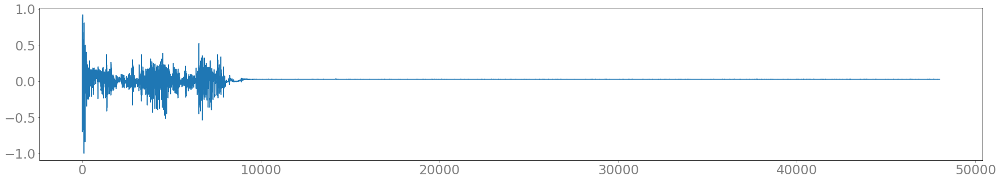

In [232]:
plot(generate_4)

In [233]:
ipd.Audio(generate_4, rate=16000)

##### summary test 4 

- lossが5.1付近で張り付き下がらない。学習していない模様
- 訓練データには不具合はなさそう.wavは正しく聴き取れる.targetとも整合.
- 途中に無音区間があるため？
- シグナルの上限が0.2と低すぎる.-1.0~1.0幅を満たすよう正規化が必要か. collate_fn内でやる.
- 正規化しても大きな変化なし.
- mini batchを適用し同じシグナルを並列で学習し速度を上げる. batch_size6で18 steps/sec.
- lr=1e-3から単純な波形で結果の良かったlr=1e-4に変更.10000iter6batchでloss3.7台まで到達.
- 出力サンプルがそれっぽい波形を構成している.
- 追加で10000iter同じ条件で学習(2).loss2.5前後まで到達.
- 出力サンプルは同様にそれっぱい.生成結果はまだいまいち.
- さらに追加で10000iter同じ条件で学習(3).lossave2.5を切る.生成結果はかなりそれらしい.
- さらに追加で20000iter同じ条件で学習(4).lossave2.2を切る.lr=1e-4で比較的安定的にlossが下がる.生成結果は見かけ上の波形はかなり近いが再生すると雑音.
- 一定レベルの品質の音声を生成するにはloss1.0を切るくらいまで学習が必要と思われる.
- 300_000iter,lr=1e-4,annealing_rate0.95/10000iterで再度実験.(5時間の見積もり).これで品質が悪ければ別のアプローチを検討.
- loss ave 1.90まで4h45mで学習したがまだ下がる余地がある.まだノイズに近いが、学習データと同じ人物が何かを発話しているらしい音声が聞き取れた.波形は極めてそれらしい.
- 推論速度の問題についてはn_channelが大きすぎる可能性もある.
- 次はannealing rateを上げて600_000iterを1日かけて実施してみる.それ以降はWaveRNNの研究に移る.
- 100_0000iterでloss ave 0.68まで下がったが生成された音質はよくない.FFTNetにつはこれで終了する.

##### test 3. multiple frequency sine wave (with f0 condition)

In [143]:
losses, loss_aves = test_train(test_model, test_optimizer, test_dataset, batch_size=3, lr=0.001, n_epoch=5, n_steps=1000, seq_len=5000, disable_cuda=False, is_conditioned=True)

NameError: name 'test_optimizer' is not defined

#### train

In [ ]:
# train settings
BATCH_SIZE = 256
DATA_LOADER_N_WORKERS = 16
DISABLE_CUDA = False
N_CHANNELS = 256
N_EPOCH = 1
LEARNING_RATE = 0.0001
N_STEPS = 60000  # ideally 100000
SEQ_LEN = 5000
MODEL_DIR = '/diskB/6/out/models/fftnet/'

In [ ]:
train_dataset = VoiceDataset()
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE,
                        shuffle=False, collate_fn=train_dataset.collate_fn,
                        drop_last=False, num_workers=DATA_LOADER_N_WORKERS)

In [ ]:
def train(model, optimizer, train_loader, lr, n_epoch, n_steps, seq_len, disable_cuda=False):
    model.train()
    for p in optimizer.param_groups:
        p['lr'] = lr
    criterion = nn.NLLLoss().cuda()
    start = time.time()
    running_loss = 0
    losses = []
    loss_aves = []
    total_iter = 0
    for epoch in range(n_epoch):
        for i, data in enumerate(train_loader):
             
            #print(f'''
            #    {len(data)} items loaded.
            #    ==============================
            #    wav:{data[0]}
            #    f0:{data[1]}
            #    phonemes:{data[2]}
            #    len: {data[3]}
            #    ==============================
            #    ''')
             
            B = data[0].shape[0]
            wav = torch.FloatTensor(data[0][:, :-1]).view(1, -1)
            target = torch.LongTensor(data[0][:, 1:]).view(1, -1)
            f0 = torch.FloatTensor(data[1][:, 1:]).view(1, -1)
            phonemes = torch.FloatTensor(data[2][:, 1:]).view(1, -1)
            wav_len = data[3][0]
           
            # forward with random start positions for n_steps
            for step in tqdm(range(n_steps)):
                rand_pos = np.random.randint(0, wav_len - seq_len)
                x = wav[:, rand_pos:(rand_pos + seq_len)].unsqueeze(1)
                y = target[:, rand_pos:(rand_pos + seq_len)]
                _f0 = f0[:, rand_pos:(rand_pos + seq_len)].unsqueeze(1)
                _phonemes = phonemes[:, rand_pos:(rand_pos + seq_len)].unsqueeze(1)
           
                #print('-'*100)
                #print(f'x {x} {x.shape}')
                #print(f'y {y} {y.shape}')
                #print(f'f0 {_f0} {_f0.shape}')
                #print(f'phonemes {_phonemes} {_phonemes.shape}')
                #print('-'*100)
                
                # sanity check
                assert int(x[0][0][1]) == int(y[0][0])
                assert x.shape[2] == y.shape[1] and y.shape[1] == _f0.shape[2] and _f0.shape[2] == _phonemes.shape[2]
                
                if not disable_cuda:
                    x = x.cuda()
                    y = y.cuda()
                    _f0 = _f0.cuda()
                    _phonemes = _phonemes.cuda()
                    
                optimizer.zero_grad()
                #out = model(x, _f0, _phonemes)
                out = torch.nn.parallel.data_parallel(model, (x, _f0, _phonemes))
                #print(f'out (B, T, C) {out} {out.shape}')
                #print(f'out.transpose(1, 2) (B, C, T, 1) {out.transpose(1, 2)} {out.transpose(1, 2).shape}')
                out = out.transpose(1, 2)
                
                #print('===== calculate losss ====')
                #print(f'y (B, C, T) {y} {y.shape}')
                #print(f'out[:, :, 1:] {out[:, :, 1:]} {out[:, :, 1:].shape}')
                
                loss = criterion(out[:, :, 1:], y)
            
                running_loss += loss.item()
            
                loss.backward()
                optimizer.step()
            
                speed = (step + 1) / (time.time() - start)
                t = time_since(start)
                loss_ave = running_loss / (total_iter + 1)
            
                if step % 1000 == 0:
                    print(f'epoch {epoch} -- seq: {(i+1)*B}/{len(train_loader.dataset)} -- step: {step}/{n_steps} -- loss: {loss_ave:.4f} -- t: {t} -- speed: {speed:.1f} steps/sec')
         
                if step % 100 == 0:
                    losses += [loss.item()]
                    loss_aves += [loss_ave]
            
                total_iter += 1
            
                if total_iter % n_steps == 0:
                    # save train result & model if the score is best.
                    model_key = 'fftnet'
                    comparison_key = 'loss_average'
                    lowest_loss_ave = MLModelDic.best_score(model_key, comparison_key, lowest=True)
                    print('=' * 90)
                    print(f'smallest {comparison_key} in {model_key} is {largest_iter}. now {total_iter}')
                    if (lowest_loss_ave is None) or (lowest_loss_ave and lowest_loss_ave > loss_ave):
                        # save result
                        modeldic = MLModelDic(
                            {
                                'key_name': model_key,
                                'losses': losses,
                                'loss_averages': loss_aves,
                                'loss_average': loss_ave,
                                'iter': total_iter,
                                'settings': {
                                    **{
                                        'lr': lr,
                                        'epoch': epoch,
                                        'iter': i,
                                        'n_steps': n_steps,
                                        'seq_len': seq_len
                                    },
                                    **model.settings()
                                }
                            }).save()
                        # update modeldic with save_model_path
                        modeldic.save_model_path = f'{MODEL_DIR}{model.settings_str()}_lr{lr}_loss{round(loss_ave, 3)}_nsteps{n_steps}_seqlen{seq_len}_iter{total_iter}_index{modeldic.index}'
                        print(f'save model {modeldic.key_name} {modeldic._id} as {modeldic.save_model_path}')
                        modeldic.update()
                        # save model
                        model.save_model(modeldic.save_model_path)
                    else:
                        print('this is not the best score. skip.')
                    print('=' * 90)
    
    
    return losses, loss_aves
    

In [ ]:
model = FFTNet(n_channels=N_CHANNELS, disable_cuda=DISABLE_CUDA)
if not DISABLE_CUDA:
    model.cuda()
print(model)

In [ ]:
optimizer = torch.optim.Adam(model.parameters())

In [ ]:
losses, loss_aves = train(model, optimizer, train_loader, lr=LEARNING_RATE, n_epoch=N_EPOCH, n_steps=N_STEPS, seq_len=SEQ_LEN, disable_cuda=DISABLE_CUDA)

In [ ]:
plot(losses)

In [ ]:
plot(loss_aves)

In [ ]:
model_key = 'fftnet'
comparison_key = 'loss_average'
print('=' * 90)
lowest_loss_ave = MLModelDic.best_score(model_key, comparison_key, lowest=True)
loss_ave = np.average(loss_aves)
lr = LEARNING_RATE
n_epoch = N_EPOCH
i = len(train_loader.dataset)
n_steps = N_STEPS
seq_len = SEQ_LEN
print(f'lowest {comparison_key} in {model_key} is {lowest_loss_ave}. now {loss_ave}')
# save result
modeldic = MLModelDic(
    {
        'key_name': model_key,
        'losses': losses,
        'loss_averages': loss_aves,
        'loss_average': loss_ave,
        'iter': len(losses) * 100,
        'settings': {
            **{
                'lr': lr,
                'epoch': n_epoch,
                'iter': i,
                'n_steps': n_steps,
                'seq_len': seq_len
            },
            **model.settings()
        }
    }).save()
# update modeldic with save_model_path
modeldic.save_model_path = f'{MODEL_DIR}{model.settings_str()}_lr{lr}_loss{round(loss_ave, 3)}_nsteps{n_steps}_seqlen{seq_len}_iter{total_iter}_index{modeldic.index}'
print(f'save model {modeldic.key_name} {modeldic._id} as {modeldic.save_model_path}')
#modeldic.update()
# save model
#model.save_model(modeldic.save_model_path)

#### load model

In [ ]:
disable_cuda = True

# load model
best_model_dic = MLModelDic.best_model('fftnet', key='iter', lowest=False)
#best_model_dic.remove_model()
settings = best_model_dic.settings
model_path = best_model_dic.save_model_path
print('best model settings: ',settings)
print('model path: ',model_path)
print('loss ave: ',best_model_dic.loss_average)
print('_id', best_model_dic._id)
print('created', best_model_dic.created)
model = FFTNet(n_channels=settings['n_channels'], n_depth=settings['n_depth'], n_classes=settings['n_classes'], disable_cuda=disable_cuda)
model.load_model(model_path)
model.eval()  # without droput
if not disable_cuda:
    model.cuda()
else:
    model.cpu()
print(model)

#### generate test

In [ ]:
sample_rate = 16000
duration_ms = 1000
seq_len = int(sample_rate / (duration_ms/1000))
output = model.generate(duration_ms=duration_ms, phonemes=[0]*seq_len, pitches=[300]*seq_len, sample_rate=sample_rate)

In [ ]:
plot(output)